<a href="https://colab.research.google.com/github/shayanAbbasi1995/Non-financial-misconduct-and-Market-reaction/blob/main/Master_project_CAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DATA and LIBs

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Run this if running in Google Collab
# Mount google drive if running from Google Collab
from google.colab import drive
drive.mount('/content/drive')

# Set current directory if running from Google Collab

import os
os.chdir('/content/drive/My Drive/Colab Notebooks/SP500')# here use your path to current notebook

Mounted at /content/drive


In [ ]:
import pandas as pd
# SP500 data
returns = pd.read_excel('./ALL returns.xlsx') # DAtaset was for 2016-2020
lost_return = pd.read_excel('./lost returns.xlsx')
#returns = pd.read_csv('./ALL Return2007-2020.csv')
#returns = pd.read_excel('RET 2009-2020.xlsx')
SPY = pd.read_csv('./INDEXES.csv')
#SPY = pd.read_excel('index 2009-2020.xlsx')

In [ ]:
SPY

,DATE,vwretd,vwretx,ewretd,ewretx,sprtrn,spindx,totval,totcnt,usdval,usdcnt
0,20160104,-0.014893,-0.015055,-0.012338,-0.012423,-0.015304,2012.66,27249876900,7200,27672981100,7199
1,20160105,0.001387,0.001384,0.000358,0.000334,0.002012,2016.71,27289653500,7199,27241303800,7197
2,20160106,-0.013823,-0.014091,-0.013466,-0.013516,-0.013115,1990.26,26905200800,7198,27289640600,7198
3,20160107,-0.023943,-0.023967,-0.024829,-0.024847,-0.023700,1943.09,26259997300,7196,26905110200,7195
4,20160108,-0.010955,-0.010960,-0.010283,-0.010305,-0.010838,1922.03,25969468700,7194,26257073100,7194
...,...,...,...,...,...,...,...,...,...,...,...
1254,20201224,0.002332,0.002197,-0.000277,-0.000458,0.003537,3703.06,49387699400,7515,49278049200,7515
1255,20201228,0.003870,0.003859,0.001350,0.001304,0.008723,3735.36,49579392700,7516,49387699400,7514
1256,20201229,-0.003649,-0.003657,-0.008483,-0.008656,-0.002227,3727.04,49396998600,7522,49576731700,7514
1257,20201230,0.003281,0.003114,0.010155,0.009754,0.001342,3732.04,49551319700,7521,49396695300,7519


In [ ]:
lost_return

,PERMNO,Names Date,Ticker Symbol,Price or Bid/Ask Average,Returns
0,17778,2016-01-04,BRK,196295.000000,-0.007609
1,17778,2016-01-05,BRK,197000.000000,0.003592
2,17778,2016-01-06,BRK,197415.000000,0.002107
3,17778,2016-01-07,BRK,195580.000000,-0.009295
4,17778,2016-01-08,BRK,193900.000000,-0.008590
...,...,...,...,...,...
14244,90199,2020-12-24,CBRE,62.930000,0.002869
14245,90199,2020-12-28,CBRE,62.970001,0.000636
14246,90199,2020-12-29,CBRE,62.110001,-0.013657
14247,90199,2020-12-30,CBRE,62.400002,0.004669


In [ ]:
lost_return.columns = ['','date','TICKER','PRC', 'RET'] 

In [ ]:
returns.isna().sum()

date       1
TICKER     1
PRC       10
RET       10
dtype: int64

In [ ]:
returns 

,date,TICKER,PRC,RET
0,NaT,NaN,NaN,NaN
1,2016-01-04,MSFT,54.80000,-0.012257
2,2016-01-05,MSFT,55.05000,0.004562
3,2016-01-06,MSFT,54.05000,-0.018165
4,2016-01-07,MSFT,52.17000,-0.034783
...,...,...,...,...
423555,2020-12-24,DG,211.28000,0.000521
423556,2020-12-28,DG,210.39000,-0.004212
423557,2020-12-29,DG,211.34000,0.004515
423558,2020-12-30,DG,209.92999,-0.006672


In [ ]:
lost_return = lost_return[['date','TICKER','PRC', 'RET']] 
returns = pd.concat([returns,lost_return], ignore_index=True)
returns

,date,TICKER,PRC,RET
0,NaT,NaN,NaN,NaN
1,2016-01-04,MSFT,54.800000,-0.012257
2,2016-01-05,MSFT,55.050000,0.004562
3,2016-01-06,MSFT,54.050000,-0.018165
4,2016-01-07,MSFT,52.170000,-0.034783
...,...,...,...,...
437804,2020-12-24,CBRE,62.930000,0.00286853
437805,2020-12-28,CBRE,62.970001,0.000635641
437806,2020-12-29,CBRE,62.110001,-0.0136573
437807,2020-12-30,CBRE,62.400002,0.00466915


In [ ]:
index_df = SPY[['DATE', 'vwretx']]
index_df.columns = ['date', 'SPY']
index_df

,date,SPY
0,20160104,-0.015055
1,20160105,0.001384
2,20160106,-0.014091
3,20160107,-0.023967
4,20160108,-0.010960
...,...,...
1254,20201224,0.002197
1255,20201228,0.003859
1256,20201229,-0.003657
1257,20201230,0.003114


In [ ]:
df = pd.DataFrame()
j = 0
for i in returns.groupby('TICKER'):
  j += 1
  if(j==3):
    df['date'] = pd.DataFrame(i[1])['date']
    break
df = pd.DataFrame(df.reset_index()['date'])

for i in returns.groupby('TICKER'):
  temp_df = pd.DataFrame(i[1])[['date', 'RET']]
  temp_df.columns = ['date', i[0]]
  temp_df = temp_df.reset_index()[['date', i[0]]]
  df[i[0]] = temp_df[i[0]]
df['SPY'] = np.nan
i = len(index_df['SPY'])
df['SPY'][-i::] = index_df['SPY'][-i::]

df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,date,AA,AAL,AAP,ABBV,ABC,ABT,ADM,ADP,AEE,AEP,AFL,AIG,AIZ,AJG,ALB,ALK,ALL,ALXN,AME,AMGN,AMP,AMZN,ANTM,AOS,APA,APD,ARNC,ATVI,AVB,AVGO,AVY,AWK,AXP,AYI,AZO,BA,BAC,BAX,BBT,...,UA,UAA,UAL,UHS,ULTA,UNH,UNM,UNP,UPS,URI,USB,UTX,V,VLO,VMC,VZ,WAB,WABC,WBA,WDC,WEC,WFC,WHR,WM,WMB,WMIH,WMT,WR,WRK,WU,WY,WYNN,XEC,XEL,XOM,XYL,YUM,ZBH,ZION,SPY
0,2016-01-04,-0.016211,-0.034002,0.011494,-0.027515,-0.017742,-0.044088,-0.022901,-0.03128,-0.004626,0.00103,-0.01202,-0.024851,-0.025081,-0.018075,-0.008213,-0.026208,-0.02287,-0.031822,-0.017541,-0.02458,-0.020391,-0.057554,-0.001649,-0.018666,-0.0009,-0.007071,-0.121634,-0.028158,-0.01852,-0.019773,-0.0233,0.00954,-0.028181,-0.002524,-0.008667,-0.028287,-0.023767,-0.025688,-0.03068,...,C,0.042986,-0.029494,-0.013139,-0.017243,-0.010031,-0.016221,0.009847,-0.014445,-0.024538,-0.027888,-0.005205,-0.023856,-0.01089,-0.026851,-0.007573,-0.013498,-0.032086,-0.02472,0.005829,0.000195,-0.026674,0.008307,-0.017238,0.021012,-0.003861,0.00261,-0.000943,-0.002192,-0.016192,-0.005003,-0.00607,0.006937,-0.005848,-0.006286,-0.011507,-0.011499,-0.007603,-0.021612,-0.015055
1,2016-01-05,-0.045314,-0.009533,-0.006831,-0.004166,0.014626,-0.000233,0.011161,0.002437,0.011852,0.008229,-0.001352,0.003475,0.016684,0.002736,-0.015302,-0.016709,-0.002308,0.001191,-0.005128,-0.001074,-0.003933,-0.005024,0.014582,-0.005587,-0.020257,-0.017881,-0.051797,-0.012759,0.023019,-0.033455,0.00768,-0.002818,-0.015387,0.012692,0.004596,0.004057,0,0.004036,0.000273,...,-0.058155,0.020762,-0.00989,0.004325,0.00473,0.001889,-0.005191,-0.009624,0.009911,-0.010034,0.004822,0.00157,0.00753,0.017444,0.001407,0.013734,-0.017531,0.000663,-0.026249,-0.004305,0.010717,-0.000378,-0.021541,0.003813,0.00343,-0.034884,0.023755,0.006372,-0.000659,-0.003973,0.002347,0.018904,0.006444,0.010084,0.008521,-0.000277,-0.002493,0.020823,-0.010857,0.001384
2,2016-01-06,-0.071197,0.017522,-0.026455,0.000174,-0.015286,-0.008388,-0.024283,-0.012277,0.006431,0.003741,-0.015228,-0.014677,-0.013153,-0.01935,-0.043693,0.014399,-0.011234,-0.004489,-0.022719,-0.009167,-0.033995,-0.001799,-0.024427,-0.019797,-0.114863,-0.024354,-0.025084,-0.009424,-0.007464,-0.030759,-0.011675,-0.004323,-0.027648,-0.026379,-0.013074,-0.015879,-0.021303,0.002412,-0.013912,...,0.004583,0.001518,0.002543,-0.023052,0.002956,-0.010199,-0.027317,-0.043217,-0.014199,-0.047823,-0.015115,-0.027163,-0.013111,-0.007026,-0.023231,-0.008925,-0.034963,-0.009496,-0.015333,-0.022281,-0.002699,-0.019096,-0.025535,0.012346,-0.13027,-0.012048,0.010013,0.002345,-0.027698,-0.022792,-0.022074,-0.051805,-0.061161,0.010538,-0.008321,-0.012476,-0.00708,0.00433,-0.029145,-0.014091
3,2016-01-07,-0.039489,-0.018918,0.011073,-0.002963,-0.031932,-0.023966,-0.023756,-0.030519,0.000685,-0.01152,-0.01701,-0.023933,-0.022468,-0.020744,-0.045116,-0.053836,-0.023559,-0.052697,-0.023637,-0.023864,-0.031702,-0.039058,-0.017128,-0.048854,-0.051389,-0.033525,0.010863,-0.014134,-0.004578,-0.03181,-0.030025,-0.007514,-0.009003,-0.026529,0.00927,-0.041922,-0.03607,-0.016573,-0.028492,...,0.003601,-0.022128,-0.046558,-0.0242,-0.001255,-0.02944,-0.027769,-0.023386,-0.019276,-0.065067,-0.019001,-0.013101,-0.019662,0.020238,-0.02323,-0.005492,-0.033373,-0.00981,0.019339,-0.016497,-0.000193,-0.028527,-0.025142,-0.01182,-0.1,-0.00813,0.023289,-0.011699,-0.009948,-0.005831,-0.036936,-0.09407,-0.037394,0.003842,-0.016006,-0.025828,-0.034116,-0.022993,-0.03002,-0.023967
4,2016-01-08,-0.024184,-0.001978,-0.021971,-0.027268,-0.005785,-0.020944,-0.003766,-0.008251,-0.007754,-0.001542,-0.00874,-0.014918,-0.012206,-0.010592,-0.018819,-0.04879,-0.003593,-0.035786,-0.018207,-0.014871,-0.022547,-0.001464,-0.024367,-0.035581,0.002736,-0.005182,-0.019231,-0.01544,-0.017738,-0.006587,0.009641,0.003869,-0.003289,-0.037348,-0.032475,-0.022705,-0.019355,-0.016037,-0.02164,...,0.010287,0.00031,-0.01406,-0.004606,-0.004427,-0.017218,-0.012658,0.010673,-0.013067,-0.00882,-0.014154,-0.016322,-0.012332,-0.053128,-0.023216,-0.009719,-0.017729,-0.021392,-0.001

In [ ]:
df.LHX.isna().sum()

497

In [ ]:
len(df.columns)

352

In [ ]:
type(df.date[0])

pandas._libs.tslibs.timestamps.Timestamp

In [ ]:
#for i in range(len(df.date)):
#  df.date.iloc[i] = pd.Timestamp(df.date.iloc[i])

#type(df.date[0])

In [ ]:
#df.to_csv('returns.csv', index=False) 

In [ ]:
df.AAL.isnull().value_counts()

False    1259
Name: AAL, dtype: int64

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
SAMPLE_TYPE = 'ALL' #OWEN
if SAMPLE_TYPE == 'OWEN':
  events = pd.read_csv('./event sample.csv')
  events.columns = ['ticker', 'market', 'date']
  events["date"] = pd.to_datetime(events["date"]).dt.date
  mask = events.ticker == 'BRK.B'
  events.loc[mask, 'ticker'] = 'BRK'
  events
if SAMPLE_TYPE == 'ALL':
  events = pd.read_excel('./Sample_All.xlsx')
  All_sample = events.copy()
  events = events[['stock_ticker','date', 'industry',  'major_industry', 'govt_level', 'primary_offense', 'secondary_offense', 'offense_group', 'civil_criminal', 'penalty', 'agency_code1']]
  events.columns = ['ticker','date', 'industry',  'major_industry', 'govt_level', 'primary_offense', 'secondary_offense', 'offense_group', 'civil_criminal', 'penalty', 'agency_code1']
  mask = events.ticker == 'BRK.B'
  events.loc[mask, 'ticker'] = 'BRK'

In [ ]:
events.columns

Index(['ticker', 'date', 'industry', 'major_industry', 'govt_level',
       'primary_offense', 'secondary_offense', 'offense_group',
       'civil_criminal', 'penalty', 'agency_code1'],
      dtype='object')

In [ ]:
events.agency_code1.value_counts()

OSHA             1440
FMCSA            1072
FRA              1037
WHD               605
EPA               271
INS               227
CMS               222
AG                214
MSHA              204
MHC               123
FAA               121
NLRB              110
EEOC               74
OFCCP              57
USAO               53
FIN                35
EBSA               30
DBO                27
DFS                23
FCC                23
BSEE               22
MULTI              21
DOJ_CIVIL          20
FTC                14
SEC                14
ACPD               11
PHMSA              11
CFPB                9
DLI                 9
HHSOIG              9
FERC                7
DOJ_CRIMINAL        6
CFTC                6
BIS                 6
HHSOCR              5
DOJ_RIGHTS          4
HUD                 4
DEA                 4
ED                  3
DOJ_ANTITRUST       3
OFR                 3
NRC                 2
BKG                 2
AMS                 2
DBI                 2
LCO       

In [ ]:
ticker_lst = events.ticker.value_counts().head(45).index
ticker_lst

Index(['BRK', 'KMI', 'UNP', 'DLTR', 'BAC', 'CSX', 'WFC', 'JNJ', 'WMT', 'GE',
       'JPM', 'VZ', 'MMM', 'NSC', 'PSX', 'CI', 'HD', 'DG', 'XOM', 'KR', 'UPS',
       'AMZN', 'FCX', 'IP', 'AAL', 'ANTM', 'CVS', 'UNH', 'D', 'C', 'ABT',
       'DAL', 'TSN', 'CMCSA', 'MLM', 'GM', 'FDX', 'LHX', 'MPC', 'NUE', 'PGR',
       'WBA', 'TGT', 'PFE', 'COP'],
      dtype='object')

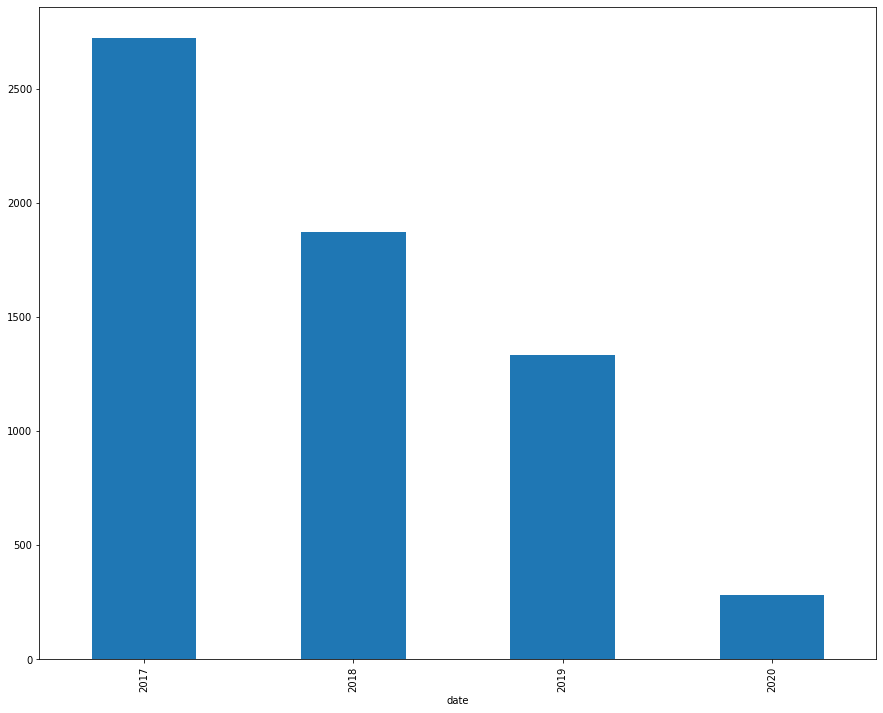

In [ ]:
plt.figure(figsize=(15,12))
events.date.groupby(events.date.dt.year).count().plot(kind="bar")

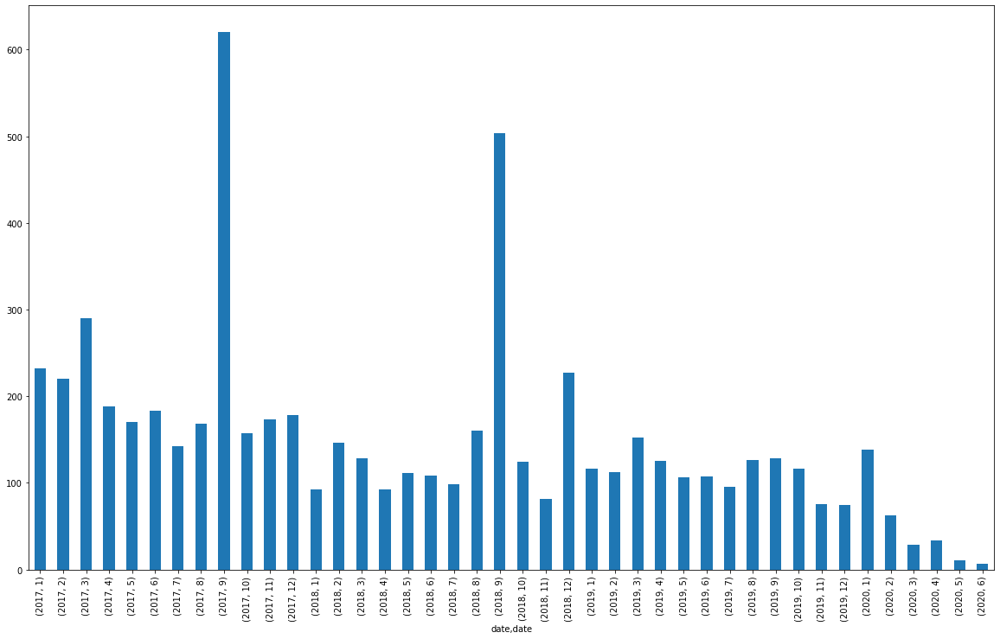

In [ ]:
plt.figure(figsize=(20,12))
events.date.groupby([events.date.dt.year, events.date.dt.month]).count().plot(kind="bar")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  This is separate from the ipykernel package so we can avoid doing imports until


29.566666666666666


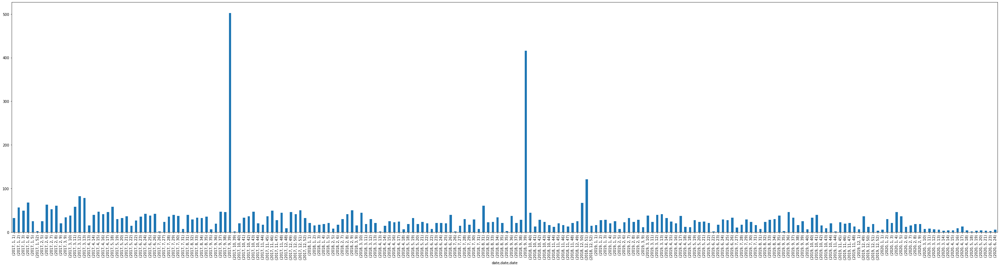

In [ ]:
plt.figure(figsize=(50,12))
events.date.groupby([events.date.dt.year, events.date.dt.month, events.date.dt.week]).count().plot(kind="bar")
print(events.date.groupby([events.date.dt.year, events.date.dt.month, events.date.dt.week]).count().mean())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  This is separate from the ipykernel package so we can avoid doing imports until


6.522058823529412


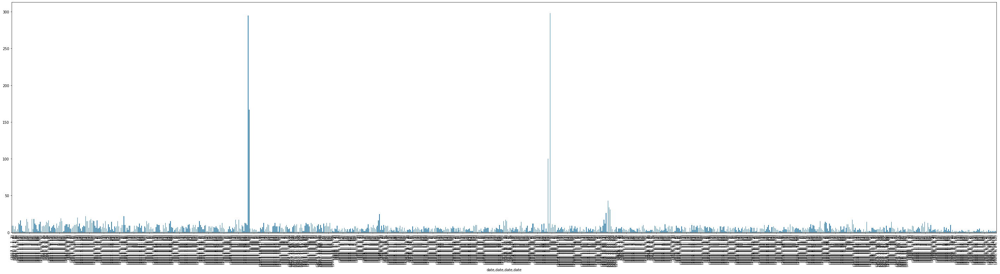

In [ ]:
plt.figure(figsize=(50,12))
events.date.groupby([events.date.dt.year, events.date.dt.month, events.date.dt.week, events.date.dt.day]).count().plot(kind="bar")
print(events.date.groupby([events.date.dt.year, events.date.dt.month, events.date.dt.week, events.date.dt.day]).count().mean())

#Market Model Abnormal Return

1. To get the $\alpha$ and the $\beta$ we need, we have to regress $R_{it} \space = \alpha_i + \beta_i . R_{Mt} + \epsilon_i $ from the estimation window.

2. Calculating Abnormal returns for the Event window: $AR_{it} = R_{it} - (\alpha_i + \beta_i . R_{Mt})$

3. Calculate $CAR_i(t_1,t_2) = \sum_{t=t_1}^{t_2} AR_{it}$

##Main Functions 

In [ ]:
import statsmodels.api as sm
import re
def get_estwin_returns(df, ev_date, ticker, es_win_len, lower_ev_win, gap=0): 
  '''
  ev_date is in '20170105' format.
  ticker is string not obj.
  lower_ev_win is already a negative value pointing to the negative lower bound of event window
  '''
  post_ev_df = df[['date', ticker]][df.date < pd.Timestamp(ev_date)]
  if gap != 0:
    es_win_df = post_ev_df[['date', ticker]].iloc[-es_win_len+lower_ev_win-gap:-gap+lower_ev_win:]
  if gap ==0:
    es_win_df = post_ev_df[['date', ticker]].iloc[-es_win_len+lower_ev_win:lower_ev_win:]
  return es_win_df #returns df of date and return for the specific return

def est_ols_params(X,Y):
  #add column of 1 to X for constant coefficient
  X = sm.add_constant(X)
  model = sm.OLS(Y, X)
  result = model.fit()
  #OLS model
  alpha = result.params[0]
  beta = result.params[1]
  return alpha, beta

def find_bound_dates(df, ev_date, ticker, ev_win_upper, ev_win_lower):
  up_bound = timestamp_convert(str(df.date[df.index[df.date == ev_date][0]+ev_win_upper+1])).split(' ')[0]
  low_bound = timestamp_convert(str(df.date[df.index[df.date == ev_date][0]+ev_win_lower-1])).split(' ')[0] #ev_win_lower is already a negative value
  post_upper_ev_df = df[['date', ticker]].query(f'date < {up_bound}')
  ev_win_df = post_upper_ev_df.query(f'date > {low_bound}')
  return ev_win_df
  
def get_evwin_returns(df, ev_date, ticker, ev_win_upper, ev_win_lower):
  '''
  ev_win_upper, ev_win_lower are in '20170105' format.
  ticker is string not obj like 'AA'.
  '''
  if pd.Timestamp(ev_date) in df['date'].values:
    ev_win_df = find_bound_dates(df, ev_date, ticker, ev_win_upper, ev_win_lower)
  else:
    temp_ev_date = timestamp_convert(str(pd.Timestamp(ev_date)+pd.to_timedelta(1,'d')).split(' ')[0])
    while pd.Timestamp(temp_ev_date) not in df['date'].values:
      temp_ev_date = str(pd.Timestamp(temp_ev_date)+pd.to_timedelta(1,'d')).split(' ')[0]
    ev_win_df = find_bound_dates(df, temp_ev_date, ticker, ev_win_upper, ev_win_lower)
  return ev_win_df

def timestamp_convert(date):
  date = re.sub('-', '', date)
  return date

def check_win_NaN(series):
  if series.isnull().sum()>0:
    print(f'For ticker {series.name} we have {series.isnull().sum()} NaN values \
    in the window')
    return 0 #False
  else:
    return 1 #True

def cal_AR(R, Rm, alpha, beta, model='market_model'):
  if model == 'market_model':
    ER = alpha + beta*Rm
  return np.array(R - ER)

def cal_car(AR):
  ev_car = AR.cumsum()
  print(f'AR.shape[1] is {AR.shape[1]}')
  ev_car["CAAR"] = (1/AR.shape[1])*(ev_car.sum(axis=1)) #Adds CAAR to CAR matrix
  return ev_car


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
def AR_vec(returns, events, es_win, ev_win, minNA=100, gap_=0):
  '''
  es_win is int like 252 and ev_win is list like [-5,10]
  '''
  AR = pd.DataFrame()
  AR['period'] = np.arange(ev_win[0], ev_win[1]+1)
  for ticker, ev_date in zip(events.ticker, events.date):
    ev_date = str(ev_date)
    X = np.array(get_estwin_returns(returns, timestamp_convert(ev_date), ticker, es_win,ev_win[0], gap=gap_)[ticker], dtype=float)
    Y = np.array(get_estwin_returns(returns, timestamp_convert(ev_date), 'SPY', es_win,ev_win[0], gap=gap_)['SPY'], dtype=float)
    try:
      if check_win_NaN(pd.Series(X)) and check_win_NaN(pd.Series(Y)):
        alpha, beta = est_ols_params(X,Y)
        #print((alpha, beta))
        ev_X = get_evwin_returns(returns, ev_date, ticker, ev_win[1], ev_win[0])[ticker]
        ev_Y = get_evwin_returns(returns, ev_date, 'SPY', ev_win[1], ev_win[0])['SPY']
        #print((ev_X, ev_Y))
        if ticker not in AR.columns:
          AR[ticker] = cal_AR(ev_X, ev_Y, alpha, beta)
        else:
          if f'{ticker}_{ev_date[0:10]}' not in AR.columns:
            AR[f'{ticker}_{ev_date[0:10]}'] = cal_AR(ev_X, ev_Y, alpha, beta)
          else:
            for m in range(2,100):
              if f'{ticker}_{ev_date[0:10]}_{m}' not in AR.columns:
                #print(f'{ticker}_{ev_date[0:10]}_{m}')
                AR[f'{ticker}_{ev_date[0:10]}_{m}'] = cal_AR(ev_X, ev_Y, alpha, beta)
                break
      else:
        if pd.Series(X).isnull().sum > minNA and pd.Series(Y).isnull().sum > minNA:
          X = np.array(pd.Series(X)[pd.Series(X).notna()])
          Y = np.array(pd.Series(Y)[pd.Series(X).notna()])
          alpha, beta = est_ols_params(X,Y)
          #print((alpha, beta))
          ev_X = get_evwin_returns(returns, ev_date, ticker, ev_win[1], ev_win[0])[ticker]
          ev_Y = get_evwin_returns(returns, ev_date, 'SPY', ev_win[1], ev_win[0])['SPY']
          #print((ev_X, ev_Y))
          if ticker not in AR.columns:
            AR[ticker] = cal_AR(ev_X, ev_Y, alpha, beta)
          else:
            if f'{ticker}_{ev_date[0:10]}' not in AR.columns:
              AR[f'{ticker}_{ev_date[0:10]}'] = cal_AR(ev_X, ev_Y, alpha, beta)
            else:
              for m in range(2,100):
                if f'{ticker}_{ev_date[0:10]}_{m}' not in AR.columns:
                  #print(f'{ticker}_{ev_date[0:10]}_{m}')
                  AR[f'{ticker}_{ev_date[0:10]}_{m}'] = cal_AR(ev_X, ev_Y, alpha, beta)
                  break
    except:
      print(f'Something is wrong with {ticker} in {ev_date}')
  AR.index = AR.period
  AR = AR.drop(columns=['period'])
  return AR
    

In [ ]:
def Feature_index_plots(ev_car):
  for i in ev_car.columns:
    plt.plot(ev_car.index, ev_car[i])
    plt.title(f'CAR for ticker {i}')
    plt.show()
def col_plot(df, col_name, cat, sub):
  plt.plot(df.index, df[col_name])
  plt.title(f'{col_name} Plot for {cat} subcategory {sub}')
  plt.show()
def model_output(AR, cat, sub, plot_all=True):
  print(f'We found AR for {AR.shape[1]} events')
  ev_car = cal_car(AR)
  if plot_all==True:
    Feature_indexe_plots(ev_car)
  if plot_all==False:
    col_plot(ev_car, 'CAAR',cat, sub)
  if plot_all=='no plot':
    pass
  return ev_car


In [ ]:
events.shape

(6209, 11)

In [ ]:
if SAMPLE_TYPE == 'ALL':
  Major_industry_group = ['retailing', 'financial services', 'railroads', 'oil and gas',
        'healthcare services', 'pipelines', 'pharmaceuticals',
        'telecommunications', 'diversified', 'utilities and power generation',
        'miscellaneous manufacturing', 'airlines', 'food products',
        'aerospace and military contracting', 'freight and logistics',
        'paper and packaging', 'wholesalers', 'mining and minerals',
        'chemicals', 'construction and engineering', 'building materials',
        'waste management and environmental services', 'motor vehicles',
        'industrial equipment', 'metals', 'information technology',
        'housewares and home furnishings'] #Some categories have less than 30 events and we omitted them.

  off_group = ['safety-related offenses', 'employment-related offenses',
        'consumer-protection-related offenses', 'environment-related offenses',
        'government-contracting-related offenses',
        'competition-related offenses', 'healthcare-related offenses'] #'miscellaneous offenses' has only 5 events so we omitted it, others have > 30

  gov_level_group = ['federal', 'state', 'local'] #local had 25 events but we put it anyway.

  primary_offence_group = ['workplace safety or health violation',
        'motor vehicle safety violation', 'wage and hour violation',
        'railroad safety violation', 'insurance violation',
        'environmental violation', 'nursing home violation',
        'employment discrimination', 'consumer protection violation',
        'aviation safety violation', 'labor relations violation',
        'False Claims Act and related', 'benefit plan administrator violation',
        'Family and Medical Leave Act']

  secondary_offence_group = ['Fair Labor Standards Act', 'overtime violation', 'mining violation',
        'misclassification', 'other pay violation', 'meal/rest break violation',
        'off-the-clock work', 'Service Contract Act', 'racial discrimination',
        'child labor or youth employment violation',
        'Davis-Bacon Act and related', 'antiboycott violation']

  agency_group = ['OSHA', 'FMCSA', 'FRA', 'WHD', 'EPA', 'CMS', 'INS', 'AG', 'MSHA', 'MHC',
       'FAA', 'NLRB', 'EEOC', 'OFCCP', 'USAO', 'FIN', 'EBSA']

  penalty_group = ['[1000,6000]', '[20000, 31000]', '[44000,60000]', '[71000, 87000]']

##Tests

In [ ]:
from scipy.stats import t

def multiple_day_ttest(AR):
  CAR = AR.cumsum()
  ARR = (1/AR.shape[1])*(AR.sum(axis=1))
  CAAR = ARR.cumsum()
  sd_car =  AR.std(axis=1)  #sigma of AR used to make SCAR
  SCAR = CAR/sd_car
  
  sig = (((CAR.sub(CAAR, axis=0)).pow(2)).sum(axis=1)/(CAR.shape[1]-1)).pow(1./2)
  t_stat = (CAAR/sig)*pow(AR.shape[1], 1/2)

  p_value = pd.Series([t.sf(np.abs(t_stat.iloc[i]), AR.shape[1]-1)*2 for i in range(len(t_stat))])
  p_value.index = np.arange(-20, 21)  #Should be change in every event window change
  df = pd.concat([ARR, CAAR, sig, t_stat, p_value], ignore_index=True, axis=1)
  df.columns = ['ARR', 'CAAR', 'sd', 't_stat', 'p_value']
  return df
  #export df as xlsx (Period, AAR, CAR, t-test)

#crude_dependence_adj_test(AR)
#patell_test(AR)
#zBPM_test(AR)
#cowan_sign_test(AR)
#corrado_rank_test(AR)

##Output Function

In [ ]:
import seaborn as sns

def Diverging_plot(CAAR_t, CAAR_period, group): #CAAR here is actually CAR and not CAAR
  #melting to fit the plot input
  CAAR_t = CAAR_t.melt(value_vars=CAAR_t.columns)
  CAAR_t.columns = ['group', 'CAR']
  # Draw Plot
  plt.figure(figsize=(13,10), dpi= 80)
  ax = sns.boxplot(x=CAAR_t['group'], y=CAAR_t['CAR'], data=CAAR_t, notch=False)
  ax.axhline(np.median(np.array(CAAR_t['CAR'])), ls='--')
  plt.setp(ax.get_xticklabels(), rotation=90)
  # Decoration
  plt.title(f'Box Plot of CARs for {group}', fontsize=22)
  plt.show()

def CAAR_by_category(df, events, cat, cat_name, cat_members, es_win_, ev_win_, CAAR_period, plot_type=False, gap=0):
  CAAR_t = pd.DataFrame(index=range(0,5000))
  for i in cat_members:
    if cat_members[0] == '[1000,6000]':
      j = eval(i)
      mask1 = events[cat] > j[0] 
      mask2 = events[cat] < j[1]
      AR = AR_vec(df, events[mask1][mask2], es_win_, ev_win_, gap_=gap)
    else:
      AR = AR_vec(df, events[events[cat] == i], es_win_, ev_win_, gap_=gap)
    print(f'CAR FOR {cat_name} GROUP {i}')
    CAR = model_output(AR, cat, i, plot_all=plot_type) #False means only plotting CAAR
    CAAR_t[i] = np.nan
    for j in range(len(pd.Series(CAR.iloc[CAAR_period]))):
      #print((i,j))
      #print(CAAR_t[i].iloc[j])
      #print(pd.Series(CAR.iloc[CAAR_period]).iloc[j])
      CAAR_t[i].iloc[j] = pd.Series(CAR.iloc[CAAR_period]).iloc[j]
    #Doing tests
    print(multiple_day_ttest(AR))
    #crude_dependence_adj_test(AR)
    #patell_test(AR)
    #zBPM_test(AR)
    #cowan_sign_test(AR)
    #corrado_rank_test(AR)

  Diverging_plot(CAAR_t, CAAR_period, cat)
  return CAAR_t

#Results [-20,20]

In [ ]:
es_win = 200
ev_win = [-20,20]
end_time = 20

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Offence Groups GROUP safety-related offenses
We found AR for 3813 events
AR.shape[1] is 3813


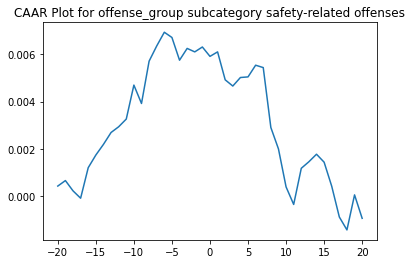

          ARR      CAAR        sd    t_stat       p_value
-20  0.000430  0.000430  0.013062  2.032314  4.219102e-02
-19  0.000232  0.000662  0.018576  2.200662  2.781969e-02
-18 -0.000434  0.000228  0.022721  0.619985  5.353049e-01
-17 -0.000311 -0.000083  0.026843 -0.190871  8.486370e-01
-16  0.001289  0.001206  0.029655  2.511965  1.204711e-02
-15  0.000534  0.001740  0.033697  3.188437  1.442018e-03
-14  0.000450  0.002190  0.036686  3.685884  2.310805e-04
-13  0.000502  0.002692  0.038820  4.281845  1.899148e-05
-12  0.000242  0.002934  0.040325  4.492553  7.246065e-06
-11  0.000326  0.003259  0.042403  4.746602  2.144577e-06
-10  0.001434  0.004693  0.044816  6.466465  1.130269e-10
-9  -0.000776  0.003917  0.046581  5.192549  2.182723e-07
-8   0.001786  0.005703  0.049855  7.063661  1.918980e-12
-7   0.000642  0.006345  0.052795  7.421221  1.423265e-13
-6   0.000580  0.006925  0.055101  7.760209  1.081276e-14
-5  -0.000221  0.006704  0.057266  7.228457  5.873045e-13
-4  -0.000959 

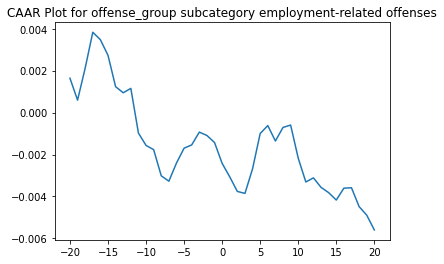

          ARR      CAAR        sd    t_stat   p_value
-20  0.001639  0.001639  0.013846  3.876580  0.000112
-19 -0.001044  0.000595  0.020622  0.944814  0.344967
-18  0.001526  0.002121  0.024928  2.787250  0.005410
-17  0.001711  0.003832  0.028635  4.383919  0.000013
-16 -0.000357  0.003475  0.035407  3.214777  0.001344
-15 -0.000745  0.002730  0.038565  2.319061  0.020579
-14 -0.001494  0.001236  0.041580  0.973798  0.330376
-13 -0.000290  0.000946  0.044302  0.699761  0.484229
-12  0.000208  0.001154  0.046461  0.813779  0.415952
-11 -0.002132 -0.000978  0.049433 -0.647918  0.517177
-10 -0.000588 -0.001566  0.050599 -1.013731  0.310940
-9  -0.000203 -0.001769  0.052446 -1.105117  0.269357
-8  -0.001248 -0.003017  0.052014 -1.900062  0.057693
-7  -0.000255 -0.003272  0.053273 -2.011927  0.044477
-6   0.000866 -0.002406  0.055487 -1.420403  0.155781
-5   0.000708 -0.001698  0.058674 -0.948092  0.343296
-4   0.000157 -0.001542  0.059988 -0.841848  0.400061
-3   0.000609 -0.000932  0.0

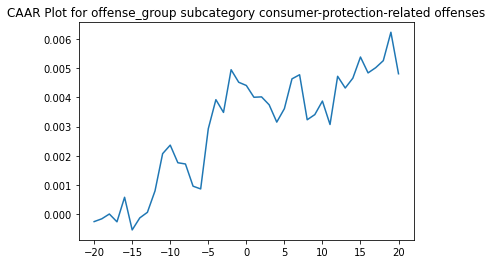

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000257 -0.000257  0.018673 -0.334826  0.737875
-19  0.000096 -0.000162  0.022872 -0.171789  0.863663
-18  0.000165  0.000003  0.027548  0.003031  0.997583
-17 -0.000268 -0.000264  0.032386 -0.198507  0.842717
-16  0.000842  0.000577  0.035181  0.398899  0.690112
-15 -0.001119 -0.000542  0.039744 -0.331551  0.740346
-14  0.000413 -0.000129  0.042509 -0.074004  0.941032
-13  0.000191  0.000062  0.044011  0.033993  0.972895
-12  0.000735  0.000797  0.045742  0.423393  0.672163
-11  0.001276  0.002073  0.048294  1.043456  0.297165
-10  0.000293  0.002366  0.050821  1.131678  0.258230
-9  -0.000604  0.001762  0.052436  0.816700  0.414429
-8  -0.000043  0.001719  0.054625  0.765009  0.444572
-7  -0.000762  0.000957  0.056575  0.411420  0.680914
-6  -0.000094  0.000864  0.062358  0.336664  0.736490
-5   0.002063  0.002926  0.060760  1.170795  0.242154
-4   0.000998  0.003924  0.064759  1.473185  0.141235
-3  -0.000437  0.003487  0.0

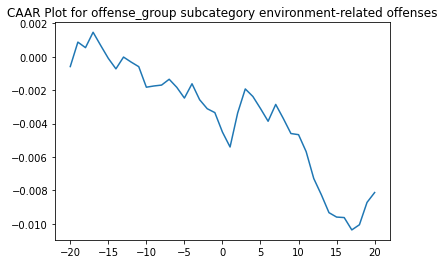

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000584 -0.000584  0.012078 -0.880997  0.378959
-19  0.001464  0.000880  0.018864  0.850435  0.395698
-18 -0.000331  0.000549  0.022838  0.438121  0.661584
-17  0.000923  0.001472  0.025781  1.040420  0.298904
-16 -0.000793  0.000679  0.027457  0.450819  0.652416
-15 -0.000772 -0.000092  0.034045 -0.049331  0.960686
-14 -0.000629 -0.000721  0.036666 -0.358396  0.720275
-13  0.000707 -0.000015  0.038656 -0.006881  0.994514
-12 -0.000300 -0.000315  0.041562 -0.138071  0.890268
-11 -0.000121 -0.000436  0.044124 -0.179938  0.857312
-10 -0.001230 -0.001666  0.047247 -0.642571  0.520948
-9  -0.000080 -0.001747  0.049626 -0.641311  0.521765
-8   0.000053 -0.001693  0.053093 -0.581157  0.561530
-7   0.000349 -0.001345  0.054750 -0.447461  0.654835
-6  -0.000238 -0.001582  0.054402 -0.529870  0.596558
-5  -0.000643 -0.002225  0.053985 -0.750950  0.453216
-4   0.000857 -0.001368  0.052974 -0.470410  0.638372
-3  -0.000956 -0.002323  0.0

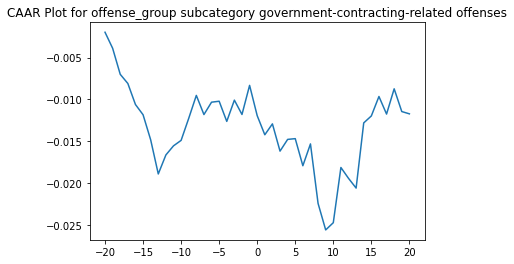

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001963 -0.001963  0.015984 -1.012720  0.314837
-19 -0.001914 -0.003877  0.023709 -1.348326  0.182094
-18 -0.003117 -0.006994  0.029056 -1.984792  0.051264
-17 -0.001094 -0.008088  0.025724 -2.592659  0.011683
-16 -0.002514 -0.010602  0.033653 -2.597952  0.011520
-15 -0.001222 -0.011825  0.036907 -2.642022  0.010249
-14 -0.002999 -0.014824  0.045326 -2.696887  0.008844
-13 -0.004081 -0.018905  0.056643 -2.752160  0.007610
-12  0.002274 -0.016631  0.058296 -2.352473  0.021595
-11  0.001087 -0.015543  0.063945 -2.004447  0.049066
-10  0.000654 -0.014889  0.064700 -1.897683  0.062048
-9   0.002633 -0.012256  0.062997 -1.604319  0.113348
-8   0.002742 -0.009514  0.062412 -1.257086  0.213087
-7  -0.002288 -0.011803  0.065031 -1.496614  0.139190
-6   0.001479 -0.010323  0.082016 -1.037965  0.303018
-5   0.000114 -0.010210  0.080173 -1.050141  0.297426
-4  -0.002411 -0.012620  0.087903 -1.183929  0.240625
-3   0.002541 -0.010080  0.0

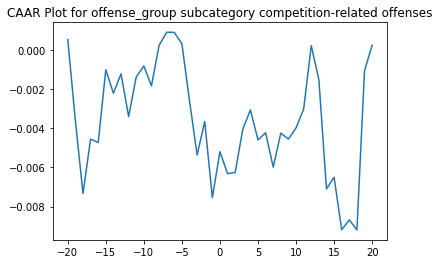

          ARR      CAAR        sd    t_stat   p_value
-20  0.000544  0.000544  0.016188  0.253595  0.800737
-19 -0.004152 -0.003608  0.027466 -0.991722  0.325599
-18 -0.003724 -0.007332  0.043428 -1.274661  0.207693
-17  0.002781 -0.004551  0.039424 -0.871479  0.387214
-16 -0.000174 -0.004725  0.038070 -0.936975  0.352795
-15  0.003724 -0.001001  0.039563 -0.191027  0.849195
-14 -0.001201 -0.002202  0.046108 -0.360516  0.719817
-13  0.000996 -0.001206  0.049154 -0.185268  0.853688
-12 -0.002185 -0.003391  0.052488 -0.487725  0.627649
-11  0.002031 -0.001359  0.053317 -0.192510  0.848039
-10  0.000552 -0.000808  0.055186 -0.110492  0.912414
-9  -0.001018 -0.001825  0.062748 -0.219628  0.826960
-8   0.002077  0.000252  0.061611  0.030835  0.975511
-7   0.000669  0.000921  0.068203  0.101942  0.919167
-6  -0.000005  0.000916  0.075000  0.092214  0.926857
-5  -0.000589  0.000327  0.071460  0.034600  0.972522
-4  -0.002913 -0.002586  0.072221 -0.270323  0.787905
-3  -0.002771 -0.005357  0.0

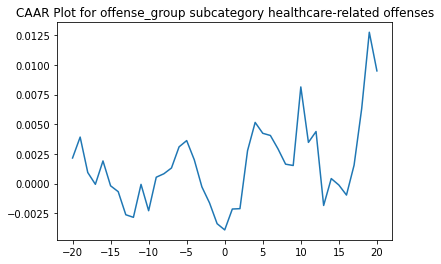

          ARR      CAAR        sd    t_stat   p_value
-20  0.002158  0.002158  0.019868  0.760381  0.450746
-19  0.001765  0.003923  0.022421  1.224701  0.226665
-18 -0.002988  0.000935  0.027835  0.235121  0.815115
-17 -0.000995 -0.000060  0.036540 -0.011482  0.990886
-16  0.001972  0.001912  0.040576  0.329801  0.742986
-15 -0.002098 -0.000186  0.037676 -0.034558  0.972576
-14 -0.000493 -0.000679  0.040034 -0.118762  0.905960
-13 -0.001948 -0.002628  0.044298 -0.415215  0.679835
-12 -0.000216 -0.002844  0.048028 -0.414475  0.680373
-11  0.002778 -0.000065  0.051182 -0.008954  0.992893
-10 -0.002221 -0.002287  0.053999 -0.296447  0.768167
-9   0.002825  0.000538  0.054615  0.068937  0.945326
-8   0.000291  0.000829  0.053259  0.108946  0.913700
-7   0.000487  0.001316  0.055194  0.166839  0.868198
-6   0.001782  0.003097  0.059086  0.366907  0.715301
-5   0.000530  0.003627  0.061286  0.414263  0.680527
-4  -0.001621  0.002006  0.066053  0.212537  0.832588
-3  -0.002283 -0.000278  0.0

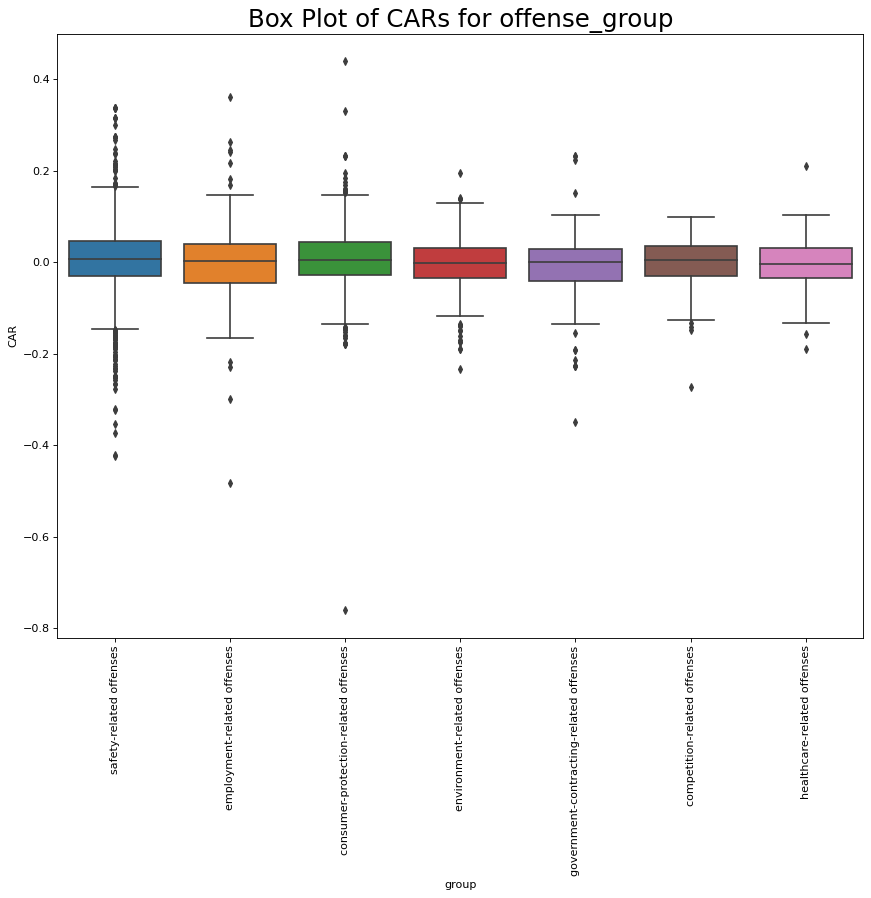

In [ ]:
a = CAAR_by_category(df, events, 'offense_group',\
                     cat_name='Different Offence Groups', cat_members=off_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different Groups of Industries GROUP retailing
We found AR for 983 events
AR.shape[1] is 983


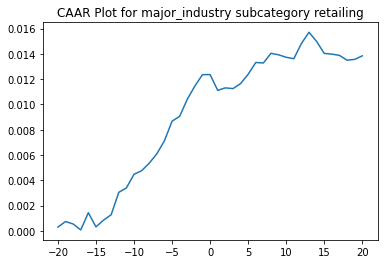

          ARR      CAAR        sd    t_stat       p_value
-20  0.000300  0.000300  0.014943  0.630033  5.288197e-01
-19  0.000443  0.000743  0.020847  1.118151  2.637758e-01
-18 -0.000198  0.000545  0.025593  0.667865  5.043767e-01
-17 -0.000467  0.000078  0.028959  0.084254  9.328716e-01
-16  0.001361  0.001439  0.030990  1.455546  1.458377e-01
-15 -0.001119  0.000320  0.033885  0.295639  7.675679e-01
-14  0.000534  0.000853  0.037661  0.710440  4.776000e-01
-13  0.000427  0.001281  0.042539  0.943889  3.454588e-01
-12  0.001771  0.003052  0.044448  2.152767  3.158005e-02
-11  0.000347  0.003399  0.047013  2.266946  2.361030e-02
-10  0.001080  0.004479  0.049522  2.835771  4.665419e-03
-9   0.000279  0.004758  0.051811  2.879466  4.069996e-03
-8   0.000597  0.005355  0.053493  3.138563  1.748429e-03
-7   0.000741  0.006096  0.055582  3.438466  6.095901e-04
-6   0.001033  0.007129  0.058250  3.837227  1.323809e-04
-5   0.001546  0.008675  0.060380  4.504422  7.454757e-06
-4   0.000388 

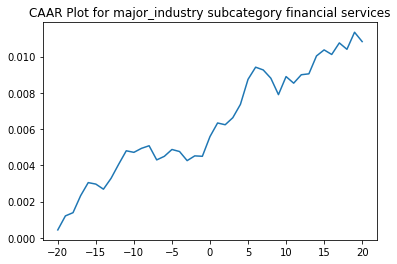

          ARR      CAAR        sd    t_stat   p_value
-20  0.000442  0.000442  0.014203  0.905255  0.365588
-19  0.000773  0.001214  0.017764  1.990306  0.046878
-18  0.000178  0.001392  0.022379  1.810908  0.070509
-17  0.000936  0.002328  0.027756  2.442255  0.014799
-16  0.000722  0.003050  0.030460  2.915667  0.003643
-15 -0.000082  0.002968  0.033436  2.584462  0.009919
-14 -0.000280  0.002688  0.035278  2.218526  0.026783
-13  0.000597  0.003285  0.036037  2.654197  0.008099
-12  0.000777  0.004061  0.038434  3.077068  0.002158
-11  0.000743  0.004804  0.040638  3.442453  0.000605
-10 -0.000086  0.004718  0.041561  3.305601  0.000988
-9   0.000221  0.004939  0.041737  3.445715  0.000598
-8   0.000143  0.005082  0.043069  3.436064  0.000619
-7  -0.000780  0.004302  0.044821  2.794776  0.005311
-6   0.000197  0.004498  0.047907  2.734172  0.006384
-5   0.000378  0.004876  0.047790  2.971133  0.003051
-4  -0.000113  0.004763  0.050392  2.752687  0.006037
-3  -0.000502  0.004262  0.0

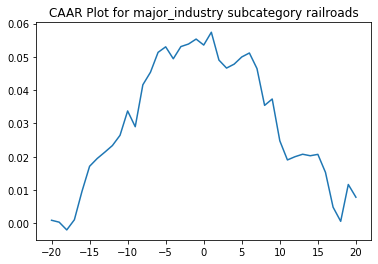

          ARR      CAAR        sd     t_stat        p_value
-20  0.000937  0.000937  0.005976   3.533072   4.483033e-04
-19 -0.000570  0.000367  0.008039   1.029144   3.039027e-01
-18 -0.002329 -0.001962  0.010626  -4.161046   3.721314e-05
-17  0.003046  0.001084  0.017843   1.369503   1.714485e-01
-16  0.008526  0.009610  0.015250  14.202808   8.794062e-39
-15  0.007531  0.017141  0.018902  20.439677   3.543773e-68
-14  0.002339  0.019480  0.022544  19.476009   1.731120e-63
-13  0.001903  0.021383  0.025283  19.061823   1.755638e-61
-12  0.001989  0.023372  0.023852  22.085345   3.167716e-76
-11  0.003076  0.026448  0.025757  23.142925   2.090571e-81
-10  0.007308  0.033756  0.029818  25.516067   5.449870e-93
-9  -0.004735  0.029021  0.031793  20.574093   7.826513e-69
-8   0.012590  0.041611  0.039575  23.698928   3.971705e-84
-7   0.003766  0.045377  0.041573  24.601201   1.552086e-88
-6   0.005972  0.051349  0.039129  29.577734  1.825082e-112
-5   0.001661  0.053010  0.039613  30.16

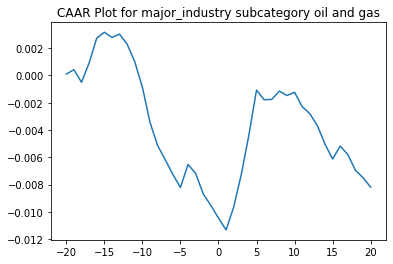

          ARR      CAAR        sd    t_stat   p_value
-20  0.000097  0.000097  0.011631  0.155074  0.876854
-19  0.000319  0.000416  0.016323  0.474525  0.635426
-18 -0.000924 -0.000507  0.020463 -0.460952  0.645123
-17  0.001411  0.000904  0.023690  0.709998  0.478185
-16  0.001823  0.002727  0.027180  1.866156  0.062868
-15  0.000433  0.003159  0.031705  1.853630  0.064646
-14 -0.000379  0.002781  0.034679  1.491560  0.136728
-13  0.000241  0.003022  0.034560  1.626519  0.104752
-12 -0.000739  0.002283  0.036743  1.155965  0.248495
-11 -0.001290  0.000993  0.038803  0.475972  0.634395
-10 -0.001853 -0.000860  0.041819 -0.382402  0.702399
-9  -0.002583 -0.003443  0.046462 -1.378393  0.168975
-8  -0.001685 -0.005128  0.045659 -2.088977  0.037442
-7  -0.001054 -0.006181  0.049704 -2.313275  0.021295
-6  -0.001065 -0.007246  0.052635 -2.560670  0.010872
-5  -0.000965 -0.008211  0.055379 -2.758066  0.006124
-4   0.001687 -0.006524  0.053177 -2.282160  0.023088
-3  -0.000655 -0.007179  0.0

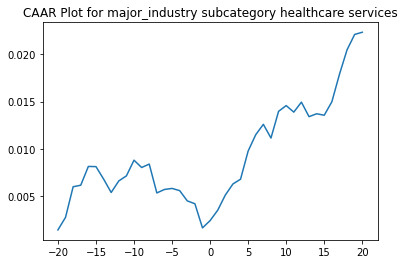

          ARR      CAAR        sd    t_stat   p_value
-20  0.001387  0.001387  0.014581  1.597419  0.111296
-19  0.001332  0.002719  0.020739  2.201830  0.028490
-18  0.003244  0.005963  0.027156  3.687342  0.000272
-17  0.000164  0.006127  0.032838  3.133435  0.001910
-16  0.001990  0.008117  0.033525  4.065913  0.000062
-15 -0.000017  0.008100  0.039906  3.408645  0.000748
-14 -0.001314  0.006786  0.044271  2.574197  0.010560
-13 -0.001431  0.005356  0.045190  1.990145  0.047544
-12  0.001227  0.006582  0.046337  2.385458  0.017721
-11  0.000533  0.007116  0.048482  2.464654  0.014313
-10  0.001666  0.008781  0.050722  2.907302  0.003936
-9  -0.000776  0.008005  0.054938  2.447025  0.015017
-8   0.000362  0.008367  0.056100  2.504717  0.012821
-7  -0.003060  0.005308  0.056351  1.581732  0.114836
-6   0.000368  0.005676  0.066167  1.440566  0.150821
-5   0.000111  0.005787  0.062478  1.555512  0.120950
-4  -0.000234  0.005554  0.064599  1.443676  0.149944
-3  -0.001087  0.004466  0.0

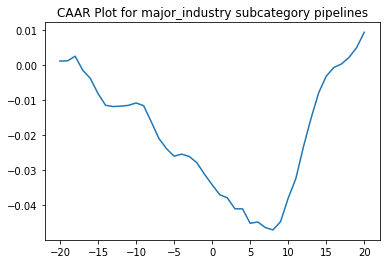

          ARR      CAAR        sd     t_stat       p_value
-20  0.001096  0.001096  0.010939   1.581173  1.151131e-01
-19  0.000050  0.001146  0.015124   1.196173  2.327713e-01
-18  0.001329  0.002475  0.018574   2.103113  3.646365e-02
-17 -0.003998 -0.001523  0.019317  -1.244140  2.146226e-01
-16 -0.002344 -0.003868  0.019865  -3.072114  2.362509e-03
-15 -0.004302 -0.008170  0.017026  -7.572042  7.241090e-13
-14 -0.003364 -0.011534  0.018022 -10.099003  2.612336e-20
-13 -0.000371 -0.011905  0.018204 -10.319460  5.277008e-21
-12  0.000123 -0.011782  0.020290  -9.163021  1.972471e-17
-11  0.000214 -0.011568  0.022815  -8.000485  4.756117e-14
-10  0.000692 -0.010875  0.025285  -6.786982  8.381050e-11
-9  -0.000775 -0.011650  0.029727  -6.184149  2.555633e-09
-8  -0.004580 -0.016231  0.029956  -8.549800  1.284391e-15
-7  -0.004757 -0.020987  0.029694 -11.152939  1.115641e-23
-6  -0.002923 -0.023910  0.030034 -12.562155  2.437656e-28
-5  -0.002167 -0.026077  0.031371 -13.116853  3.296697e-

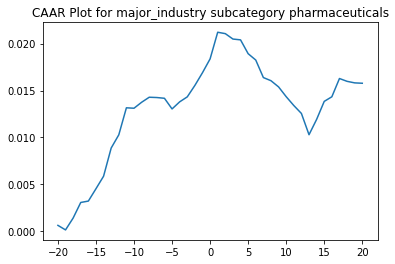

          ARR      CAAR        sd    t_stat       p_value
-20  0.000645  0.000645  0.012232  0.824176  4.106476e-01
-19 -0.000485  0.000161  0.018227  0.137788  8.905221e-01
-18  0.001263  0.001424  0.025470  0.873452  3.832793e-01
-17  0.001658  0.003082  0.026368  1.826051  6.906975e-02
-16  0.000149  0.003231  0.029783  1.694788  9.139665e-02
-15  0.001312  0.004544  0.030594  2.319935  2.117371e-02
-14  0.001333  0.005877  0.031483  2.916036  3.876583e-03
-13  0.003001  0.008878  0.031125  4.455452  1.278144e-05
-12  0.001404  0.010282  0.032795  4.897451  1.772381e-06
-11  0.002878  0.013160  0.032908  6.246464  1.863145e-09
-10 -0.000045  0.013115  0.034823  5.882793  1.328844e-08
-9   0.000635  0.013749  0.035306  6.083085  4.549014e-09
-8   0.000535  0.014284  0.035749  6.241673  1.912990e-09
-7  -0.000031  0.014253  0.038064  5.849320  1.585681e-08
-6  -0.000080  0.014174  0.039179  5.650886  4.454463e-08
-5  -0.001134  0.013040  0.041154  4.949461  1.391810e-06
-4   0.000754 

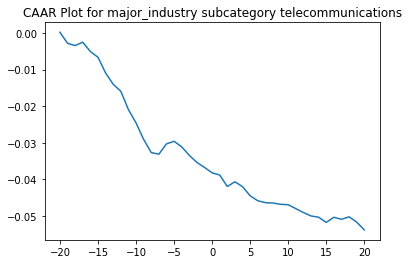

          ARR      CAAR        sd     t_stat       p_value
-20  0.000228  0.000228  0.013864   0.248041  8.043269e-01
-19 -0.003024 -0.002796  0.018604  -2.269665  2.416697e-02
-18 -0.000624 -0.003421  0.021839  -2.365013  1.887181e-02
-17  0.000930 -0.002491  0.024330  -1.545693  1.235716e-01
-16 -0.002566 -0.005056  0.030022  -2.542958  1.165739e-02
-15 -0.001557 -0.006613  0.033032  -3.022847  2.791700e-03
-14 -0.004292 -0.010905  0.032155  -5.121072  6.480372e-07
-13 -0.003110 -0.014015  0.034961  -6.053190  5.819224e-09
-12 -0.001907 -0.015922  0.037377  -6.432375  7.348996e-10
-11 -0.005015 -0.020937  0.038312  -8.251812  1.271947e-14
-10 -0.003637 -0.024574  0.038102  -9.738453  5.977666e-19
-9  -0.004525 -0.029099  0.039590 -11.098388  3.798249e-23
-8  -0.003612 -0.032711  0.041529 -11.893470  1.128990e-25
-7  -0.000442 -0.033153  0.045087 -11.102785  3.679056e-23
-6   0.002823 -0.030329  0.048949  -9.355929  8.320774e-18
-5   0.000704 -0.029626  0.052212  -8.567713  1.632355e-

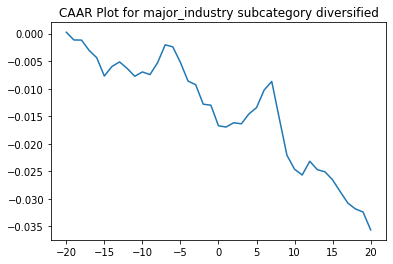

          ARR      CAAR        sd    t_stat       p_value
-20  0.000244  0.000244  0.013032  0.421201  6.737867e-01
-19 -0.001401 -0.001158  0.017520 -1.489571  1.369590e-01
-18 -0.000020 -0.001178  0.020837 -1.274399  2.031060e-01
-17 -0.001872 -0.003050  0.026077 -2.636177  8.641601e-03
-16 -0.001327 -0.004377  0.028741 -3.432482  6.469944e-04
-15 -0.003324 -0.007701  0.035701 -4.861926  1.553075e-06
-14  0.001731 -0.005970  0.037606 -3.578307  3.790313e-04
-13  0.000832 -0.005138  0.040941 -2.828582  4.860594e-03
-12 -0.001182 -0.006320  0.042931 -3.318288  9.707978e-04
-11 -0.001423 -0.007744  0.044084 -3.959082  8.599331e-05
-10  0.000785 -0.006959  0.044095 -3.556785  4.106338e-04
-9  -0.000483 -0.007442  0.046580 -3.600805  3.484431e-04
-8   0.002165 -0.005277  0.047422 -2.508105  1.244932e-02
-7   0.003238 -0.002039  0.053131 -0.865036  3.874280e-01
-6  -0.000375 -0.002414  0.055415 -0.981878  3.266284e-01
-5  -0.002824 -0.005238  0.057438 -2.055282  4.036344e-02
-4  -0.003383 

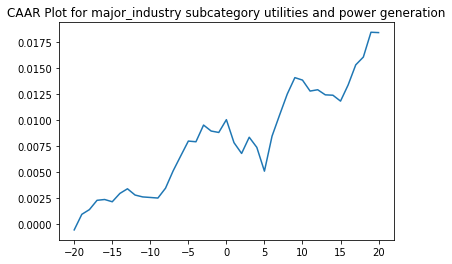

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000524 -0.000524  0.011953 -0.588114  0.557197
-19  0.001494  0.000970  0.012093  1.076367  0.283212
-18  0.000454  0.001424  0.015363  1.243374  0.215356
-17  0.000890  0.002314  0.017529  1.771021  0.078259
-16  0.000077  0.002391  0.019255  1.666152  0.097432
-15 -0.000216  0.002175  0.028747  1.015218  0.311372
-14  0.000797  0.002972  0.029493  1.352135  0.178038
-13  0.000446  0.003418  0.030189  1.519239  0.130467
-12 -0.000600  0.002819  0.030792  1.228183  0.220991
-11 -0.000180  0.002639  0.031735  1.115670  0.266059
-10 -0.000052  0.002587  0.032641  1.063174  0.289135
-9  -0.000056  0.002530  0.033326  1.018637  0.309750
-8   0.000945  0.003475  0.035230  1.323399  0.187391
-7   0.001659  0.005134  0.036634  1.880192  0.061706
-6   0.001436  0.006570  0.036793  2.395868  0.017612
-5   0.001422  0.007992  0.036724  2.919768  0.003953
-4  -0.000066  0.007926  0.037076  2.868148  0.004625
-3   0.001601  0.009527  0.0

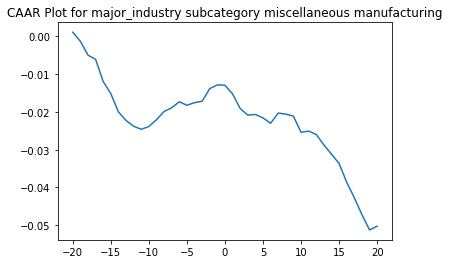

          ARR      CAAR        sd    t_stat       p_value
-20  0.001095  0.001095  0.011897  1.163908  2.462047e-01
-19 -0.002409 -0.001314  0.019256 -0.863280  3.892838e-01
-18 -0.003661 -0.004975  0.021417 -2.938245  3.792111e-03
-17 -0.001099 -0.006074  0.024414 -3.147016  1.969768e-03
-16 -0.005903 -0.011977  0.034443 -4.398708  1.986540e-05
-15 -0.003180 -0.015158  0.038905 -4.928282  2.066283e-06
-14 -0.004840 -0.019997  0.041830 -6.047104  1.015352e-08
-13 -0.002269 -0.022267  0.048895 -5.760448  4.223203e-08
-12 -0.001531 -0.023798  0.051749 -5.816918  3.199701e-08
-11 -0.000803 -0.024601  0.054172 -5.744389  4.568687e-08
-10  0.000727 -0.023875  0.052275 -5.776996  3.893987e-08
-9   0.001793 -0.022081  0.050700 -5.509043  1.424062e-07
-8   0.002186 -0.019895  0.048343 -5.205709  5.897775e-07
-7   0.000994 -0.018901  0.047285 -5.056200  1.165632e-06
-6   0.001587 -0.017314  0.047333 -4.626809  7.657989e-06
-5  -0.000924 -0.018238  0.049695 -4.642127  7.174592e-06
-4   0.000678 

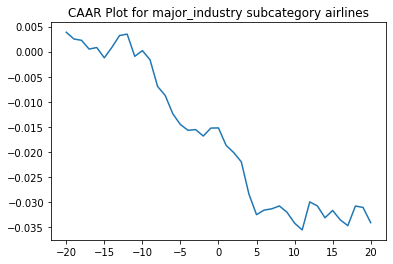

          ARR      CAAR        sd    t_stat   p_value
-20  0.003879  0.003879  0.019606  2.366048  0.019330
-19 -0.001346  0.002533  0.029641  1.021863  0.308583
-18 -0.000269  0.002263  0.030774  0.879559  0.380585
-17 -0.001748  0.000516  0.039874  0.154660  0.877309
-16  0.000310  0.000826  0.048481  0.203683  0.838893
-15 -0.002056 -0.001231  0.050486 -0.291487  0.771105
-14  0.002103  0.000872  0.051180  0.203851  0.838762
-13  0.002354  0.003227  0.045546  0.847157  0.398333
-12  0.000274  0.003500  0.041474  1.009293  0.314551
-11 -0.004434 -0.000934  0.045427 -0.245831  0.806168
-10  0.001136  0.000202  0.047983  0.050399  0.959875
-9  -0.001803 -0.001601  0.052781 -0.362619  0.717429
-8  -0.005357 -0.006957  0.056855 -1.463346  0.145583
-7  -0.001788 -0.008745  0.057542 -1.817405  0.071263
-6  -0.003677 -0.012422  0.061890 -2.400217  0.017681
-5  -0.002147 -0.014570  0.065416 -2.663392  0.008630
-4  -0.001148 -0.015717  0.068810 -2.731458  0.007106
-3   0.000141 -0.015577  0.0

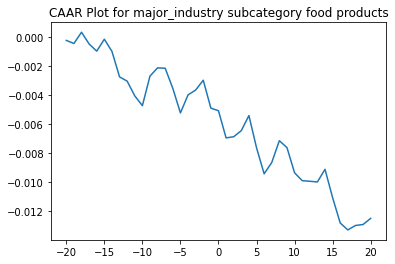

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000251 -0.000251  0.011673 -0.253474  0.800279
-19 -0.000212 -0.000463  0.019217 -0.283845  0.776954
-18  0.000774  0.000311  0.020292  0.180826  0.856770
-17 -0.000809 -0.000497  0.027980 -0.209592  0.834295
-16 -0.000491 -0.000988  0.034549 -0.337240  0.736448
-15  0.000820 -0.000169  0.041116 -0.048359  0.961500
-14 -0.000837 -0.001006  0.046819 -0.253316  0.800401
-13 -0.001755 -0.002761  0.051569 -0.631235  0.528931
-12 -0.000294 -0.003055  0.050900 -0.707673  0.480342
-11 -0.001014 -0.004069  0.053735 -0.892841  0.373497
-10 -0.000672 -0.004741  0.058268 -0.959253  0.339109
-9   0.002036 -0.002705  0.055014 -0.579616  0.563118
-8   0.000565 -0.002140  0.057612 -0.437914  0.662133
-7  -0.000029 -0.002169  0.058766 -0.435108  0.664164
-6  -0.001384 -0.003552  0.060386 -0.693553  0.489128
-5  -0.001689 -0.005241  0.063810 -0.968402  0.334538
-4   0.001239 -0.004002  0.064597 -0.730500  0.466323
-3   0.000337 -0.003665  0.0

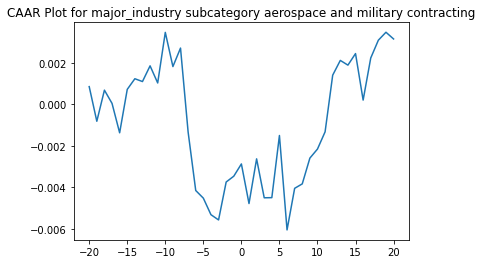

          ARR      CAAR        sd    t_stat   p_value
-20  0.000860  0.000860  0.015710  0.519124  0.604963
-19 -0.001671 -0.000811  0.022128 -0.347709  0.728880
-18  0.001501  0.000690  0.026776  0.244417  0.807471
-17 -0.000639  0.000051  0.032500  0.014856  0.988181
-16 -0.001419 -0.001368  0.033325 -0.389368  0.697934
-15  0.002094  0.000727  0.037877  0.182006  0.855992
-14  0.000514  0.001240  0.037061  0.317521  0.751592
-13 -0.000136  0.001105  0.038240  0.274065  0.784670
-12  0.000758  0.001863  0.039688  0.445226  0.657237
-11 -0.000826  0.001036  0.041608  0.236327  0.813722
-10  0.002440  0.003477  0.040940  0.805649  0.422593
-9  -0.001650  0.001827  0.042935  0.403688  0.687411
-8   0.000893  0.002720  0.044304  0.582408  0.561764
-7  -0.004052 -0.001332  0.045216 -0.279535  0.780483
-6  -0.001911 -0.003243  0.050652 -0.607369  0.545153
-5  -0.000368 -0.003611  0.053234 -0.643575  0.521506
-4  -0.000798 -0.004409  0.053541 -0.781288  0.436707
-3  -0.000253 -0.004663  0.0

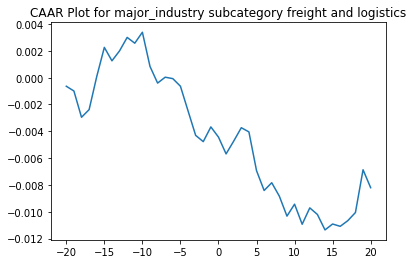

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000639 -0.000639  0.011880 -0.591557  0.555260
-19 -0.000354 -0.000993  0.016528 -0.660878  0.509957
-18 -0.001960 -0.002953  0.022843 -1.422142  0.157579
-17  0.000571 -0.002383  0.027325 -0.959176  0.339399
-16  0.002464  0.000081  0.035068  0.025429  0.979755
-15  0.002178  0.002259  0.039710  0.625784  0.532645
-14 -0.001002  0.001258  0.046995  0.294343  0.769004
-13  0.000742  0.002000  0.051619  0.426202  0.670724
-12  0.001003  0.003003  0.048922  0.675330  0.500765
-11 -0.000432  0.002572  0.056316  0.502291  0.616383
-10  0.000817  0.003388  0.055851  0.667347  0.505832
-9  -0.002549  0.000839  0.055600  0.166065  0.868385
-8  -0.001242 -0.000403  0.054561 -0.081207  0.935413
-7   0.000439  0.000036  0.055551  0.007192  0.994274
-6  -0.000108 -0.000071  0.058186 -0.013496  0.989254
-5  -0.000567 -0.000638  0.058373 -0.120215  0.904514
-4  -0.001836 -0.002473  0.061634 -0.441441  0.659688
-3  -0.001829 -0.004302  0.0

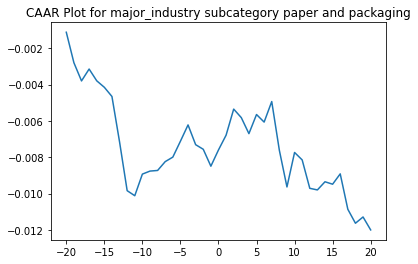

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001120 -0.001120  0.012978 -0.901106  0.369537
-19 -0.001679 -0.002799  0.018645 -1.567190  0.119996
-18 -0.001001 -0.003800  0.020660 -1.920325  0.057454
-17  0.000654 -0.003146  0.024767 -1.326312  0.187534
-16 -0.000648 -0.003794  0.029424 -1.346272  0.181034
-15 -0.000358 -0.004152  0.031685 -1.368103  0.174119
-14 -0.000506 -0.004658  0.032756 -1.484751  0.140523
-13 -0.002499 -0.007158  0.034128 -2.189684  0.030698
-12 -0.002687 -0.009845  0.040559 -2.534109  0.012708
-11 -0.000278 -0.010123  0.042803 -2.469055  0.015114
-10  0.001191 -0.008932  0.040977 -2.275659  0.024840
-9   0.000166 -0.008766  0.042321 -2.162476  0.032788
-8   0.000035 -0.008731  0.044080 -2.067950  0.041034
-7   0.000487 -0.008244  0.046471 -1.852217  0.066726
-6   0.000248 -0.007997  0.047915 -1.742446  0.084277
-5   0.000876 -0.007120  0.050532 -1.471122  0.144166
-4   0.000897 -0.006223  0.051976 -1.250089  0.213969
-3  -0.001089 -0.007312  0.0

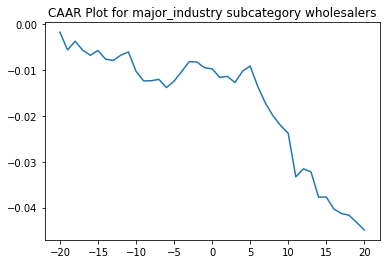

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001818 -0.001818  0.013017 -1.280107  0.204074
-19 -0.003845 -0.005663  0.020326 -2.553697  0.012487
-18  0.001883 -0.003780  0.020312 -1.705702  0.091803
-17 -0.001958 -0.005738  0.022321 -2.356143  0.020823
-16 -0.001102 -0.006840  0.022690 -2.763015  0.007052
-15  0.001059 -0.005781  0.026423 -2.005338  0.048185
-14 -0.001897 -0.007679  0.033816 -2.081097  0.040507
-13 -0.000288 -0.007966  0.034779 -2.099276  0.038830
-12  0.001147 -0.006819  0.038895 -1.606795  0.111897
-11  0.000720 -0.006099  0.041991 -1.331164  0.186780
-10 -0.004211 -0.010310  0.045641 -2.070335  0.041529
-9  -0.002098 -0.012408  0.047453 -2.396542  0.018798
-8   0.000035 -0.012374  0.048031 -2.361104  0.020564
-7   0.000304 -0.012070  0.049588 -2.230854  0.028388
-6  -0.001790 -0.013860  0.050263 -2.527282  0.013392
-5   0.001391 -0.012469  0.049775 -2.295978  0.024199
-4   0.002103 -0.010366  0.050134 -1.895099  0.061561
-3   0.002151 -0.008215  0.0

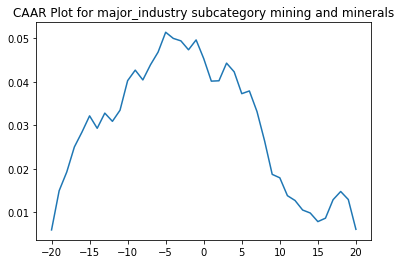

          ARR      CAAR        sd    t_stat   p_value
-20  0.005938  0.005938  0.019966  2.709410  0.008205
-19  0.009007  0.014944  0.032216  4.226109  0.000061
-18  0.004308  0.019253  0.042719  4.105894  0.000095
-17  0.005755  0.025007  0.044894  5.074788  0.000002
-16  0.003423  0.028431  0.054001  4.796453  0.000007
-15  0.003729  0.032159  0.058938  4.971098  0.000004
-14 -0.002866  0.029294  0.071691  3.722616  0.000360
-13  0.003496  0.032789  0.079665  3.749749  0.000329
-12 -0.001890  0.030899  0.082040  3.431313  0.000943
-11  0.002558  0.033458  0.086772  3.512810  0.000724
-10  0.006792  0.040250  0.091758  3.996314  0.000140
-9   0.002419  0.042669  0.100210  3.879182  0.000211
-8  -0.002251  0.040418  0.104302  3.530391  0.000684
-7   0.003472  0.043890  0.112030  3.569153  0.000602
-6   0.002914  0.046804  0.118162  3.608636  0.000528
-5   0.004576  0.051379  0.126929  3.687813  0.000405
-4  -0.001412  0.049967  0.128488  3.542902  0.000656
-3  -0.000568  0.049399  0.1

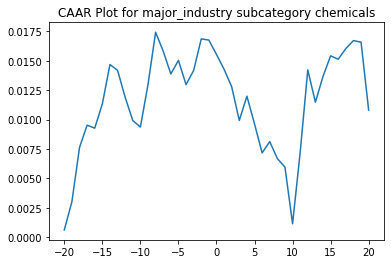

          ARR      CAAR        sd    t_stat   p_value
-20  0.000611  0.000611  0.015790  0.306892  0.759954
-19  0.002398  0.003008  0.025688  0.929452  0.356260
-18  0.004615  0.007623  0.029545  2.047830  0.044818
-17  0.001902  0.009525  0.032073  2.357126  0.021589
-16 -0.000257  0.009267  0.034905  2.107350  0.039139
-15  0.002066  0.011333  0.031815  2.827366  0.006311
-14  0.003347  0.014680  0.035396  3.291971  0.001645
-13 -0.000488  0.014192  0.035990  3.129975  0.002665
-12 -0.002295  0.011898  0.039499  2.390807  0.019861
-11 -0.001166  0.010732  0.041800  2.037877  0.045835
-10 -0.000558  0.010174  0.047172  1.711832  0.091926
-9   0.002800  0.012974  0.051905  1.983911  0.051698
-8   0.004456  0.017429  0.059494  2.325292  0.023344
-7  -0.001608  0.015821  0.062051  2.023726  0.047314
-6  -0.001938  0.013883  0.061298  1.797602  0.077110
-5   0.001149  0.015032  0.063028  1.892975  0.063031
-4  -0.002056  0.012975  0.060259  1.709066  0.092440
-3   0.001200  0.014175  0.0

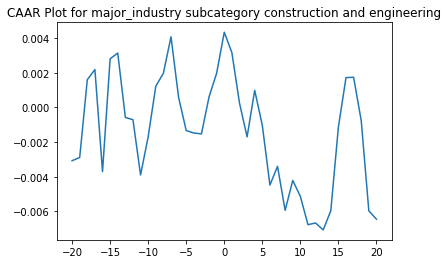

          ARR      CAAR        sd    t_stat   p_value
-20 -0.003079 -0.003079  0.018241 -1.251859  0.216017
-19  0.000188 -0.002891  0.021984 -0.975155  0.333832
-18  0.004489  0.001598  0.029419  0.402819  0.688672
-17  0.000589  0.002186  0.035329  0.458975  0.648094
-16 -0.005895 -0.003708  0.037384 -0.735621  0.465144
-15  0.006514  0.002806  0.049793  0.417895  0.677681
-14  0.000332  0.003138  0.056161  0.414408  0.680217
-13 -0.003718 -0.000579  0.055647 -0.077226  0.938729
-12 -0.000130 -0.000710  0.054412 -0.096731  0.923298
-11 -0.003192 -0.003902  0.054955 -0.526601  0.600627
-10  0.002205 -0.001697  0.056053 -0.224509  0.823208
-9   0.002917  0.001220  0.056478  0.160213  0.873311
-8   0.000752  0.001972  0.054296  0.269392  0.788655
-7   0.002102  0.004074  0.059591  0.507042  0.614190
-6  -0.003501  0.000573  0.064491  0.065891  0.947708
-5  -0.001909 -0.001336  0.072021 -0.137614  0.891058
-4  -0.000143 -0.001479  0.073593 -0.149066  0.882057
-3  -0.000051 -0.001530  0.0

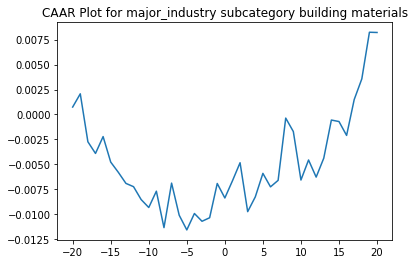

          ARR      CAAR        sd    t_stat   p_value
-20  0.000745  0.000745  0.013421  0.407726  0.685117
-19  0.001327  0.002071  0.022325  0.681820  0.498322
-18 -0.004807 -0.002736  0.024519 -0.819996  0.415891
-17 -0.001171 -0.003907  0.026325 -1.090588  0.280388
-16  0.001692 -0.002215  0.027594 -0.589994  0.557702
-15 -0.002556 -0.004772  0.029716 -1.179996  0.243271
-14 -0.001025 -0.005797  0.030665 -1.389186  0.170586
-13 -0.001111 -0.006908  0.033211 -1.528506  0.132334
-12 -0.000330 -0.007238  0.036433 -1.459847  0.150234
-11 -0.001292 -0.008530  0.037151 -1.687142  0.097454
-10 -0.000795 -0.009324  0.036742 -1.864885  0.067738
-9   0.001635 -0.007689  0.034803 -1.623558  0.110404
-8  -0.003653 -0.011342  0.034664 -2.404445  0.019724
-7   0.004461 -0.006881  0.036073 -1.401692  0.166837
-6  -0.003217 -0.010097  0.037492 -1.979069  0.053014
-5  -0.001474 -0.011571  0.038823 -2.190253  0.032927
-4   0.001646 -0.009926  0.038835 -1.878133  0.065869
-3  -0.000779 -0.010705  0.0

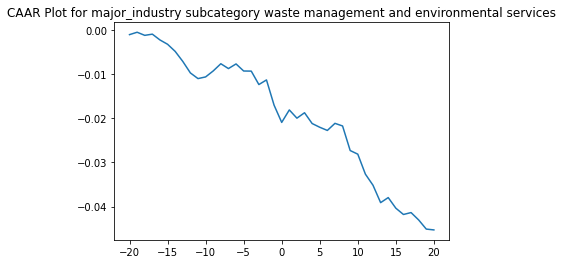

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001024 -0.001024  0.009745 -0.743251  0.460878
-19  0.000539 -0.000485  0.017068 -0.200878  0.841625
-18 -0.000704 -0.001189  0.022153 -0.379537  0.705929
-17  0.000270 -0.000919  0.025207 -0.257818  0.797627
-16 -0.001314 -0.002233  0.028623 -0.551695  0.583665
-15 -0.000976 -0.003210  0.031470 -0.721178  0.474227
-14 -0.001618 -0.004827  0.032556 -1.048503  0.299551
-13 -0.002271 -0.007098  0.033191 -1.512163  0.136916
-12 -0.002614 -0.009712  0.035181 -1.951944  0.056672
-11 -0.001282 -0.010994  0.039213 -1.982481  0.053047
-10  0.000379 -0.010615  0.041599 -1.804338  0.077326
-9   0.001357 -0.009258  0.043925 -1.490391  0.142531
-8   0.001632 -0.007626  0.047891 -1.126044  0.265632
-7  -0.001096 -0.008722  0.051240 -1.203632  0.234515
-6   0.001052 -0.007670  0.055447 -0.978139  0.332810
-5  -0.001604 -0.009274  0.054764 -1.197397  0.236913
-4  -0.000026 -0.009300  0.056295 -1.168122  0.248410
-3  -0.003044 -0.012344  0.0

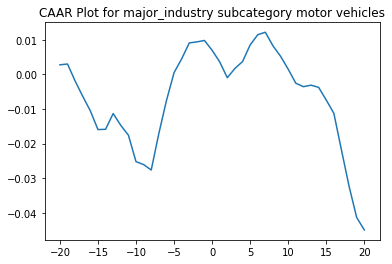

          ARR      CAAR        sd    t_stat   p_value
-20  0.002794  0.002794  0.020495  0.944442  0.349774
-19  0.000231  0.003025  0.030182  0.694281  0.490924
-18 -0.004921 -0.001897  0.032410 -0.405409  0.687016
-17 -0.004420 -0.006317  0.030114 -1.453226  0.152806
-16 -0.004207 -0.010523  0.037015 -1.969630  0.054790
-15 -0.005409 -0.015932  0.040830 -2.703452  0.009522
-14  0.000085 -0.015847  0.041234 -2.662607  0.010583
-13  0.004557 -0.011290  0.041972 -1.863535  0.068641
-12 -0.003427 -0.014716  0.052408 -1.945466  0.057714
-11 -0.002818 -0.017535  0.057822 -2.100993  0.041032
-10 -0.007670 -0.025205  0.058955 -2.962032  0.004781
-9  -0.000845 -0.026050  0.062955 -2.866840  0.006186
-8  -0.001568 -0.027618  0.060116 -3.182959  0.002586
-7   0.010548 -0.017071  0.056752 -2.083942  0.042628
-6   0.009519 -0.007552  0.056338 -0.928700  0.357790
-5   0.008084  0.000532  0.057760  0.063808  0.949394
-4   0.003988  0.004520  0.057867  0.541208  0.590921
-3   0.004598  0.009118  0.0

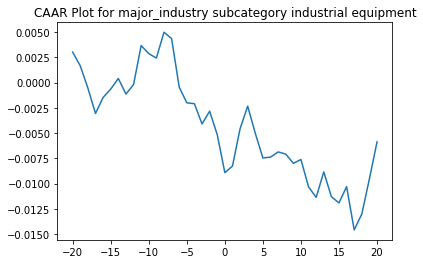

          ARR      CAAR        sd    t_stat   p_value
-20  0.003024  0.003024  0.013290  1.491835  0.143216
-19 -0.001373  0.001650  0.017261  0.626950  0.534086
-18 -0.002195 -0.000545  0.023304 -0.153301  0.878895
-17 -0.002518 -0.003063  0.024986 -0.803804  0.426036
-16  0.001588 -0.001475  0.033448 -0.289112  0.773918
-15  0.000830 -0.000645  0.034831 -0.121438  0.903923
-14  0.001053  0.000408  0.034545  0.077502  0.938592
-13 -0.001547 -0.001139  0.038180 -0.195604  0.845863
-12  0.000934 -0.000204  0.036493 -0.036746  0.970861
-11  0.003871  0.003666  0.035729  0.672889  0.504703
-10 -0.000798  0.002869  0.036549  0.514669  0.609482
-9  -0.000441  0.002428  0.037011  0.430178  0.669266
-8   0.002559  0.004987  0.037783  0.865487  0.391689
-7  -0.000627  0.004359  0.038854  0.735730  0.465984
-6  -0.004804 -0.000444  0.039404 -0.073915  0.941429
-5  -0.001560 -0.002005  0.042572 -0.308758  0.759032
-4  -0.000090 -0.002095  0.042958 -0.319757  0.750738
-3  -0.002003 -0.004098  0.0

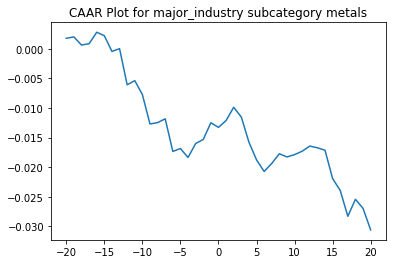

          ARR      CAAR        sd    t_stat   p_value
-20  0.001782  0.001782  0.021836  0.475821  0.637337
-19  0.000231  0.002013  0.024664  0.475873  0.637300
-18 -0.001376  0.000637  0.024106  0.154048  0.878510
-17  0.000227  0.000864  0.022830  0.220669  0.826710
-16  0.001939  0.002803  0.035787  0.456738  0.650852
-15 -0.000588  0.002215  0.034778  0.371337  0.712760
-14 -0.002656 -0.000441  0.033591 -0.076631  0.939380
-13  0.000470  0.000029  0.040208  0.004182  0.996689
-12 -0.006109 -0.006080  0.048657 -0.728661  0.471349
-11  0.000703 -0.005378  0.046986 -0.667346  0.509191
-10 -0.002354 -0.007731  0.049421 -0.912187  0.368286
-9  -0.004974 -0.012706  0.050246 -1.474481  0.149829
-8   0.000234 -0.012472  0.052053 -1.397083  0.171713
-7   0.000639 -0.011833  0.051346 -1.343752  0.188196
-6  -0.005511 -0.017344  0.055416 -1.824921  0.077077
-5   0.000490 -0.016853  0.053778 -1.827324  0.076706
-4  -0.001515 -0.018368  0.056354 -1.900500  0.066133
-3   0.002356 -0.016011  0.0

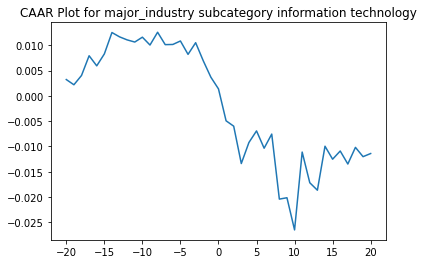

          ARR      CAAR        sd    t_stat   p_value
-20  0.003214  0.003214  0.015421  1.215155  0.232930
-19 -0.001029  0.002185  0.026879  0.474023  0.638605
-18  0.001833  0.004018  0.028571  0.820038  0.418078
-17  0.003899  0.007917  0.028819  1.601966  0.118694
-16 -0.001995  0.005923  0.032920  1.049094  0.301757
-15  0.002352  0.008275  0.030220  1.596726  0.119860
-14  0.004228  0.012504  0.034805  2.094752  0.043950
-13 -0.000854  0.011650  0.034482  1.969949  0.057284
-12 -0.000601  0.011049  0.035640  1.807720  0.079773
-11 -0.000423  0.010626  0.036837  1.681986  0.102013
-10  0.000958  0.011584  0.036200  1.865962  0.070956
-9  -0.001550  0.010034  0.034261  1.707759  0.097074
-8   0.002526  0.012561  0.035305  2.074524  0.045905
-7  -0.002449  0.010112  0.043332  1.360743  0.182817
-6   0.000034  0.010146  0.049660  1.191380  0.242003
-5   0.000688  0.010834  0.054920  1.150269  0.258301
-4  -0.002643  0.008191  0.061940  0.771127  0.446118
-3   0.002303  0.010494  0.0

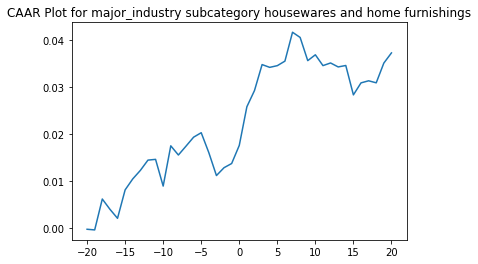

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000264 -0.000264  0.013215 -0.109434  0.913612
-19 -0.000140 -0.000404  0.021118 -0.104905  0.917173
-18  0.006586  0.006182  0.021184  1.598256  0.120826
-17 -0.002180  0.004002  0.024650  0.889184  0.381221
-16 -0.001932  0.002069  0.028346  0.399846  0.692200
-15  0.006058  0.008127  0.037064  1.201066  0.239444
-14  0.002335  0.010463  0.043906  1.305184  0.202092
-13  0.001813  0.012276  0.051761  1.298975  0.204186
-12  0.002196  0.014471  0.052941  1.497183  0.145152
-11  0.000160  0.014632  0.058524  1.369352  0.181401
-10 -0.005695  0.008937  0.066841  0.732341  0.469838
-9   0.008580  0.017517  0.068219  1.406425  0.170224
-8  -0.001957  0.015560  0.070148  1.214965  0.234179
-7   0.001887  0.017448  0.070201  1.361304  0.183902
-6   0.001914  0.019362  0.075374  1.406956  0.170068
-5   0.000948  0.020309  0.074157  1.500054  0.144410
-4  -0.004248  0.016062  0.077856  1.129960  0.267753
-3  -0.004882  0.011180  0.0

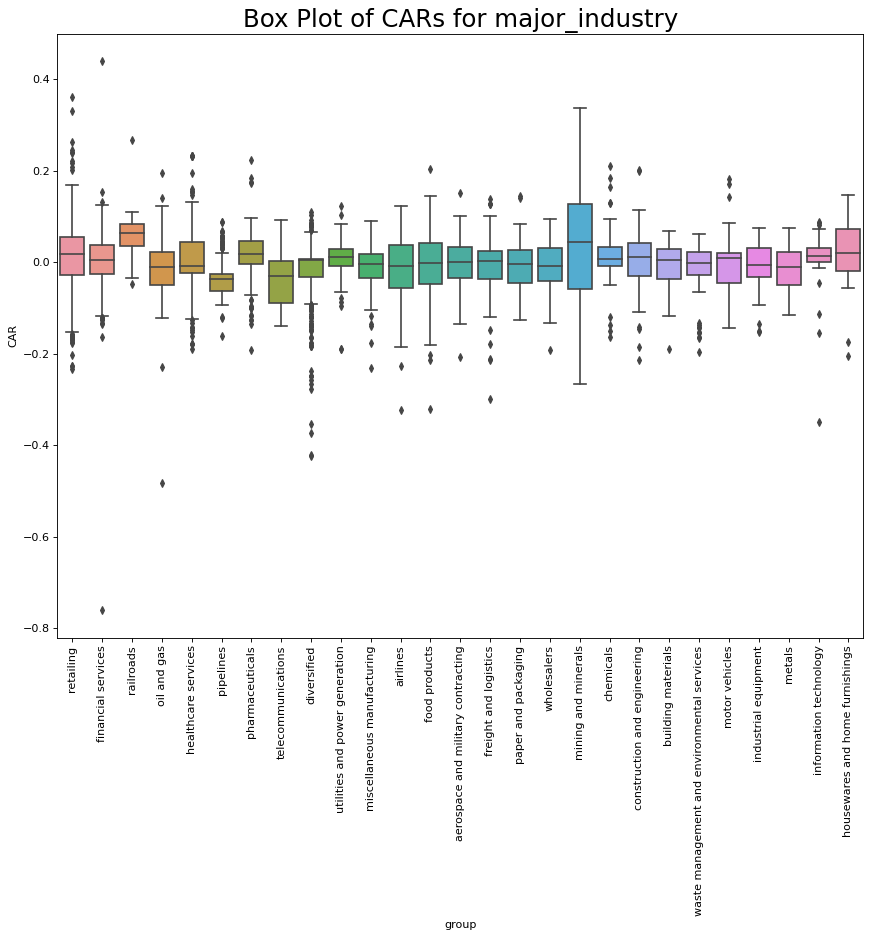

In [ ]:
b = CAAR_by_category(df, events, 'major_industry',\
                     cat_name='Different Groups of Industries', cat_members=Major_industry_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

In [ ]:
'''
a = CAAR_by_category(df, events, 'govt_level',\
                     cat_name='Different Government levels Groups', cat_members=gov_level_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0
'''

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Primary Offence Groups GROUP workplace safety or health violation
We found AR for 1619 events
AR.shape[1] is 1619


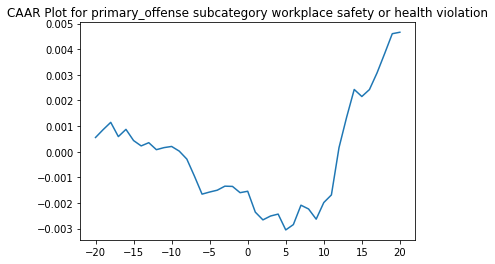

          ARR      CAAR        sd    t_stat   p_value
-20  0.000553  0.000553  0.015430  1.442956  0.149226
-19  0.000306  0.000859  0.021777  1.587224  0.112657
-18  0.000285  0.001144  0.026861  1.713137  0.086879
-17 -0.000555  0.000589  0.029866  0.792961  0.427917
-16  0.000282  0.000870  0.033192  1.054752  0.291696
-15 -0.000436  0.000434  0.037404  0.466787  0.640715
-14 -0.000209  0.000225  0.040702  0.222059  0.824296
-13  0.000126  0.000350  0.043404  0.324855  0.745333
-12 -0.000273  0.000077  0.045042  0.069213  0.944829
-11  0.000080  0.000158  0.047346  0.134169  0.893286
-10  0.000046  0.000203  0.049682  0.164778  0.869139
-9  -0.000181  0.000022  0.052066  0.017203  0.986277
-8  -0.000311 -0.000289  0.053696 -0.216726  0.828449
-7  -0.000665 -0.000955  0.056219 -0.683210  0.494572
-6  -0.000702 -0.001657  0.059010 -1.129850  0.258707
-5   0.000082 -0.001575  0.061183 -1.035542  0.300571
-4   0.000072 -0.001503  0.062582 -0.966264  0.334056
-3   0.000157 -0.001346  0.0

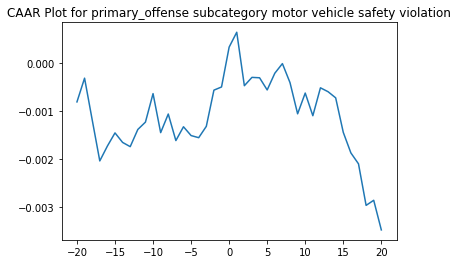

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000804 -0.000804  0.012639 -2.063437  0.039316
-19  0.000494 -0.000311  0.018493 -0.544366  0.586305
-18 -0.000865 -0.001175  0.023419 -1.626771  0.104086
-17 -0.000857 -0.002033  0.027817 -2.368835  0.018024
-16  0.000309 -0.001723  0.030505 -1.831278  0.067342
-15  0.000274 -0.001450  0.033161 -1.417076  0.156757
-14 -0.000198 -0.001648  0.036087 -1.480372  0.139074
-13 -0.000088 -0.001736  0.039001 -1.442626  0.149424
-12  0.000358 -0.001378  0.041545 -1.075113  0.282571
-11  0.000153 -0.001225  0.043196 -0.919482  0.358055
-10  0.000593 -0.000632  0.043399 -0.472103  0.636951
-9  -0.000812 -0.001444  0.045097 -1.037923  0.299545
-8   0.000387 -0.001057  0.046329 -0.739383  0.459840
-7  -0.000552 -0.001609  0.049264 -1.058785  0.289941
-6   0.000287 -0.001322  0.051190 -0.837020  0.402772
-5  -0.000183 -0.001505  0.054003 -0.903422  0.366509
-4  -0.000044 -0.001549  0.056247 -0.892820  0.372158
-3   0.000236 -0.001313  0.0

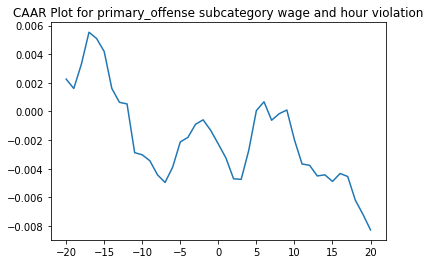

          ARR      CAAR        sd    t_stat       p_value
-20  0.002261  0.002261  0.014446  4.289098  2.028576e-05
-19 -0.000657  0.001604  0.020892  2.104411  3.567483e-02
-18  0.001701  0.003306  0.025030  3.619267  3.152779e-04
-17  0.002229  0.005535  0.029308  5.175594  2.919826e-07
-16 -0.000439  0.005096  0.036534  3.822692  1.429544e-04
-15 -0.000914  0.004183  0.039250  2.920328  3.601499e-03
-14 -0.002573  0.001610  0.041398  1.065802  2.868560e-01
-13 -0.000971  0.000639  0.045077  0.388690  6.976155e-01
-12 -0.000114  0.000525  0.047261  0.304426  7.608882e-01
-11 -0.003403 -0.002878  0.050734 -1.554659  1.204491e-01
-10 -0.000151 -0.003029  0.051506 -1.611524  1.074863e-01
-9  -0.000417 -0.003446  0.051009 -1.851340  6.451358e-02
-8  -0.000982 -0.004428  0.050900 -2.383804  1.738256e-02
-7  -0.000532 -0.004960  0.051117 -2.659128  8.001446e-03
-6   0.001076 -0.003884  0.052286 -2.035585  4.214309e-02
-5   0.001758 -0.002126  0.054954 -1.060063  2.894574e-01
-4   0.000311 

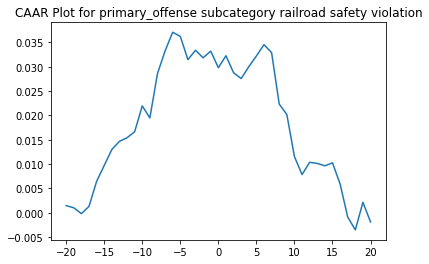

          ARR      CAAR        sd     t_stat        p_value
-20  0.001468  0.001468  0.007099   5.958711   3.756459e-09
-19 -0.000447  0.001021  0.009606   3.062248   2.267764e-03
-18 -0.001201 -0.000180  0.011246  -0.460430   6.453281e-01
-17  0.001481  0.001301  0.017402   2.153879   3.153729e-02
-16  0.005149  0.006450  0.017450  10.648723   6.604464e-25
-15  0.003267  0.009717  0.024504  11.424570   3.562588e-28
-14  0.003269  0.012986  0.024990  14.970993   4.995416e-45
-13  0.001685  0.014670  0.026270  16.088923   6.839992e-51
-12  0.000742  0.015412  0.026067  17.034310   5.104788e-56
-11  0.001229  0.016641  0.028506  16.818746   7.756693e-55
-10  0.005321  0.021963  0.033284  19.009944   3.712534e-67
-9  -0.002482  0.019481  0.034207  16.406917   1.339027e-52
-8   0.009102  0.028583  0.041437  19.872444   3.590605e-72
-7   0.004676  0.033258  0.043220  22.169266   7.149480e-86
-6   0.003828  0.037087  0.043030  24.830756  3.403591e-102
-5  -0.000851  0.036235  0.045295  23.04

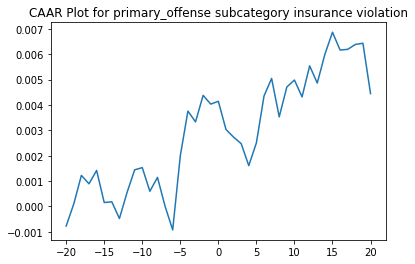

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000775 -0.000775  0.018759 -0.835066  0.404169
-19  0.000873  0.000099  0.020580  0.096865  0.922881
-18  0.001124  0.001222  0.025302  0.977061  0.329118
-17 -0.000332  0.000890  0.031536  0.570943  0.568352
-16  0.000527  0.001417  0.034057  0.841670  0.400466
-15 -0.001264  0.000153  0.041286  0.075070  0.940196
-14  0.000027  0.000180  0.044583  0.081710  0.934918
-13 -0.000658 -0.000478  0.045959 -0.210469  0.833407
-12  0.001026  0.000548  0.047794  0.231676  0.816906
-11  0.000893  0.001441  0.050262  0.579634  0.562482
-10  0.000088  0.001528  0.051833  0.596368  0.551260
-9  -0.000932  0.000597  0.054628  0.220887  0.825291
-8   0.000547  0.001144  0.057424  0.402920  0.687218
-7  -0.001141  0.000003  0.058505  0.001017  0.999189
-6  -0.000930 -0.000927  0.066484 -0.282105  0.778006
-5   0.002924  0.001996  0.062965  0.641190  0.521759
-4   0.001761  0.003757  0.067635  1.123360  0.261945
-3  -0.000425  0.003332  0.0

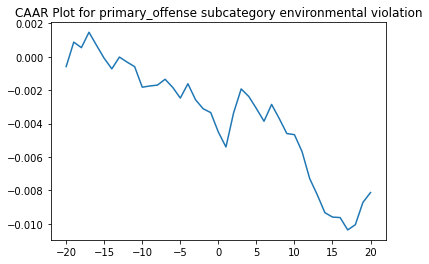

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000584 -0.000584  0.012078 -0.880997  0.378959
-19  0.001464  0.000880  0.018864  0.850435  0.395698
-18 -0.000331  0.000549  0.022838  0.438121  0.661584
-17  0.000923  0.001472  0.025781  1.040420  0.298904
-16 -0.000793  0.000679  0.027457  0.450819  0.652416
-15 -0.000772 -0.000092  0.034045 -0.049331  0.960686
-14 -0.000629 -0.000721  0.036666 -0.358396  0.720275
-13  0.000707 -0.000015  0.038656 -0.006881  0.994514
-12 -0.000300 -0.000315  0.041562 -0.138071  0.890268
-11 -0.000121 -0.000436  0.044124 -0.179938  0.857312
-10 -0.001230 -0.001666  0.047247 -0.642571  0.520948
-9  -0.000080 -0.001747  0.049626 -0.641311  0.521765
-8   0.000053 -0.001693  0.053093 -0.581157  0.561530
-7   0.000349 -0.001345  0.054750 -0.447461  0.654835
-6  -0.000238 -0.001582  0.054402 -0.529870  0.596558
-5  -0.000643 -0.002225  0.053985 -0.750950  0.453216
-4   0.000857 -0.001368  0.052974 -0.470410  0.638372
-3  -0.000956 -0.002323  0.0

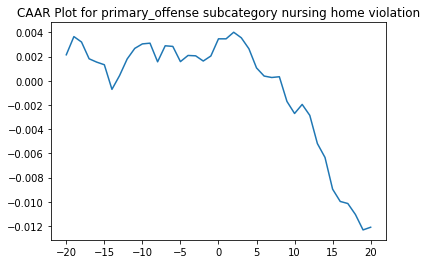

              ARR      CAAR        sd    t_stat   p_value
-20  2.145767e-03  0.002146  0.011804  2.485773  0.013809
-19  1.502113e-03  0.003648  0.017077  2.921127  0.003920
-18 -4.478938e-04  0.003200  0.018009  2.429812  0.016057
-17 -1.385303e-03  0.001815  0.020904  1.187087  0.236707
-16 -2.757979e-04  0.001539  0.023823  0.883360  0.378182
-15 -2.152508e-04  0.001324  0.025498  0.709887  0.478664
-14 -2.033665e-03 -0.000710  0.030203 -0.321479  0.748208
-13  1.137065e-03  0.000427  0.032191  0.181407  0.856246
-12  1.372263e-03  0.001799  0.032524  0.756520  0.450294
-11  8.752525e-04  0.002675  0.033708  1.085031  0.279312
-10  3.700893e-04  0.003045  0.034224  1.216530  0.225324
-9   6.044674e-05  0.003105  0.036685  1.157460  0.248569
-8  -1.539732e-03  0.001565  0.039940  0.535946  0.592636
-7   1.323999e-03  0.002889  0.040271  0.981147  0.327795
-6  -5.214892e-05  0.002837  0.041631  0.931955  0.352568
-5  -1.256219e-03  0.001581  0.042141  0.513028  0.608540
-4   5.092317e

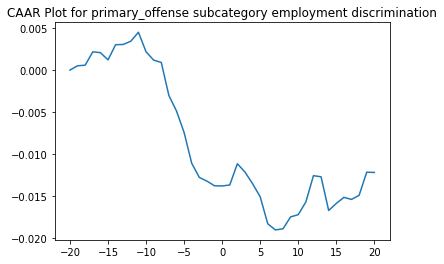

          ARR      CAAR        sd    t_stat   p_value
-20  0.000008  0.000008  0.013903  0.006760  0.994616
-19  0.000512  0.000520  0.020312  0.306995  0.759294
-18  0.000070  0.000589  0.024445  0.289355  0.772729
-17  0.001584  0.002173  0.029217  0.892611  0.373565
-16 -0.000088  0.002085  0.034039  0.735096  0.463485
-15 -0.000865  0.001220  0.037215  0.393359  0.694640
-14  0.001807  0.003026  0.041978  0.865155  0.388403
-13  0.000025  0.003051  0.042055  0.870602  0.385431
-12  0.000391  0.003442  0.044635  0.925400  0.356317
-11  0.001063  0.004505  0.047327  1.142269  0.255251
-10 -0.002323  0.002182  0.051291  0.510514  0.610478
-9  -0.000991  0.001192  0.061935  0.230864  0.817750
-8  -0.000274  0.000917  0.057354  0.191958  0.848048
-7  -0.003928 -0.003010  0.065740 -0.549507  0.583515
-6  -0.001840 -0.004850  0.072060 -0.807732  0.420586
-5  -0.002554 -0.007404  0.078779 -1.127816  0.261286
-4  -0.003656 -0.011060  0.076552 -1.733681  0.085130
-3  -0.001687 -0.012747  0.0

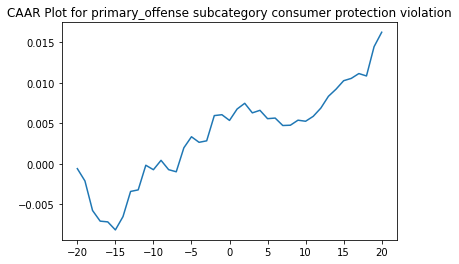

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000604 -0.000604  0.020301 -0.328866  0.742826
-19 -0.001525 -0.002130  0.030208 -0.778723  0.437663
-18 -0.003654 -0.005783  0.035950 -1.776898  0.078098
-17 -0.001317 -0.007100  0.038411 -2.041687  0.043357
-16 -0.000093 -0.007193  0.041169 -1.929828  0.055969
-15 -0.000993 -0.008186  0.039087 -2.313278  0.022396
-14  0.001644 -0.006542  0.039607 -1.824477  0.070547
-13  0.003117 -0.003426  0.039270 -0.963495  0.337221
-12  0.000191 -0.003235  0.041640 -0.858070  0.392551
-11  0.003049 -0.000186  0.044890 -0.045720  0.963609
-10 -0.000553 -0.000738  0.050534 -0.161383  0.872061
-9   0.001160  0.000422  0.047012  0.099075  0.921243
-8  -0.001154 -0.000732  0.047823 -0.169155  0.865958
-7  -0.000262 -0.000994  0.053601 -0.204811  0.838064
-6   0.002964  0.001970  0.054097  0.402298  0.688175
-5   0.001368  0.003339  0.058548  0.629840  0.529987
-4  -0.000689  0.002650  0.061579  0.475297  0.635432
-3   0.000185  0.002835  0.0

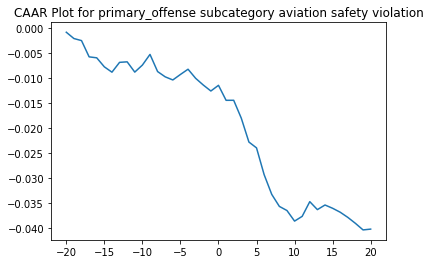

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000855 -0.000855  0.014211 -0.639350  0.523901
-19 -0.001258 -0.002112  0.017233 -1.302940  0.195268
-18 -0.000415 -0.002528  0.018553 -1.448241  0.150343
-17 -0.003253 -0.005780  0.034544 -1.778698  0.078002
-16 -0.000193 -0.005973  0.041107 -1.544699  0.125240
-15 -0.001804 -0.007778  0.043133 -1.916832  0.057807
-14 -0.001070 -0.008848  0.046611 -2.017939  0.045988
-13  0.001968 -0.006880  0.038298 -1.909665  0.058734
-12  0.000105 -0.006775  0.037102 -1.941221  0.054744
-11 -0.002056 -0.008831  0.038685 -2.426649  0.016834
-10  0.001404 -0.007427  0.040478 -1.950447  0.053621
-9   0.002136 -0.005291  0.044322 -1.269066  0.207049
-8  -0.003434 -0.008726  0.044624 -2.078578  0.039940
-7  -0.001054 -0.009779  0.047485 -2.189223  0.030655
-6  -0.000625 -0.010404  0.050973 -2.169774  0.032137
-5   0.001101 -0.009303  0.054673 -1.808789  0.073167
-4   0.001048 -0.008255  0.057843 -1.517040  0.132074
-3  -0.001821 -0.010076  0.0

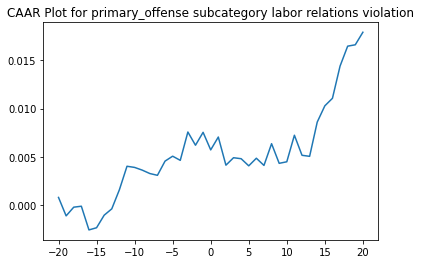

          ARR      CAAR        sd    t_stat   p_value
-20  0.000797  0.000797  0.009025  0.794411  0.429306
-19 -0.001910 -0.001113  0.014350 -0.698321  0.487002
-18  0.000900 -0.000213  0.018324 -0.104702  0.916875
-17  0.000100 -0.000114  0.018758 -0.054480  0.956688
-16 -0.002455 -0.002569  0.029051 -0.795793  0.428507
-15  0.000225 -0.002344  0.034716 -0.607566  0.545196
-14  0.001300 -0.001043  0.039197 -0.239585  0.811265
-13  0.000658 -0.000385  0.040417 -0.085823  0.931822
-12  0.001979  0.001593  0.045466  0.315373  0.753299
-11  0.002434  0.004027  0.037076  0.977579  0.331230
-10 -0.000120  0.003907  0.035713  0.984677  0.327752
-9  -0.000280  0.003627  0.032591  1.001591  0.319561
-8  -0.000354  0.003273  0.031112  0.946887  0.346548
-7  -0.000184  0.003089  0.033570  0.828232  0.410003
-6   0.001470  0.004560  0.036327  1.129689  0.261983
-5   0.000510  0.005070  0.036409  1.253212  0.213779
-4  -0.000430  0.004639  0.039814  1.048724  0.297463
-3   0.002936  0.007575  0.0

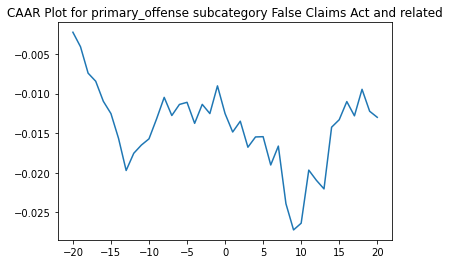

          ARR      CAAR        sd    t_stat   p_value
-20 -0.002269 -0.002269  0.015903 -1.167939  0.247033
-19 -0.001831 -0.004100  0.023816 -1.409050  0.163515
-18 -0.003333 -0.007432  0.029047 -2.094405  0.040067
-17 -0.001022 -0.008455  0.025739 -2.688776  0.009070
-16 -0.002526 -0.010981  0.033761 -2.662264  0.009739
-15 -0.001554 -0.012534  0.036716 -2.794392  0.006800
-14 -0.003134 -0.015668  0.045126 -2.842061  0.005958
-13 -0.004045 -0.019713  0.056674 -2.847135  0.005874
-12  0.002173 -0.017540  0.058248 -2.464887  0.016316
-11  0.001034 -0.016506  0.063929 -2.113438  0.038348
-10  0.000785 -0.015721  0.064821 -1.985194  0.051281
-9   0.002522 -0.013199  0.062987 -1.715301  0.090982
-8   0.002713 -0.010487  0.062362 -1.376451  0.173334
-7  -0.002291 -0.012777  0.065019 -1.608555  0.112487
-6   0.001397 -0.011380  0.082167 -1.133667  0.261036
-5   0.000269 -0.011111  0.080430 -1.130812  0.262227
-4  -0.002653 -0.013764  0.088055 -1.279495  0.205202
-3   0.002396 -0.011369  0.0

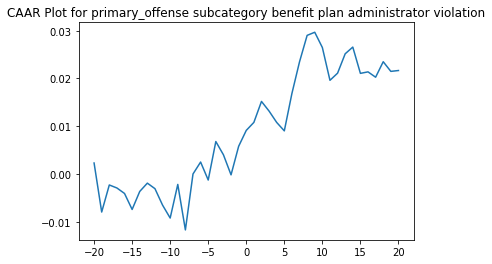

          ARR      CAAR        sd    t_stat   p_value
-20  0.002292  0.002292  0.013835  1.086580  0.283420
-19 -0.010272 -0.007980  0.028259 -1.851730  0.071103
-18  0.005669 -0.002311  0.034621 -0.437801  0.663774
-17 -0.000629 -0.002941  0.031097 -0.620069  0.538563
-16 -0.001149 -0.004089  0.034484 -0.777611  0.441157
-15 -0.003351 -0.007440  0.043755 -1.115083  0.271155
-14  0.003773 -0.003667  0.049280 -0.488006  0.628083
-13  0.001741 -0.001927  0.047201 -0.267681  0.790255
-12 -0.001156 -0.003082  0.043662 -0.462925  0.645808
-11 -0.003449 -0.006531  0.053054 -0.807288  0.424049
-10 -0.002708 -0.009239  0.057773 -1.048714  0.300307
-9   0.007044 -0.002195  0.075947 -0.189518  0.850600
-8  -0.009532 -0.011727  0.081835 -0.939690  0.352750
-7   0.011718 -0.000009  0.072945 -0.000823  0.999347
-6   0.002504  0.002495  0.074303  0.220153  0.826819
-5  -0.003771 -0.001277  0.074285 -0.112704  0.910802
-4   0.008069  0.006792  0.077056  0.578009  0.566344
-3  -0.002778  0.004014  0.0

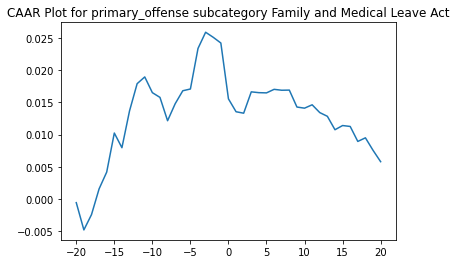

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000540 -0.000540  0.009874 -0.304723  0.762681
-19 -0.004224 -0.004764  0.017862 -1.485037  0.147967
-18  0.002367 -0.002397  0.020657 -0.646090  0.523133
-17  0.003992  0.001595  0.021364  0.415640  0.680632
-16  0.002602  0.004197  0.029438  0.793796  0.433548
-15  0.006050  0.010247  0.027558  2.070212  0.047136
-14 -0.002274  0.007973  0.039766  1.116282  0.273163
-13  0.005704  0.013677  0.041929  1.816187  0.079347
-12  0.004217  0.017894  0.041175  2.419718  0.021802
-11  0.001045  0.018939  0.049790  2.117897  0.042581
-10 -0.002437  0.016502  0.052057  1.764997  0.087744
-9  -0.000734  0.015769  0.047755  1.838464  0.075914
-8  -0.003614  0.012154  0.046500  1.455285  0.155976
-7   0.002634  0.014788  0.053949  1.526233  0.137427
-6   0.002008  0.016796  0.056446  1.656755  0.107993
-5   0.000273  0.017069  0.064338  1.477167  0.150053
-4   0.006286  0.023356  0.065460  1.986539  0.056175
-3   0.002506  0.025862  0.0

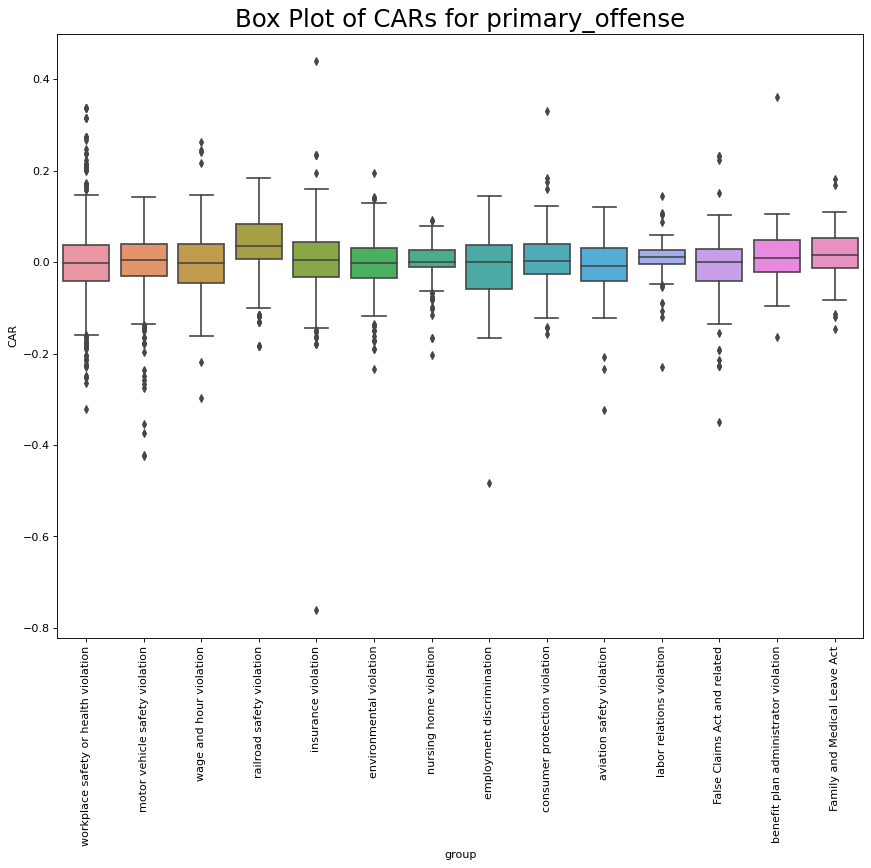

In [ ]:
a = CAAR_by_category(df, events, 'primary_offense',\
                     cat_name='Different Primary Offence Groups', cat_members=primary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
CAR FOR Different Secondary Offence Groups GROUP Fair Labor Standards Act
We found AR for 619 events
AR.shape[1] is 619


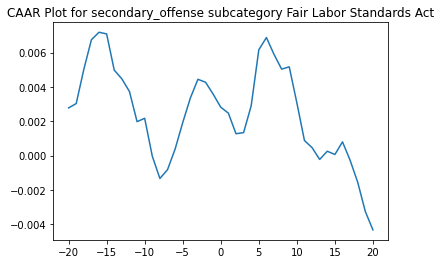

          ARR      CAAR        sd    t_stat       p_value
-20  0.002776  0.002776  0.013473  5.125781  3.968202e-07
-19  0.000250  0.003026  0.019886  3.786091  1.679620e-04
-18  0.001984  0.005011  0.023255  5.360674  1.172424e-07
-17  0.001734  0.006745  0.028248  5.940739  4.738843e-09
-16  0.000435  0.007180  0.034903  5.117858  4.131430e-07
-15 -0.000098  0.007082  0.037545  4.692868  3.319812e-06
-14 -0.002106  0.004976  0.039748  3.114653  1.926865e-03
-13 -0.000510  0.004466  0.043037  2.581848  1.005635e-02
-12 -0.000736  0.003730  0.046598  1.991801  4.683248e-02
-11 -0.001755  0.001976  0.047061  1.044421  2.966989e-01
-10  0.000194  0.002170  0.047161  1.144751  2.527556e-01
-9  -0.002202 -0.000032  0.047757 -0.016874  9.865427e-01
-8  -0.001299 -0.001332  0.046507 -0.712510  4.764182e-01
-7   0.000508 -0.000823  0.045131 -0.453966  6.500129e-01
-6   0.001203  0.000379  0.046978  0.200859  8.408746e-01
-5   0.001540  0.001919  0.048220  0.990115  3.225054e-01
-4   0.001427 

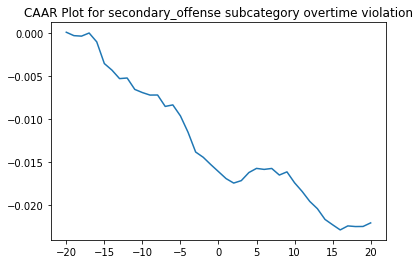

          ARR      CAAR        sd    t_stat   p_value
-20  0.000072  0.000072  0.014283  0.099055  0.921146
-19 -0.000394 -0.000323  0.022008 -0.290017  0.771957
-18 -0.000056 -0.000379  0.025371 -0.295405  0.767842
-17  0.000362 -0.000017  0.028418 -0.011903  0.990509
-16 -0.001025 -0.001042  0.031497 -0.654186  0.513377
-15 -0.002514 -0.003556  0.034911 -2.014049  0.044691
-14 -0.000762 -0.004318  0.036918 -2.312844  0.021251
-13 -0.000984 -0.005302  0.040061 -2.616980  0.009216
-12  0.000072 -0.005230  0.042228 -2.449133  0.014759
-11 -0.001321 -0.006552  0.044583 -2.905842  0.003872
-10 -0.000366 -0.006918  0.046138 -2.964712  0.003216
-9  -0.000291 -0.007209  0.048703 -2.926889  0.003624
-8   0.000008 -0.007201  0.051845 -2.746616  0.006300
-7  -0.001323 -0.008524  0.054916 -3.069316  0.002296
-6   0.000176 -0.008348  0.058684 -2.812760  0.005160
-5  -0.001275 -0.009622  0.061595 -3.089088  0.002152
-4  -0.001895 -0.011517  0.064279 -3.542911  0.000444
-3  -0.002290 -0.013807  0.0

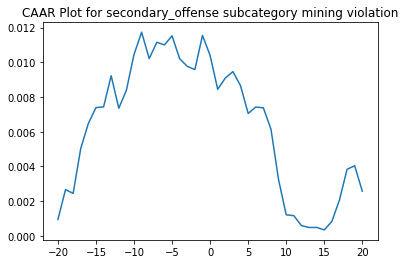

          ARR      CAAR        sd    t_stat   p_value
-20  0.000945  0.000945  0.020188  0.828132  0.408229
-19  0.001720  0.002665  0.029164  1.616386  0.107022
-18 -0.000219  0.002445  0.036564  1.183094  0.237672
-17  0.002591  0.005036  0.038688  2.303040  0.021934
-16  0.001436  0.006472  0.042642  2.685338  0.007633
-15  0.000916  0.007388  0.046172  2.831013  0.004941
-14  0.000039  0.007427  0.050249  2.615001  0.009356
-13  0.001795  0.009222  0.054437  2.997104  0.002944
-12 -0.001871  0.007350  0.056495  2.301864  0.022001
-11  0.001038  0.008388  0.059872  2.478610  0.013718
-10  0.002059  0.010447  0.063531  2.909166  0.003884
-9   0.001281  0.011728  0.066835  3.104443  0.002081
-8  -0.001516  0.010212  0.069224  2.609887  0.009494
-7   0.000938  0.011149  0.072875  2.706742  0.007169
-6  -0.000151  0.010999  0.077152  2.522075  0.012164
-5   0.000522  0.011521  0.082324  2.475821  0.013823
-4  -0.001318  0.010202  0.084624  2.132947  0.033709
-3  -0.000437  0.009765  0.0

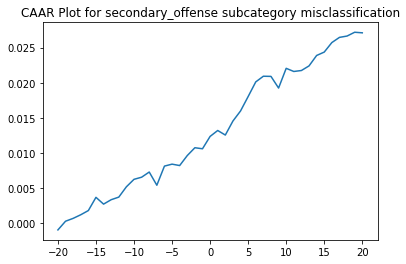

          ARR      CAAR        sd    t_stat       p_value
-20 -0.000950 -0.000950  0.011187 -1.036242  3.017794e-01
-19  0.001238  0.000288  0.016850  0.208609  8.350399e-01
-18  0.000406  0.000694  0.024565  0.344829  7.307128e-01
-17  0.000514  0.001208  0.029543  0.498989  6.185282e-01
-16  0.000598  0.001806  0.030172  0.730661  4.661413e-01
-15  0.001882  0.003688  0.031107  1.447354  1.499127e-01
-14 -0.000965  0.002723  0.032021  1.038050  3.009400e-01
-13  0.000628  0.003352  0.031412  1.302362  1.948156e-01
-12  0.000369  0.003721  0.033356  1.361697  1.753629e-01
-11  0.001470  0.005191  0.035082  1.806274  7.290733e-02
-10  0.001061  0.006253  0.033779  2.259540  2.530999e-02
-9   0.000301  0.006554  0.037427  2.137546  3.419643e-02
-8   0.000736  0.007290  0.038434  2.315449  2.196225e-02
-7  -0.001878  0.005412  0.042347  1.560077  1.208775e-01
-6   0.002723  0.008135  0.043008  2.309002  2.232735e-02
-5   0.000278  0.008414  0.044867  2.289067  2.349017e-02
-4  -0.000200 

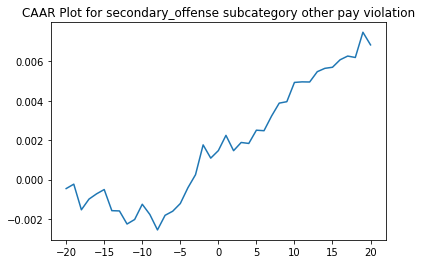

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000459 -0.000459  0.010849 -0.510998  0.610130
-19  0.000224 -0.000235  0.014988 -0.189612  0.849879
-18 -0.001300 -0.001535  0.017142 -1.082060  0.281022
-17  0.000542 -0.000993  0.019784 -0.606434  0.545175
-16  0.000268 -0.000725  0.021365 -0.409915  0.682473
-15  0.000217 -0.000508  0.023214 -0.264314  0.791913
-14 -0.001072 -0.001579  0.024865 -0.767523  0.444019
-13 -0.000014 -0.001593  0.028807 -0.668285  0.505014
-12 -0.000664 -0.002257  0.030483 -0.894712  0.372424
-11  0.000229 -0.002028  0.032724 -0.748855  0.455158
-10  0.000775 -0.001254  0.033290 -0.455007  0.649785
-9  -0.000521 -0.001775  0.035248 -0.608388  0.543882
-8  -0.000782 -0.002556  0.034997 -0.882593  0.378917
-7   0.000741 -0.001815  0.036460 -0.601482  0.548458
-6   0.000207 -0.001608  0.039141 -0.496472  0.620313
-5   0.000390 -0.001218  0.040551 -0.362906  0.717204
-4   0.000802 -0.000416  0.041990 -0.119807  0.904802
-3   0.000662  0.000246  0.0

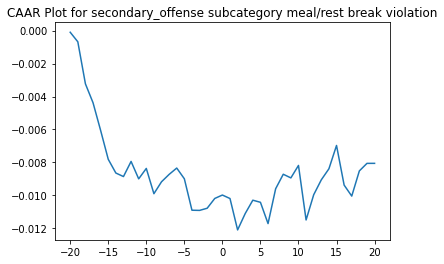

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000100 -0.000100  0.011365 -0.087086  0.930785
-19 -0.000580 -0.000680  0.016349 -0.409745  0.682906
-18 -0.002552 -0.003233  0.019521 -1.630898  0.106188
-17 -0.001147 -0.004379  0.021936 -1.966112  0.052174
-16 -0.001684 -0.006063  0.024541 -2.433162  0.016819
-15 -0.001748 -0.007811  0.027304 -2.817638  0.005874
-14 -0.000833 -0.008644  0.032077 -2.653963  0.009312
-13 -0.000214 -0.008858  0.032494 -2.684758  0.008551
-12  0.000918 -0.007940  0.034579 -2.261555  0.025981
-11 -0.001057 -0.008997  0.038875 -2.279340  0.024861
-10  0.000632 -0.008365  0.040294 -2.044661  0.043626
-9  -0.001533 -0.009898  0.042286 -2.305402  0.023297
-8   0.000723 -0.009175  0.045289 -1.995250  0.048850
-7   0.000448 -0.008727  0.048322 -1.778700  0.078454
-6   0.000385 -0.008342  0.049327 -1.665629  0.099047
-5  -0.000650 -0.008992  0.050143 -1.766216  0.080538
-4  -0.001908 -0.010900  0.050826 -2.112216  0.037264
-3  -0.000011 -0.010911  0.0

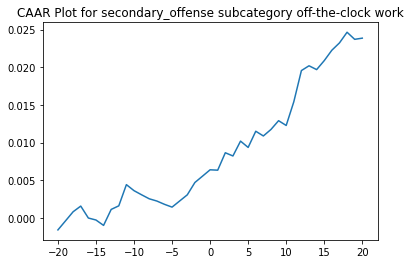

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001583 -0.001583  0.010509 -1.436899  0.154214
-19  0.001204 -0.000379  0.018576 -0.194753  0.846025
-18  0.001209  0.000830  0.022995  0.344152  0.731535
-17  0.000750  0.001579  0.024648  0.611153  0.542639
-16 -0.001584 -0.000004  0.036696 -0.001157  0.999080
-15 -0.000263 -0.000268  0.039784 -0.064157  0.948988
-14 -0.000716 -0.000983  0.045156 -0.207705  0.835928
-13  0.002121  0.001138  0.048883  0.222044  0.824783
-12  0.000477  0.001614  0.048355  0.318474  0.750863
-11  0.002812  0.004426  0.051913  0.813398  0.418136
-10 -0.000799  0.003628  0.053306  0.649219  0.517850
-9  -0.000550  0.003078  0.053279  0.551066  0.582954
-8  -0.000529  0.002549  0.055219  0.440374  0.660722
-7  -0.000299  0.002250  0.059292  0.362063  0.718154
-6  -0.000435  0.001815  0.061781  0.280312  0.779881
-5  -0.000373  0.001442  0.061679  0.223059  0.823995
-4   0.000816  0.002258  0.064173  0.335724  0.737860
-3   0.000814  0.003072  0.0

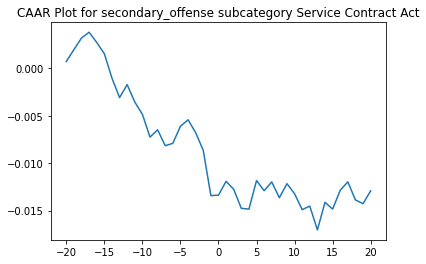

          ARR      CAAR        sd    t_stat   p_value
-20  0.000710  0.000710  0.011175  0.488272  0.627198
-19  0.001255  0.001965  0.014794  1.020267  0.311839
-18  0.001222  0.003187  0.023695  1.033019  0.305883
-17  0.000609  0.003796  0.028248  1.032084  0.306317
-16 -0.001073  0.002723  0.027959  0.748008  0.457478
-15 -0.001190  0.001533  0.031367  0.375404  0.708729
-14 -0.002565 -0.001032  0.036753 -0.215712  0.829969
-13 -0.002060 -0.003093  0.039491 -0.601527  0.549833
-12  0.001370 -0.001723  0.038448 -0.344231  0.731917
-11 -0.001830 -0.003554  0.044854 -0.608532  0.545211
-10 -0.001299 -0.004852  0.045693 -0.815712  0.418002
-9  -0.002400 -0.007253  0.046979 -1.185818  0.240530
-8   0.000770 -0.006483  0.044817 -1.111140  0.271093
-7  -0.001678 -0.008161  0.044533 -1.407624  0.164580
-6   0.000253 -0.007908  0.050107 -1.212284  0.230319
-5   0.001799 -0.006109  0.048365 -0.970176  0.335987
-4   0.000681 -0.005427  0.046280 -0.900778  0.371431
-3  -0.001355 -0.006782  0.0

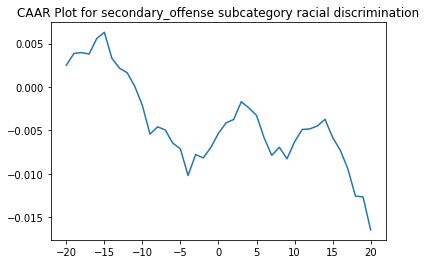

          ARR      CAAR        sd    t_stat   p_value
-20  0.002497  0.002497  0.013741  1.371741  0.175615
-19  0.001359  0.003856  0.017692  1.645351  0.105500
-18  0.000104  0.003960  0.018154  1.646739  0.105213
-17 -0.000169  0.003790  0.019182  1.491743  0.141379
-16  0.001781  0.005571  0.027156  1.548958  0.127025
-15  0.000730  0.006301  0.025932  1.834501  0.071894
-14 -0.003012  0.003289  0.027920  0.889443  0.377570
-13 -0.001129  0.002160  0.031416  0.519137  0.605711
-12 -0.000525  0.001635  0.035632  0.346469  0.730289
-11 -0.001563  0.000072  0.035786  0.015274  0.987868
-10 -0.002200 -0.002127  0.037973 -0.422940  0.673959
-9  -0.003312 -0.005439  0.038993 -1.053137  0.296801
-8   0.000852 -0.004587  0.040720 -0.850546  0.398643
-7  -0.000364 -0.004952  0.042429 -0.881149  0.382004
-6  -0.001518 -0.006470  0.046409 -1.052525  0.297079
-5  -0.000668 -0.007138  0.046390 -1.161729  0.250273
-4  -0.003057 -0.010195  0.048882 -1.574615  0.120979
-3   0.002401 -0.007794  0.0

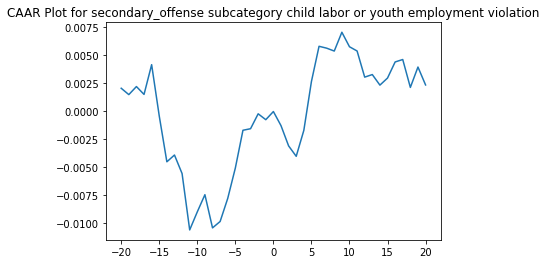

          ARR      CAAR        sd    t_stat   p_value
-20  0.002050  0.002050  0.010280  1.452085  0.152485
-19 -0.000566  0.001484  0.016158  0.668650  0.506676
-18  0.000718  0.002202  0.020652  0.776282  0.441099
-17 -0.000702  0.001500  0.027192  0.401566  0.689649
-16  0.002653  0.004153  0.031481  0.960308  0.341344
-15 -0.004577 -0.000424  0.036176 -0.085364  0.932300
-14 -0.004082 -0.004506  0.043041 -0.762195  0.449387
-13  0.000604 -0.003902  0.039927 -0.711482  0.479966
-12 -0.001652 -0.005554  0.044401 -0.910651  0.366681
-11 -0.005025 -0.010579  0.050825 -1.515259  0.135762
-10  0.001609 -0.008969  0.051779 -1.261043  0.212922
-9   0.001531 -0.007438  0.049787 -1.087638  0.281771
-8  -0.002959 -0.010397  0.055467 -1.364631  0.178246
-7   0.000570 -0.009827  0.054629 -1.309642  0.196074
-6   0.002060 -0.007768  0.048779 -1.159329  0.251618
-5   0.002708 -0.005060  0.052241 -0.705112  0.483887
-4   0.003365 -0.001694  0.052210 -0.236268  0.814153
-3   0.000138 -0.001556  0.0

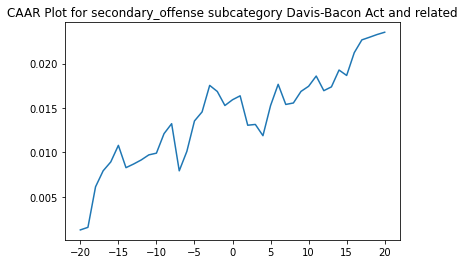

          ARR      CAAR        sd    t_stat   p_value
-20  0.001286  0.001286  0.010764  0.774104  0.443311
-19  0.000290  0.001576  0.017457  0.585130  0.561667
-18  0.004563  0.006139  0.018847  2.110968  0.040918
-17  0.001801  0.007940  0.018747  2.745043  0.008940
-16  0.000998  0.008938  0.021339  2.714582  0.009664
-15  0.001865  0.010803  0.025178  2.780759  0.008154
-14 -0.002510  0.008294  0.026562  2.023488  0.049574
-13  0.000409  0.008702  0.027439  2.055347  0.046253
-12  0.000458  0.009161  0.025123  2.363099  0.022947
-11  0.000571  0.009731  0.026509  2.379083  0.022094
-10  0.000194  0.009925  0.029680  2.167209  0.036080
-9   0.002194  0.012120  0.029873  2.629307  0.011991
-8   0.001123  0.013243  0.031499  2.724574  0.009421
-7  -0.005304  0.007938  0.032470  1.584400  0.120787
-6   0.002188  0.010126  0.033729  1.945619  0.058578
-5   0.003424  0.013550  0.036796  2.386515  0.021707
-4   0.001018  0.014568  0.037868  2.493207  0.016789
-3   0.002985  0.017553  0.0

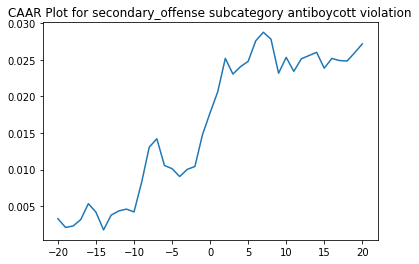

          ARR      CAAR        sd    t_stat   p_value
-20  0.003282  0.003282  0.011207  1.630450  0.113462
-19 -0.001188  0.002093  0.016126  0.722792  0.475405
-18  0.000196  0.002289  0.025381  0.502149  0.619228
-17  0.000874  0.003163  0.028562  0.616511  0.542208
-16  0.002178  0.005341  0.029311  1.014549  0.318434
-15 -0.001169  0.004172  0.031004  0.749244  0.459545
-14 -0.002420  0.001753  0.038067  0.256348  0.799432
-13  0.002026  0.003779  0.037389  0.562683  0.577832
-12  0.000570  0.004349  0.041189  0.587815  0.561055
-11  0.000247  0.004595  0.039957  0.640293  0.526843
-10 -0.000385  0.004210  0.038219  0.613312  0.544293
-9   0.004036  0.008246  0.037593  1.221219  0.231514
-8   0.004804  0.013049  0.036735  1.977846  0.057195
-7   0.001157  0.014207  0.038054  2.078616  0.046303
-6  -0.003652  0.010555  0.040797  1.440420  0.160104
-5  -0.000434  0.010120  0.041860  1.346097  0.188356
-4  -0.001076  0.009044  0.041671  1.208374  0.236342
-3   0.000979  0.010023  0.0

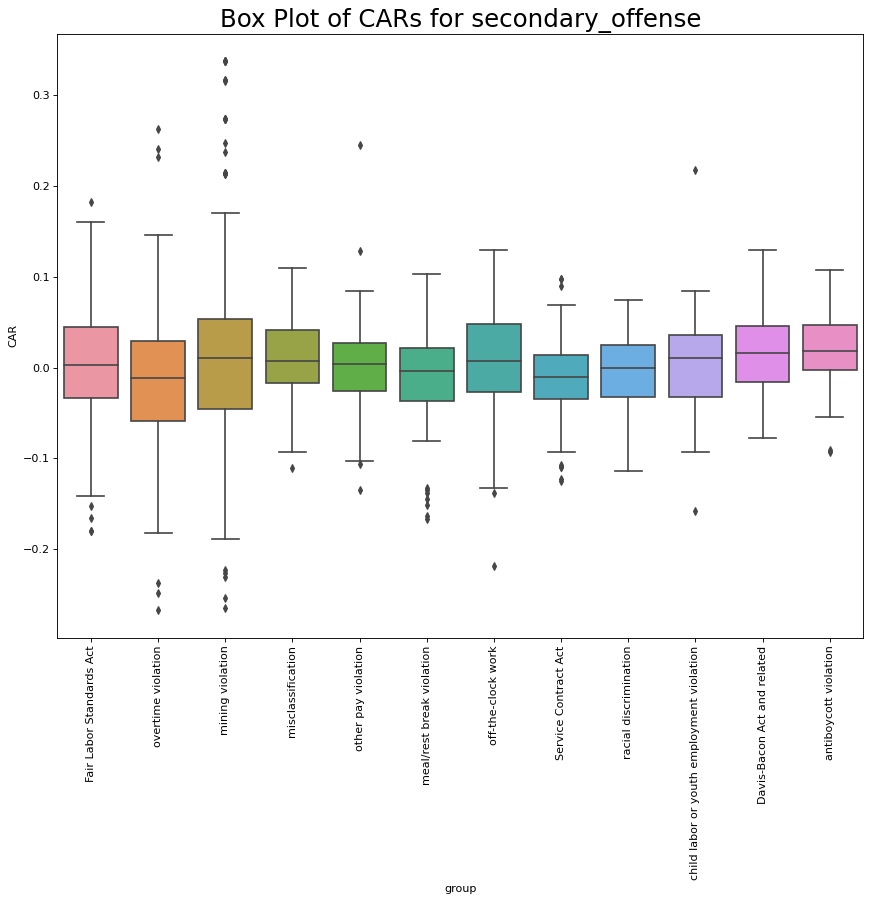

In [ ]:
a = CAAR_by_category(df, events, 'secondary_offense',\
                     cat_name='Different Secondary Offence Groups', cat_members=secondary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 119 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Agency Groups GROUP OSHA
We found AR for 1435 events
AR.shape[1] is 1435


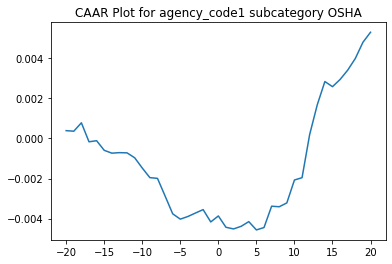

          ARR      CAAR        sd    t_stat   p_value
-20  0.000388  0.000388  0.014104  1.042602  0.297309
-19 -0.000028  0.000360  0.019685  0.693370  0.488190
-18  0.000419  0.000779  0.023909  1.234503  0.217218
-17 -0.000947 -0.000168  0.027180 -0.234013  0.815008
-16  0.000055 -0.000113  0.030140 -0.142512  0.886696
-15 -0.000480 -0.000593  0.034610 -0.648979  0.516456
-14 -0.000142 -0.000735  0.037581 -0.740866  0.458896
-13  0.000025 -0.000710  0.039911 -0.673513  0.500729
-12 -0.000010 -0.000720  0.041552 -0.656448  0.511642
-11 -0.000244 -0.000964  0.043543 -0.838799  0.401722
-10 -0.000513 -0.001477  0.045392 -1.232690  0.217893
-9  -0.000479 -0.001956  0.047292 -1.567079  0.117317
-8  -0.000036 -0.001992  0.048648 -1.551219  0.121070
-7  -0.000880 -0.002872  0.050824 -2.140583  0.032476
-6  -0.000890 -0.003762  0.053157 -2.680587  0.007434
-5  -0.000266 -0.004027  0.054022 -2.823971  0.004809
-4   0.000132 -0.003895  0.055394 -2.663458  0.007821
-3   0.000174 -0.003721  0.0

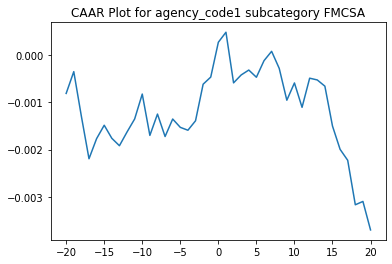

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000816 -0.000816  0.012567 -2.125273  0.033792
-19  0.000460 -0.000356  0.018335 -0.635750  0.525075
-18 -0.000944 -0.001300  0.023154 -1.838256  0.066301
-17 -0.000895 -0.002195  0.027595 -2.603904  0.009344
-16  0.000425 -0.001770  0.030238 -1.916518  0.055565
-15  0.000283 -0.001487  0.032927 -1.478991  0.139437
-14 -0.000276 -0.001763  0.035902 -1.607958  0.108139
-13 -0.000156 -0.001920  0.038796 -1.619962  0.105535
-12  0.000290 -0.001630  0.041190 -1.295272  0.195506
-11  0.000274 -0.001355  0.042734 -1.038268  0.299379
-10  0.000526 -0.000829  0.042907 -0.632817  0.526988
-9  -0.000873 -0.001702  0.044535 -1.251213  0.211130
-8   0.000450 -0.001252  0.045801 -0.894779  0.371106
-7  -0.000474 -0.001726  0.048672 -1.160758  0.245999
-6   0.000369 -0.001356  0.050649 -0.876693  0.380850
-5  -0.000176 -0.001532  0.053465 -0.938188  0.348359
-4  -0.000061 -0.001593  0.055683 -0.936527  0.349213
-3   0.000199 -0.001393  0.0

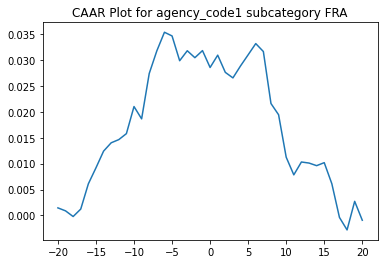

          ARR      CAAR        sd     t_stat       p_value
-20  0.001463  0.001463  0.007259   5.941331  4.089471e-09
-19 -0.000574  0.000889  0.009686   2.706703  6.928937e-03
-18 -0.001095 -0.000205  0.011367  -0.531981  5.948751e-01
-17  0.001438  0.001233  0.017421   2.085789  3.728924e-02
-16  0.004866  0.006099  0.017558  10.239538  2.619794e-23
-15  0.003087  0.009186  0.024645  10.987516  2.189607e-26
-14  0.003219  0.012405  0.025302  14.452274  1.398485e-42
-13  0.001609  0.014013  0.026494  15.592004  1.658305e-48
-12  0.000613  0.014626  0.026511  16.263277  4.099093e-52
-11  0.001152  0.015779  0.028958  16.062410  5.018587e-51
-10  0.005222  0.021000  0.033676  18.382933  5.382066e-64
-9  -0.002372  0.018628  0.034546  15.895539  3.970522e-50
-8   0.008745  0.027373  0.041640  19.378665  8.467417e-70
-7   0.004371  0.031744  0.043563  21.481047  2.029457e-82
-6   0.003586  0.035330  0.043738  23.811659  7.549313e-97
-5  -0.000713  0.034616  0.045780  22.289959  2.202381e-

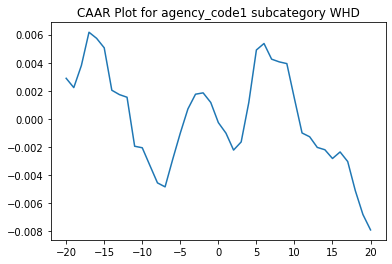

          ARR      CAAR        sd    t_stat   p_value
-20  0.002887  0.002887  0.014979  4.732874  0.000003
-19 -0.000664  0.002223  0.022093  2.471187  0.013742
-18  0.001576  0.003799  0.026796  3.481653  0.000534
-17  0.002367  0.006167  0.030995  4.885585  0.000001
-16 -0.000434  0.005733  0.037308  3.773306  0.000177
-15 -0.000675  0.005058  0.040255  3.085257  0.002127
-14 -0.003022  0.002036  0.041953  1.191488  0.233932
-13 -0.000311  0.001725  0.044846  0.944410  0.345339
-12 -0.000188  0.001537  0.048828  0.773040  0.439802
-11 -0.003490 -0.001953  0.051435 -0.932236  0.351588
-10 -0.000108 -0.002061  0.051804 -0.976747  0.329087
-9  -0.001256 -0.003317  0.051965 -1.567369  0.117554
-8  -0.001245 -0.004562  0.051856 -2.160369  0.031138
-7  -0.000284 -0.004846  0.052048 -2.286180  0.022590
-6   0.001959 -0.002886  0.053467 -1.325652  0.185458
-5   0.001872 -0.001014  0.056858 -0.438102  0.661470
-4   0.001719  0.000704  0.058101  0.297729  0.766013
-3   0.001049  0.001754  0.0

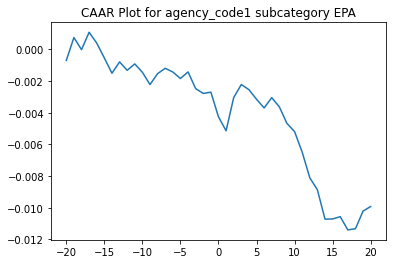

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000697 -0.000697  0.011007 -1.038408  0.300016
-19  0.001445  0.000748  0.018446  0.665361  0.506392
-18 -0.000765 -0.000017  0.022864 -0.012259  0.990228
-17  0.001099  0.001082  0.025513  0.695776  0.487172
-16 -0.000686  0.000397  0.026739  0.243232  0.808012
-15 -0.000937 -0.000541  0.033820 -0.262237  0.793340
-14 -0.000966 -0.001506  0.036557 -0.675831  0.499731
-13  0.000715 -0.000792  0.038807 -0.334561  0.738218
-12 -0.000529 -0.001321  0.041334 -0.524170  0.600593
-11  0.000593 -0.000728  0.044104 -0.270561  0.786937
-10 -0.000530 -0.001257  0.045982 -0.448380  0.654242
-9  -0.000963 -0.002220  0.048909 -0.744487  0.457234
-8   0.000689 -0.001531  0.052257 -0.480563  0.631219
-7   0.000336 -0.001195  0.053597 -0.365748  0.714842
-6   0.000072 -0.001123  0.053074 -0.347097  0.728791
-5  -0.000411 -0.001534  0.052455 -0.479552  0.631937
-4   0.000416 -0.001118  0.050702 -0.361550  0.717973
-3  -0.001053 -0.002171  0.0

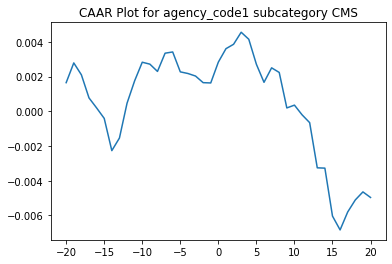

          ARR      CAAR        sd    t_stat   p_value
-20  0.001651  0.001651  0.011514  2.136553  0.033734
-19  0.001139  0.002790  0.016766  2.479007  0.013923
-18 -0.000686  0.002104  0.017751  1.765971  0.078781
-17 -0.001331  0.000773  0.020349  0.566094  0.571904
-16 -0.000578  0.000195  0.028092  0.103254  0.917855
-15 -0.000604 -0.000409  0.030260 -0.201301  0.840648
-14 -0.001859 -0.002268  0.035479 -0.952544  0.341862
-13  0.000726 -0.001542  0.037813 -0.607649  0.544044
-12  0.002008  0.000466  0.037113  0.187145  0.851719
-11  0.001294  0.001760  0.039357  0.666223  0.505964
-10  0.001070  0.002830  0.040258  1.047433  0.296044
-9  -0.000111  0.002719  0.041258  0.981990  0.327178
-8  -0.000420  0.002299  0.043447  0.788356  0.431333
-7   0.001052  0.003351  0.044859  1.113020  0.266909
-6   0.000071  0.003422  0.046750  1.090467  0.276695
-5  -0.001148  0.002274  0.046774  0.724313  0.469640
-4  -0.000094  0.002180  0.046099  0.704614  0.481793
-3  -0.000147  0.002033  0.0

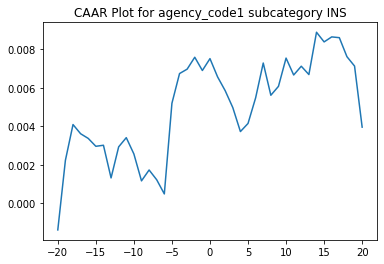

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001382 -0.001382  0.017923 -1.156507  0.248706
-19  0.003617  0.002236  0.021566  1.554895  0.121383
-18  0.001860  0.004096  0.024569  2.500611  0.013114
-17 -0.000478  0.003618  0.032751  1.657201  0.098879
-16 -0.000243  0.003376  0.034604  1.463226  0.144807
-15 -0.000410  0.002966  0.042000  1.059204  0.290648
-14  0.000054  0.003020  0.046707  0.969723  0.333230
-13 -0.001698  0.001321  0.047291  0.419118  0.675531
-12  0.001616  0.002937  0.047486  0.927790  0.354515
-11  0.000478  0.003415  0.049498  1.034802  0.301877
-10 -0.000847  0.002567  0.052317  0.736094  0.462444
-9  -0.001399  0.001169  0.054921  0.319146  0.749913
-8   0.000565  0.001734  0.061495  0.422910  0.672766
-7  -0.000509  0.001225  0.062629  0.293283  0.769578
-6  -0.000735  0.000489  0.071823  0.102211  0.918680
-5   0.004714  0.005203  0.066165  1.179652  0.239390
-4   0.001544  0.006747  0.070620  1.433143  0.153211
-3   0.000230  0.006977  0.0

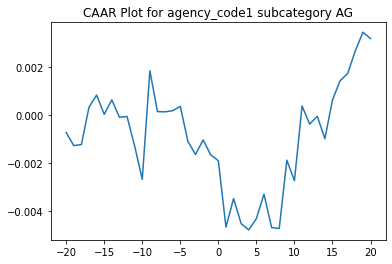

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000725 -0.000725  0.015996 -0.663245  0.507891
-19 -0.000542 -0.001267  0.023026 -0.804800  0.421832
-18  0.000041 -0.001226  0.025465 -0.704239  0.482053
-17  0.001556  0.000330  0.030594  0.157782  0.874778
-16  0.000505  0.000835  0.036705  0.332632  0.739739
-15 -0.000801  0.000034  0.036976  0.013302  0.989400
-14  0.000601  0.000634  0.041744  0.222244  0.824337
-13 -0.000722 -0.000088  0.047480 -0.026966  0.978512
-12  0.000031 -0.000057  0.045647 -0.018110  0.985568
-11 -0.001228 -0.001284  0.052398 -0.358492  0.720330
-10 -0.001388 -0.002673  0.057375 -0.681408  0.496354
-9   0.004521  0.001848  0.053770  0.502845  0.615593
-8  -0.001701  0.000147  0.054938  0.039131  0.968823
-7  -0.000010  0.000137  0.056293  0.035502  0.971712
-6   0.000050  0.000187  0.057820  0.047275  0.962338
-5   0.000174  0.000361  0.057732  0.091448  0.927223
-4  -0.001454 -0.001093  0.061740 -0.259068  0.795833
-3  -0.000544 -0.001637  0.0

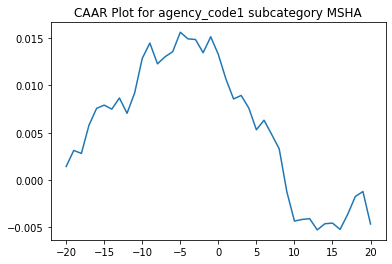

          ARR      CAAR        sd    t_stat   p_value
-20  0.001425  0.001425  0.022432  0.907410  0.365266
-19  0.001698  0.003123  0.032919  1.355165  0.176871
-18 -0.000316  0.002807  0.041998  0.954691  0.340869
-17  0.002991  0.005798  0.044157  1.875554  0.062152
-16  0.001780  0.007579  0.049502  2.186690  0.029908
-15  0.000336  0.007915  0.052859  2.138608  0.033662
-14 -0.000422  0.007493  0.058030  1.844137  0.066620
-13  0.001181  0.008674  0.062531  1.981214  0.048917
-12 -0.001621  0.007053  0.064529  1.561131  0.120051
-11  0.002150  0.009203  0.068055  1.931482  0.054816
-10  0.003659  0.012862  0.072071  2.549042  0.011541
-9   0.001620  0.014483  0.076610  2.700139  0.007516
-8  -0.002196  0.012287  0.080075  2.191582  0.029547
-7   0.000749  0.013036  0.084833  2.194709  0.029319
-6   0.000536  0.013571  0.089595  2.163495  0.031671
-5   0.002057  0.015628  0.096444  2.314482  0.021641
-4  -0.000696  0.014932  0.098370  2.168053  0.031318
-3  -0.000075  0.014857  0.1

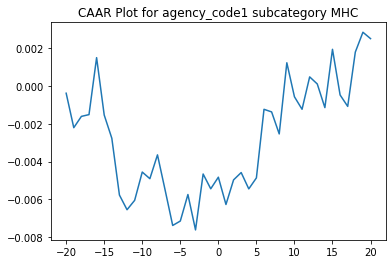

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000392 -0.000392  0.012056 -0.360845  0.718840
-19 -0.001818 -0.002211  0.019200 -1.276968  0.204039
-18  0.000596 -0.001615  0.028747 -0.623052  0.534414
-17  0.000094 -0.001521  0.031918 -0.528559  0.598071
-16  0.003006  0.001485  0.034429  0.478463  0.633177
-15 -0.003029 -0.001544  0.040388 -0.423991  0.672319
-14 -0.001225 -0.002769  0.042161 -0.728423  0.467751
-13 -0.002997 -0.005766  0.047500 -1.346232  0.180724
-12 -0.000774 -0.006540  0.048715 -1.488982  0.139073
-11  0.000495 -0.006045  0.050289 -1.333108  0.184980
-10  0.001493 -0.004552  0.050966 -0.990593  0.323845
-9  -0.000350 -0.004902  0.055078 -0.987099  0.325548
-8   0.001257 -0.003646  0.052110 -0.775884  0.439319
-7  -0.001848 -0.005494  0.053732 -1.133975  0.259028
-6  -0.001876 -0.007370  0.061721 -1.324371  0.187856
-5   0.000233 -0.007137  0.059624 -1.327546  0.186807
-4   0.001399 -0.005738  0.064183 -0.991486  0.323411
-3  -0.001868 -0.007606  0.0

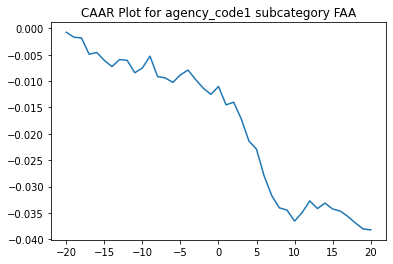

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000749 -0.000749  0.014000 -0.588197  0.557505
-19 -0.000945 -0.001693  0.017259 -1.079153  0.282684
-18 -0.000134 -0.001827  0.019336 -1.039505  0.300660
-17 -0.003084 -0.004911  0.034131 -1.582764  0.116107
-16  0.000318 -0.004593  0.040876 -1.236003  0.218871
-15 -0.001487 -0.006080  0.042833 -1.561375  0.121069
-14 -0.001179 -0.007259  0.046355 -1.722549  0.087546
-13  0.001333 -0.005926  0.038882 -1.676436  0.096256
-12 -0.000147 -0.006073  0.037701 -1.771796  0.078967
-11 -0.002359 -0.008432  0.039167 -2.367962  0.019485
-10  0.000911 -0.007520  0.041352 -2.000491  0.047705
-9   0.002231 -0.005289  0.044390 -1.310718  0.192456
-8  -0.003857 -0.009146  0.044919 -2.239782  0.026947
-7  -0.000254 -0.009400  0.047122 -2.194384  0.030134
-6  -0.000846 -0.010246  0.050866 -2.215828  0.028589
-5   0.001417 -0.008829  0.054083 -1.795761  0.075049
-4   0.000915 -0.007914  0.057174 -1.522639  0.130480
-3  -0.001796 -0.009710  0.0

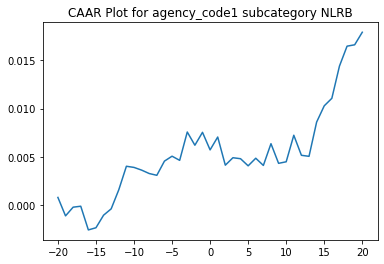

          ARR      CAAR        sd    t_stat   p_value
-20  0.000797  0.000797  0.009025  0.794411  0.429306
-19 -0.001910 -0.001113  0.014350 -0.698321  0.487002
-18  0.000900 -0.000213  0.018324 -0.104702  0.916875
-17  0.000100 -0.000114  0.018758 -0.054480  0.956688
-16 -0.002455 -0.002569  0.029051 -0.795793  0.428507
-15  0.000225 -0.002344  0.034716 -0.607566  0.545196
-14  0.001300 -0.001043  0.039197 -0.239585  0.811265
-13  0.000658 -0.000385  0.040417 -0.085823  0.931822
-12  0.001979  0.001593  0.045466  0.315373  0.753299
-11  0.002434  0.004027  0.037076  0.977579  0.331230
-10 -0.000120  0.003907  0.035713  0.984677  0.327752
-9  -0.000280  0.003627  0.032591  1.001591  0.319561
-8  -0.000354  0.003273  0.031112  0.946887  0.346548
-7  -0.000184  0.003089  0.033570  0.828232  0.410003
-6   0.001470  0.004560  0.036327  1.129689  0.261983
-5   0.000510  0.005070  0.036409  1.253212  0.213779
-4  -0.000430  0.004639  0.039814  1.048724  0.297463
-3   0.002936  0.007575  0.0

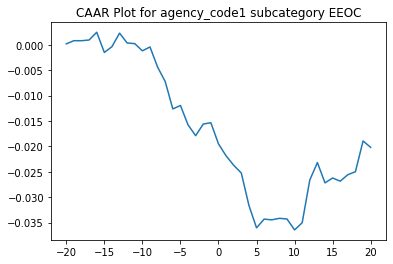

          ARR      CAAR        sd    t_stat   p_value
-20  0.000179  0.000179  0.012208  0.124340  0.901398
-19  0.000623  0.000802  0.015614  0.435566  0.664473
-18 -0.000003  0.000799  0.020540  0.329874  0.742467
-17  0.000141  0.000940  0.024108  0.330784  0.741782
-16  0.001525  0.002465  0.028355  0.737579  0.463201
-15 -0.003978 -0.001514  0.032134 -0.399697  0.690580
-14  0.001134 -0.000379  0.030801 -0.104463  0.917096
-13  0.002671  0.002292  0.033892  0.573735  0.567960
-12 -0.001945  0.000347  0.033359  0.088261  0.929917
-11 -0.000129  0.000218  0.036214  0.051133  0.959363
-10 -0.001412 -0.001194  0.038001 -0.266538  0.790597
-9   0.000763 -0.000430  0.043538 -0.083851  0.933411
-8  -0.003973 -0.004404  0.045200 -0.826689  0.411183
-7  -0.002844 -0.007248  0.045874 -1.340643  0.184310
-6  -0.005391 -0.012639  0.048986 -2.189236  0.031869
-5   0.000685 -0.011953  0.053759 -1.886671  0.063294
-4  -0.003817 -0.015770  0.057629 -2.322020  0.023105
-3  -0.002134 -0.017904  0.0

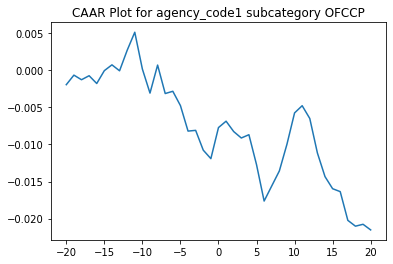

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001936 -0.001936  0.016426 -0.881811  0.381717
-19  0.001289 -0.000647  0.024124 -0.200593  0.841757
-18 -0.000622 -0.001268  0.026754 -0.354771  0.724118
-17  0.000541 -0.000727  0.027754 -0.196093  0.845260
-16 -0.001049 -0.001776  0.033569 -0.395994  0.693641
-15  0.001734 -0.000042  0.039255 -0.008085  0.993579
-14  0.000783  0.000741  0.047438  0.116853  0.907402
-13 -0.000804 -0.000063  0.047666 -0.009859  0.992169
-12  0.002763  0.002700  0.053685  0.376350  0.708105
-11  0.002438  0.005138  0.058312  0.659357  0.512418
-10 -0.004967  0.000171  0.063523  0.020167  0.983983
-9  -0.003241 -0.003070  0.079301 -0.289725  0.773116
-8   0.003779  0.000708  0.069455  0.076332  0.939432
-7  -0.003839 -0.003130  0.085182 -0.275017  0.784334
-6   0.000304 -0.002827  0.094051 -0.224913  0.822880
-5  -0.001929 -0.004755  0.102673 -0.346597  0.730217
-4  -0.003441 -0.008197  0.095919 -0.639479  0.525166
-3   0.000099 -0.008098  0.0

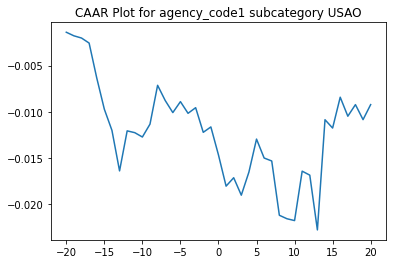

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001399 -0.001399  0.021443 -0.470501  0.640003
-19 -0.000386 -0.001786  0.026234 -0.490795  0.625677
-18 -0.000240 -0.002026  0.033507 -0.435943  0.664718
-17 -0.000546 -0.002572  0.038437 -0.482478  0.631531
-16 -0.003768 -0.006340  0.048699 -0.938808  0.352255
-15 -0.003389 -0.009729  0.047003 -1.492670  0.141684
-14 -0.002293 -0.012022  0.055349 -1.566273  0.123469
-13 -0.004384 -0.016406  0.062022 -1.907493  0.062096
-12  0.004333 -0.012073  0.063720 -1.366310  0.177836
-11 -0.000195 -0.012268  0.067072 -1.319019  0.193055
-10 -0.000470 -0.012739  0.067233 -1.366317  0.177834
-9   0.001394 -0.011345  0.068320 -1.197420  0.236679
-8   0.004202 -0.007143  0.067380 -0.764440  0.448128
-7  -0.001645 -0.008788  0.071765 -0.883050  0.381353
-6  -0.001307 -0.010095  0.078925 -0.922363  0.360683
-5   0.001185 -0.008910  0.081699 -0.786459  0.435238
-4  -0.001264 -0.010174  0.089238 -0.822127  0.414832
-3   0.000609 -0.009564  0.0

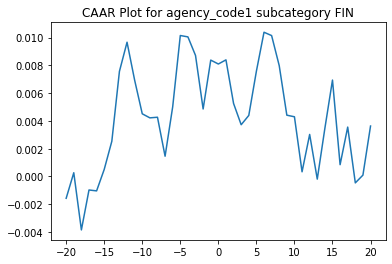

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001576 -0.001576  0.013299 -0.690994  0.494402
-19  0.001841  0.000265  0.018268  0.084485  0.933181
-18 -0.004120 -0.003855  0.018275 -1.230088  0.227361
-17  0.002877 -0.000978  0.020534 -0.277750  0.782937
-16 -0.000064 -0.001042  0.021111 -0.287912  0.775215
-15  0.001546  0.000504  0.022499  0.130590  0.896893
-14  0.002028  0.002531  0.025672  0.574970  0.569211
-13  0.005039  0.007570  0.030019  1.470397  0.150926
-12  0.002100  0.009670  0.040273  1.400133  0.170806
-11 -0.002739  0.006932  0.035019  1.154218  0.256701
-10 -0.002420  0.004512  0.037806  0.695853  0.491393
-9  -0.000292  0.004220  0.034122  0.721127  0.475909
-8   0.000045  0.004264  0.037761  0.658498  0.514787
-7  -0.002809  0.001455  0.042485  0.199735  0.842914
-6   0.003563  0.005018  0.045662  0.640855  0.526043
-5   0.005135  0.010153  0.050611  1.169767  0.250474
-4  -0.000098  0.010055  0.052196  1.123277  0.269425
-3  -0.001340  0.008715  0.0

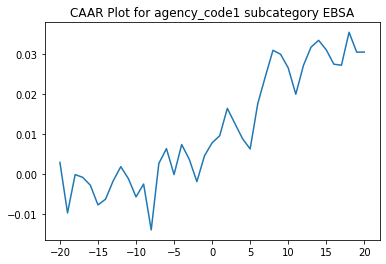

          ARR      CAAR        sd    t_stat   p_value
-20  0.002944  0.002944  0.015465  1.042881  0.305620
-19 -0.012571 -0.009627  0.030631 -1.721416  0.095828
-18  0.009543 -0.000084  0.034532 -0.013357  0.989435
-17 -0.000687 -0.000771  0.026500 -0.159353  0.874495
-16 -0.001964 -0.002735  0.028139 -0.532291  0.598579
-15 -0.004904 -0.007639  0.041308 -1.012859  0.319504
-14  0.001440 -0.006199  0.048843 -0.695170  0.492482
-13  0.004550 -0.001649  0.044969 -0.200897  0.842182
-12  0.003544  0.001894  0.032215  0.322083  0.749701
-11 -0.002986 -0.001091  0.042895 -0.139326  0.890155
-10 -0.004542 -0.005634  0.048755 -0.632890  0.531765
-9   0.003189 -0.002444  0.053449 -0.250502  0.803965
-8  -0.011416 -0.013860  0.064096 -1.184414  0.245866
-7   0.016554  0.002693  0.041547  0.355063  0.725112
-6   0.003688  0.006382  0.048518  0.720426  0.477030
-5  -0.006454 -0.000072  0.051115 -0.007724  0.993890
-4   0.007472  0.007400  0.053616  0.755999  0.455747
-3  -0.003686  0.003715  0.0

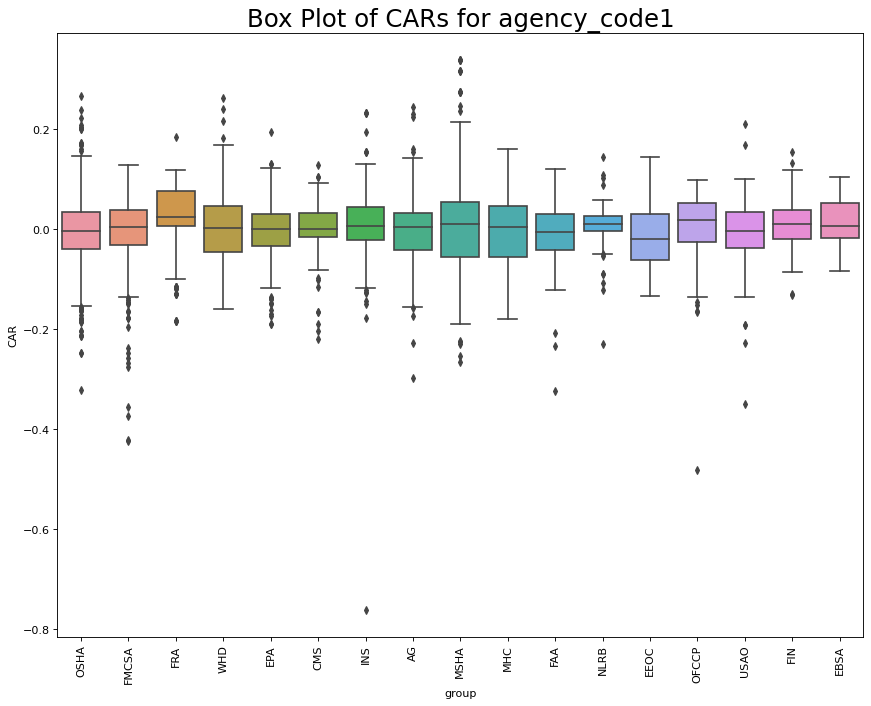

In [ ]:
a = CAAR_by_category(df, events, 'agency_code1',\
                     cat_name='Different Agency Groups', cat_members=agency_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

#Results [-10,10]

In [ ]:
es_win = 200
ev_win = [-10,10]
end_time = 10

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 15 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Offence Groups GROUP safety-related offenses
We found AR for 3813 events
AR.shape[1] is 3813


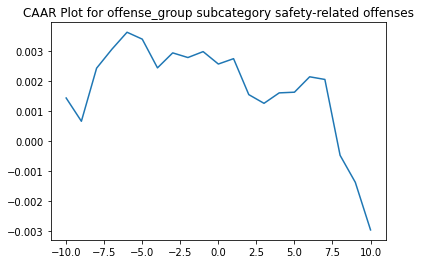

          ARR      CAAR        sd    t_stat       p_value
-10  0.001438  0.001438  0.014157  6.273694  3.920024e-10
-9  -0.000775  0.000664  0.019544  2.097086  3.605169e-02
-8   0.001768  0.002432  0.024929  6.024503  1.857030e-09
-7   0.000628  0.003060  0.029083  6.497733  9.207368e-11
-6   0.000569  0.003629  0.031909  7.023394  2.552827e-12
-5  -0.000230  0.003399  0.034556  6.074412  1.366371e-09
-4  -0.000957  0.002442  0.036678  4.111400  4.015539e-05
-3   0.000500  0.002942  0.039599  4.587343  4.633540e-06
-2  -0.000155  0.002787  0.041283  4.168299  3.136967e-05
-1   0.000197  0.002984  0.044127  4.175348  3.041824e-05
 0  -0.000414  0.002570  0.045713  3.471749  5.228244e-04
 1   0.000179  0.002749  0.048848  3.474788  5.169562e-04
 2  -0.001198  0.001551  0.050528  1.895596  5.808909e-02
 3  -0.000290  0.001261  0.053416  1.457957  1.449348e-01
 4   0.000348  0.001609  0.056110  1.771044  7.663326e-02
 5   0.000022  0.001632  0.058089  1.734357  8.293568e-02
 6   0.000514 

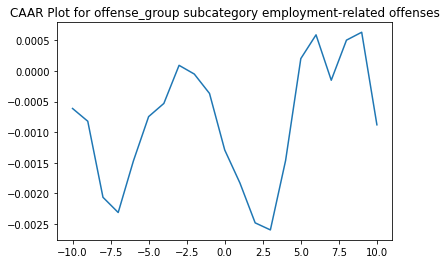

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000613 -0.000613  0.014171 -1.415845  0.157111
-9  -0.000209 -0.000821  0.021563 -1.247332  0.212548
-8  -0.001243 -0.002064  0.024826 -2.723347  0.006567
-7  -0.000249 -0.002313  0.028891 -2.621981  0.008866
-6   0.000843 -0.001469  0.032998 -1.458619  0.144963
-5   0.000724 -0.000745  0.037273 -0.655026  0.512591
-4   0.000215 -0.000530  0.039150 -0.443544  0.657462
-3   0.000623  0.000093  0.041156  0.073651  0.941302
-2  -0.000142 -0.000050  0.045353 -0.036016  0.971276
-1  -0.000317 -0.000367  0.046923 -0.256183  0.797859
 0  -0.000923 -0.001290  0.048657 -0.868761  0.385172
 1  -0.000541 -0.001831  0.050191 -1.195031  0.232339
 2  -0.000651 -0.002482  0.053751 -1.512341  0.130742
 3  -0.000111 -0.002593  0.054611 -1.555153  0.120205
 4   0.001134 -0.001459  0.059444 -0.803711  0.421742
 5   0.001665  0.000207  0.068495  0.098905  0.921232
 6   0.000388  0.000595  0.066409  0.293585  0.769132
 7  -0.000742 -0.000147  0.0

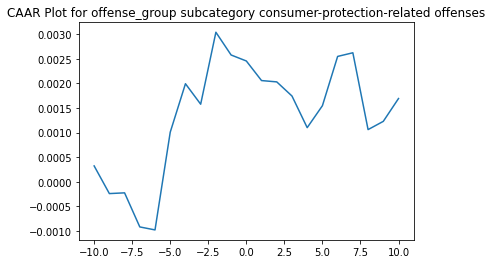

          ARR      CAAR        sd    t_stat   p_value
-10  0.000321  0.000321  0.016471  0.474279  0.635477
-9  -0.000562 -0.000241  0.019880 -0.294638  0.768374
-8   0.000015 -0.000226  0.025954 -0.211710  0.832406
-7  -0.000693 -0.000919  0.030162 -0.740327  0.459396
-6  -0.000061 -0.000979  0.037741 -0.630715  0.528471
-5   0.001986  0.001007  0.038413  0.637164  0.524265
-4   0.000984  0.001991  0.041837  1.156968  0.247754
-3  -0.000416  0.001575  0.050612  0.756613  0.449584
-2   0.001462  0.003037  0.048002  1.538276  0.124517
-1  -0.000462  0.002575  0.053108  1.178747  0.238974
 0  -0.000122  0.002453  0.051551  1.156990  0.247745
 1  -0.000398  0.002055  0.054971  0.909018  0.363712
 2  -0.000027  0.002029  0.058140  0.848214  0.396663
 3  -0.000287  0.001741  0.061385  0.689667  0.490675
 4  -0.000643  0.001099  0.062859  0.424964  0.671018
 5   0.000446  0.001545  0.058481  0.642115  0.521048
 6   0.001001  0.002546  0.058340  1.060959  0.289143
 7   0.000074  0.002620  0.0

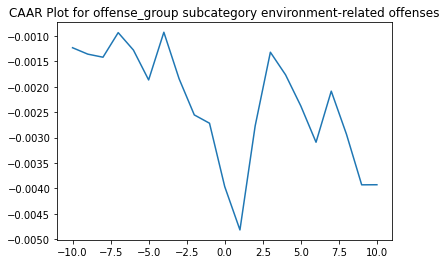

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001232 -0.001232  0.015003 -1.493902  0.136157
-9  -0.000126 -0.001358  0.020904 -1.181784  0.238142
-8  -0.000061 -0.001419  0.024799 -1.040743  0.298757
-7   0.000484 -0.000935  0.029011 -0.586129  0.558190
-6  -0.000225 -0.001159  0.029222 -0.721841  0.470904
-5  -0.000588 -0.001748  0.031156 -1.020543  0.308219
-4   0.000939 -0.000809  0.034463 -0.426907  0.669725
-3  -0.000915 -0.001723  0.036839 -0.851065  0.395351
-2  -0.000713 -0.002436  0.040251 -1.101096  0.271657
-1  -0.000164 -0.002600  0.042529 -1.112196  0.266864
 0  -0.001247 -0.003847  0.044525 -1.572090  0.116888
 1  -0.000853 -0.004700  0.047356 -1.805747  0.071869
 2   0.002047 -0.002653  0.049117 -0.982854  0.326399
 3   0.001452 -0.001202  0.050218 -0.435441  0.663527
 4  -0.000446 -0.001648  0.052382 -0.572349  0.567475
 5  -0.000612 -0.002260  0.057098 -0.720159  0.471937
 6  -0.000714 -0.002974  0.061157 -0.884748  0.376937
 7   0.001006 -0.001968  0.0

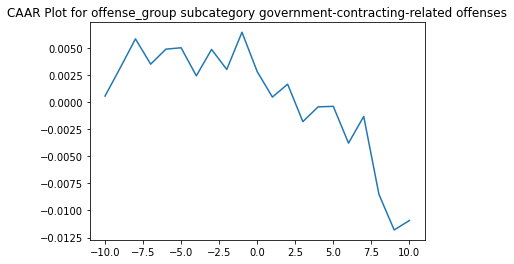

          ARR      CAAR        sd    t_stat   p_value
-10  0.000560  0.000560  0.011658  0.395784  0.693522
-9   0.002604  0.003163  0.017844  1.461826  0.148464
-8   0.002677  0.005841  0.019793  2.433294  0.017637
-7  -0.002335  0.003505  0.022291  1.296724  0.199175
-6   0.001385  0.004891  0.038931  1.035918  0.303965
-5   0.000128  0.005019  0.039394  1.050537  0.297246
-4  -0.002593  0.002426  0.047639  0.419894  0.675906
-3   0.002441  0.004867  0.050526  0.794264  0.429846
-2  -0.001848  0.003019  0.053044  0.469341  0.640350
-1   0.003432  0.006451  0.063103  0.842991  0.402233
 0  -0.003633  0.002817  0.063579  0.365430  0.715942
 1  -0.002351  0.000467  0.072131  0.053341  0.957619
 2   0.001191  0.001657  0.074540  0.183322  0.855099
 3  -0.003456 -0.001799  0.094677 -0.156685  0.875965
 4   0.001362 -0.000437  0.090875 -0.039663  0.968480
 5   0.000047 -0.000390  0.091912 -0.034990  0.972192
 6  -0.003392 -0.003782  0.109141 -0.285773  0.775934
 7   0.002461 -0.001321  0.0

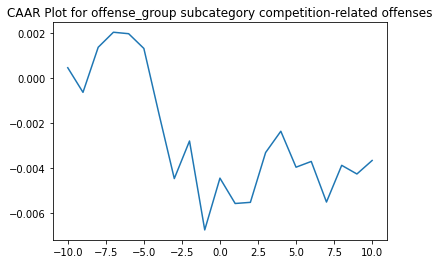

          ARR      CAAR        sd    t_stat   p_value
-10  0.000455  0.000455  0.017681  0.194293  0.846650
-9  -0.001092 -0.000637  0.020005 -0.240287  0.810985
-8   0.002000  0.001363  0.024760  0.415559  0.679321
-7   0.000667  0.002029  0.029531  0.518855  0.605906
-6  -0.000065  0.001965  0.036944  0.401518  0.689567
-5  -0.000654  0.001310  0.032969  0.300086  0.765223
-4  -0.002925 -0.001614  0.037786 -0.322503  0.748273
-3  -0.002849 -0.004463  0.038392 -0.877597  0.383912
-2   0.001667 -0.002796  0.045262 -0.466325  0.642792
-1  -0.003945 -0.006741  0.047795 -1.064775  0.291547
 0   0.002297 -0.004443  0.050811 -0.660203  0.511830
 1  -0.001125 -0.005568  0.054916 -0.765553  0.447157
 2   0.000051 -0.005517  0.056718 -0.734427  0.465753
 3   0.002208 -0.003309  0.059421 -0.420437  0.675775
 4   0.000946 -0.002363  0.059757 -0.298498  0.766428
 5  -0.001595 -0.003958  0.059153 -0.505161  0.615428
 6   0.000255 -0.003703  0.061302 -0.456056  0.650114
 7  -0.001801 -0.005504  0.0

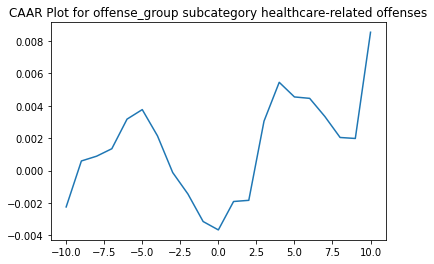

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002248 -0.002248  0.016128 -0.975879  0.334017
-9   0.002839  0.000591  0.019053  0.217087  0.829061
-8   0.000295  0.000886  0.022107  0.280451  0.780336
-7   0.000461  0.001347  0.020963  0.449664  0.654977
-6   0.001828  0.003175  0.023183  0.958736  0.342496
-5   0.000588  0.003764  0.027271  0.966071  0.338851
-4  -0.001622  0.002142  0.034876  0.429877  0.669209
-3  -0.002264 -0.000123  0.042617 -0.020158  0.984001
-2  -0.001325 -0.001448  0.047126 -0.215079  0.830617
-1  -0.001701 -0.003149  0.051500 -0.428004  0.670562
 0  -0.000518 -0.003667  0.051589 -0.497560  0.621066
 1   0.001755 -0.001912  0.045598 -0.293525  0.770386
 2   0.000072 -0.001840  0.049798 -0.258617  0.797036
 3   0.004889  0.003049  0.044023  0.484774  0.630041
 4   0.002400  0.005449  0.046348  0.822918  0.414625
 5  -0.000903  0.004545  0.049154  0.647297  0.520524
 6  -0.000088  0.004458  0.047384  0.658548  0.513332
 7  -0.001122  0.003336  0.0

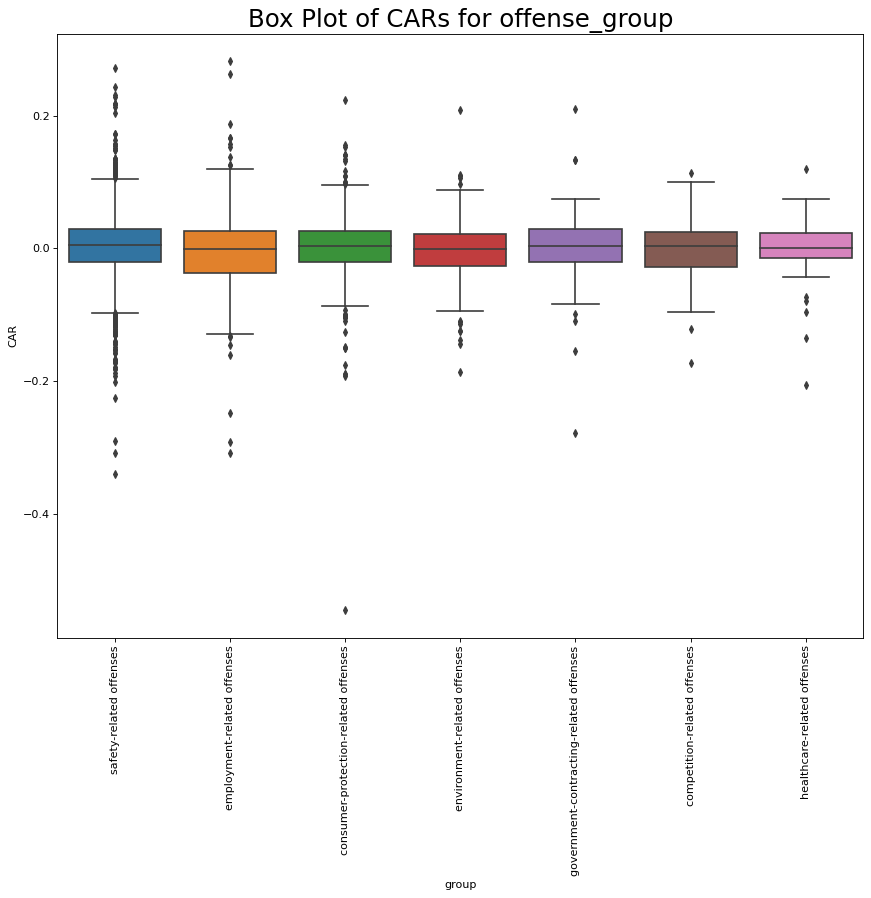

In [ ]:
a = CAAR_by_category(df, events, 'offense_group',\
                     cat_name='Different Offence Groups', cat_members=off_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different Groups of Industries GROUP retailing
We found AR for 983 events
AR.shape[1] is 983


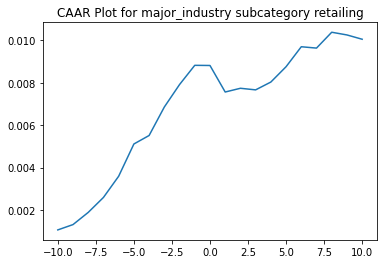

          ARR      CAAR        sd    t_stat       p_value
-10  0.001059  0.001059  0.016984  1.954513  5.092407e-02
-9   0.000251  0.001310  0.023623  1.739025  8.234375e-02
-8   0.000575  0.001885  0.026910  2.196058  2.832100e-02
-7   0.000705  0.002590  0.029999  2.706793  6.911531e-03
-6   0.001000  0.003590  0.034324  3.278842  1.078945e-03
-5   0.001520  0.005110  0.038036  4.211859  2.765604e-05
-4   0.000400  0.005510  0.042321  4.081892  4.830053e-05
-3   0.001342  0.006852  0.046753  4.595234  4.885329e-06
-2   0.001059  0.007911  0.048988  5.063440  4.915757e-07
-1   0.000907  0.008818  0.050530  5.471460  5.665308e-08
 0  -0.000008  0.008811  0.052731  5.238666  1.979120e-07
 1  -0.001251  0.007560  0.056795  4.173358  3.267519e-05
 2   0.000176  0.007736  0.059152  4.100462  4.464341e-05
 3  -0.000075  0.007661  0.062009  3.873613  1.143392e-04
 4   0.000369  0.008030  0.064577  3.898531  1.033520e-04
 5   0.000723  0.008753  0.066520  4.125334  4.015570e-05
 6   0.000942 

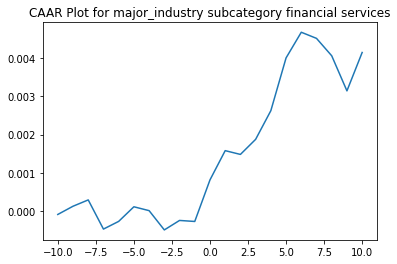

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000085 -0.000085  0.012892 -0.191495  0.848184
-9   0.000214  0.000130  0.017485  0.215905  0.829114
-8   0.000165  0.000295  0.021550  0.398150  0.690620
-7  -0.000761 -0.000467  0.026546 -0.511932  0.608832
-6   0.000201 -0.000266  0.030170 -0.256688  0.797482
-5   0.000382  0.000116  0.030743  0.109507  0.912826
-4  -0.000101  0.000015  0.033325  0.012762  0.989820
-3  -0.000503 -0.000488  0.038533 -0.368999  0.712221
-2   0.000247 -0.000241  0.037321 -0.188076  0.850862
-1  -0.000027 -0.000268  0.041470 -0.188013  0.850912
 0   0.001084  0.000817  0.041865  0.568021  0.570171
 1   0.000764  0.001581  0.044546  1.033231  0.301791
 2  -0.000099  0.001482  0.046325  0.931502  0.351860
 3   0.000394  0.001875  0.049528  1.102647  0.270494
 4   0.000748  0.002624  0.050051  1.526589  0.127237
 5   0.001377  0.004001  0.047027  2.477437  0.013427
 6   0.000670  0.004670  0.047465  2.865399  0.004268
 7  -0.000160  0.004511  0.0

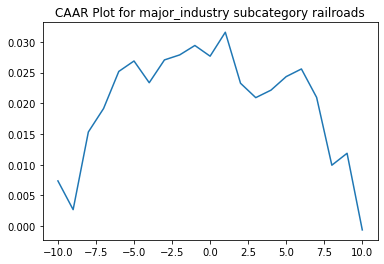

          ARR      CAAR        sd     t_stat        p_value
-10  0.007361  0.007361  0.008428  19.684499   1.683440e-64
-9  -0.004681  0.002680  0.009759   6.190190   1.241363e-09
-8   0.012648  0.015329  0.022988  15.029166   1.726712e-42
-7   0.003824  0.019153  0.022843  18.898281   1.083169e-60
-6   0.006038  0.025191  0.017930  31.666211  3.197552e-122
-5   0.001700  0.026892  0.019807  30.600296  2.879932e-117
-4  -0.003538  0.023353  0.023468  22.428591   6.595362e-78
-3   0.003713  0.027066  0.021460  28.427043  5.226047e-107
-2   0.000815  0.027881  0.024263  25.899640   7.490416e-95
-1   0.001536  0.029418  0.024816  26.718255   8.211066e-99
 0  -0.001742  0.027675  0.021466  29.057900  5.245164e-110
 1   0.003899  0.031574  0.022344  31.849456  4.555211e-123
 2  -0.008310  0.023263  0.022921  22.875379   4.271195e-80
 3  -0.002341  0.020922  0.022922  20.572566   7.961987e-69
 4   0.001219  0.022141  0.028333  17.613721   1.572624e-54
 5   0.002206  0.024347  0.024689  22.22

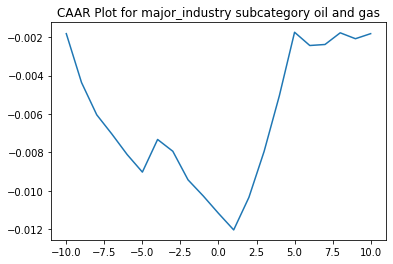

          ARR      CAAR        sd    t_stat       p_value
-10 -0.001816 -0.001816  0.012974 -2.603675  9.621437e-03
-9  -0.002544 -0.004360  0.020563 -3.944332  9.694911e-05
-8  -0.001683 -0.006043  0.021083 -5.331783  1.762053e-07
-7  -0.001008 -0.007051  0.026910 -4.874026  1.670638e-06
-6  -0.001064 -0.008116  0.031206 -4.837411  1.986055e-06
-5  -0.000914 -0.009029  0.036312 -4.625348  5.296902e-06
-4   0.001700 -0.007329  0.037779 -3.608579  3.534201e-04
-3  -0.000615 -0.007944  0.037176 -3.974898  8.578066e-05
-2  -0.001489 -0.009433  0.043548 -4.029119  6.890974e-05
-1  -0.000840 -0.010273  0.046733 -4.088779  5.400324e-05
 0  -0.000905 -0.011178  0.047199 -4.405131  1.412734e-05
 1  -0.000864 -0.012042  0.049837 -4.494419  9.535577e-06
 2   0.001696 -0.010346  0.053995 -3.563968  4.167365e-04
 3   0.002397 -0.007948  0.054033 -2.736270  6.535523e-03
 4   0.002896 -0.005053  0.057837 -1.625002  1.050753e-01
 5   0.003310 -0.001743  0.070520 -0.459697  6.460231e-01
 6  -0.000691 

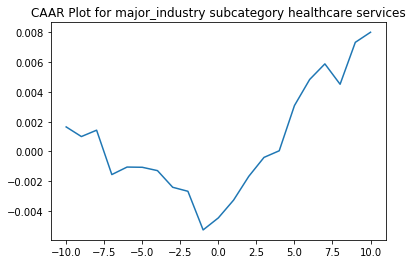

          ARR      CAAR        sd    t_stat   p_value
-10  0.001649  0.001649  0.015170  1.825167  0.069037
-9  -0.000647  0.001002  0.020780  0.809729  0.418781
-8   0.000427  0.001429  0.028428  0.844045  0.399362
-7  -0.002977 -0.001548  0.029552 -0.879753  0.379745
-6   0.000503 -0.001045  0.039028 -0.449577  0.653362
-5  -0.000015 -0.001060  0.039287 -0.452882  0.650983
-4  -0.000224 -0.001284  0.044890 -0.480140  0.631501
-3  -0.001117 -0.002400  0.051323 -0.785427  0.432865
-2  -0.000270 -0.002670  0.050186 -0.893571  0.372316
-1  -0.002591 -0.005262  0.053648 -1.646971  0.100682
 0   0.000808 -0.004454  0.052036 -1.437409  0.151715
 1   0.001190 -0.003264  0.051650 -1.061130  0.289542
 2   0.001597 -0.001667  0.055250 -0.506658  0.612792
 3   0.001271 -0.000396  0.055124 -0.120743  0.903981
 4   0.000444  0.000048  0.055043  0.014607  0.988356
 5   0.003032  0.003080  0.054681  0.945874  0.345025
 6   0.001750  0.004830  0.055667  1.457057  0.146217
 7   0.001047  0.005877  0.0

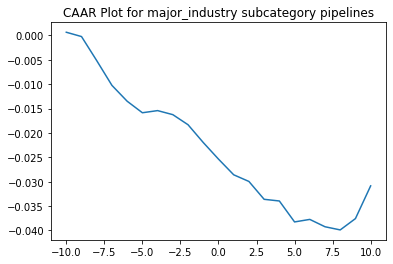

          ARR      CAAR        sd     t_stat       p_value
-10  0.000648  0.000648  0.013084   0.781144  4.354626e-01
-9  -0.000885 -0.000237  0.021450  -0.174300  8.617721e-01
-8  -0.004938 -0.005174  0.022328  -3.656903  3.117032e-04
-7  -0.005076 -0.010250  0.023702  -6.824109  6.744195e-11
-6  -0.003249 -0.013499  0.023863  -8.926502  1.004355e-16
-5  -0.002361 -0.015860  0.025663  -9.752164  3.144654e-19
-4   0.000440 -0.015421  0.026982  -9.018407  5.348994e-17
-3  -0.000830 -0.016251  0.026685  -9.609669  8.647089e-19
-2  -0.002068 -0.018319  0.027839 -10.383511  3.307416e-21
-1  -0.003645 -0.021964  0.031317 -11.066823  2.123970e-23
 0  -0.003401 -0.025365  0.033350 -12.001443  1.813602e-26
 1  -0.003218 -0.028583  0.034212 -13.183254  1.965106e-30
 2  -0.001366 -0.029949  0.034186 -13.823655  1.311150e-32
 3  -0.003661 -0.033610  0.037994 -13.958821  4.536433e-33
 4  -0.000343 -0.033953  0.035884 -14.930429  2.145803e-36
 5  -0.004296 -0.038249  0.036252 -16.648883  2.721190e-

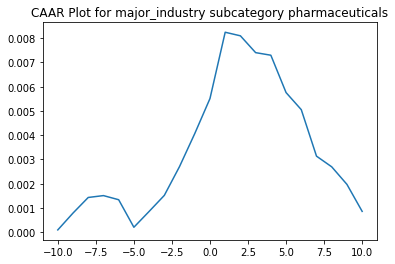

          ARR      CAAR        sd    t_stat   p_value
-10  0.000095  0.000095  0.010196  0.146296  0.883809
-9   0.000695  0.000791  0.012665  0.975111  0.330475
-8   0.000643  0.001434  0.014931  1.499791  0.134967
-7   0.000077  0.001511  0.018560  1.271420  0.204795
-6  -0.000170  0.001341  0.021324  0.981975  0.327089
-5  -0.001135  0.000205  0.024474  0.131133  0.895779
-4   0.000652  0.000857  0.025792  0.519066  0.604187
-3   0.000662  0.001520  0.026880  0.883024  0.378096
-2   0.001189  0.002709  0.030388  1.392380  0.165080
-1   0.001359  0.004068  0.033801  1.879973  0.061308
 0   0.001445  0.005513  0.036581  2.354100  0.019364
 1   0.002734  0.008247  0.037200  3.462945  0.000631
 2  -0.000148  0.008099  0.038036  3.326143  0.001017
 3  -0.000693  0.007406  0.039136  2.955904  0.003424
 4  -0.000106  0.007299  0.039641  2.876371  0.004380
 5  -0.001540  0.005759  0.040238  2.235656  0.026283
 6  -0.000705  0.005054  0.039008  2.023796  0.044086
 7  -0.001917  0.003137  0.0

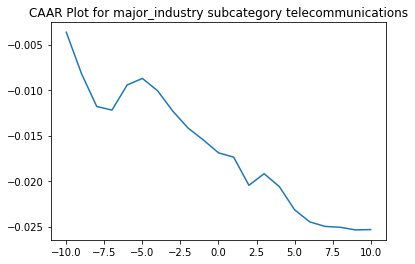

          ARR      CAAR        sd    t_stat       p_value
-10 -0.003650 -0.003650  0.014289 -3.857249  1.494161e-04
-9  -0.004548 -0.008198  0.018926 -6.540630  4.010052e-10
-8  -0.003603 -0.011801  0.021526 -8.278229  1.072881e-14
-7  -0.000401 -0.012202  0.024165 -7.624827  6.634577e-13
-6   0.002762 -0.009441  0.024379 -5.847259  1.727687e-08
-5   0.000719 -0.008722  0.028127 -4.682213  4.883711e-06
-4  -0.001360 -0.010082  0.032117 -4.739713  3.777033e-06
-3  -0.002236 -0.012318  0.034802 -5.344294  2.205762e-07
-2  -0.001854 -0.014172  0.034432 -6.214897  2.432511e-09
-1  -0.001301 -0.015473  0.036299 -6.436478  7.183037e-10
 0  -0.001418 -0.016891  0.038360 -6.648669  2.176687e-10
 1  -0.000480 -0.017371  0.041829 -6.270640  1.794473e-09
 2  -0.003089 -0.020460  0.041704 -7.407664  2.506416e-12
 3   0.001271 -0.019188  0.042722 -6.781910  1.015709e-10
 4  -0.001418 -0.020606  0.043006 -7.234995  7.097845e-12
 5  -0.002538 -0.023145  0.044472 -7.858376  1.551171e-13
 6  -0.001332 

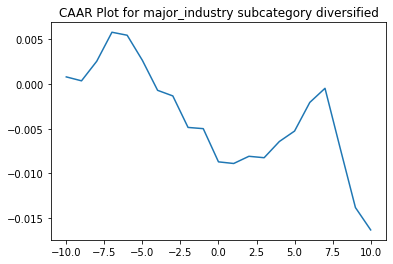

          ARR      CAAR        sd    t_stat   p_value
-10  0.000809  0.000809  0.013221  1.379699  0.168287
-9  -0.000440  0.000369  0.020062  0.414586  0.678620
-8   0.002191  0.002560  0.024344  2.370258  0.018149
-7   0.003250  0.005810  0.031948  4.098934  0.000048
-6  -0.000335  0.005475  0.035228  3.503020  0.000501
-5  -0.002812  0.002664  0.036622  1.639314  0.101768
-4  -0.003359 -0.000695  0.037774 -0.414633  0.678586
-3  -0.000626 -0.001321  0.040601 -0.733137  0.463813
-2  -0.003530 -0.004850  0.038960 -2.806029  0.005208
-1  -0.000137 -0.004987  0.041817 -2.687987  0.007425
 0  -0.003719 -0.008706  0.043836 -4.476330  0.000009
 1  -0.000183 -0.008889  0.044511 -4.500841  0.000008
 2   0.000806 -0.008083  0.050712 -3.592522  0.000359
 3  -0.000159 -0.008242  0.053365 -3.481201  0.000542
 4   0.001815 -0.006427  0.059816 -2.421897  0.015789
 5   0.001171 -0.005257  0.063656 -1.861308  0.063279
 6   0.003206 -0.002051  0.067904 -0.680798  0.496310
 7   0.001582 -0.000469  0.0

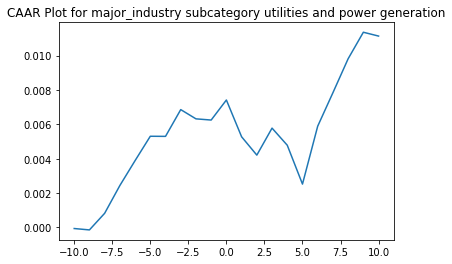

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000061 -0.000061  0.009523 -0.086258  0.931358
-9  -0.000081 -0.000142  0.013460 -0.141746  0.887440
-8   0.000967  0.000824  0.016991  0.650989  0.515889
-7   0.001617  0.002442  0.020001  1.637872  0.103205
-6   0.001449  0.003891  0.019448  2.684030  0.007957
-5   0.001418  0.005309  0.020539  3.467791  0.000657
-4  -0.000007  0.005302  0.021580  3.296375  0.001181
-3   0.001558  0.006860  0.023206  3.966137  0.000106
-2  -0.000538  0.006322  0.024543  3.455966  0.000685
-1  -0.000070  0.006252  0.026222  3.198813  0.001632
 0   0.001167  0.007419  0.027391  3.633993  0.000364
 1  -0.002141  0.005278  0.033085  2.140313  0.033683
 2  -0.001067  0.004211  0.043088  1.311299  0.191436
 3   0.001571  0.005782  0.042661  1.818404  0.070674
 4  -0.000995  0.004787  0.054349  1.181661  0.238908
 5  -0.002262  0.002525  0.076932  0.440298  0.660252
 6   0.003369  0.005894  0.053317  1.483167  0.139789
 7   0.001948  0.007842  0.0

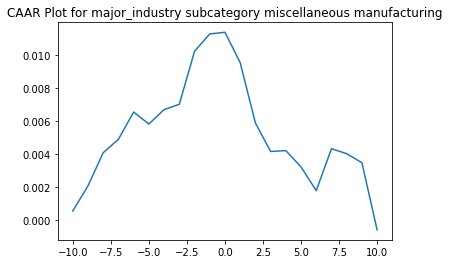

          ARR      CAAR        sd    t_stat   p_value
-10  0.000570  0.000570  0.015666  0.460280  0.645944
-9   0.001519  0.002089  0.019476  1.356739  0.176787
-8   0.002003  0.004092  0.022620  2.287990  0.023456
-7   0.000812  0.004904  0.025193  2.462209  0.014876
-6   0.001646  0.006550  0.027200  3.046224  0.002714
-5  -0.000723  0.005827  0.029993  2.457401  0.015069
-4   0.000871  0.006697  0.030721  2.757595  0.006505
-3   0.000322  0.007020  0.031479  2.820781  0.005402
-2   0.003199  0.010219  0.037760  3.423180  0.000787
-1   0.001053  0.011271  0.039410  3.617702  0.000399
 0   0.000103  0.011375  0.041433  3.472543  0.000664
 1  -0.001835  0.009540  0.041022  2.941637  0.003753
 2  -0.003647  0.005893  0.040144  1.856893  0.065176
 3  -0.001727  0.004166  0.042082  1.252246  0.212319
 4   0.000054  0.004220  0.043547  1.225755  0.222103
 5  -0.000985  0.003235  0.047612  0.859463  0.391379
 6  -0.001437  0.001798  0.051057  0.445341  0.656679
 7   0.002539  0.004336  0.0

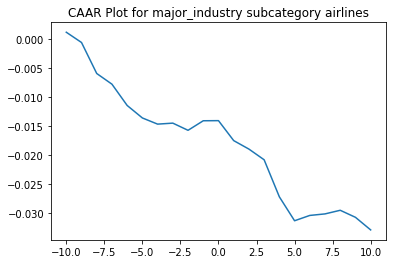

          ARR      CAAR        sd    t_stat   p_value
-10  0.001128  0.001128  0.017497  0.770594  0.442228
-9  -0.001765 -0.000637  0.023311 -0.326938  0.744196
-8  -0.005335 -0.005972  0.028411 -2.513692  0.013064
-7  -0.001839 -0.007811  0.033736 -2.768841  0.006377
-6  -0.003663 -0.011474  0.040063 -3.424830  0.000805
-5  -0.002150 -0.013624  0.044554 -3.656746  0.000359
-4  -0.001061 -0.014685  0.048436 -3.625551  0.000401
-3   0.000170 -0.014515  0.053137 -3.266581  0.001365
-2  -0.001234 -0.015749  0.054328 -3.466503  0.000698
-1   0.001642 -0.014107  0.055392 -3.045380  0.002771
 0   0.000020 -0.014086  0.061584 -2.735207  0.007029
 1  -0.003436 -0.017522  0.062850 -3.333895  0.001092
 2  -0.001459 -0.018981  0.072200 -3.143813  0.002031
 3  -0.001839 -0.020820  0.077623 -3.207498  0.001655
 4  -0.006376 -0.027196  0.080026 -4.063880  0.000080
 5  -0.004120 -0.031316  0.081110 -4.616951  0.000009
 6   0.000916 -0.030400  0.085456 -4.254064  0.000038
 7   0.000265 -0.030136  0.0

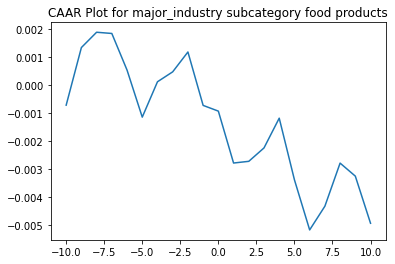

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000723 -0.000723  0.018711 -0.455627  0.649375
-9   0.002060  0.001337  0.021525  0.732502  0.465104
-8   0.000547  0.001885  0.024175  0.919128  0.359632
-7  -0.000044  0.001841  0.028051  0.773704  0.440429
-6  -0.001309  0.000532  0.029344  0.213569  0.831198
-5  -0.001682 -0.001151  0.034490 -0.393341  0.694675
-4   0.001264  0.000114  0.034819  0.038509  0.969337
-3   0.000355  0.000469  0.037548  0.147281  0.883125
-2   0.000709  0.001178  0.039949  0.347760  0.728551
-1  -0.001910 -0.000731  0.041968 -0.205410  0.837554
 0  -0.000205 -0.000936  0.046852 -0.235503  0.814167
 1  -0.001856 -0.002792  0.049785 -0.661169  0.509606
 2   0.000061 -0.002731  0.053620 -0.600475  0.549175
 3   0.000479 -0.002251  0.053822 -0.493198  0.622656
 4   0.001064 -0.001188  0.059505 -0.235370  0.814271
 5  -0.002204 -0.003392  0.064369 -0.621257  0.535455
 6  -0.001792 -0.005184  0.066517 -0.918765  0.359822
 7   0.000848 -0.004336  0.0

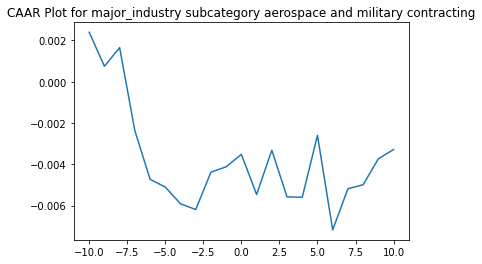

          ARR      CAAR        sd    t_stat   p_value
-10  0.002398  0.002398  0.012923  1.760230  0.081804
-9  -0.001648  0.000749  0.019886  0.357554  0.721523
-8   0.000903  0.001653  0.025617  0.612141  0.542005
-7  -0.004023 -0.002370  0.029422 -0.764077  0.446842
-6  -0.001920 -0.004290  0.038388 -1.060162  0.291939
-5  -0.000378 -0.004668  0.041173 -1.075613  0.285008
-4  -0.000808 -0.005476  0.041528 -1.250879  0.214257
-3  -0.000278 -0.005754  0.044293 -1.232362  0.221060
-2   0.001809 -0.003944  0.047651 -0.785308  0.434359
-1   0.000261 -0.003683  0.050720 -0.688904  0.492676
 0   0.000602 -0.003082  0.049923 -0.585590  0.559633
 1  -0.001943 -0.005024  0.057861 -0.823777  0.412269
 2   0.002143 -0.002881  0.056946 -0.480011  0.632397
 3  -0.002210 -0.005091  0.070726 -0.682894  0.496448
 4  -0.000015 -0.005107  0.086067 -0.562873  0.574936
 5   0.002997 -0.002109  0.080317 -0.249131  0.803834
 6  -0.004581 -0.006690  0.103487 -0.613260  0.541268
 7   0.001995 -0.004695  0.1

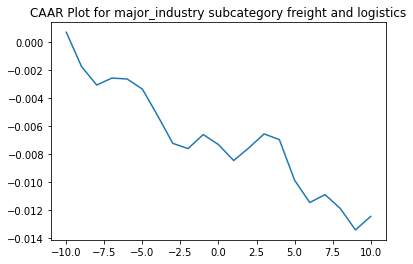

          ARR      CAAR        sd    t_stat   p_value
-10  0.000691  0.000691  0.012638  0.601185  0.548851
-9  -0.002444 -0.001753  0.019608 -0.983304  0.327436
-8  -0.001329 -0.003082  0.030606 -1.107510  0.270289
-7   0.000502 -0.002579  0.033564 -0.845371  0.399586
-6  -0.000069 -0.002648  0.036145 -0.806001  0.421836
-5  -0.000721 -0.003369  0.038917 -0.952330  0.342844
-4  -0.001894 -0.005263  0.041705 -1.388129  0.167670
-3  -0.001981 -0.007244  0.046530 -1.712536  0.089381
-2  -0.000373 -0.007617  0.046753 -1.792172  0.075625
-1   0.001000 -0.006617  0.052684 -1.381515  0.169687
 0  -0.000716 -0.007332  0.052291 -1.542460  0.125595
 1  -0.001139 -0.008472  0.052497 -1.775115  0.078414
 2   0.000910 -0.007562  0.054748 -1.519395  0.131294
 3   0.000994 -0.006568  0.054404 -1.328041  0.186685
 4  -0.000408 -0.006976  0.058176 -1.318998  0.189681
 5  -0.002896 -0.009872  0.061539 -1.764633  0.080170
 6  -0.001597 -0.011469  0.064795 -1.947070  0.053863
 7   0.000566 -0.010903  0.0

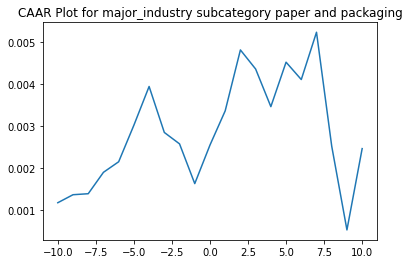

          ARR      CAAR        sd    t_stat   p_value
-10  0.001183  0.001183  0.011700  1.055950  0.293348
-9   0.000190  0.001374  0.016334  0.878098  0.381840
-8   0.000024  0.001398  0.023023  0.633769  0.527571
-7   0.000509  0.001907  0.025364  0.784802  0.434288
-6   0.000251  0.002158  0.025638  0.878699  0.381515
-5   0.000869  0.003027  0.029125  1.085036  0.280322
-4   0.000921  0.003948  0.030572  1.348296  0.180384
-3  -0.001093  0.002855  0.034076  0.874643  0.383709
-2  -0.000272  0.002583  0.037013  0.728557  0.467849
-1  -0.000945  0.001638  0.037261  0.458967  0.647181
 0   0.000917  0.002555  0.035898  0.743038  0.459072
 1   0.000814  0.003369  0.039133  0.898688  0.370818
 2   0.001449  0.004817  0.039902  1.260475  0.210215
 3  -0.000454  0.004363  0.041385  1.100775  0.273442
 4  -0.000895  0.003468  0.043766  0.827410  0.409829
 5   0.001058  0.004526  0.042680  1.107146  0.270691
 6  -0.000413  0.004113  0.045785  0.937936  0.350370
 7   0.001125  0.005238  0.0

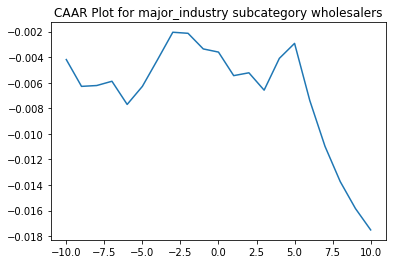

          ARR      CAAR        sd    t_stat   p_value
-10 -0.004188 -0.004188  0.014794 -2.594673  0.011192
-9  -0.002097 -0.006285  0.020174 -2.855193  0.005431
-8   0.000066 -0.006219  0.022929 -2.485728  0.014935
-7   0.000333 -0.005885  0.026884 -2.006315  0.048079
-6  -0.001811 -0.007696  0.028439 -2.480345  0.015146
-5   0.001412 -0.006284  0.029787 -1.933603  0.056571
-4   0.002096 -0.004189  0.032193 -1.192541  0.236447
-3   0.002137 -0.002052  0.036860 -0.510275  0.611213
-2  -0.000083 -0.002135  0.038100 -0.513644  0.608866
-1  -0.001221 -0.003356  0.040461 -0.760260  0.449254
 0  -0.000248 -0.003604  0.041881 -0.788656  0.432560
 1  -0.001841 -0.005445  0.042318 -1.179205  0.241686
 2   0.000222 -0.005223  0.043226 -1.107430  0.271307
 3  -0.001357 -0.006580  0.044761 -1.347395  0.181520
 4   0.002485 -0.004095  0.045605 -0.823039  0.412844
 5   0.001173 -0.002922  0.049565 -0.540385  0.590379
 6  -0.004469 -0.007391  0.056233 -1.204645  0.231764
 7  -0.003581 -0.010972  0.0

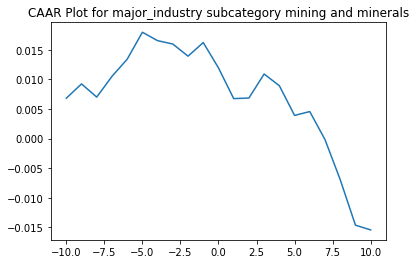

          ARR      CAAR        sd    t_stat   p_value
-10  0.006804  0.006804  0.028013  2.212710  0.029697
-9   0.002420  0.009224  0.038295  2.194355  0.031039
-8  -0.002223  0.007001  0.042239  1.509931  0.134905
-7   0.003492  0.010493  0.052106  1.834629  0.070187
-6   0.002898  0.013391  0.061153  1.994892  0.049376
-5   0.004558  0.017948  0.068362  2.391920  0.019048
-4  -0.001422  0.016526  0.072329  2.081535  0.040504
-3  -0.000567  0.015958  0.081739  1.778661  0.079002
-2  -0.002049  0.013909  0.089855  1.410249  0.162248
-1   0.002294  0.016203  0.098833  1.493589  0.139121
 0  -0.004274  0.011929  0.102304  1.062276  0.291229
 1  -0.005188  0.006741  0.109710  0.559746  0.577179
 2   0.000102  0.006842  0.111043  0.561373  0.576074
 3   0.004052  0.010894  0.118504  0.837531  0.404728
 4  -0.001973  0.008921  0.121496  0.668959  0.505401
 5  -0.005014  0.003908  0.125027  0.284737  0.776563
 6   0.000647  0.004554  0.130721  0.317399  0.751748
 7  -0.004731 -0.000176  0.1

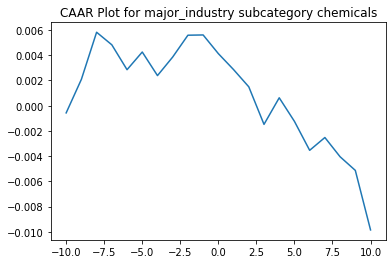

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000572 -0.000572  0.020379 -0.221041  0.825798
-9   0.002660  0.002088  0.025395  0.647348  0.519836
-8   0.003733  0.005821  0.036342  1.261173  0.212048
-7  -0.000996  0.004824  0.043816  0.866986  0.389347
-6  -0.001972  0.002852  0.042001  0.534684  0.594812
-5   0.001401  0.004253  0.044380  0.754559  0.453417
-4  -0.001868  0.002385  0.037655  0.498722  0.619769
-3   0.001472  0.003857  0.036712  0.827172  0.411364
-2   0.001729  0.005586  0.044881  0.980006  0.330954
-1   0.000020  0.005606  0.044346  0.995401  0.323473
 0  -0.001481  0.004126  0.046466  0.699098  0.487148
 1  -0.001266  0.002860  0.056233  0.400444  0.690229
 2  -0.001364  0.001495  0.061900  0.190235  0.849757
 3  -0.002977 -0.001481  0.072273 -0.161380  0.872328
 4   0.002107  0.000626  0.070121  0.070249  0.944225
 5  -0.001870 -0.001244  0.078711 -0.124453  0.901366
 6  -0.002294 -0.003538  0.094436 -0.295036  0.768968
 7   0.001015 -0.002523  0.0

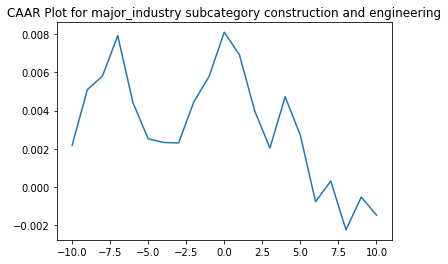

          ARR      CAAR        sd    t_stat   p_value
-10  0.002176  0.002176  0.013897  1.161270  0.250640
-9   0.002909  0.005085  0.021489  1.755027  0.084927
-8   0.000725  0.005810  0.024621  1.749987  0.085801
-7   0.002109  0.007919  0.028115  2.088861  0.041448
-6  -0.003507  0.004412  0.037781  0.866099  0.390268
-5  -0.001890  0.002522  0.042734  0.437715  0.663339
-4  -0.000188  0.002334  0.042958  0.402920  0.688598
-3  -0.000030  0.002304  0.042837  0.398814  0.691603
-2   0.002147  0.004451  0.046417  0.711099  0.480083
-1   0.001326  0.005777  0.044885  0.954483  0.344093
 0   0.002317  0.008093  0.049568  1.210887  0.231212
 1  -0.001185  0.006909  0.051744  0.990186  0.326500
 2  -0.002925  0.003984  0.052317  0.564753  0.574581
 3  -0.001948  0.002036  0.058308  0.259009  0.796613
 4   0.002684  0.004721  0.058332  0.600196  0.550886
 5  -0.002013  0.002708  0.067737  0.296454  0.768021
 6  -0.003476 -0.000768  0.078358 -0.072676  0.942333
 7   0.001081  0.000314  0.0

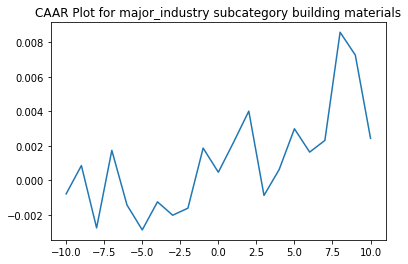

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000790 -0.000790  0.016076 -0.361120  0.719445
-9   0.001643  0.000853  0.018946  0.330718  0.742161
-8  -0.003620 -0.002767  0.019773 -1.028461  0.308404
-7   0.004503  0.001735  0.026489  0.481443  0.632184
-6  -0.003179 -0.001444  0.026379 -0.402201  0.689153
-5  -0.001440 -0.002884  0.026094 -0.812094  0.420371
-4   0.001630 -0.001254  0.027814 -0.331287  0.741734
-3  -0.000777 -0.002031  0.031259 -0.477368  0.635063
-2   0.000409 -0.001622  0.036619 -0.325422  0.746143
-1   0.003488  0.001866  0.039685  0.345531  0.731063
 0  -0.001401  0.000465  0.043551  0.078543  0.937692
 1   0.001738  0.002204  0.045247  0.357906  0.721835
 2   0.001809  0.004013  0.050362  0.585498  0.560698
 3  -0.004895 -0.000882  0.054462 -0.119053  0.905684
 4   0.001511  0.000629  0.055170  0.083797  0.933534
 5   0.002360  0.002989  0.059949  0.366350  0.715562
 6  -0.001354  0.001635  0.063035  0.190563  0.849596
 7   0.000677  0.002312  0.0

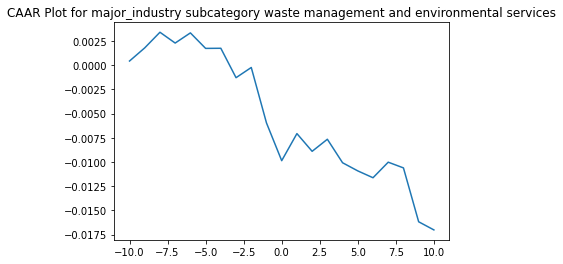

          ARR      CAAR        sd    t_stat   p_value
-10  0.000423  0.000423  0.010024  0.298310  0.766728
-9   0.001360  0.001783  0.015244  0.826949  0.412275
-8   0.001613  0.003396  0.022992  1.044370  0.301439
-7  -0.001116  0.002280  0.024809  0.649722  0.518906
-6   0.001049  0.003329  0.029124  0.808166  0.422901
-5  -0.001601  0.001728  0.028352  0.430948  0.668396
-4   0.000013  0.001741  0.032137  0.382960  0.703406
-3  -0.003038 -0.001298  0.035884 -0.255683  0.799266
-2   0.001054 -0.000243  0.037565 -0.045799  0.963657
-1  -0.005728 -0.005971  0.048031 -0.879026  0.383677
 0  -0.003897 -0.009868  0.050010 -1.395227  0.169239
 1   0.002796 -0.007072  0.050633 -0.987614  0.328194
 2  -0.001830 -0.008902  0.052425 -1.200650  0.235659
 3   0.001246 -0.007656  0.053975 -1.002939  0.320818
 4  -0.002427 -0.010083  0.057629 -1.237146  0.221929
 5  -0.000841 -0.010924  0.058980 -1.309623  0.196431
 6  -0.000706 -0.011630  0.060741 -1.353873  0.181989
 7   0.001606 -0.010024  0.0

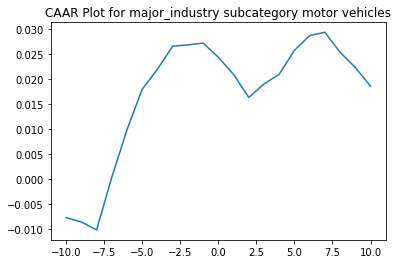

          ARR      CAAR        sd    t_stat   p_value
-10 -0.007662 -0.007662  0.019288 -2.752237  0.008384
-9  -0.000871 -0.008533  0.022959 -2.574999  0.013232
-8  -0.001588 -0.010121  0.026641 -2.632128  0.011444
-7   0.010524  0.000403  0.035979  0.077529  0.938532
-6   0.009519  0.009921  0.038654  1.778245  0.081833
-5   0.008076  0.017997  0.030998  4.022479  0.000208
-4   0.003975  0.021972  0.032747  4.648719  0.000027
-3   0.004599  0.026571  0.036631  5.025594  0.000008
-2   0.000268  0.026839  0.039687  4.685428  0.000024
-1   0.000361  0.027201  0.035346  5.331644  0.000003
 0  -0.002842  0.024359  0.032278  5.228456  0.000004
 1  -0.003426  0.020933  0.034020  4.262916  0.000096
 2  -0.004594  0.016339  0.035506  3.188141  0.002548
 3   0.002682  0.019021  0.034809  3.785880  0.000434
 4   0.001952  0.020973  0.042326  3.432994  0.001255
 5   0.004775  0.025748  0.046112  3.868586  0.000336
 6   0.002939  0.028687  0.046966  4.231786  0.000107
 7   0.000672  0.029359  0.0

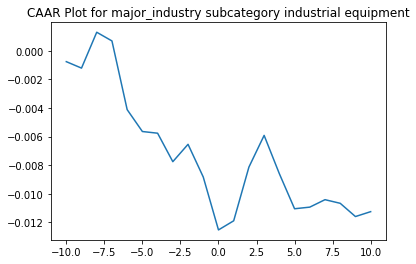

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000763 -0.000763  0.008864 -0.564489  0.575424
-9  -0.000452 -0.001215  0.012776 -0.623447  0.536362
-8   0.002508  0.001293  0.016637  0.509693  0.612934
-7  -0.000608  0.000685  0.019763  0.227276  0.821312
-6  -0.004803 -0.004118  0.024812 -1.088414  0.282619
-5  -0.001530 -0.005648  0.026054 -1.421621  0.162520
-4  -0.000117 -0.005766  0.029529 -1.280386  0.207436
-3  -0.001992 -0.007758  0.034215 -1.486769  0.144545
-2   0.001214 -0.006543  0.030933 -1.387051  0.172744
-1  -0.002287 -0.008830  0.034719 -1.667758  0.102804
 0  -0.003699 -0.012529  0.040105 -2.048554  0.046789
 1   0.000638 -0.011891  0.038428 -2.029077  0.048820
 2   0.003754 -0.008137  0.038546 -1.384209  0.173606
 3   0.002217 -0.005919  0.039300 -0.987703  0.328954
 4  -0.002679 -0.008598  0.041242 -1.367095  0.178868
 5  -0.002451 -0.011049  0.045534 -1.591216  0.119061
 6   0.000114 -0.010935  0.052623 -1.362669  0.180249
 7   0.000521 -0.010414  0.0

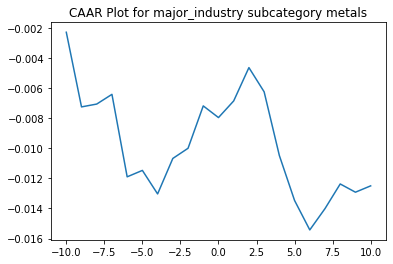

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002293 -0.002293  0.011868 -1.126719  0.267988
-9  -0.004959 -0.007253  0.015813 -2.674387  0.011554
-8   0.000189 -0.007064  0.019613 -2.100074  0.043448
-7   0.000645 -0.006419  0.023011 -1.626495  0.113357
-6  -0.005479 -0.011898  0.024150 -2.872588  0.007065
-5   0.000426 -0.011471  0.032836 -2.037050  0.049731
-4  -0.001563 -0.013035  0.039630 -1.917896  0.063812
-3   0.002358 -0.010677  0.045991 -1.353679  0.185038
-2   0.000676 -0.010001  0.047559 -1.226218  0.228795
-1   0.002815 -0.007187  0.049304 -0.849929  0.401489
 0  -0.000775 -0.007962  0.048811 -0.951097  0.348470
 1   0.001105 -0.006856  0.050588 -0.790259  0.435019
 2   0.002214 -0.004642  0.051998 -0.520534  0.606167
 3  -0.001609 -0.006251  0.052171 -0.698600  0.489696
 4  -0.004231 -0.010481  0.051780 -1.180304  0.246317
 5  -0.002986 -0.013468  0.051020 -1.539193  0.133292
 6  -0.001957 -0.015425  0.051978 -1.730345  0.092912
 7   0.001416 -0.014009  0.0

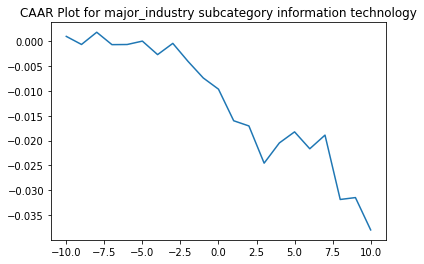

          ARR      CAAR        sd    t_stat   p_value
-10  0.000968  0.000968  0.009313  0.606236  0.548506
-9  -0.001626 -0.000657  0.014170 -0.270536  0.788433
-8   0.002460  0.001803  0.017172  0.612263  0.544560
-7  -0.002497 -0.000694  0.023577 -0.171538  0.864848
-6   0.000027 -0.000666  0.030527 -0.127287  0.899485
-5   0.000683  0.000017  0.035930  0.002725  0.997842
-4  -0.002719 -0.002702  0.046177 -0.341182  0.735129
-3   0.002264 -0.000438  0.047144 -0.054210  0.957095
-2  -0.003628 -0.004067  0.052105 -0.455094  0.652022
-1  -0.003334 -0.007401  0.062805 -0.687120  0.496808
 0  -0.002258 -0.009659  0.067233 -0.837708  0.408221
 1  -0.006361 -0.016020  0.081994 -1.139257  0.262799
 2  -0.001046 -0.017066  0.087448 -1.137951  0.263336
 3  -0.007494 -0.024560  0.115596 -1.238868  0.224134
 4   0.004071 -0.020489  0.110137 -1.084745  0.285896
 5   0.002231 -0.018258  0.112521 -0.946128  0.350960
 6  -0.003403 -0.021661  0.138421 -0.912462  0.368144
 7   0.002749 -0.018912  0.1

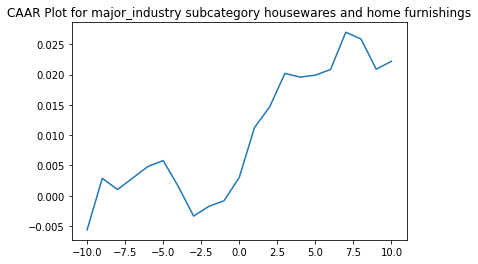

          ARR      CAAR        sd    t_stat   p_value
-10 -0.005641 -0.005641  0.015401 -2.006154  0.054247
-9   0.008513  0.002872  0.022700  0.692913  0.493877
-8  -0.001854  0.001018  0.024445  0.228069  0.821193
-7   0.001901  0.002919  0.024778  0.645179  0.523883
-6   0.001914  0.004833  0.029397  0.900416  0.375316
-5   0.000964  0.005797  0.031113  1.020482  0.315938
-4  -0.004300  0.001497  0.035709  0.229556  0.820048
-3  -0.004857 -0.003361  0.038648 -0.476287  0.637439
-2   0.001605 -0.001756  0.037763 -0.254700  0.800752
-1   0.000925 -0.000831  0.039277 -0.115952  0.908489
 0   0.003852  0.003021  0.039286  0.421131  0.676764
 1   0.008215  0.011235  0.043514  1.414205  0.167949
 2   0.003438  0.014673  0.052915  1.518851  0.139628
 3   0.005509  0.020182  0.055267  2.000146  0.054927
 4  -0.000615  0.019568  0.059490  1.801588  0.082016
 5   0.000325  0.019892  0.061444  1.773227  0.086695
 6   0.000935  0.020827  0.060660  1.880606  0.070103
 7   0.006145  0.026972  0.0

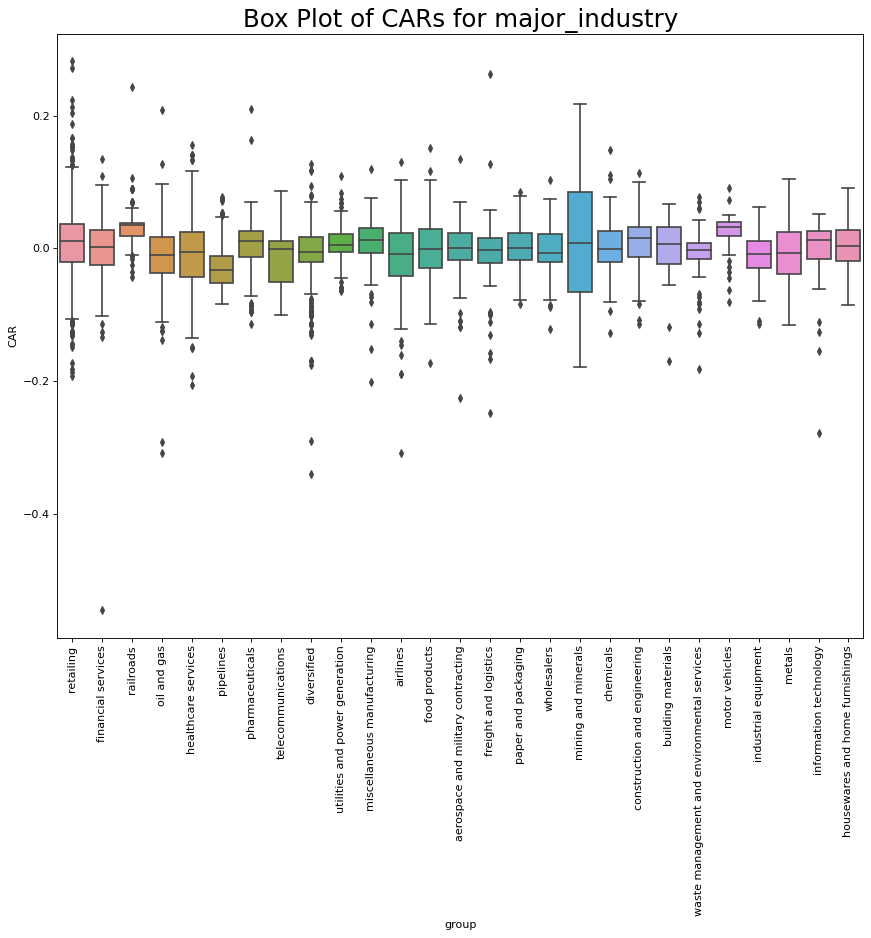

In [ ]:
b = CAAR_by_category(df, events, 'major_industry',\
                     cat_name='Different Groups of Industries', cat_members=Major_industry_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

In [ ]:
'''
a = CAAR_by_category(df, events, 'govt_level',\
                     cat_name='Different Government levels Groups', cat_members=gov_level_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0
'''

"\na = CAAR_by_category(df, events, 'govt_level',                     cat_name='Different Government levels Groups', cat_members=gov_level_group,                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0\n"

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 15 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Primary Offence Groups GROUP workplace safety or health violation
We found AR for 1619 events
AR.shape[1] is 1619


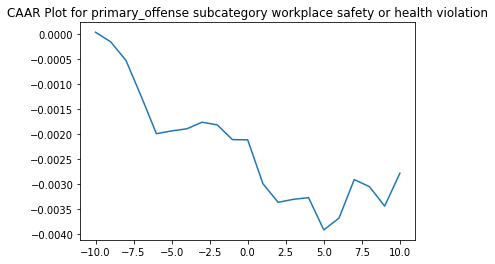

          ARR      CAAR        sd    t_stat   p_value
-10  0.000036  0.000036  0.015728  0.092446  0.926355
-9  -0.000192 -0.000156  0.021852 -0.286944  0.774192
-8  -0.000370 -0.000526  0.025561 -0.827221  0.408234
-7  -0.000716 -0.001242  0.029933 -1.669150  0.095281
-6  -0.000747 -0.001989  0.033849 -2.364207  0.018186
-5   0.000055 -0.001934  0.036480 -2.133068  0.033069
-4   0.000042 -0.001892  0.039121 -1.946031  0.051824
-3   0.000132 -0.001760  0.043289 -1.636258  0.101980
-2  -0.000053 -0.001814  0.045633 -1.599301  0.109949
-1  -0.000295 -0.002109  0.049648 -1.708822  0.087676
 0  -0.000004 -0.002112  0.052256 -1.626313  0.104078
 1  -0.000876 -0.002988  0.055783 -2.155134  0.031298
 2  -0.000372 -0.003360  0.057648 -2.344911  0.019152
 3   0.000060 -0.003300  0.061445 -2.160902  0.030849
 4   0.000033 -0.003267  0.062949 -2.088170  0.036939
 5  -0.000644 -0.003911  0.065720 -2.394354  0.016763
 6   0.000236 -0.003675  0.068575 -2.156170  0.031217
 7   0.000769 -0.002906  0.0

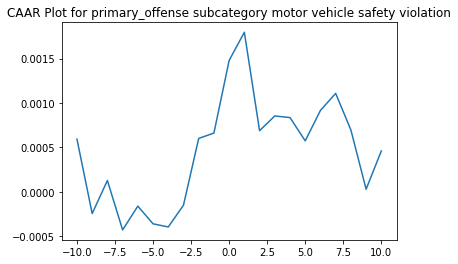

          ARR      CAAR        sd    t_stat   p_value
-10  0.000594  0.000594  0.014482  1.329223  0.184063
-9  -0.000836 -0.000243  0.020529 -0.383257  0.701607
-8   0.000372  0.000129  0.024638  0.169510  0.865428
-7  -0.000555 -0.000427  0.028710 -0.481755  0.630080
-6   0.000267 -0.000159  0.031305 -0.165083  0.868911
-5  -0.000199 -0.000358  0.034659 -0.334902  0.737766
-4  -0.000035 -0.000393  0.037352 -0.341444  0.732837
-3   0.000245 -0.000149  0.039781 -0.121108  0.903629
-2   0.000751  0.000602  0.040667  0.479935  0.631373
-1   0.000060  0.000662  0.042356  0.506795  0.612405
 0   0.000816  0.001479  0.044358  1.080636  0.280107
 1   0.000317  0.001796  0.046255  1.258577  0.208463
 2  -0.001107  0.000689  0.050336  0.443895  0.657210
 3   0.000165  0.000855  0.051747  0.535438  0.592460
 4  -0.000018  0.000836  0.055155  0.491570  0.623126
 5  -0.000262  0.000575  0.057640  0.323155  0.746642
 6   0.000343  0.000917  0.059300  0.501360  0.616223
 7   0.000192  0.001109  0.0

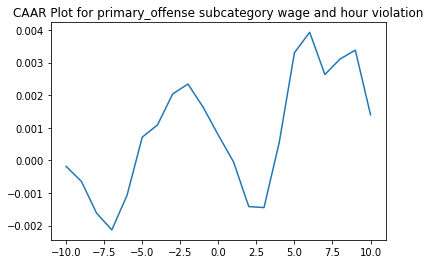

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000185 -0.000185  0.013700 -0.369293  0.712014
-9  -0.000458 -0.000642  0.018071 -0.974253  0.330245
-8  -0.000976 -0.001619  0.023356 -1.899119  0.057932
-7  -0.000513 -0.002132  0.027555 -2.119961  0.034337
-6   0.001061 -0.001070  0.031046 -0.944576  0.345180
-5   0.001784  0.000714  0.034691  0.564175  0.572804
-4   0.000374  0.001088  0.037084  0.804304  0.421476
-3   0.000950  0.002038  0.040129  1.391923  0.164358
-2   0.000306  0.002344  0.043295  1.483772  0.138290
-1  -0.000711  0.001634  0.045118  0.992200  0.321420
 0  -0.000860  0.000774  0.046916  0.451909  0.651465
 1  -0.000822 -0.000048  0.048446 -0.027396  0.978151
 2  -0.001367 -0.001416  0.051422 -0.754411  0.450839
 3  -0.000031 -0.001446  0.051822 -0.764915  0.444563
 4   0.001996  0.000549  0.057141  0.263388  0.792324
 5   0.002754  0.003303  0.065815  1.375373  0.169426
 6   0.000628  0.003931  0.062425  1.725800  0.084795
 7  -0.001296  0.002635  0.0

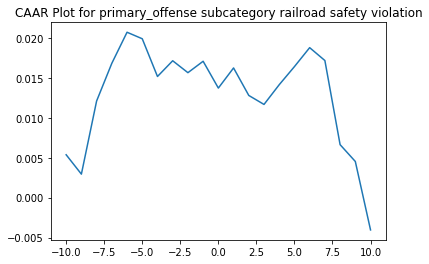

          ARR      CAAR        sd     t_stat        p_value
-10  0.005372  0.005372  0.009455  16.369404   2.133982e-52
-9  -0.002425  0.002947  0.011532   7.363360   4.328347e-13
-8   0.009158  0.012105  0.021928  15.904467   6.577289e-50
-7   0.004726  0.016832  0.023580  20.565022   2.968341e-76
-6   0.003891  0.020722  0.021880  27.284701  1.775021e-117
-5  -0.000817  0.019906  0.024525  23.383209   2.851909e-93
-4  -0.004726  0.015179  0.027265  16.039088   1.262458e-50
-3   0.001970  0.017150  0.027130  18.211131   1.368207e-62
-2  -0.001493  0.015657  0.029894  15.088468   1.239768e-45
-1   0.001430  0.017086  0.031972  15.396050   3.134826e-47
 0  -0.003358  0.013728  0.031523  12.546810   3.468024e-33
 1   0.002520  0.016248  0.034181  13.694830   1.240331e-38
 2  -0.003444  0.012804  0.032851  11.228765   2.467477e-27
 3  -0.001126  0.011678  0.033209  10.130737   8.062510e-23
 4   0.002472  0.014150  0.036182  11.266548   1.701695e-27
 5   0.002269  0.016418  0.036221  13.05

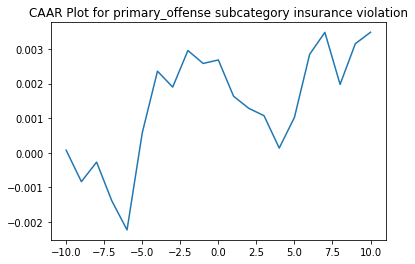

          ARR      CAAR        sd    t_stat   p_value
-10  0.000076  0.000076  0.014892  0.103359  0.917728
-9  -0.000908 -0.000832  0.019210 -0.875636  0.381743
-8   0.000564 -0.000268  0.026276 -0.206078  0.836833
-7  -0.001117 -0.001385  0.030514 -0.917906  0.359211
-6  -0.000839 -0.002224  0.040148 -1.120290  0.263249
-5   0.002802  0.000578  0.039324  0.297085  0.766553
-4   0.001779  0.002357  0.043731  1.089810  0.276440
-3  -0.000459  0.001898  0.052481  0.731337  0.464993
-2   0.001055  0.002953  0.046048  1.297005  0.195362
-1  -0.000374  0.002579  0.053133  0.981621  0.326868
 0   0.000101  0.002680  0.052119  1.040091  0.298914
 1  -0.001047  0.001634  0.057233  0.577311  0.564048
 2  -0.000350  0.001284  0.059842  0.433833  0.664639
 3  -0.000211  0.001073  0.063919  0.339424  0.734465
 4  -0.000935  0.000137  0.064004  0.043410  0.965396
 5   0.000886  0.001024  0.059034  0.350695  0.725998
 6   0.001820  0.002844  0.057999  0.991626  0.321968
 7   0.000632  0.003476  0.0

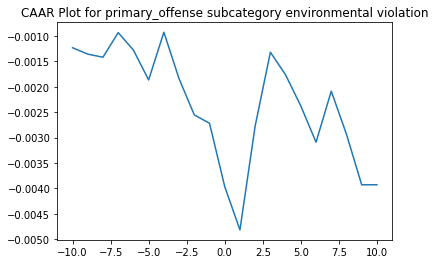

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001232 -0.001232  0.015003 -1.493902  0.136157
-9  -0.000126 -0.001358  0.020904 -1.181784  0.238142
-8  -0.000061 -0.001419  0.024799 -1.040743  0.298757
-7   0.000484 -0.000935  0.029011 -0.586129  0.558190
-6  -0.000225 -0.001159  0.029222 -0.721841  0.470904
-5  -0.000588 -0.001748  0.031156 -1.020543  0.308219
-4   0.000939 -0.000809  0.034463 -0.426907  0.669725
-3  -0.000915 -0.001723  0.036839 -0.851065  0.395351
-2  -0.000713 -0.002436  0.040251 -1.101096  0.271657
-1  -0.000164 -0.002600  0.042529 -1.112196  0.266864
 0  -0.001247 -0.003847  0.044525 -1.572090  0.116888
 1  -0.000853 -0.004700  0.047356 -1.805747  0.071869
 2   0.002047 -0.002653  0.049117 -0.982854  0.326399
 3   0.001452 -0.001202  0.050218 -0.435441  0.663527
 4  -0.000446 -0.001648  0.052382 -0.572349  0.567475
 5  -0.000612 -0.002260  0.057098 -0.720159  0.471937
 6  -0.000714 -0.002974  0.061157 -0.884748  0.376937
 7   0.001006 -0.001968  0.0

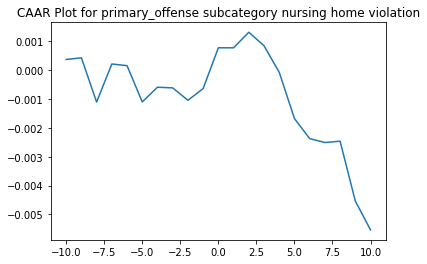

          ARR      CAAR        sd    t_stat   p_value
-10  0.000367  0.000367  0.011026  0.455734  0.649113
-9   0.000057  0.000425  0.016140  0.359973  0.719275
-8  -0.001533 -0.001108  0.020917 -0.724179  0.469865
-7   0.001319  0.000211  0.022036  0.130874  0.896016
-6  -0.000058  0.000153  0.023086  0.090636  0.927879
-5  -0.001257 -0.001104  0.024342 -0.619962  0.536042
-4   0.000509 -0.000594  0.025994 -0.312557  0.754968
-3  -0.000023 -0.000617  0.028676 -0.294316  0.768845
-2  -0.000429 -0.001046  0.028214 -0.507022  0.612740
-1   0.000404 -0.000642  0.030080 -0.291824  0.770747
 0   0.001414  0.000772  0.030650  0.344291  0.731016
 1  -0.000001  0.000771  0.030703  0.343218  0.731822
 2   0.000540  0.001310  0.031824  0.562981  0.574126
 3  -0.000467  0.000843  0.035747  0.322448  0.747475
 4  -0.000920 -0.000077  0.038022 -0.027607  0.978005
 5  -0.001602 -0.001679  0.039551 -0.580474  0.562297
 6  -0.000695 -0.002374  0.039441 -0.823050  0.411533
 7  -0.000136 -0.002510  0.0

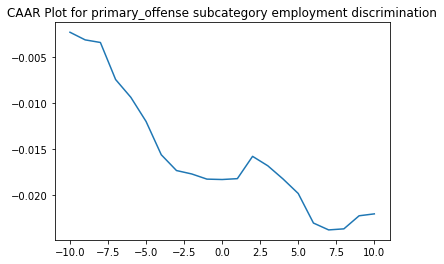

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002325 -0.002325  0.016265 -1.715613  0.088399
-9  -0.000828 -0.003153  0.029152 -1.297906  0.196409
-8  -0.000281 -0.003434  0.025150 -1.638428  0.103531
-7  -0.004013 -0.007447  0.033349 -2.679584  0.008236
-6  -0.001928 -0.009375  0.042015 -2.677640  0.008282
-5  -0.002613 -0.011988  0.049710 -2.893811  0.004403
-4  -0.003610 -0.015597  0.048469 -3.861571  0.000170
-3  -0.001711 -0.017308  0.046090 -4.506291  0.000014
-2  -0.000369 -0.017677  0.055994 -3.788277  0.000223
-1  -0.000561 -0.018237  0.056264 -3.889705  0.000153
 0  -0.000042 -0.018280  0.052329 -4.191873  0.000048
 1   0.000093 -0.018187  0.051253 -4.258139  0.000037
 2   0.002416 -0.015770  0.054685 -3.460674  0.000711
 3  -0.001021 -0.016791  0.057566 -3.500218  0.000620
 4  -0.001428 -0.018219  0.060505 -3.613366  0.000418
 5  -0.001575 -0.019793  0.064715 -3.670267  0.000341
 6  -0.003202 -0.022995  0.068403 -4.034115  0.000089
 7  -0.000745 -0.023740  0.0

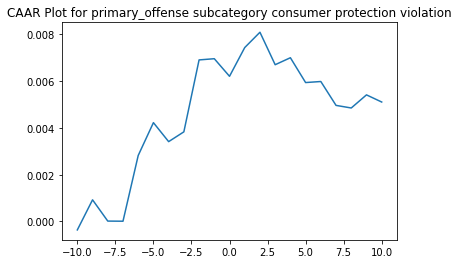

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000361 -0.000361  0.021794 -0.182872  0.855204
-9   0.001286  0.000925  0.023862  0.428145  0.669307
-8  -0.000908  0.000016  0.028385  0.006407  0.994898
-7  -0.000006  0.000011  0.033006  0.003621  0.997117
-6   0.002808  0.002819  0.035509  0.876912  0.382272
-5   0.001404  0.004223  0.040518  1.151171  0.251932
-4  -0.000811  0.003412  0.041284  0.912764  0.363182
-3   0.000418  0.003830  0.049927  0.847265  0.398520
-2   0.003074  0.006903  0.056485  1.349936  0.179556
-1   0.000052  0.006955  0.054295  1.414874  0.159674
 0  -0.000751  0.006204  0.049385  1.387475  0.167847
 1   0.001228  0.007431  0.047967  1.711191  0.089608
 2   0.000655  0.008086  0.053277  1.676414  0.096239
 3  -0.001388  0.006698  0.055691  1.328509  0.186510
 4   0.000298  0.006997  0.062144  1.243623  0.216042
 5  -0.001061  0.005936  0.059456  1.102790  0.272307
 6   0.000045  0.005981  0.060577  1.090516  0.277653
 7  -0.001020  0.004960  0.0

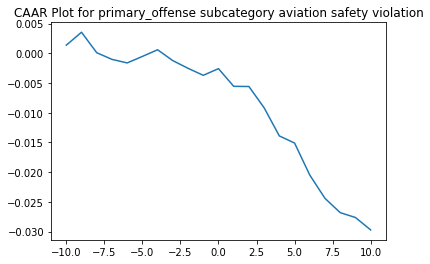

          ARR      CAAR        sd    t_stat   p_value
-10  0.001362  0.001362  0.013001  1.113979  0.267673
-9   0.002173  0.003536  0.022533  1.668052  0.098099
-8  -0.003446  0.000090  0.025641  0.037149  0.970432
-7  -0.001118 -0.001028  0.031562 -0.346217  0.729829
-6  -0.000599 -0.001627  0.037296 -0.463668  0.643786
-5   0.001093 -0.000534  0.041074 -0.138264  0.890280
-4   0.001122  0.000588  0.044936  0.138994  0.889704
-3  -0.001828 -0.001241  0.047000 -0.280622  0.779518
-2  -0.001293 -0.002533  0.046859 -0.574686  0.566656
-1  -0.001178 -0.003712  0.046985 -0.839712  0.402859
 0   0.001122 -0.002590  0.049702 -0.553936  0.580727
 1  -0.002976 -0.005566  0.053968 -1.096259  0.275317
 2  -0.000030 -0.005596  0.055269 -1.076278  0.284116
 3  -0.003584 -0.009179  0.069261 -1.408856  0.161648
 4  -0.004733 -0.013913  0.080065 -1.847183  0.067360
 5  -0.001196 -0.015108  0.074600 -2.152874  0.033474
 6  -0.005392 -0.020501  0.092501 -2.355917  0.020216
 7  -0.003923 -0.024423  0.0

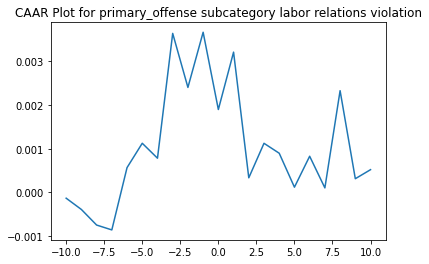

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000136 -0.000136  0.012302 -0.099849  0.920714
-9  -0.000259 -0.000395  0.018138 -0.195985  0.845119
-8  -0.000357 -0.000752  0.022427 -0.301896  0.763515
-7  -0.000112 -0.000864  0.025490 -0.305082  0.761096
-6   0.001429  0.000565  0.025252  0.201448  0.840859
-5   0.000559  0.001124  0.030725  0.329237  0.742837
-4  -0.000343  0.000781  0.031736  0.221592  0.825196
-3   0.002863  0.003645  0.031229  1.050370  0.296711
-2  -0.001240  0.002405  0.034835  0.621377  0.536118
-1   0.001266  0.003671  0.037704  0.876270  0.383507
 0  -0.001773  0.001898  0.049356  0.346146  0.730142
 1   0.001316  0.003215  0.052620  0.549833  0.583966
 2  -0.002883  0.000331  0.064475  0.046272  0.963209
 3   0.000792  0.001123  0.065595  0.154099  0.877919
 4  -0.000228  0.000895  0.074559  0.108042  0.914233
 5  -0.000779  0.000116  0.099584  0.010522  0.991631
 6   0.000710  0.000826  0.093796  0.079267  0.937018
 7  -0.000726  0.000100  0.1

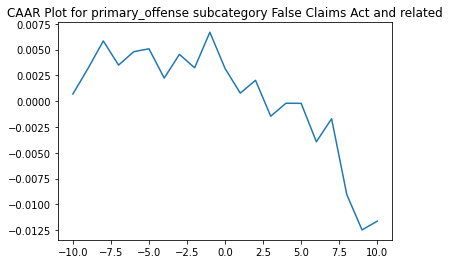

          ARR      CAAR        sd    t_stat   p_value
-10  0.000691  0.000691  0.011695  0.483826  0.630111
-9   0.002492  0.003183  0.017978  1.449306  0.151987
-8   0.002645  0.005829  0.019942  2.392374  0.019595
-7  -0.002340  0.003488  0.022459  1.271309  0.208081
-6   0.001302  0.004790  0.039216  0.999769  0.321074
-5   0.000280  0.005070  0.039689  1.045654  0.299535
-4  -0.002838  0.002232  0.047972  0.380854  0.704535
-3   0.002296  0.004528  0.050829  0.729168  0.468479
-2  -0.001297  0.003231  0.053415  0.495080  0.622188
-1   0.003443  0.006674  0.063553  0.859538  0.393155
 0  -0.003511  0.003162  0.063995  0.404479  0.687169
 1  -0.002392  0.000771  0.072631  0.086835  0.931066
 2   0.001248  0.002018  0.075043  0.220146  0.826437
 3  -0.003481 -0.001462  0.095351 -0.125537  0.900480
 4   0.001256 -0.000206  0.091541 -0.018462  0.985326
 5  -0.000010 -0.000216  0.092595 -0.019108  0.984813
 6  -0.003724 -0.003940  0.109956 -0.293327  0.770193
 7   0.002233 -0.001707  0.0

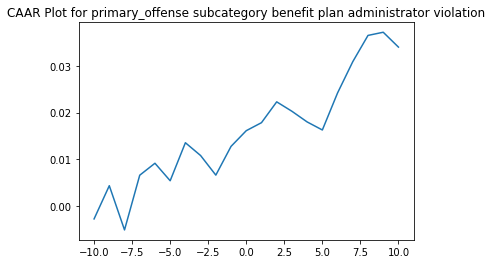

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002674 -0.002674  0.019868 -0.882707  0.382419
-9   0.007084  0.004409  0.041272  0.700543  0.487451
-8  -0.009429 -0.005020  0.044863 -0.733739  0.467184
-7   0.011667  0.006647  0.039707  1.097744  0.278570
-6   0.002549  0.009196  0.041822  1.441853  0.156760
-5  -0.003732  0.005464  0.043016  0.832980  0.409568
-4   0.008109  0.013573  0.046921  1.896962  0.064723
-3  -0.002732  0.010841  0.049380  1.439633  0.157384
-2  -0.004176  0.006665  0.054936  0.795615  0.430729
-1   0.006130  0.012796  0.054704  1.533837  0.132569
 0   0.003347  0.016143  0.057043  1.855690  0.070524
 1   0.001708  0.017850  0.054956  2.129891  0.039083
 2   0.004441  0.022291  0.057068  2.561340  0.014108
 3  -0.002009  0.020282  0.058124  2.288115  0.027230
 4  -0.002274  0.018007  0.056119  2.104148  0.041392
 5  -0.001716  0.016292  0.055278  1.932648  0.060042
 6   0.007903  0.024195  0.054194  2.927589  0.005495
 7   0.006668  0.030863  0.0

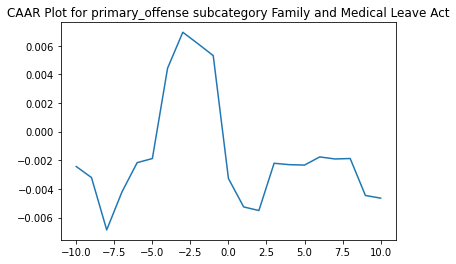

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002434 -0.002434  0.012587 -1.076836  0.290137
-9  -0.000769 -0.003204  0.020715 -0.861078  0.396025
-8  -0.003656 -0.006859  0.025222 -1.514206  0.140439
-7   0.002644 -0.004215  0.027391 -0.856805  0.398346
-6   0.002050 -0.002165  0.027776 -0.433933  0.667442
-5   0.000289 -0.001876  0.031398 -0.332596  0.741752
-4   0.006304  0.004429  0.034227  0.720455  0.476821
-3   0.002510  0.006939  0.035544  1.087006  0.285691
-2  -0.000803  0.006136  0.035764  0.955272  0.347075
-1  -0.000830  0.005306  0.036152  0.817217  0.420248
 0  -0.008579 -0.003273  0.043512 -0.418753  0.678380
 1  -0.001981 -0.005254  0.054348 -0.538237  0.594385
 2  -0.000252 -0.005506  0.056801 -0.539724  0.593371
 3   0.003300 -0.002206  0.058304 -0.210694  0.834551
 4  -0.000097 -0.002304  0.056078 -0.228722  0.820637
 5  -0.000029 -0.002333  0.054781 -0.237121  0.814175
 6   0.000570 -0.001763  0.056819 -0.172806  0.863964
 7  -0.000143 -0.001907  0.0

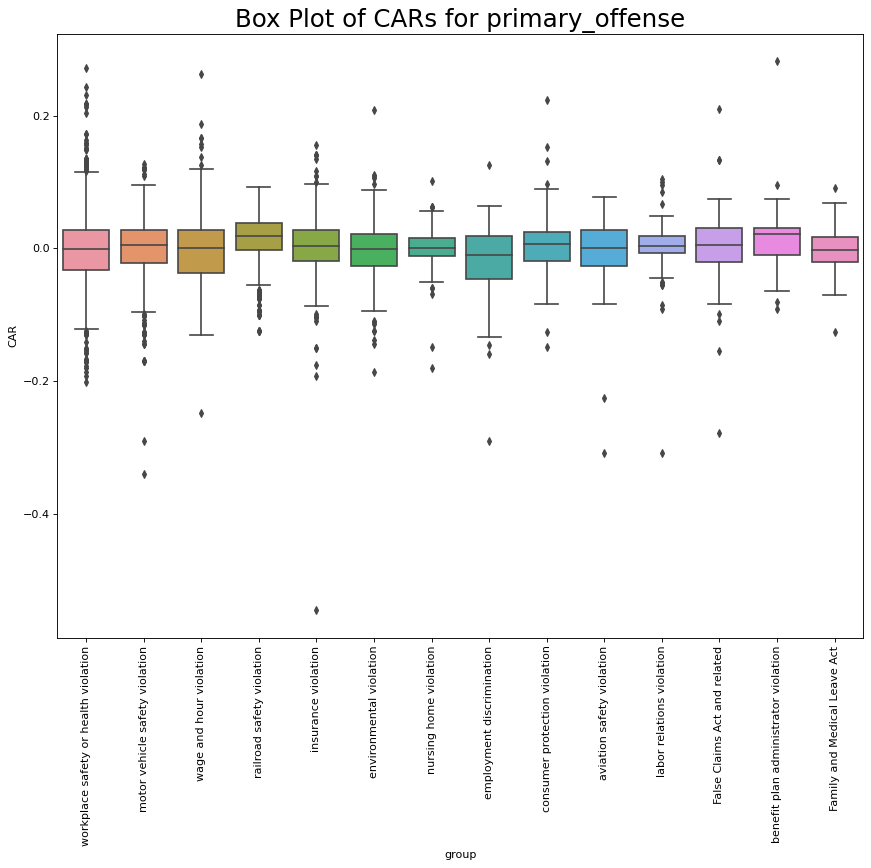

In [ ]:
a = CAAR_by_category(df, events, 'primary_offense',\
                     cat_name='Different Primary Offence Groups', cat_members=primary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
CAR FOR Different Secondary Offence Groups GROUP Fair Labor Standards Act
We found AR for 619 events
AR.shape[1] is 619


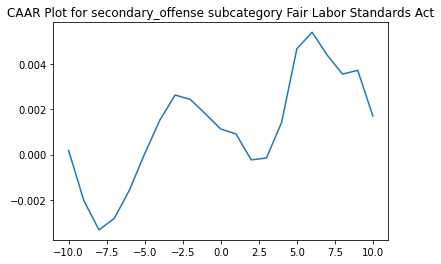

          ARR      CAAR        sd    t_stat   p_value
-10  0.000179  0.000179  0.012340  0.361392  0.717930
-9  -0.002209 -0.002029  0.016251 -3.106998  0.001977
-8  -0.001302 -0.003331  0.020322 -4.078092  0.000051
-7   0.000507 -0.002824  0.023375 -3.005277  0.002761
-6   0.001252 -0.001571  0.027691 -1.411870  0.158492
-5   0.001606  0.000034  0.029351  0.029035  0.976846
-4   0.001487  0.001521  0.031990  1.183227  0.237174
-3   0.001105  0.002626  0.035132  1.859631  0.063413
-2  -0.000193  0.002433  0.037659  1.607198  0.108522
-1  -0.000642  0.001791  0.039415  1.130680  0.258628
 0  -0.000666  0.001126  0.039559  0.707933  0.479254
 1  -0.000217  0.000909  0.040364  0.560155  0.575576
 2  -0.001146 -0.000237  0.041049 -0.143934  0.885600
 3   0.000081 -0.000157  0.042039 -0.092682  0.926187
 4   0.001577  0.001421  0.042767  0.826601  0.408783
 5   0.003247  0.004668  0.045652  2.543976  0.011202
 6   0.000732  0.005400  0.046220  2.906856  0.003782
 7  -0.001015  0.004385  0.0

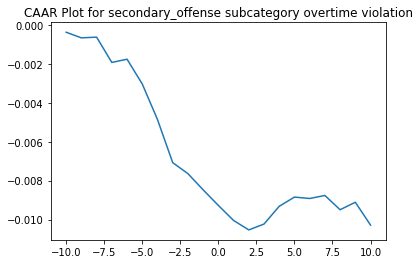

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000361 -0.000361  0.013414 -0.532662  0.594571
-9  -0.000290 -0.000651  0.019555 -0.658221  0.510784
-8   0.000038 -0.000613  0.022938 -0.528042  0.597771
-7  -0.001303 -0.001916  0.028843 -1.313342  0.189840
-6   0.000167 -0.001749  0.032086 -1.077815  0.281783
-5  -0.001275 -0.003024  0.035972 -1.662250  0.097266
-4  -0.001829 -0.004853  0.038082 -2.519976  0.012135
-3  -0.002219 -0.007072  0.040867 -3.421885  0.000688
-2  -0.000567 -0.007639  0.042964 -3.515638  0.000490
-1  -0.000834 -0.008473  0.043351 -3.864589  0.000130
 0  -0.000802 -0.009275  0.045759 -4.008016  0.000073
 1  -0.000774 -0.010049  0.048999 -4.055213  0.000061
 2  -0.000487 -0.010536  0.051672 -4.031842  0.000067
 3   0.000302 -0.010234  0.054087 -3.741436  0.000210
 4   0.000914 -0.009320  0.056906 -3.238486  0.001305
 5   0.000474 -0.008846  0.059418 -2.943875  0.003435
 6  -0.000072 -0.008918  0.061627 -2.861328  0.004446
 7   0.000155 -0.008762  0.0

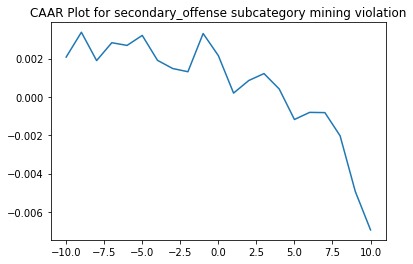

          ARR      CAAR        sd    t_stat   p_value
-10  0.002075  0.002075  0.020035  1.832646  0.067808
-9   0.001295  0.003370  0.026191  2.276536  0.023491
-8  -0.001479  0.001892  0.029441  1.136710  0.256532
-7   0.000933  0.002824  0.035253  1.417441  0.157352
-6  -0.000142  0.002683  0.040476  1.172695  0.241813
-5   0.000522  0.003205  0.046054  1.231353  0.219118
-4  -0.001300  0.001906  0.050853  0.663012  0.507812
-3  -0.000427  0.001478  0.056503  0.462929  0.643738
-2  -0.000168  0.001311  0.061697  0.375841  0.707291
-1   0.001993  0.003304  0.066619  0.877447  0.380919
 0  -0.001152  0.002152  0.068459  0.556033  0.578587
 1  -0.001954  0.000197  0.073217  0.047641  0.962033
 2   0.000657  0.000854  0.076621  0.197161  0.843830
 3   0.000361  0.001215  0.081780  0.262779  0.792895
 4  -0.000805  0.000410  0.084142  0.086204  0.931360
 5  -0.001590 -0.001180  0.088515 -0.235816  0.813730
 6   0.000371 -0.000809  0.094378 -0.151646  0.879564
 7  -0.000012 -0.000821  0.0

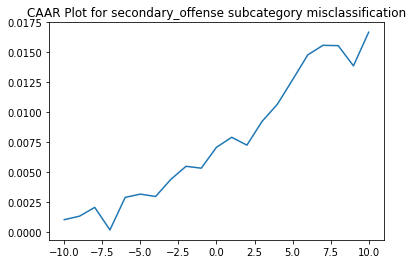

          ARR      CAAR        sd    t_stat   p_value
-10  0.001053  0.001053  0.011759  1.093169  0.276096
-9   0.000292  0.001345  0.019048  0.861741  0.390224
-8   0.000734  0.002078  0.022328  1.136218  0.257702
-7  -0.001879  0.000199  0.027255  0.089086  0.929134
-6   0.002712  0.002911  0.029685  1.196866  0.233273
-5   0.000273  0.003184  0.032264  1.204516  0.230313
-4  -0.000197  0.002987  0.034525  1.056102  0.292643
-3   0.001422  0.004409  0.036903  1.458494  0.146823
-2   0.001093  0.005503  0.036957  1.817531  0.071158
-1  -0.000157  0.005345  0.038149  1.710365  0.089294
 0   0.001742  0.007088  0.039377  2.197216  0.029560
 1   0.000835  0.007923  0.039960  2.420160  0.016726
 2  -0.000656  0.007267  0.041250  2.150303  0.033156
 3   0.001985  0.009252  0.042646  2.648229  0.008969
 4   0.001422  0.010674  0.044177  2.949433  0.003702
 5   0.002041  0.012715  0.044805  3.464114  0.000696
 6   0.002077  0.014793  0.046088  3.917840  0.000136
 7   0.000800  0.015592  0.0

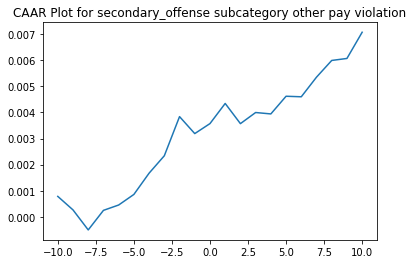

          ARR      CAAR        sd    t_stat   p_value
-10  0.000782  0.000782  0.010799  0.875516  0.382741
-9  -0.000518  0.000264  0.015626  0.204292  0.838412
-8  -0.000766 -0.000502  0.017903 -0.338783  0.735263
-7   0.000749  0.000247  0.020740  0.144072  0.885644
-6   0.000205  0.000453  0.022193  0.246427  0.805700
-5   0.000405  0.000858  0.024802  0.417882  0.676651
-4   0.000815  0.001673  0.026005  0.777214  0.438299
-3   0.000667  0.002340  0.028977  0.975531  0.330922
-2   0.001500  0.003839  0.030436  1.524175  0.129643
-1  -0.000651  0.003189  0.030475  1.264222  0.208179
 0   0.000383  0.003572  0.032156  1.342233  0.181618
 1   0.000771  0.004343  0.033511  1.566078  0.119510
 2  -0.000773  0.003570  0.034722  1.242387  0.216099
 3   0.000426  0.003996  0.035431  1.362870  0.175036
 4  -0.000054  0.003942  0.037192  1.280758  0.202323
 5   0.000677  0.004620  0.038546  1.448131  0.149739
 6  -0.000021  0.004599  0.039921  1.392057  0.166037
 7   0.000752  0.005351  0.0

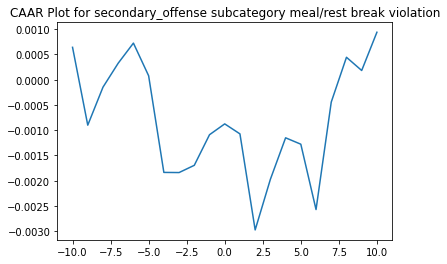

          ARR      CAAR        sd    t_stat   p_value
-10  0.000641  0.000641  0.010270  0.614642  0.540245
-9  -0.001542 -0.000901  0.019990 -0.443745  0.658225
-8   0.000752 -0.000148  0.025169 -0.058048  0.953831
-7   0.000475  0.000326  0.026610  0.120812  0.904092
-6   0.000398  0.000724  0.028698  0.248572  0.804223
-5  -0.000647  0.000078  0.029935  0.025499  0.979710
-4  -0.001914 -0.001836  0.031561 -0.573020  0.567971
-3  -0.000003 -0.001839  0.032734 -0.553357  0.581306
-2   0.000143 -0.001696  0.034457 -0.484677  0.629010
-1   0.000606 -0.001090  0.036811 -0.291637  0.771193
 0   0.000215 -0.000875  0.039126 -0.220343  0.826072
 1  -0.000198 -0.001073  0.040268 -0.262516  0.793486
 2  -0.001902 -0.002975  0.041365 -0.708359  0.480439
 3   0.001002 -0.001973  0.043166 -0.450152  0.653616
 4   0.000822 -0.001151  0.045832 -0.247359  0.805159
 5  -0.000126 -0.001278  0.047391 -0.265504  0.791191
 6  -0.001294 -0.002572  0.048589 -0.521291  0.603364
 7   0.002128 -0.000443  0.0

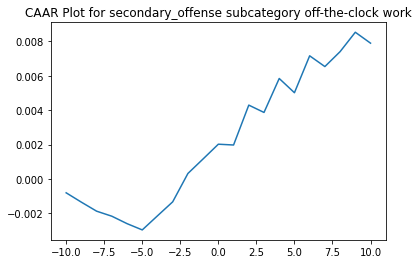

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000800 -0.000800  0.011632 -0.656153  0.513399
-9  -0.000544 -0.001344  0.017620 -0.727630  0.468729
-8  -0.000523 -0.001867  0.023824 -0.747533  0.456690
-7  -0.000292 -0.002159  0.028157 -0.731407  0.466430
-6  -0.000432 -0.002591  0.029240 -0.845256  0.400209
-5  -0.000364 -0.002955  0.031751 -0.887922  0.376950
-4   0.000818 -0.002137  0.036616 -0.556746  0.579083
-3   0.000813 -0.001324  0.041250 -0.306161  0.760189
-2   0.001647  0.000324  0.045988  0.067114  0.946640
-1   0.000846  0.001170  0.046006  0.242592  0.808873
 0   0.000854  0.002024  0.046194  0.417900  0.677016
 1  -0.000046  0.001977  0.048785  0.386641  0.699934
 2   0.002317  0.004294  0.051769  0.791297  0.430851
 3  -0.000426  0.003868  0.053006  0.696195  0.488101
 4   0.001973  0.005841  0.056582  0.984801  0.327362
 5  -0.000827  0.005014  0.061371  0.779368  0.437808
 6   0.002144  0.007158  0.060956  1.120233  0.265595
 7  -0.000625  0.006534  0.0

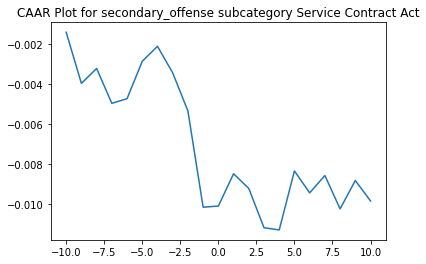

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001389 -0.001389  0.010817 -0.986457  0.328006
-9  -0.002563 -0.003952  0.021256 -1.428034  0.158645
-8   0.000746 -0.003206  0.022764 -1.081701  0.283863
-7  -0.001748 -0.004954  0.022606 -1.683277  0.097697
-6   0.000232 -0.004721  0.029144 -1.244380  0.218365
-5   0.001875 -0.002846  0.031393 -0.696376  0.488975
-4   0.000753 -0.002093  0.030092 -0.534356  0.595138
-3  -0.001333 -0.003426  0.029672 -0.886985  0.378750
-2  -0.001910 -0.005337  0.033712 -1.215961  0.228926
-1  -0.004825 -0.010162  0.037562 -2.078078  0.042138
 0   0.000058 -0.010104  0.039757 -1.952160  0.055752
 1   0.001620 -0.008484  0.039675 -1.642512  0.105895
 2  -0.000738 -0.009222  0.041623 -1.701840  0.094140
 3  -0.001968 -0.011191  0.040818 -2.105814  0.039560
 4  -0.000110 -0.011301  0.041691 -2.082009  0.041764
 5   0.002957 -0.008343  0.042354 -1.513084  0.135689
 6  -0.001099 -0.009442  0.044911 -1.614900  0.111760
 7   0.000869 -0.008574  0.0

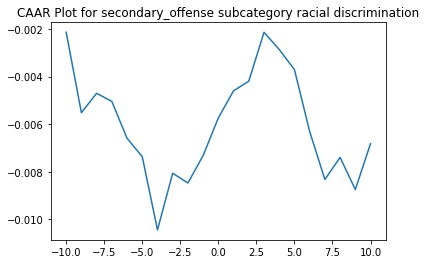

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002135 -0.002135  0.013914 -1.158539  0.251561
-9  -0.003380 -0.005515  0.017253 -2.413355  0.019103
-8   0.000814 -0.004701  0.020036 -1.771309  0.081951
-7  -0.000339 -0.005040  0.023898 -1.592242  0.116960
-6  -0.001550 -0.006590  0.027729 -1.794258  0.078171
-5  -0.000771 -0.007361  0.031099 -1.787034  0.079345
-4  -0.003078 -0.010439  0.034375 -2.292652  0.025647
-3   0.002381 -0.008058  0.038103 -1.596519  0.116001
-2  -0.000410 -0.008467  0.038331 -1.667777  0.100943
-1   0.001152 -0.007315  0.039944 -1.382644  0.172263
 0   0.001583 -0.005732  0.040132 -1.078303  0.285521
 1   0.001138 -0.004594  0.041800 -0.829808  0.410171
 2   0.000403 -0.004192  0.042542 -0.743906  0.460043
 3   0.002057 -0.002135  0.041972 -0.384081  0.702373
 4  -0.000724 -0.002859  0.044092 -0.489627  0.626311
 5  -0.000847 -0.003706  0.043836 -0.638290  0.525887
 6  -0.002599 -0.006305  0.042207 -1.127773  0.264225
 7  -0.002015 -0.008320  0.0

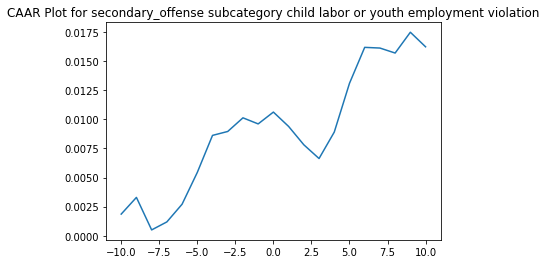

          ARR      CAAR        sd    t_stat   p_value
-10  0.001860  0.001860  0.009005  1.503321  0.138806
-9   0.001435  0.003295  0.013417  1.787771  0.079641
-8  -0.002795  0.000500  0.019832  0.183482  0.855133
-7   0.000688  0.001188  0.022051  0.392168  0.696537
-6   0.001522  0.002710  0.025370  0.777515  0.440378
-5   0.002732  0.005442  0.030502  1.298888  0.199713
-4   0.003184  0.008626  0.032382  1.939273  0.057903
-3   0.000336  0.008962  0.031402  2.077797  0.042682
-2   0.001173  0.010135  0.036173  2.039761  0.046469
-1  -0.000522  0.009613  0.038512  1.817120  0.074963
 0   0.001016  0.010629  0.042071  1.839291  0.071585
 1  -0.001234  0.009396  0.043048  1.588940  0.118136
 2  -0.001578  0.007818  0.046644  1.220171  0.227905
 3  -0.001181  0.006636  0.046643  1.035812  0.305083
 4   0.002273  0.008909  0.047349  1.369826  0.176627
 5   0.004191  0.013100  0.047416  2.011358  0.049484
 6   0.003093  0.016193  0.047544  2.479541  0.016433
 7  -0.000059  0.016134  0.0

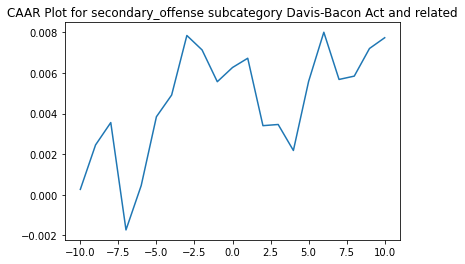

          ARR      CAAR        sd    t_stat   p_value
-10  0.000267  0.000267  0.011484  0.150868  0.880820
-9   0.002188  0.002455  0.012428  1.280157  0.207686
-8   0.001103  0.003558  0.018390  1.253722  0.217045
-7  -0.005286 -0.001729  0.020545 -0.545260  0.588529
-6   0.002185  0.000456  0.020387  0.145019  0.885406
-5   0.003389  0.003845  0.024668  1.010223  0.318313
-4   0.001068  0.004913  0.026556  1.198990  0.237416
-3   0.002933  0.007846  0.027641  1.839477  0.073094
-2  -0.000712  0.007134  0.030123  1.534828  0.132508
-1  -0.001564  0.005570  0.036667  0.984421  0.330682
 0   0.000699  0.006269  0.038820  1.046559  0.301434
 1   0.000456  0.006725  0.036534  1.192949  0.239747
 2  -0.003320  0.003405  0.038734  0.569680  0.572003
 3   0.000058  0.003463  0.038735  0.579383  0.565501
 4  -0.001280  0.002183  0.042154  0.335658  0.738840
 5   0.003400  0.005583  0.042106  0.859377  0.395130
 6   0.002422  0.008005  0.042084  1.232779  0.224680
 7  -0.002325  0.005681  0.0

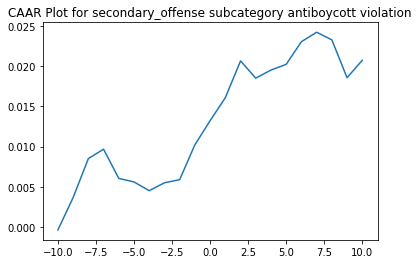

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000375 -0.000375  0.015159 -0.137606  0.891471
-9   0.004026  0.003652  0.019886  1.022451  0.314742
-8   0.004852  0.008504  0.021313  2.221586  0.034002
-7   0.001163  0.009667  0.025766  2.088843  0.045307
-6  -0.003636  0.006031  0.029324  1.145088  0.261226
-5  -0.000436  0.005595  0.031421  0.991371  0.329434
-4  -0.001089  0.004506  0.032218  0.778702  0.442255
-3   0.000984  0.005490  0.031641  0.966142  0.341698
-2   0.000384  0.005875  0.032088  1.019345  0.316189
-1   0.004345  0.010220  0.035967  1.582065  0.124122
 0   0.002994  0.013214  0.034326  2.143356  0.040313
 1   0.002862  0.016076  0.038237  2.340831  0.026080
 2   0.004578  0.020654  0.039130  2.938863  0.006282
 3  -0.002147  0.018507  0.044338  2.324045  0.027083
 4   0.001009  0.019516  0.047118  2.306142  0.028192
 5   0.000708  0.020225  0.045513  2.474153  0.019235
 6   0.002817  0.023042  0.044820  2.862389  0.007595
 7   0.001177  0.024219  0.0

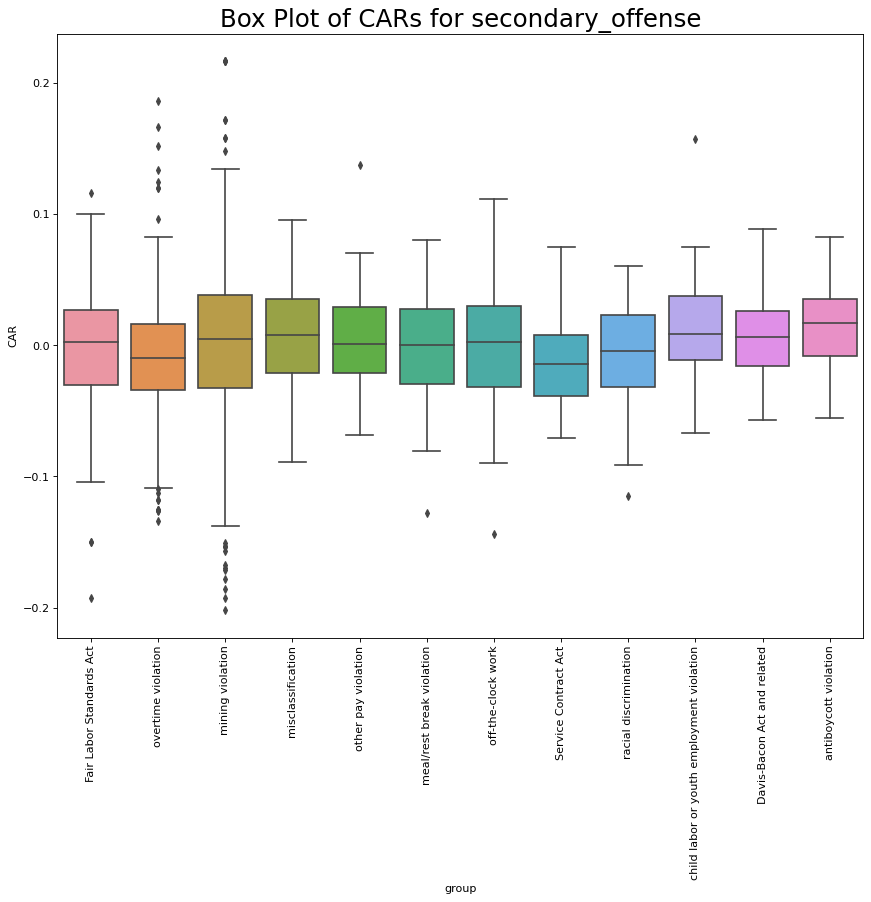

In [ ]:
a = CAAR_by_category(df, events, 'secondary_offense',\
                     cat_name='Different Secondary Offence Groups', cat_members=secondary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 129 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 15 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Agency Groups GROUP OSHA
We found AR for 1435 events
AR.shape[1] is 1435


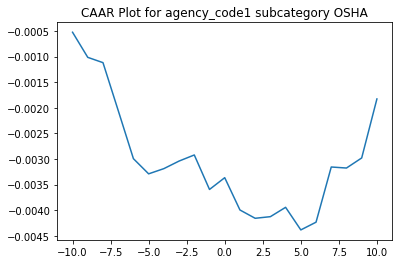

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000524 -0.000524  0.014449 -1.373116  0.169931
-9  -0.000491 -0.001014  0.020483 -1.875987  0.060860
-8  -0.000104 -0.001118  0.024136 -1.754648  0.079533
-7  -0.000935 -0.002053  0.028110 -2.766379  0.005741
-6  -0.000942 -0.002994  0.031644 -3.584698  0.000349
-5  -0.000296 -0.003291  0.033304 -3.743069  0.000189
-4   0.000102 -0.003189  0.035923 -3.363004  0.000791
-3   0.000148 -0.003041  0.039709 -2.901140  0.003775
-2   0.000119 -0.002922  0.041362 -2.676125  0.007533
-1  -0.000674 -0.003596  0.045105 -3.020112  0.002571
 0   0.000230 -0.003366  0.047713 -2.672349  0.007618
 1  -0.000631 -0.003997  0.050885 -2.975697  0.002972
 2  -0.000162 -0.004159  0.052452 -3.003959  0.002711
 3   0.000032 -0.004128  0.055523 -2.816194  0.004926
 4   0.000183 -0.003945  0.057183 -2.613439  0.009057
 5  -0.000442 -0.004387  0.059732 -2.781963  0.005474
 6   0.000151 -0.004236  0.061632 -2.603371  0.009326
 7   0.001078 -0.003157  0.0

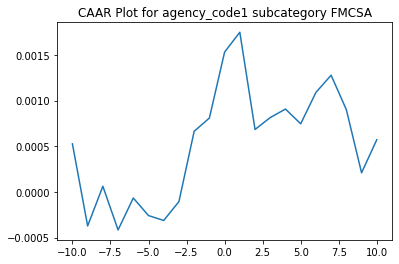

          ARR      CAAR        sd    t_stat   p_value
-10  0.000526  0.000526  0.014567  1.181441  0.237690
-9  -0.000898 -0.000372  0.020564 -0.592513  0.553632
-8   0.000434  0.000062  0.024584  0.082598  0.934187
-7  -0.000477 -0.000415  0.028599 -0.475568  0.634479
-6   0.000349 -0.000067  0.031204 -0.069827  0.944345
-5  -0.000192 -0.000259  0.034529 -0.245193  0.806354
-4  -0.000054 -0.000312  0.037231 -0.274501  0.783753
-3   0.000207 -0.000105  0.039720 -0.086887  0.930778
-2   0.000769  0.000664  0.040590  0.535214  0.592613
-1   0.000145  0.000808  0.042233  0.626519  0.531108
 0   0.000721  0.001529  0.044142  1.134423  0.256871
 1   0.000217  0.001747  0.046112  1.240128  0.215200
 2  -0.001064  0.000683  0.050142  0.445969  0.655710
 3   0.000135  0.000818  0.051629  0.518679  0.604092
 4   0.000093  0.000911  0.055025  0.541925  0.587983
 5  -0.000161  0.000750  0.057568  0.426286  0.669985
 6   0.000343  0.001093  0.059236  0.603889  0.546045
 7   0.000188  0.001281  0.0

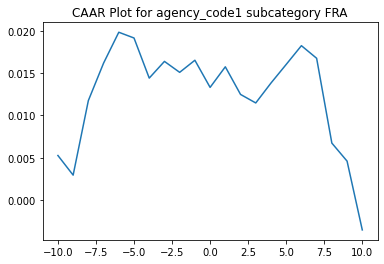

          ARR      CAAR        sd     t_stat        p_value
-10  0.005271  0.005271  0.009562  16.249477   4.871449e-52
-9  -0.002316  0.002955  0.011588   7.517439   1.391946e-13
-8   0.008801  0.011756  0.021722  15.953958   1.927312e-50
-7   0.004420  0.016176  0.023652  20.160653   1.935674e-74
-6   0.003646  0.019822  0.022545  25.917706  3.792816e-110
-5  -0.000679  0.019142  0.024868  22.691659   7.228721e-90
-4  -0.004734  0.014408  0.027415  15.492764   5.569804e-48
-3   0.001972  0.016380  0.027188  17.760641   1.951377e-60
-2  -0.001292  0.015088  0.029794  14.928895   5.003115e-45
-1   0.001428  0.016516  0.031797  15.312182   4.994139e-47
 0  -0.003205  0.013311  0.031413  12.491638   4.766383e-33
 1   0.002431  0.015743  0.034089  13.613435   2.152460e-38
 2  -0.003262  0.012481  0.032889  11.186464   3.122894e-27
 3  -0.001006  0.011475  0.033432  10.118138   7.984171e-23
 4   0.002351  0.013826  0.036172  11.267466   1.402810e-27
 5   0.002195  0.016021  0.036230  13.03

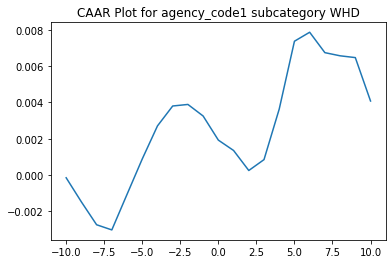

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000145 -0.000145  0.012992 -0.273865  0.784283
-9  -0.001327 -0.001472  0.017719 -2.040030  0.041783
-8  -0.001258 -0.002730  0.022081 -3.036149  0.002500
-7  -0.000284 -0.003014  0.026877 -2.754099  0.006063
-6   0.001958 -0.001056  0.030282 -0.856485  0.392071
-5   0.001948  0.000892  0.033849  0.646905  0.517940
-4   0.001818  0.002710  0.035463  1.876613  0.061055
-3   0.001095  0.003806  0.037966  2.461417  0.014118
-2   0.000086  0.003891  0.041743  2.289032  0.022423
-1  -0.000637  0.003254  0.043308  1.845274  0.065489
 0  -0.001327  0.001928  0.044856  1.055404  0.291664
 1  -0.000570  0.001358  0.046804  0.712382  0.476504
 2  -0.001102  0.000256  0.047856  0.131221  0.895645
 3   0.000599  0.000855  0.048555  0.432162  0.665779
 4   0.002782  0.003637  0.051571  1.731572  0.083862
 5   0.003734  0.007370  0.056016  3.230846  0.001302
 6   0.000495  0.007865  0.056895  3.394416  0.000733
 7  -0.001123  0.006741  0.0

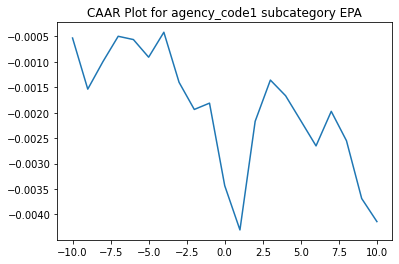

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000531 -0.000531  0.014092 -0.616962  0.537786
-9  -0.001005 -0.001536  0.021001 -1.197533  0.232161
-8   0.000542 -0.000994  0.024471 -0.665035  0.506602
-7   0.000497 -0.000497  0.028323 -0.287267  0.774131
-6   0.000082 -0.000415  0.028492 -0.238669  0.811546
-5  -0.000347 -0.000762  0.030583 -0.407979  0.683616
-4   0.000491 -0.000271  0.034097 -0.130338  0.896398
-3  -0.000985 -0.001256  0.036447 -0.564370  0.572976
-2  -0.000534 -0.001790  0.040477 -0.723964  0.469722
-1   0.000124 -0.001666  0.042760 -0.637726  0.524199
 0  -0.001623 -0.003289  0.044809 -1.201549  0.230603
 1  -0.000870 -0.004159  0.047829 -1.423572  0.155738
 2   0.002136 -0.002023  0.049712 -0.666217  0.505847
 3   0.000811 -0.001212  0.050698 -0.391352  0.695849
 4  -0.000308 -0.001520  0.053555 -0.464677  0.642542
 5  -0.000492 -0.002012  0.058499 -0.563101  0.573838
 6  -0.000494 -0.002507  0.062590 -0.655618  0.512634
 7   0.000679 -0.001827  0.0

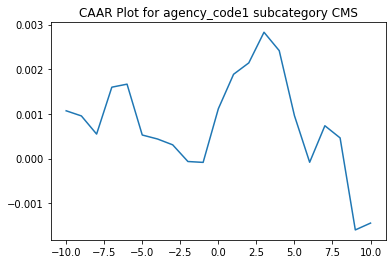

          ARR      CAAR        sd    t_stat   p_value
-10  0.001068  0.001068  0.011694  1.361340  0.174793
-9  -0.000115  0.000954  0.016549  0.858590  0.391497
-8  -0.000407  0.000547  0.021705  0.375383  0.707736
-7   0.001050  0.001597  0.022184  1.072685  0.284582
-6   0.000068  0.001665  0.024053  1.031392  0.303485
-5  -0.001139  0.000526  0.024952  0.314087  0.753751
-4  -0.000089  0.000437  0.027775  0.234488  0.814823
-3  -0.000131  0.000306  0.032012  0.142549  0.886777
-2  -0.000374 -0.000067  0.033099 -0.030359  0.975808
-1  -0.000020 -0.000087  0.035371 -0.036656  0.970792
 0   0.001202  0.001115  0.036083  0.460318  0.645741
 1   0.000771  0.001886  0.034061  0.825027  0.410246
 2   0.000255  0.002141  0.036135  0.882777  0.378316
 3   0.000687  0.002828  0.036278  1.161301  0.246772
 4  -0.000412  0.002416  0.039552  0.909953  0.363839
 5  -0.001455  0.000960  0.041314  0.346295  0.729451
 6  -0.001044 -0.000084  0.041672 -0.030100  0.976014
 7   0.000818  0.000734  0.0

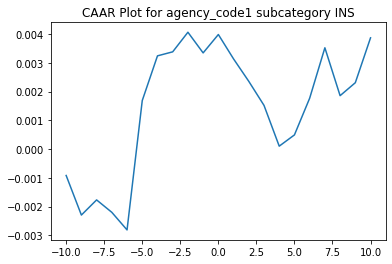

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000921 -0.000921  0.014308 -0.965655  0.335258
-9  -0.001377 -0.002298  0.017448 -1.975273  0.049465
-8   0.000527 -0.001770  0.025993 -1.021690  0.308030
-7  -0.000432 -0.002203  0.029746 -1.110740  0.267871
-6  -0.000612 -0.002814  0.040757 -1.035765  0.301428
-5   0.004500  0.001686  0.038093  0.663935  0.507415
-4   0.001554  0.003240  0.043559  1.115883  0.265668
-3   0.000140  0.003380  0.056363  0.899615  0.369291
-2   0.000681  0.004062  0.046653  1.305930  0.192916
-1  -0.000718  0.003343  0.057133  0.877799  0.380993
 0   0.000639  0.003983  0.055987  1.067005  0.287118
 1  -0.000849  0.003134  0.063568  0.739405  0.460435
 2  -0.000780  0.002354  0.066973  0.527169  0.598598
 3  -0.000836  0.001518  0.072395  0.314459  0.753465
 4  -0.001418  0.000099  0.071188  0.020922  0.983326
 5   0.000391  0.000491  0.061283  0.120097  0.904514
 6   0.001276  0.001767  0.058502  0.452970  0.651008
 7   0.001755  0.003521  0.0

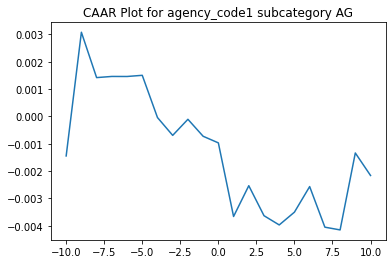

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001446 -0.001446  0.019673 -1.075267  0.283472
-9   0.004522  0.003076  0.022791  1.974139  0.049658
-8  -0.001658  0.001418  0.029902  0.693583  0.488699
-7   0.000042  0.001460  0.032369  0.659775  0.510111
-6  -0.000002  0.001458  0.035571  0.599769  0.549298
-5   0.000043  0.001501  0.038841  0.565438  0.572371
-4  -0.001544 -0.000043  0.041422 -0.015038  0.988016
-3  -0.000651 -0.000694  0.047122 -0.215472  0.829606
-2   0.000588 -0.000106  0.048323 -0.032217  0.974329
-1  -0.000620 -0.000727  0.053119 -0.200155  0.841550
 0  -0.000242 -0.000968  0.056117 -0.252420  0.800960
 1  -0.002691 -0.003659  0.056543 -0.946684  0.344873
 2   0.001125 -0.002534  0.059254 -0.625631  0.532227
 3  -0.001096 -0.003630  0.062492 -0.849828  0.396375
 4  -0.000338 -0.003968  0.064406 -0.901295  0.368450
 5   0.000468 -0.003500  0.066057 -0.775210  0.439075
 6   0.000935 -0.002566  0.070411 -0.533102  0.594518
 7  -0.001484 -0.004050  0.0

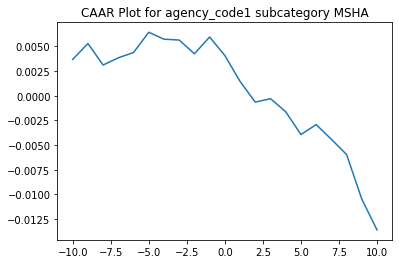

          ARR      CAAR        sd    t_stat   p_value
-10  0.003662  0.003662  0.022110  2.365785  0.018934
-9   0.001619  0.005281  0.029034  2.597884  0.010067
-8  -0.002181  0.003100  0.033515  1.321173  0.187931
-7   0.000731  0.003831  0.040290  1.358057  0.175953
-6   0.000537  0.004368  0.046177  1.351173  0.178144
-5   0.002051  0.006419  0.052962  1.731191  0.084937
-4  -0.000704  0.005716  0.056463  1.445879  0.149753
-3  -0.000085  0.005631  0.062642  1.283953  0.200622
-2  -0.001391  0.004240  0.068276  0.886982  0.376138
-1   0.001698  0.005938  0.073727  1.150324  0.251364
 0  -0.001875  0.004063  0.076742  0.756140  0.450442
 1  -0.002621  0.001441  0.082192  0.250459  0.802486
 2  -0.002096 -0.000655  0.085723 -0.109121  0.913215
 3   0.000351 -0.000304  0.092520 -0.046906  0.962634
 4  -0.001325 -0.001629  0.093854 -0.247926  0.804442
 5  -0.002307 -0.003936  0.098009 -0.573594  0.566877
 6   0.001007 -0.002929  0.105002 -0.398354  0.690788
 7  -0.001486 -0.004414  0.1

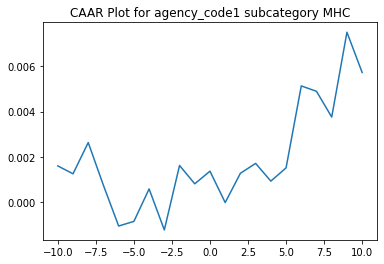

          ARR      CAAR        sd    t_stat   p_value
-10  0.001600  0.001600  0.012928  1.372296  0.172489
-9  -0.000350  0.001250  0.019072  0.726872  0.468697
-8   0.001382  0.002632  0.024996  1.167740  0.245189
-7  -0.001895  0.000737  0.026347  0.310163  0.756966
-6  -0.001797 -0.001060  0.037933 -0.309883  0.757179
-5   0.000206 -0.000854  0.038535 -0.245875  0.806193
-4   0.001436  0.000582  0.046939  0.137420  0.890925
-3  -0.001813 -0.001232  0.050407 -0.271020  0.786833
-2   0.002850  0.001618  0.045961  0.390503  0.696846
-1  -0.000811  0.000808  0.047322  0.189264  0.850200
 0   0.000559  0.001366  0.046229  0.327767  0.743650
 1  -0.001388 -0.000022  0.045791 -0.005208  0.995853
 2   0.001296  0.001274  0.048209  0.293098  0.769946
 3   0.000436  0.001710  0.048300  0.392670  0.695248
 4  -0.000784  0.000927  0.052054  0.197400  0.843843
 5   0.000586  0.001513  0.054641  0.307082  0.759305
 6   0.003625  0.005138  0.052857  1.077972  0.283173
 7  -0.000239  0.004899  0.0

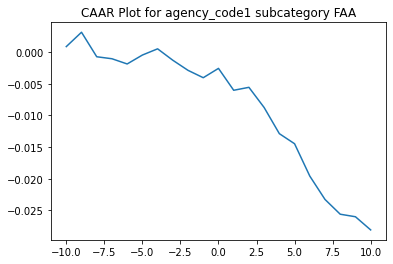

          ARR      CAAR        sd    t_stat   p_value
-10  0.000872  0.000872  0.013483  0.711641  0.478069
-9   0.002266  0.003138  0.022318  1.546778  0.124550
-8  -0.003869 -0.000731  0.025957 -0.309583  0.757415
-7  -0.000316 -0.001046  0.032068 -0.358867  0.720325
-6  -0.000823 -0.001869  0.037661 -0.545872  0.586167
-5   0.001408 -0.000461  0.041256 -0.123008  0.902306
-4   0.000982  0.000521  0.044984  0.127413  0.898827
-3  -0.001805 -0.001284  0.046656 -0.302623  0.762701
-2  -0.001595 -0.002879  0.047216 -0.670642  0.503737
-1  -0.001161 -0.004040  0.047239 -0.940670  0.348764
 0   0.001473 -0.002567  0.049358 -0.572011  0.568385
 1  -0.003457 -0.006024  0.053897 -1.229361  0.221341
 2   0.000466 -0.005558  0.054881 -1.114023  0.267496
 3  -0.003186 -0.008744  0.068030 -1.413866  0.159990
 4  -0.004129 -0.012873  0.078369 -1.806859  0.073290
 5  -0.001591 -0.014464  0.073216 -2.173062  0.031740
 6  -0.005105 -0.019569  0.090339 -2.382732  0.018755
 7  -0.003690 -0.023259  0.0

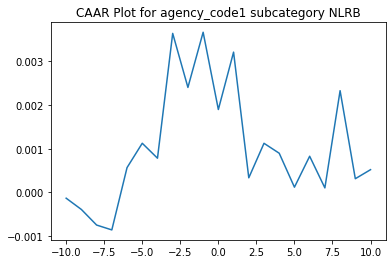

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000136 -0.000136  0.012302 -0.099849  0.920714
-9  -0.000259 -0.000395  0.018138 -0.195985  0.845119
-8  -0.000357 -0.000752  0.022427 -0.301896  0.763515
-7  -0.000112 -0.000864  0.025490 -0.305082  0.761096
-6   0.001429  0.000565  0.025252  0.201448  0.840859
-5   0.000559  0.001124  0.030725  0.329237  0.742837
-4  -0.000343  0.000781  0.031736  0.221592  0.825196
-3   0.002863  0.003645  0.031229  1.050370  0.296711
-2  -0.001240  0.002405  0.034835  0.621377  0.536118
-1   0.001266  0.003671  0.037704  0.876270  0.383507
 0  -0.001773  0.001898  0.049356  0.346146  0.730142
 1   0.001316  0.003215  0.052620  0.549833  0.583966
 2  -0.002883  0.000331  0.064475  0.046272  0.963209
 3   0.000792  0.001123  0.065595  0.154099  0.877919
 4  -0.000228  0.000895  0.074559  0.108042  0.914233
 5  -0.000779  0.000116  0.099584  0.010522  0.991631
 6   0.000710  0.000826  0.093796  0.079267  0.937018
 7  -0.000726  0.000100  0.1

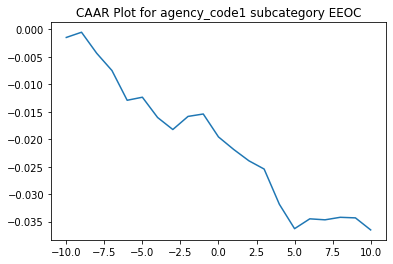

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001450 -0.001450  0.014867 -0.827348  0.410812
-9   0.000949 -0.000500  0.022701 -0.186977  0.852212
-8  -0.003837 -0.004337  0.024817 -1.483060  0.142484
-7  -0.003139 -0.007477  0.027166 -2.335395  0.022353
-6  -0.005421 -0.012898  0.032520 -3.365524  0.001236
-5   0.000556 -0.012342  0.037276 -2.809556  0.006405
-4  -0.003696 -0.016039  0.040637 -3.348973  0.001301
-3  -0.002190 -0.018229  0.040726 -3.797954  0.000305
-2   0.002389 -0.015840  0.047549 -2.826608  0.006106
-1   0.000440 -0.015400  0.048624 -2.687411  0.008963
 0  -0.004175 -0.019575  0.051694 -3.213217  0.001975
 1  -0.002286 -0.021861  0.057434 -3.229803  0.001878
 2  -0.002068 -0.023929  0.067179 -3.022499  0.003486
 3  -0.001502 -0.025432  0.071074 -3.036212  0.003348
 4  -0.006415 -0.031847  0.089934 -3.004790  0.003670
 5  -0.004452 -0.036299  0.118556 -2.597961  0.011395
 6   0.001794 -0.034504  0.086440 -3.387108  0.001155
 7  -0.000180 -0.034685  0.0

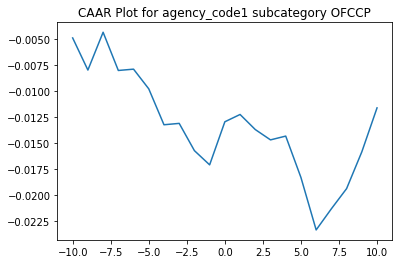

          ARR      CAAR        sd    t_stat   p_value
-10 -0.004904 -0.004904  0.016844 -2.178913  0.033640
-9  -0.003079 -0.007984  0.036353 -1.643441  0.105997
-8   0.003624 -0.004359  0.026425 -1.234506  0.222263
-7  -0.003664 -0.008023  0.040853 -1.469718  0.147336
-6   0.000126 -0.007897  0.052051 -1.135402  0.261131
-5  -0.001887 -0.009784  0.062051 -1.179943  0.243101
-4  -0.003443 -0.013227  0.056942 -1.738279  0.087758
-3   0.000131 -0.013096  0.051519 -1.902175  0.062390
-2  -0.002613 -0.015708  0.067698 -1.736406  0.088091
-1  -0.001362 -0.017071  0.066431 -1.922951  0.059670
 0   0.004129 -0.012942  0.053751 -1.801789  0.077060
 1   0.000700 -0.012242  0.045730 -2.003230  0.050090
 2  -0.001445 -0.013687  0.049591 -2.065323  0.043618
 3  -0.000990 -0.014677  0.050603 -2.170413  0.034310
 4   0.000363 -0.014314  0.052498 -2.040361  0.046127
 5  -0.003967 -0.018281  0.061053 -2.240695  0.029104
 6  -0.005026 -0.023307  0.069856 -2.496772  0.015557
 7   0.002026 -0.021281  0.0

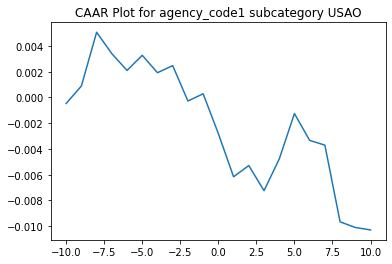

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000464 -0.000464  0.013354 -0.250737  0.803025
-9   0.001357  0.000893  0.020106  0.320152  0.750161
-8   0.004176  0.005069  0.020252  1.804890  0.076997
-7  -0.001663  0.003405  0.023804  1.031658  0.307100
-6  -0.001302  0.002103  0.033702  0.449970  0.654639
-5   0.001175  0.003278  0.038847  0.608545  0.545527
-4  -0.001353  0.001925  0.047054  0.295076  0.769134
-3   0.000550  0.002475  0.047001  0.379737  0.705717
-2  -0.002748 -0.000273  0.051055 -0.038599  0.969361
-1   0.000562  0.000289  0.055377  0.037584  0.970166
 0  -0.003092 -0.002804  0.054665 -0.369860  0.713018
 1  -0.003355 -0.006159  0.067865 -0.654404  0.515792
 2   0.000872 -0.005287  0.073026 -0.522043  0.603900
 3  -0.001952 -0.007239  0.096417 -0.541394  0.590593
 4   0.002458 -0.004781  0.090395 -0.381386  0.704501
 5   0.003531 -0.001250  0.090755 -0.099336  0.921261
 6  -0.002082 -0.003332  0.113917 -0.210928  0.833784
 7  -0.000367 -0.003699  0.0

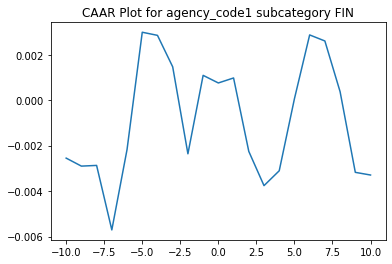

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002549 -0.002549  0.022083 -0.672951  0.505664
-9  -0.000352 -0.002900  0.021892 -0.772479  0.445328
-8   0.000031 -0.002870  0.027203 -0.615091  0.542713
-7  -0.002838 -0.005707  0.034631 -0.960953  0.343565
-6   0.003536 -0.002171  0.033583 -0.376959  0.708617
-5   0.005160  0.002989  0.039199  0.444678  0.659456
-4  -0.000137  0.002853  0.038957  0.426979  0.672167
-3  -0.001385  0.001467  0.042166  0.202928  0.840437
-2  -0.003826 -0.002358  0.045090 -0.304985  0.762293
-1   0.003451  0.001093  0.047714  0.133510  0.894601
 0  -0.000335  0.000758  0.052255  0.084583  0.933104
 1   0.000220  0.000978  0.061214  0.093116  0.926375
 2  -0.003229 -0.002252  0.062944 -0.208601  0.836042
 3  -0.001507 -0.003759  0.066809 -0.328086  0.744919
 4   0.000654 -0.003105  0.065766 -0.275330  0.784780
 5   0.003170  0.000065  0.067645  0.005588  0.995575
 6   0.002806  0.002871  0.073967  0.226343  0.822331
 7  -0.000266  0.002605  0.0

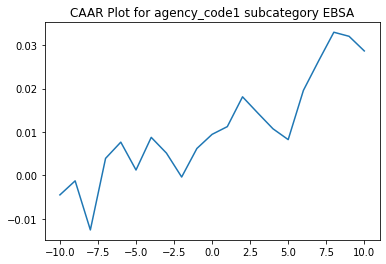

          ARR      CAAR        sd    t_stat   p_value
-10 -0.004503 -0.004503  0.019283 -1.279054  0.211018
-9   0.003238 -0.001265  0.021923 -0.316081  0.754205
-8  -0.011313 -0.012578  0.033664 -2.046470  0.049870
-7   0.016495  0.003917  0.024048  0.892139  0.379661
-6   0.003742  0.007660  0.031181  1.345459  0.188904
-5  -0.006423  0.001237  0.031878  0.212479  0.833220
-4   0.007527  0.008764  0.035023  1.370560  0.181028
-3  -0.003630  0.005133  0.034357  0.818368  0.419821
-2  -0.005515 -0.000382  0.044022 -0.047496  0.962444
-1   0.006579  0.006197  0.043209  0.785529  0.438515
 0   0.003263  0.009460  0.042294  1.225076  0.230404
 1   0.001779  0.011239  0.042079  1.462872  0.154257
 2   0.006874  0.018113  0.047582  2.084963  0.045985
 3  -0.003724  0.014388  0.049455  1.593532  0.121883
 4  -0.003647  0.010742  0.044892  1.310565  0.200290
 5  -0.002497  0.008245  0.044760  1.008866  0.321383
 6   0.011349  0.019594  0.047057  2.280656  0.030101
 7   0.006807  0.026401  0.0

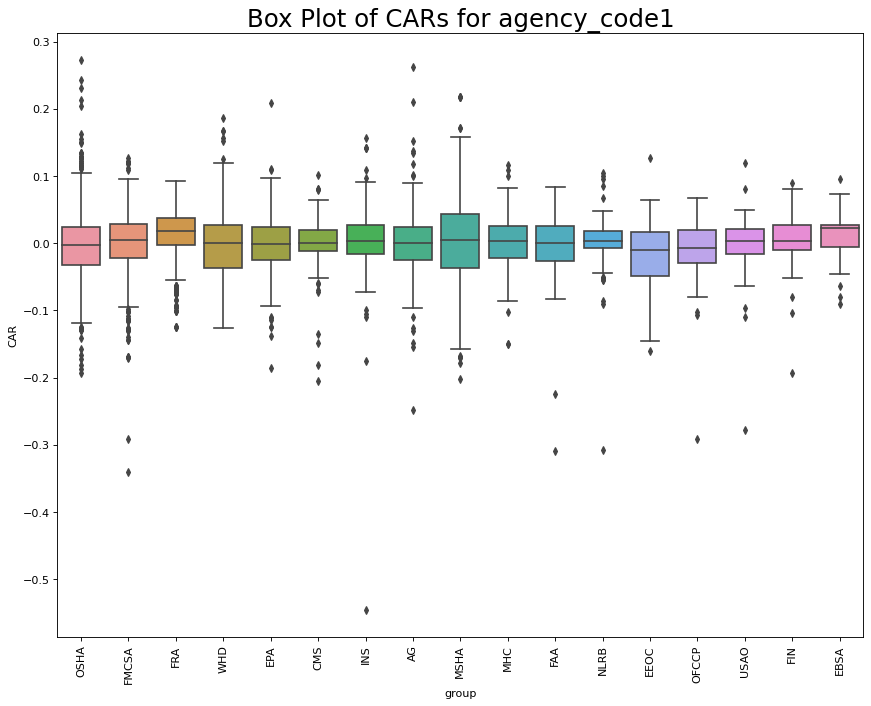

In [ ]:
a = CAAR_by_category(df, events, 'agency_code1',\
                     cat_name='Different Agency Groups', cat_members=agency_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

#Results [-5,5]

In [ ]:
es_win = 200
ev_win = [-5,5]
end_time = 4

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 20 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Offence Groups GROUP safety-related offenses
We found AR for 3813 events
AR.shape[1] is 3813


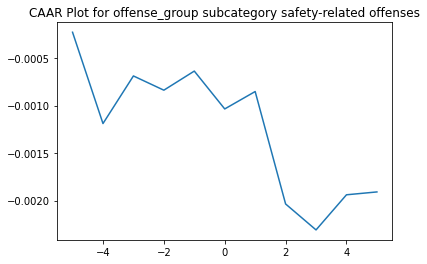

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000228 -0.000228  0.012509 -1.123290  0.261385
-4 -0.000961 -0.001189  0.018615 -3.944068  0.000082
-3  0.000501 -0.000688  0.022910 -1.853673  0.063863
-2 -0.000150 -0.000838  0.025778 -2.006719  0.044850
-1  0.000201 -0.000637  0.029104 -1.350569  0.176914
 0 -0.000399 -0.001035  0.032004 -1.997365  0.045857
 1  0.000183 -0.000852  0.035741 -1.471770  0.141166
 2 -0.001184 -0.002036  0.037941 -3.313138  0.000931
 3 -0.000273 -0.002309  0.040801 -3.494615  0.000480
 4  0.000370 -0.001939  0.043434 -2.756922  0.005863
 5  0.000030 -0.001909  0.045857 -2.570783  0.010184
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 134 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 97 NaN values   

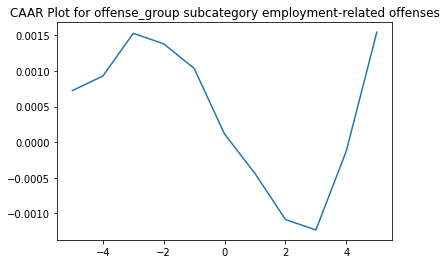

         ARR      CAAR        sd    t_stat   p_value
-5  0.000724  0.000724  0.014516  1.634058  0.102540
-4  0.000205  0.000929  0.019230  1.582006  0.113943
-3  0.000599  0.001528  0.023639  2.117048  0.034486
-2 -0.000147  0.001380  0.027369  1.652034  0.098820
-1 -0.000346  0.001035  0.029510  1.148473  0.251030
 0 -0.000922  0.000113  0.032541  0.113424  0.909716
 1 -0.000554 -0.000441  0.035927 -0.401998  0.687766
 2 -0.000646 -0.001087  0.041203 -0.863827  0.387876
 3 -0.000134 -0.001221  0.043107 -0.927583  0.353833
 4  0.001109 -0.000112  0.048210 -0.075894  0.939518
 5  0.001666  0.001554  0.057041  0.892434  0.372361
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-03-18 00:00:00
For ticker None we have 169 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 60 NaN values    

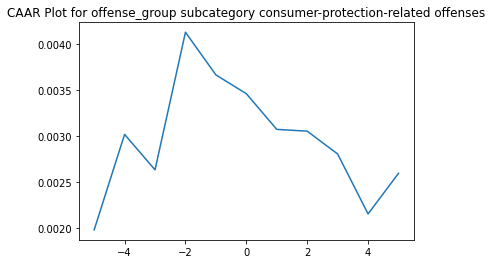

         ARR      CAAR        sd    t_stat   p_value
-5  0.001981  0.001981  0.017628  2.731850  0.006487
-4  0.001038  0.003019  0.023767  3.088461  0.002107
-3 -0.000385  0.002634  0.033158  1.931329  0.053921
-2  0.001496  0.004130  0.036050  2.785125  0.005523
-1 -0.000464  0.003666  0.040144  2.220212  0.026784
 0 -0.000204  0.003462  0.040315  2.087733  0.037250
 1 -0.000388  0.003074  0.043747  1.708176  0.088130
 2 -0.000019  0.003055  0.045157  1.644485  0.100609
 3 -0.000248  0.002807  0.047619  1.432919  0.152411
 4 -0.000652  0.002155  0.050360  1.040172  0.298686
 5  0.000442  0.002597  0.049633  1.271798  0.203946
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
For ticker None we have 1 NaN values     in 

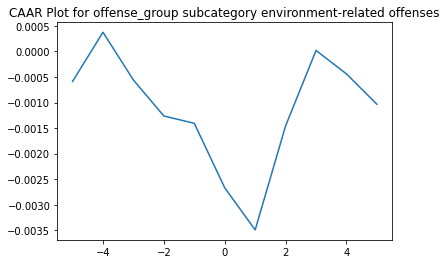

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000587 -0.000587  0.012758 -0.836424  0.403524
-4  0.000963  0.000376  0.023674  0.288540  0.773115
-3 -0.000935 -0.000559  0.027592 -0.368226  0.712942
-2 -0.000704 -0.001264  0.031274 -0.734026  0.463456
-1 -0.000143 -0.001407  0.035321 -0.723572  0.469842
 0 -0.001263 -0.002670  0.038324 -1.265627  0.206542
 1 -0.000824 -0.003495  0.041850 -1.516885  0.130256
 2  0.002037 -0.001457  0.043029 -0.615211  0.538841
 3  0.001477  0.000020  0.043449  0.008302  0.993381
 4 -0.000460 -0.000440  0.045519 -0.175647  0.860679
 5 -0.000594 -0.001035  0.049870 -0.376876  0.706509
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
CAR FOR Different Offence Groups GROUP government-contracting-related offenses
We found AR for 68 events
AR.shape[1] is 68


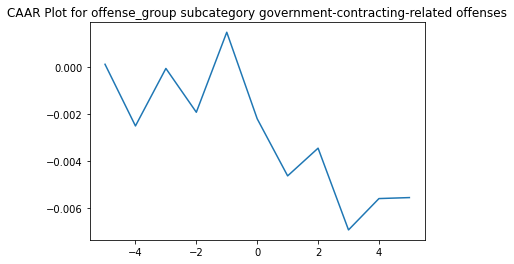

         ARR      CAAR        sd    t_stat   p_value
-5  0.000111  0.000111  0.011913  0.076600  0.939170
-4 -0.002616 -0.002506  0.019448 -1.062424  0.291858
-3  0.002440 -0.000066  0.021820 -0.024907  0.980203
-2 -0.001859 -0.001925  0.023699 -0.669747  0.505321
-1  0.003394  0.001470  0.036637  0.330774  0.741847
 0 -0.003671 -0.002202  0.040765 -0.445417  0.657454
 1 -0.002423 -0.004625  0.047539 -0.802255  0.425242
 2  0.001176 -0.003449  0.051354 -0.553810  0.581553
 3 -0.003468 -0.006917  0.071338 -0.799593  0.426772
 4  0.001330 -0.005587  0.068044 -0.677116  0.500663
 5  0.000042 -0.005545  0.069269 -0.660169  0.511409
For ticker None we have 167 NaN values     in the window
Something is wrong with LHX in 2019-09-19 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2018-09-12 00:00:00
CAR FOR Different Offence Groups GROUP competition-related offenses
We found AR for 57 events
AR.shape[1] is 57


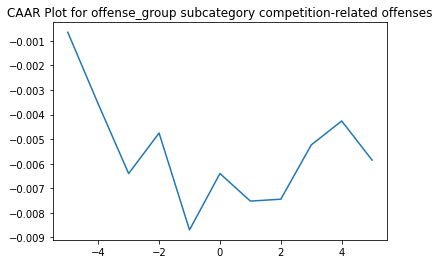

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000646 -0.000646  0.011790 -0.413427  0.680873
-4 -0.002921 -0.003566  0.016754 -1.607068  0.113664
-3 -0.002836 -0.006402  0.026763 -1.806122  0.076274
-2  0.001651 -0.004752  0.037757 -0.950122  0.346133
-1 -0.003946 -0.008698  0.039692 -1.654446  0.103632
 0  0.002298 -0.006400  0.050138 -0.963764  0.339308
 1 -0.001124 -0.007525  0.049035 -1.158550  0.251557
 2  0.000078 -0.007447  0.053744 -1.046073  0.300022
 3  0.002211 -0.005236  0.061459 -0.643189  0.522726
 4  0.000976 -0.004260  0.062096 -0.517954  0.606531
 5 -0.001596 -0.005856  0.063842 -0.692499  0.491486
CAR FOR Different Offence Groups GROUP healthcare-related offenses
We found AR for 49 events
AR.shape[1] is 49


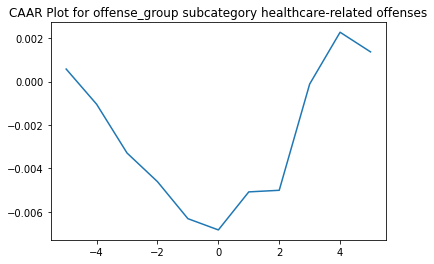

         ARR      CAAR        sd    t_stat   p_value
-5  0.000577  0.000577  0.013131  0.307623  0.759700
-4 -0.001621 -0.001044  0.024061 -0.303814  0.762583
-3 -0.002250 -0.003295  0.035396 -0.651562  0.517791
-2 -0.001320 -0.004615  0.040242 -0.802711  0.426098
-1 -0.001706 -0.006321  0.044993 -0.983452  0.330316
 0 -0.000518 -0.006839  0.046693 -1.025330  0.310347
 1  0.001753 -0.005086  0.041818 -0.851385  0.398783
 2  0.000074 -0.005013  0.045601 -0.769459  0.445391
 3  0.004897 -0.000115  0.041312 -0.019529  0.984500
 4  0.002389  0.002274  0.043769  0.363613  0.717744
 5 -0.000906  0.001368  0.046256  0.207024  0.836867


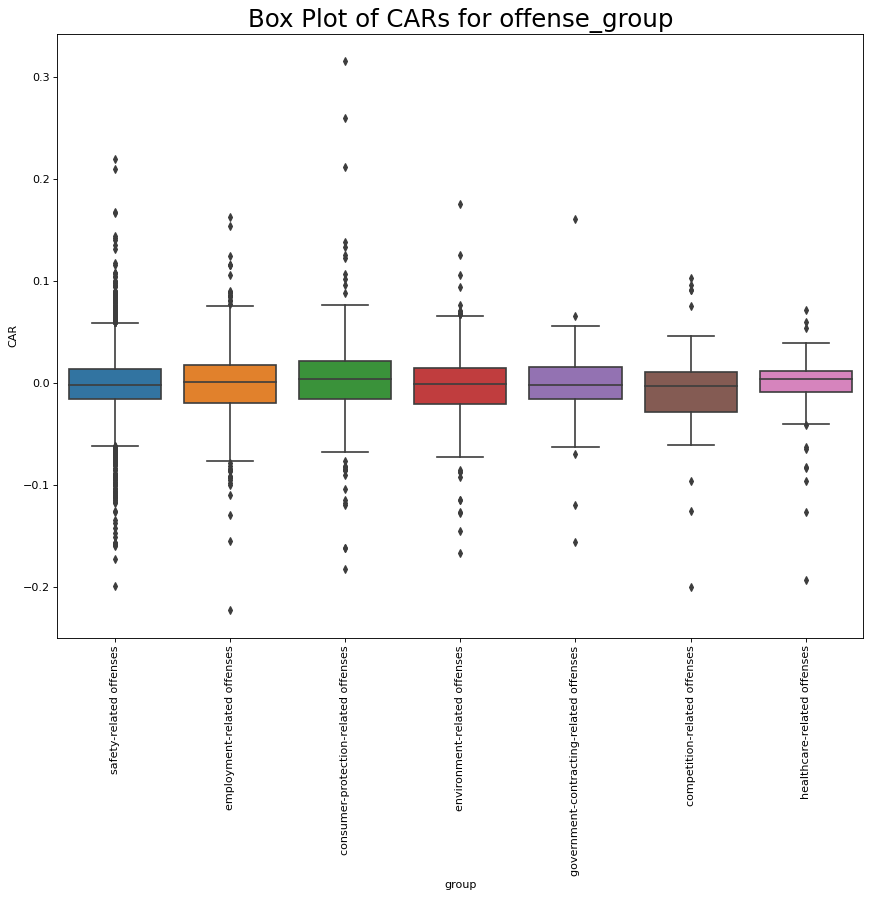

In [ ]:
a = CAAR_by_category(df, events, 'offense_group',\
                     cat_name='Different Offence Groups', cat_members=off_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different Groups of Industries GROUP retailing
We found AR for 983 events
AR.shape[1] is 983


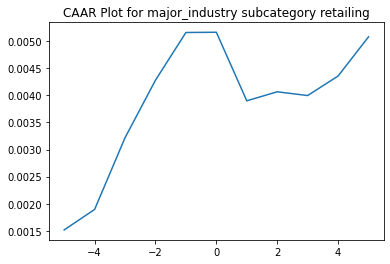

         ARR      CAAR        sd    t_stat   p_value
-5  0.001515  0.001515  0.015368  3.090819  0.002052
-4  0.000378  0.001893  0.023364  2.540582  0.011220
-3  0.001325  0.003218  0.028646  3.522590  0.000447
-2  0.001063  0.004282  0.032232  4.164852  0.000034
-1  0.000881  0.005163  0.034118  4.744351  0.000002
 0  0.000005  0.005168  0.037145  4.361775  0.000014
 1 -0.001267  0.003900  0.042552  2.873891  0.004142
 2  0.000167  0.004067  0.044852  2.843048  0.004561
 3 -0.000069  0.003998  0.047763  2.624295  0.008818
 4  0.000361  0.004359  0.051164  2.671196  0.007683
 5  0.000724  0.005083  0.053426  2.982857  0.002926
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-03-18 00:00:00
For ticker None we have 169 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 60 NaN values    

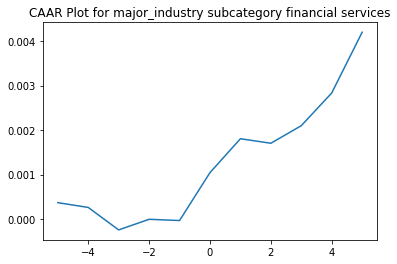

         ARR      CAAR        sd    t_stat   p_value
-5  0.000368  0.000368  0.012065  0.888436  0.374558
-4 -0.000108  0.000261  0.017444  0.435017  0.663661
-3 -0.000506 -0.000245  0.022929 -0.311145  0.755767
-2  0.000239 -0.000006  0.025905 -0.006966  0.994444
-1 -0.000028 -0.000034  0.029494 -0.033545  0.973248
 0  0.001078  0.001044  0.031165  0.975349  0.329666
 1  0.000762  0.001806  0.033735  1.559062  0.119355
 2 -0.000102  0.001704  0.035064  1.415306  0.157346
 3  0.000395  0.002100  0.037661  1.623503  0.104854
 4  0.000735  0.002835  0.039098  2.111614  0.035012
 5  0.001366  0.004201  0.038376  3.187920  0.001486
CAR FOR Different Groups of Industries GROUP railroads
We found AR for 508 events
AR.shape[1] is 508


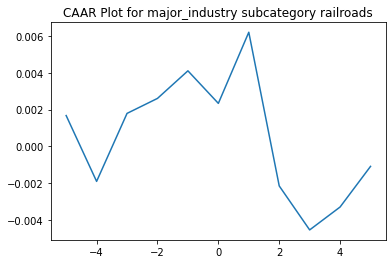

         ARR      CAAR        sd    t_stat       p_value
-5  0.001675  0.001675  0.004650  8.118447  3.607711e-15
-4 -0.003568 -0.001893  0.011599 -3.678082  2.601069e-04
-3  0.003686  0.001793  0.013709  2.947864  3.347283e-03
-2  0.000812  0.002605  0.015989  3.672238  2.659708e-04
-1  0.001495  0.004100  0.016718  5.527762  5.197585e-08
 0 -0.001764  0.002336  0.016157  3.258546  1.194958e-03
 1  0.003855  0.006191  0.017558  7.947714  1.240328e-14
 2 -0.008330 -0.002139  0.017227 -2.798137  5.335446e-03
 3 -0.002384 -0.004523  0.020691 -4.927152  1.131558e-06
 4  0.001242 -0.003281  0.022451 -3.293716  1.057794e-03
 5  0.002202 -0.001079  0.021443 -1.134371  2.571749e-01
CAR FOR Different Groups of Industries GROUP oil and gas
We found AR for 346 events
AR.shape[1] is 346


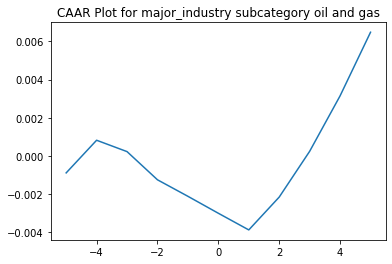

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000892 -0.000892  0.013078 -1.268716  0.205398
-4  0.001711  0.000819  0.020147  0.756512  0.449859
-3 -0.000596  0.000224  0.022697  0.183243  0.854715
-2 -0.001478 -0.001254  0.026735 -0.872612  0.383482
-1 -0.000866 -0.002120  0.030832 -1.278971  0.201767
 0 -0.000888 -0.003008  0.034622 -1.616262  0.106952
 1 -0.000873 -0.003882  0.040334 -1.790056  0.074322
 2  0.001722 -0.002159  0.044895 -0.894696  0.371574
 3  0.002399  0.000240  0.045838  0.097331  0.922520
 4  0.002908  0.003148  0.049810  1.175668  0.240538
 5  0.003333  0.006481  0.061466  1.961435  0.050632
CAR FOR Different Groups of Industries GROUP healthcare services
We found AR for 282 events
AR.shape[1] is 282


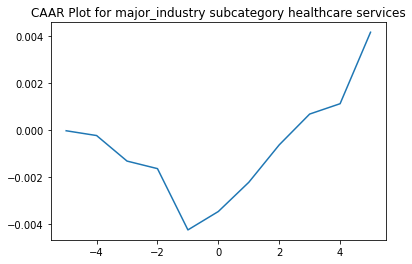

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000042 -0.000042  0.017577 -0.039902  0.968199
-4 -0.000204 -0.000246  0.026528 -0.155512  0.876530
-3 -0.001088 -0.001334  0.034414 -0.650765  0.515730
-2 -0.000322 -0.001655  0.034903 -0.796406  0.426468
-1 -0.002610 -0.004266  0.041366 -1.731701  0.084424
 0  0.000785 -0.003481  0.041784 -1.398864  0.162957
 1  0.001243 -0.002237  0.041676 -0.901514  0.368087
 2  0.001595 -0.000643  0.044394 -0.243167  0.808054
 3  0.001313  0.000670  0.043562  0.258158  0.796474
 4  0.000441  0.001111  0.045918  0.406148  0.684943
 5  0.003044  0.004155  0.046605  1.497087  0.135493
CAR FOR Different Groups of Industries GROUP pipelines
We found AR for 249 events
AR.shape[1] is 249


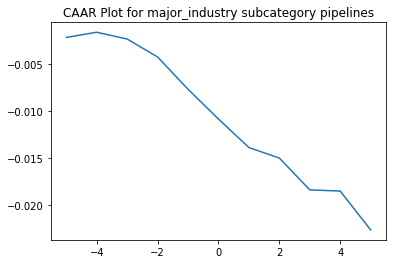

         ARR      CAAR        sd     t_stat       p_value
-5 -0.002212 -0.002212  0.012386  -2.818293  5.217316e-03
-4  0.000554 -0.001658  0.017277  -1.514015  1.312955e-01
-3 -0.000720 -0.002378  0.019536  -1.920653  5.592214e-02
-2 -0.001914 -0.004292  0.019430  -3.485562  5.806102e-04
-1 -0.003431 -0.007723  0.019345  -6.299886  1.348212e-09
 0 -0.003166 -0.010889  0.020003  -8.590295  9.792284e-16
 1 -0.003031 -0.013921  0.022396  -9.808213  2.108733e-19
 2 -0.001118 -0.015039  0.024586  -9.651977  6.408094e-19
 3 -0.003387 -0.018426  0.026823 -10.839756  1.150894e-22
 4 -0.000124 -0.018550  0.027316 -10.715531  2.886337e-22
 5 -0.004133 -0.022683  0.031403 -11.397991  1.770682e-24
CAR FOR Different Groups of Industries GROUP pharmaceuticals
We found AR for 244 events
AR.shape[1] is 244


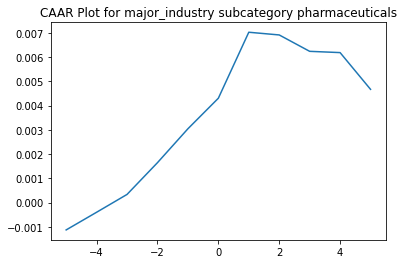

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001129 -0.001129  0.009999 -1.763576  0.079060
-4  0.000728 -0.000401  0.015585 -0.401554  0.688365
-3  0.000735  0.000335  0.018438  0.283560  0.776989
-2  0.001310  0.001645  0.023755  1.081449  0.280570
-1  0.001397  0.003042  0.026820  1.771667  0.077703
 0  0.001259  0.004301  0.030565  2.198296  0.028871
 1  0.002721  0.007022  0.031203  3.515460  0.000524
 2 -0.000112  0.006911  0.032070  3.366166  0.000886
 3 -0.000676  0.006235  0.033321  2.922985  0.003794
 4 -0.000052  0.006183  0.033756  2.861241  0.004587
 5 -0.001515  0.004668  0.035550  2.051108  0.041329
CAR FOR Different Groups of Industries GROUP telecommunications
We found AR for 228 events
AR.shape[1] is 228


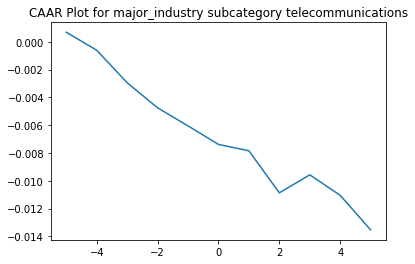

         ARR      CAAR        sd    t_stat       p_value
-5  0.000690  0.000690  0.012546  0.830411  4.071792e-01
-4 -0.001297 -0.000607  0.018758 -0.488693  6.255306e-01
-3 -0.002338 -0.002946  0.023102 -1.925236  5.544934e-02
-2 -0.001807 -0.004752  0.024299 -2.953133  3.476406e-03
-1 -0.001299 -0.006051  0.026542 -3.442394  6.863596e-04
 0 -0.001335 -0.007386  0.027785 -4.014046  8.110438e-05
 1 -0.000459 -0.007845  0.031770 -3.728566  2.432398e-04
 2 -0.003025 -0.010870  0.033475 -4.903273  1.795449e-06
 3  0.001295 -0.009575  0.034279 -4.217649  3.567711e-05
 4 -0.001478 -0.011053  0.035017 -4.766267  3.351727e-06
 5 -0.002487 -0.013540  0.035846 -5.703562  3.635532e-08
CAR FOR Different Groups of Industries GROUP diversified
We found AR for 508 events
AR.shape[1] is 508


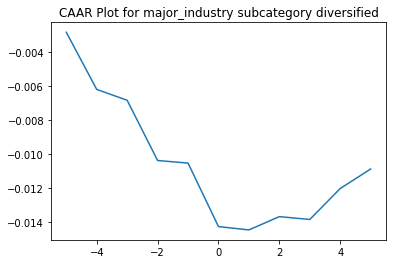

         ARR      CAAR        sd     t_stat       p_value
-5 -0.002835 -0.002835  0.012562  -5.086578  5.141599e-07
-4 -0.003368 -0.006203  0.018618  -7.509286  2.698923e-13
-3 -0.000639 -0.006842  0.021325  -7.231076  1.777263e-12
-2 -0.003547 -0.010389  0.023050 -10.158563  3.419725e-22
-1 -0.000152 -0.010541  0.026493  -8.967885  5.837732e-18
 0 -0.003739 -0.014281  0.030852 -10.432545  3.246705e-23
 1 -0.000196 -0.014477  0.032341 -10.089228  6.165877e-22
 2  0.000783 -0.013694  0.036819  -8.382952  5.125850e-16
 3 -0.000168 -0.013862  0.039251  -7.960188  1.134072e-14
 4  0.001824 -0.012039  0.042578  -6.372747  4.175464e-10
 5  0.001149 -0.010890  0.045449  -5.400472  1.023372e-07
CAR FOR Different Groups of Industries GROUP utilities and power generation
We found AR for 180 events
AR.shape[1] is 180


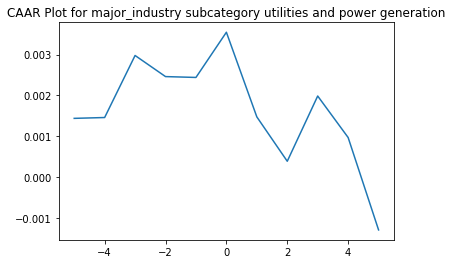

         ARR      CAAR        sd    t_stat   p_value
-5  0.001437  0.001437  0.009968  1.934566  0.054620
-4  0.000021  0.001458  0.013879  1.409470  0.160431
-3  0.001518  0.002977  0.017265  2.313047  0.021857
-2 -0.000517  0.002460  0.019279  1.711906  0.088646
-1 -0.000021  0.002439  0.022520  1.452935  0.147993
 0  0.001107  0.003545  0.023554  2.019440  0.044933
 1 -0.002072  0.001474  0.029055  0.680553  0.497034
 2 -0.001086  0.000387  0.038523  0.134888  0.892852
 3  0.001597  0.001985  0.038219  0.696659  0.486920
 4 -0.001016  0.000969  0.050817  0.255743  0.798443
 5 -0.002262 -0.001293  0.073819 -0.235024  0.814459
CAR FOR Different Groups of Industries GROUP miscellaneous manufacturing
We found AR for 160 events
AR.shape[1] is 160


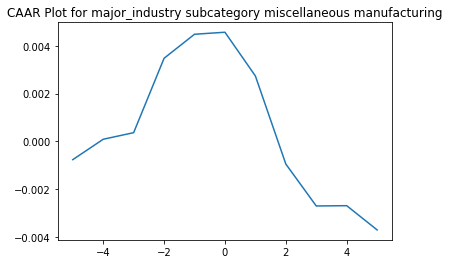

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000767 -0.000767  0.014279 -0.679723  0.497668
-4  0.000855  0.000087  0.017266  0.063973  0.949072
-3  0.000277  0.000364  0.020630  0.223118  0.823730
-2  0.003118  0.003482  0.027196  1.619502  0.107321
-1  0.001007  0.004489  0.027908  2.034602  0.043552
 0  0.000084  0.004573  0.028696  2.015786  0.045507
 1 -0.001833  0.002740  0.030192  1.148020  0.252685
 2 -0.003691 -0.000951  0.031442 -0.382480  0.702616
 3 -0.001758 -0.002709  0.034255 -1.000348  0.318662
 4  0.000013 -0.002696  0.035931 -0.949190  0.343965
 5 -0.001016 -0.003712  0.038608 -1.216317  0.225667
CAR FOR Different Groups of Industries GROUP airlines
We found AR for 143 events
AR.shape[1] is 143


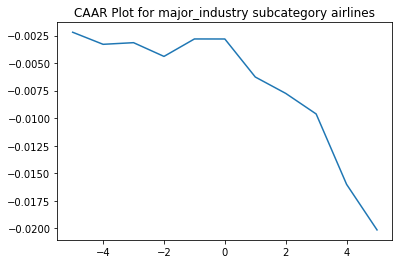

         ARR      CAAR        sd    t_stat   p_value
-5 -0.002192 -0.002192  0.015632 -1.676623  0.095816
-4 -0.001097 -0.003289  0.021126 -1.861808  0.064697
-3  0.000150 -0.003139  0.031983 -1.173786  0.242446
-2 -0.001248 -0.004388  0.035007 -1.498782  0.136150
-1  0.001586 -0.002802  0.037584 -0.891403  0.374221
 0 -0.000003 -0.002805  0.041623 -0.805827  0.421690
 1 -0.003455 -0.006260  0.043794 -1.709399  0.089562
 2 -0.001489 -0.007749  0.055331 -1.674695  0.096195
 3 -0.001870 -0.009619  0.058119 -1.979106  0.049738
 4 -0.006396 -0.016015  0.063199 -3.030313  0.002904
 5 -0.004141 -0.020156  0.064909 -3.713354  0.000293
CAR FOR Different Groups of Industries GROUP food products
We found AR for 139 events
AR.shape[1] is 139


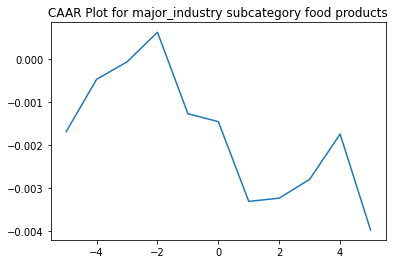

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001686 -0.001686  0.017476 -1.137300  0.257384
-4  0.001218 -0.000467  0.022620 -0.243658  0.807858
-3  0.000406 -0.000061  0.027122 -0.026687  0.978748
-2  0.000689  0.000628  0.029371  0.252090  0.801347
-1 -0.001896 -0.001268  0.032697 -0.457176  0.648263
 0 -0.000184 -0.001452  0.037665 -0.454488  0.650192
 1 -0.001856 -0.003308  0.042115 -0.926116  0.356002
 2  0.000075 -0.003233  0.046648 -0.817059  0.415303
 3  0.000438 -0.002795  0.047540 -0.693054  0.489440
 4  0.001053 -0.001741  0.054503 -0.376644  0.707016
 5 -0.002230 -0.003972  0.058978 -0.793924  0.428603
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 134 NaN values  

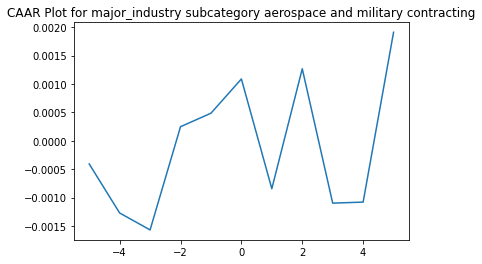

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000408 -0.000408  0.014067 -0.273682  0.784970
-4 -0.000863 -0.001272  0.019552 -0.613550  0.541095
-3 -0.000298 -0.001570  0.027481 -0.538929  0.591296
-2  0.001818  0.000248  0.032243  0.072573  0.942311
-1  0.000238  0.000486  0.036444  0.125757  0.900211
 0  0.000603  0.001089  0.037352  0.275091  0.783891
 1 -0.001933 -0.000844  0.046134 -0.172541  0.863408
 2  0.002113  0.001269  0.049831  0.240201  0.810733
 3 -0.002233 -0.000964  0.061670 -0.147452  0.883112
 4  0.000018 -0.000946  0.073439 -0.121489  0.903581
 5  0.002992  0.002046  0.068282  0.282712  0.778062
CAR FOR Different Groups of Industries GROUP freight and logistics
We found AR for 121 events
AR.shape[1] is 121


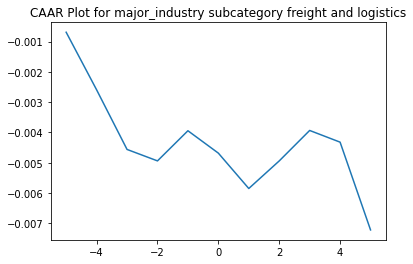

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000691 -0.000691  0.012345 -0.615444  0.539427
-4 -0.001902 -0.002592  0.018243 -1.563066  0.120671
-3 -0.001970 -0.004562  0.024940 -2.012183  0.046440
-2 -0.000378 -0.004940  0.028789 -1.887634  0.061490
-1  0.000996 -0.003945  0.032633 -1.329726  0.186131
 0 -0.000739 -0.004684  0.033980 -1.516365  0.132057
 1 -0.001168 -0.005852  0.036883 -1.745448  0.083466
 2  0.000911 -0.004941  0.038608 -1.407895  0.161747
 3  0.001006 -0.003935  0.041845 -1.034416  0.303022
 4 -0.000386 -0.004322  0.044806 -1.060939  0.290848
 5 -0.002899 -0.007221  0.050125 -1.584574  0.115695
CAR FOR Different Groups of Industries GROUP paper and packaging
We found AR for 109 events
AR.shape[1] is 109


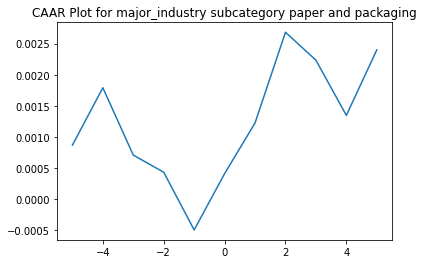

         ARR      CAAR        sd    t_stat   p_value
-5  0.000865  0.000865  0.011699  0.771548  0.442067
-4  0.000925  0.001789  0.015634  1.194816  0.234776
-3 -0.001086  0.000704  0.020778  0.353526  0.724383
-2 -0.000276  0.000428  0.025678  0.174024  0.862173
-1 -0.000930 -0.000502  0.028447 -0.184153  0.854239
 0  0.000906  0.000405  0.029526  0.143102  0.886476
 1  0.000817  0.001222  0.033858  0.376753  0.707097
 2  0.001462  0.002684  0.034992  0.800687  0.425071
 3 -0.000450  0.002234  0.036433  0.640184  0.523409
 4 -0.000890  0.001344  0.038506  0.364355  0.716305
 5  0.001055  0.002399  0.038834  0.644865  0.520382
CAR FOR Different Groups of Industries GROUP wholesalers
We found AR for 84 events
AR.shape[1] is 84


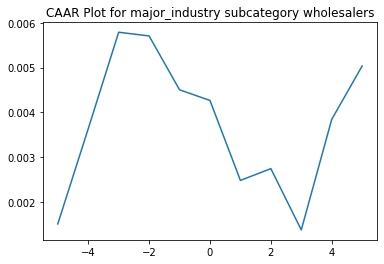

         ARR      CAAR        sd    t_stat   p_value
-5  0.001513  0.001513  0.011264  1.231317  0.221682
-4  0.002123  0.003636  0.017405  1.914525  0.058999
-3  0.002153  0.005788  0.027915  1.900478  0.060842
-2 -0.000082  0.005706  0.030602  1.708959  0.091195
-1 -0.001201  0.004505  0.033004  1.251057  0.214429
 0 -0.000238  0.004267  0.033929  1.152616  0.252377
 1 -0.001784  0.002483  0.034260  0.664354  0.508305
 2  0.000263  0.002747  0.035880  0.701580  0.484904
 3 -0.001367  0.001379  0.036626  0.345195  0.730821
 4  0.002465  0.003844  0.040927  0.860817  0.391819
 5  0.001192  0.005036  0.045253  1.020031  0.310678
CAR FOR Different Groups of Industries GROUP mining and minerals
We found AR for 83 events
AR.shape[1] is 83


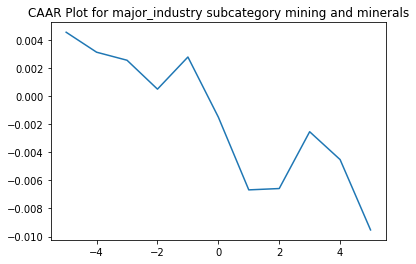

         ARR      CAAR        sd    t_stat   p_value
-5  0.004552  0.004552  0.023610  1.756579  0.082723
-4 -0.001422  0.003131  0.030860  0.924213  0.358087
-3 -0.000573  0.002557  0.041505  0.561370  0.576077
-2 -0.002058  0.000500  0.048440  0.093982  0.925353
-1  0.002289  0.002788  0.056215  0.451880  0.652548
 0 -0.004282 -0.001494  0.062747 -0.216930  0.828802
 1 -0.005181 -0.006675  0.071226 -0.853823  0.395690
 2  0.000095 -0.006580  0.072135 -0.831031  0.408370
 3  0.004047 -0.002533  0.077529 -0.297674  0.766705
 4 -0.001985 -0.004518  0.081193 -0.506943  0.613555
 5 -0.005009 -0.009527  0.086061 -1.008530  0.316167
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 113 NaN values     in 

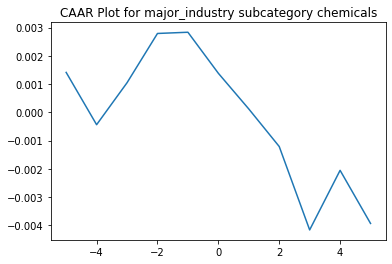

         ARR      CAAR        sd    t_stat   p_value
-5  0.001412  0.001412  0.015904  0.698995  0.487212
-4 -0.001851 -0.000439  0.023231 -0.148962  0.882075
-3  0.001486  0.001046  0.028804  0.286003  0.775845
-2  0.001744  0.002790  0.032396  0.678203  0.500208
-1  0.000043  0.002834  0.041019  0.543956  0.588454
 0 -0.001453  0.001381  0.045651  0.238115  0.812590
 1 -0.001263  0.000117  0.051851  0.017829  0.985833
 2 -0.001329 -0.001212  0.055969 -0.170508  0.865175
 3 -0.002953 -0.004165  0.065373 -0.501671  0.617705
 4  0.002109 -0.002056  0.062304 -0.259784  0.795905
 5 -0.001880 -0.003936  0.069710 -0.444567  0.658206
CAR FOR Different Groups of Industries GROUP construction and engineering
We found AR for 55 events
AR.shape[1] is 55


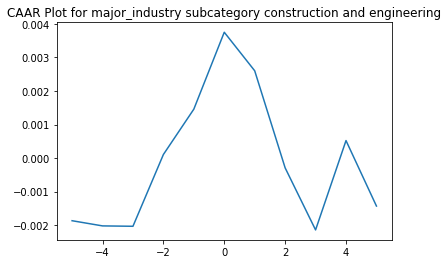

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001868 -0.001868  0.017778 -0.779350  0.439176
-4 -0.000155 -0.002023  0.023548 -0.637032  0.526795
-3 -0.000011 -0.002034  0.024612 -0.612922  0.542501
-2  0.002140  0.000106  0.025836  0.030384  0.975873
-1  0.001353  0.001459  0.026794  0.403696  0.688030
 0  0.002293  0.003752  0.031318  0.888468  0.378230
 1 -0.001149  0.002603  0.032956  0.585717  0.560506
 2 -0.002895 -0.000292  0.033119 -0.065352  0.948135
 3 -0.001851 -0.002143  0.039270 -0.404617  0.687357
 4  0.002664  0.000522  0.041547  0.093108  0.926162
 5 -0.001952 -0.001431  0.049927 -0.212523  0.832500
CAR FOR Different Groups of Industries GROUP building materials
We found AR for 54 events
AR.shape[1] is 54


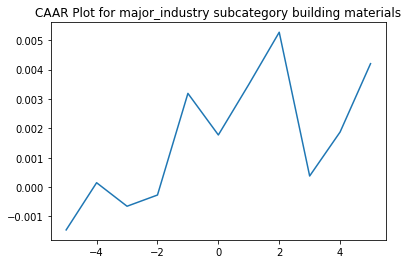

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001461 -0.001461  0.015435 -0.695704  0.489654
-4  0.001608  0.000147  0.019177  0.056203  0.955391
-3 -0.000801 -0.000655  0.023705 -0.202907  0.839984
-2  0.000382 -0.000272  0.031311 -0.063920  0.949275
-1  0.003463  0.003190  0.035564  0.659190  0.512628
 0 -0.001416  0.001774  0.039085  0.333552  0.740034
 1  0.001721  0.003495  0.042354  0.606419  0.546825
 2  0.001779  0.005274  0.047380  0.817949  0.417048
 3 -0.004898  0.000376  0.053198  0.051932  0.958778
 4  0.001498  0.001874  0.055181  0.249582  0.803876
 5  0.002329  0.004203  0.058798  0.525269  0.601587
CAR FOR Different Groups of Industries GROUP waste management and environmental services
We found AR for 50 events
AR.shape[1] is 50


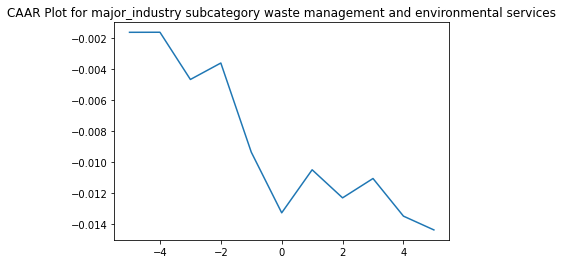

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001611 -0.001611  0.010596 -1.074887  0.287690
-4  0.000004 -0.001607  0.019157 -0.593054  0.555873
-3 -0.003048 -0.004655  0.023719 -1.387624  0.171530
-2  0.001062 -0.003593  0.024663 -1.030101  0.308021
-1 -0.005750 -0.009343  0.037947 -1.741014  0.087957
 0 -0.003917 -0.013260  0.042592 -2.201458  0.032443
 1  0.002778 -0.010483  0.044273 -1.674254  0.100453
 2 -0.001811 -0.012294  0.045338 -1.917373  0.061030
 3  0.001248 -0.011046  0.045800 -1.705315  0.094468
 4 -0.002429 -0.013474  0.048484 -1.965147  0.055079
 5 -0.000889 -0.014364  0.048804 -2.081118  0.042671
CAR FOR Different Groups of Industries GROUP motor vehicles
We found AR for 48 events
AR.shape[1] is 48


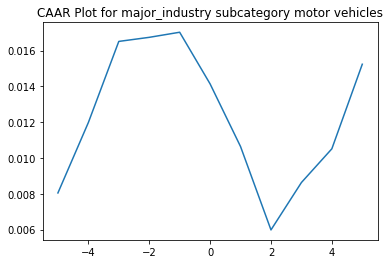

         ARR      CAAR        sd    t_stat   p_value
-5  0.008045  0.008045  0.020891  2.668085  0.010434
-4  0.003934  0.011979  0.024662  3.365288  0.001531
-3  0.004534  0.016514  0.025443  4.496775  0.000045
-2  0.000228  0.016742  0.026171  4.431940  0.000056
-1  0.000285  0.017026  0.029420  4.009555  0.000216
 0 -0.002887  0.014139  0.033129  2.956983  0.004848
 1 -0.003501  0.010639  0.031229  2.360183  0.022468
 2 -0.004660  0.005979  0.027379  1.512936  0.136992
 3  0.002648  0.008627  0.030974  1.929711  0.059691
 4  0.001885  0.010512  0.032701  2.227061  0.030771
 5  0.004727  0.015239  0.036422  2.898652  0.005679
CAR FOR Different Groups of Industries GROUP industrial equipment
We found AR for 43 events
AR.shape[1] is 43


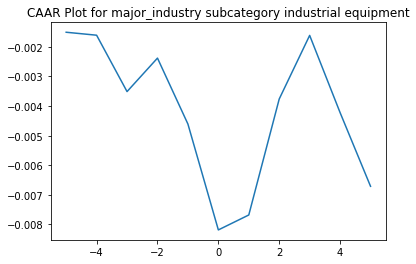

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001505 -0.001505  0.012875 -0.766334  0.447763
-4 -0.000100 -0.001605  0.016668 -0.631348  0.531234
-3 -0.001905 -0.003510  0.024053 -0.956882  0.344103
-2  0.001131 -0.002379  0.022749 -0.685650  0.496701
-1 -0.002228 -0.004606  0.026260 -1.150194  0.256571
 0 -0.003578 -0.008185  0.032269 -1.663177  0.103723
 1  0.000505 -0.007680  0.029922 -1.683035  0.099789
 2  0.003919 -0.003760  0.031398 -0.785343  0.436661
 3  0.002149 -0.001611  0.029907 -0.353265  0.725656
 4 -0.002609 -0.004221  0.033310 -0.830869  0.410746
 5 -0.002490 -0.006710  0.038137 -1.153796  0.255108
CAR FOR Different Groups of Industries GROUP metals
We found AR for 34 events
AR.shape[1] is 34


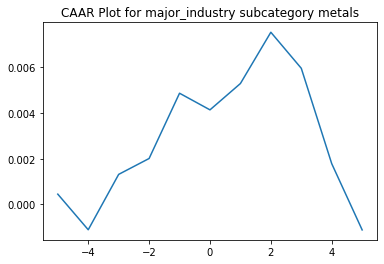

         ARR      CAAR        sd    t_stat   p_value
-5  0.000451  0.000451  0.022409  0.117359  0.907287
-4 -0.001560 -0.001109  0.028930 -0.223461  0.824554
-3  0.002425  0.001317  0.034518  0.222430  0.825350
-2  0.000696  0.002012  0.035932  0.326571  0.746055
-1  0.002859  0.004871  0.040846  0.695387  0.491681
 0 -0.000728  0.004143  0.040753  0.592757  0.557384
 1  0.001153  0.005296  0.042202  0.731751  0.469486
 2  0.002246  0.007542  0.043931  1.001089  0.324068
 3 -0.001579  0.005963  0.047379  0.733890  0.468198
 4 -0.004177  0.001786  0.047776  0.217988  0.828781
 5 -0.002902 -0.001116  0.048383 -0.134468  0.893850
CAR FOR Different Groups of Industries GROUP information technology
We found AR for 34 events
AR.shape[1] is 34


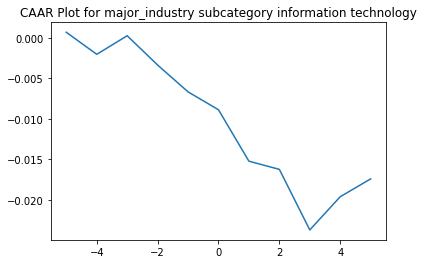

         ARR      CAAR        sd    t_stat   p_value
-5  0.000686  0.000686  0.009640  0.414877  0.680917
-4 -0.002726 -0.002040  0.020288 -0.586340  0.561637
-3  0.002293  0.000253  0.024092  0.061227  0.951547
-2 -0.003612 -0.003359  0.029226 -0.670194  0.507397
-1 -0.003314 -0.006673  0.039305 -0.989979  0.329388
 0 -0.002210 -0.008884  0.048243 -1.073724  0.290735
 1 -0.006350 -0.015234  0.062623 -1.418441  0.165437
 2 -0.001007 -0.016241  0.068025 -1.392123  0.173197
 3 -0.007476 -0.023717  0.095089 -1.454315  0.155305
 4  0.004097 -0.019620  0.090162 -1.268844  0.213374
 5  0.002203 -0.017417  0.092230 -1.101150  0.278799
CAR FOR Different Groups of Industries GROUP housewares and home furnishings
We found AR for 30 events
AR.shape[1] is 30


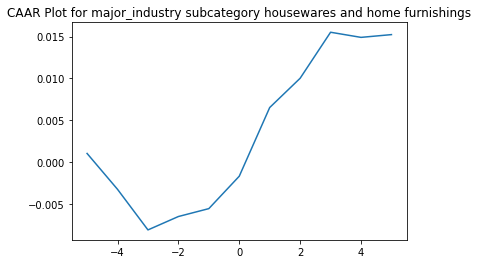

         ARR      CAAR        sd    t_stat   p_value
-5  0.001023  0.001023  0.011176  0.501338  0.619918
-4 -0.004286 -0.003263  0.013801 -1.295029  0.205526
-3 -0.004853 -0.008116  0.023670 -1.877959  0.070476
-2  0.001601 -0.006515  0.028103 -1.269700  0.214286
-1  0.000944 -0.005571  0.030672 -0.994758  0.328082
 0  0.003874 -0.001697  0.034557 -0.268915  0.789899
 1  0.008208  0.006511  0.050482  0.706448  0.485547
 2  0.003498  0.010009  0.059141  0.926989  0.361584
 3  0.005501  0.015510  0.061166  1.388889  0.175441
 4 -0.000613  0.014897  0.064710  1.260940  0.217381
 5  0.000330  0.015227  0.066633  1.251668  0.220693


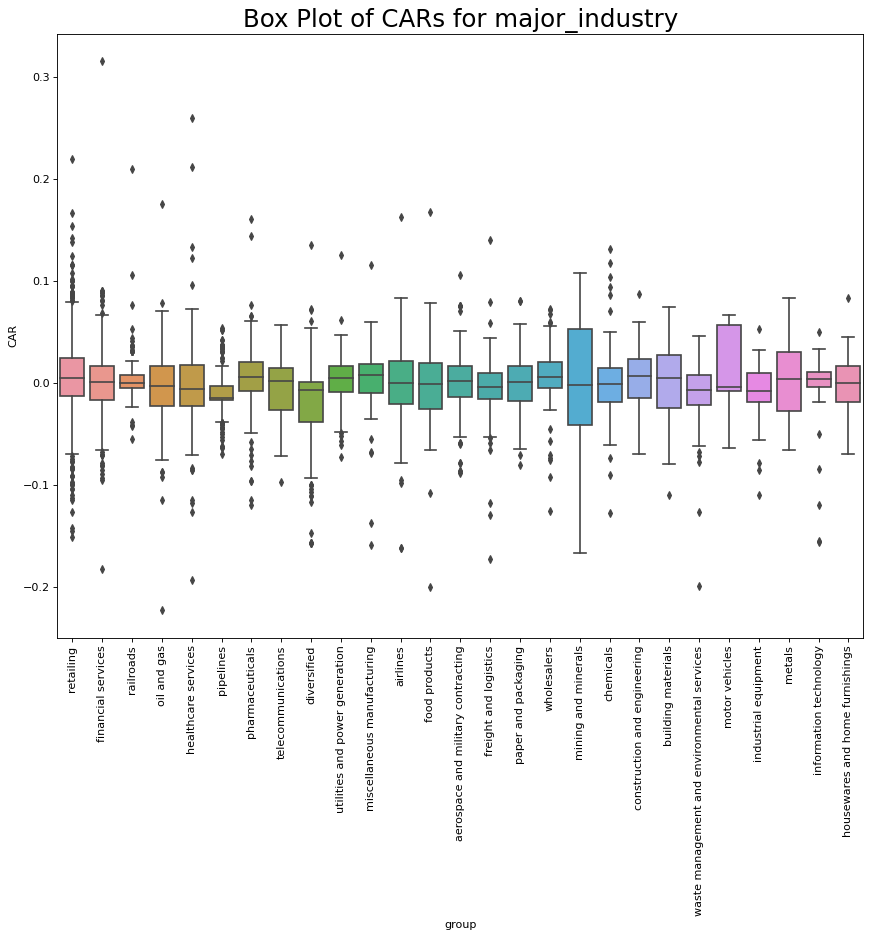

In [ ]:
b = CAAR_by_category(df, events, 'major_industry',\
                     cat_name='Different Groups of Industries', cat_members=Major_industry_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 134 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 97 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
For ticker None we have 167 NaN v

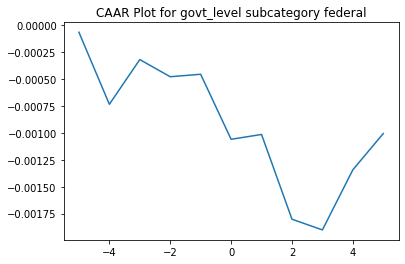

IndexError: ignored

In [ ]:

a = CAAR_by_category(df, events, 'govt_level',\
                     cat_name='Different Government levels Groups', cat_members=gov_level_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0


For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 20 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Primary Offence Groups GROUP workplace safety or health violation
We found AR for 1619 events
AR.shape[1] is 1619


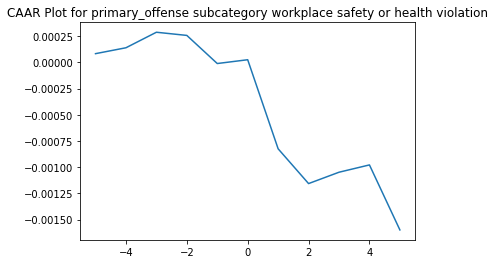

         ARR      CAAR        sd    t_stat   p_value
-5  0.000084  0.000084  0.014587  0.230503  0.817730
-4  0.000056  0.000140  0.021110  0.266500  0.789888
-3  0.000148  0.000288  0.026950  0.429857  0.667357
-2 -0.000030  0.000258  0.029945  0.346193  0.729243
-1 -0.000268 -0.000011  0.033892 -0.012592  0.989955
 0  0.000036  0.000026  0.036786  0.027998  0.977667
 1 -0.000850 -0.000824  0.041563 -0.798029  0.424971
 2 -0.000332 -0.001156  0.043853 -1.060834  0.288924
 3  0.000108 -0.001048  0.047414 -0.889218  0.374018
 4  0.000070 -0.000978  0.049714 -0.791644  0.428684
 5 -0.000620 -0.001598  0.053272 -1.207234  0.227519
CAR FOR Different Primary Offence Groups GROUP motor vehicle safety violation
We found AR for 1051 events
AR.shape[1] is 1051


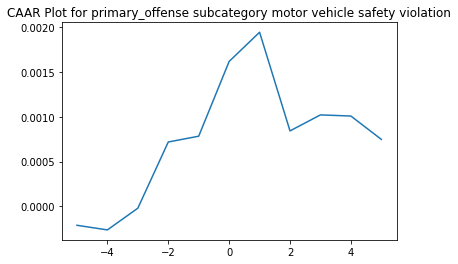

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000211 -0.000211  0.012287 -0.555665  0.578558
-4 -0.000052 -0.000262  0.018405 -0.461964  0.644203
-3  0.000242 -0.000020  0.021966 -0.029717  0.976298
-2  0.000738  0.000718  0.024429  0.952369  0.341129
-1  0.000065  0.000782  0.027829  0.911424  0.362281
 0  0.000833  0.001615  0.031284  1.674053  0.094418
 1  0.000326  0.001941  0.034215  1.839121  0.066180
 2 -0.001100  0.000841  0.038334  0.711592  0.476876
 3  0.000178  0.001020  0.039450  0.838024  0.402208
 4 -0.000013  0.001007  0.042820  0.762492  0.445938
 5 -0.000260  0.000747  0.045687  0.530018  0.596212
For ticker None we have 104 NaN values     in the window
Something is wrong with RTX in 2017-12-08 00:00:00
CAR FOR Different Primary Offence Groups GROUP wage and hour violation
We found AR for 751 events
AR.shape[1] is 751


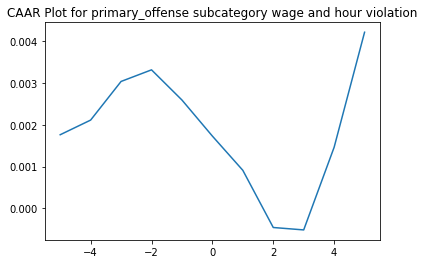

         ARR      CAAR        sd    t_stat   p_value
-5  0.001763  0.001763  0.013945  3.464660  0.000561
-4  0.000351  0.002114  0.019028  3.044363  0.002413
-3  0.000924  0.003038  0.023630  3.523403  0.000452
-2  0.000278  0.003316  0.027066  3.357280  0.000827
-1 -0.000722  0.002594  0.029259  2.429326  0.015361
 0 -0.000863  0.001730  0.031345  1.512786  0.130755
 1 -0.000819  0.000911  0.033880  0.737277  0.461185
 2 -0.001368 -0.000457  0.038156 -0.328113  0.742918
 3 -0.000058 -0.000515  0.039280 -0.359060  0.719652
 4  0.001978  0.001463  0.045191  0.887337  0.375182
 5  0.002752  0.004216  0.054195  2.131667  0.033359
CAR FOR Different Primary Offence Groups GROUP railroad safety violation
We found AR for 830 events
AR.shape[1] is 830


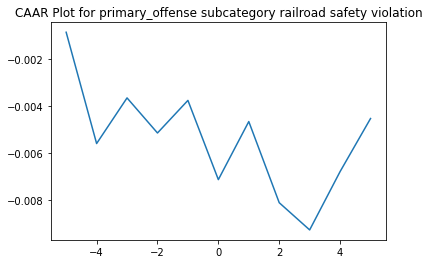

         ARR      CAAR        sd     t_stat       p_value
-5 -0.000842 -0.000842  0.008432  -2.878620  4.096929e-03
-4 -0.004752 -0.005594  0.013106 -12.296789  4.835781e-32
-3  0.001948 -0.003646  0.014678  -7.156053  1.828453e-12
-2 -0.001497 -0.005143  0.018357  -8.071404  2.435643e-15
-1  0.001391 -0.003752  0.020883  -5.176147  2.844067e-07
 0 -0.003382 -0.007134  0.023083  -8.903778  3.357933e-18
 1  0.002479 -0.004655  0.025444  -5.270992  1.731786e-07
 2 -0.003464 -0.008119  0.023914  -9.781474  1.856241e-21
 3 -0.001162 -0.009281  0.025899 -10.324093  1.370022e-23
 4  0.002491 -0.006790  0.026226  -7.459197  2.197565e-13
 5  0.002265 -0.004526  0.027062  -4.818017  1.723959e-06
For ticker None we have 169 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 60 NaN values     in the window
Something is wrong with GL in 2019-01-28 00:00:00
For ticker None we have 66 NaN values     in the window
Something is wrong with GL in 2019-

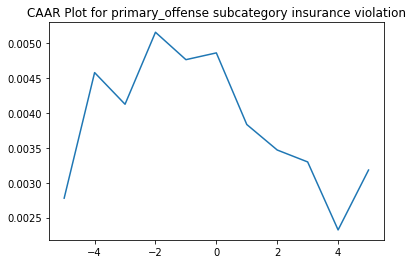

         ARR      CAAR        sd    t_stat   p_value
-5  0.002779  0.002779  0.018382  3.057052  0.002382
-4  0.001798  0.004576  0.024953  3.709052  0.000237
-3 -0.000453  0.004123  0.033755  2.470209  0.013911
-2  0.001031  0.005154  0.034880  2.988274  0.002975
-1 -0.000393  0.004761  0.040586  2.372531  0.018130
 0  0.000097  0.004858  0.041181  2.385903  0.017493
 1 -0.001025  0.003833  0.046065  1.682826  0.093174
 2 -0.000365  0.003468  0.046699  1.501899  0.133897
 3 -0.000171  0.003297  0.049371  1.350671  0.177549
 4 -0.000973  0.002324  0.051362  0.915121  0.360668
 5  0.000857  0.003181  0.050362  1.277517  0.202146
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
For ticker None we have 1 NaN values     in 

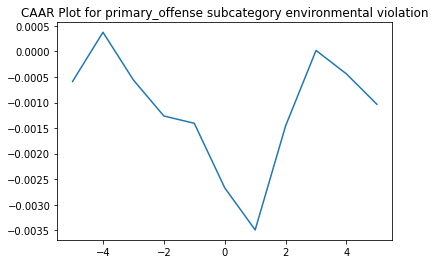

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000587 -0.000587  0.012758 -0.836424  0.403524
-4  0.000963  0.000376  0.023674  0.288540  0.773115
-3 -0.000935 -0.000559  0.027592 -0.368226  0.712942
-2 -0.000704 -0.001264  0.031274 -0.734026  0.463456
-1 -0.000143 -0.001407  0.035321 -0.723572  0.469842
 0 -0.001263 -0.002670  0.038324 -1.265627  0.206542
 1 -0.000824 -0.003495  0.041850 -1.516885  0.130256
 2  0.002037 -0.001457  0.043029 -0.615211  0.538841
 3  0.001477  0.000020  0.043449  0.008302  0.993381
 4 -0.000460 -0.000440  0.045519 -0.175647  0.860679
 5 -0.000594 -0.001035  0.049870 -0.376876  0.706509
CAR FOR Different Primary Offence Groups GROUP nursing home violation
We found AR for 187 events
AR.shape[1] is 187


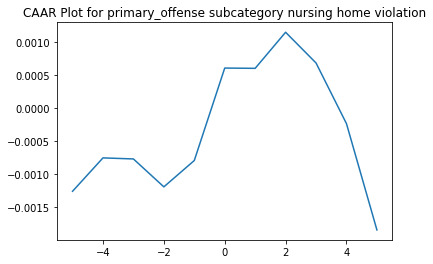

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001257 -0.001257  0.008531 -2.014807  0.045365
-4  0.000506 -0.000751  0.015088 -0.681001  0.496718
-3 -0.000016 -0.000767  0.019137 -0.548302  0.584142
-2 -0.000423 -0.001190  0.020474 -0.794850  0.427714
-1  0.000399 -0.000791  0.022326 -0.484516  0.628589
 0  0.001400  0.000609  0.023198  0.358994  0.720007
 1 -0.000004  0.000605  0.023647  0.349628  0.727014
 2  0.000547  0.001151  0.024814  0.634445  0.526570
 3 -0.000465  0.000686  0.027272  0.343925  0.731291
 4 -0.000919 -0.000233  0.029642 -0.107349  0.914628
 5 -0.001609 -0.001842  0.031904 -0.789548  0.430797
For ticker None we have 134 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 97 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 113 NaN values     in the window
Something is wrong with DD in 2019-09-27 00:00:00
CAR FOR Different Primary Offence Groups G

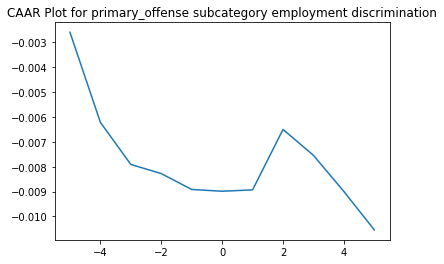

         ARR      CAAR        sd    t_stat   p_value
-5 -0.002596 -0.002596  0.018508 -1.683246  0.094509
-4 -0.003621 -0.006217  0.021555 -3.461074  0.000710
-3 -0.001691 -0.007908  0.024161 -3.927804  0.000133
-2 -0.000368 -0.008277  0.028559 -3.477671  0.000670
-1 -0.000638 -0.008914  0.030461 -3.511772  0.000596
 0 -0.000071 -0.008985  0.033276 -3.240379  0.001485
 1  0.000054 -0.008932  0.039147 -2.737851  0.006970
 2  0.002429 -0.006503  0.047102 -1.656677  0.099777
 3 -0.001040 -0.007542  0.052459 -1.725325  0.086629
 4 -0.001453 -0.008995  0.054775 -1.970688  0.050691
 5 -0.001545 -0.010540  0.055784 -2.267333  0.024869
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-03-18 00:00:00
CAR FOR Different Primary Offence Groups GROUP consumer protection violation
We found AR for 122 events
AR.shape[1] is 122


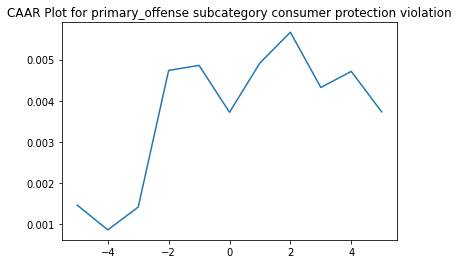

         ARR      CAAR        sd    t_stat   p_value
-5  0.001465  0.001465  0.016310  0.992401  0.322982
-4 -0.000601  0.000864  0.022259  0.428829  0.668811
-3  0.000554  0.001418  0.033602  0.466266  0.641864
-2  0.003318  0.004737  0.041953  1.247077  0.214778
-1  0.000123  0.004860  0.038966  1.377578  0.170876
 0 -0.001139  0.003721  0.036420  1.128503  0.261340
 1  0.001198  0.004919  0.035314  1.538619  0.126508
 2  0.000745  0.005664  0.038839  1.610854  0.109817
 3 -0.001341  0.004323  0.042448  1.124955  0.262835
 4  0.000390  0.004713  0.048139  1.081485  0.281632
 5 -0.000983  0.003731  0.049503  0.832418  0.406813
CAR FOR Different Primary Offence Groups GROUP aviation safety violation
We found AR for 113 events
AR.shape[1] is 113


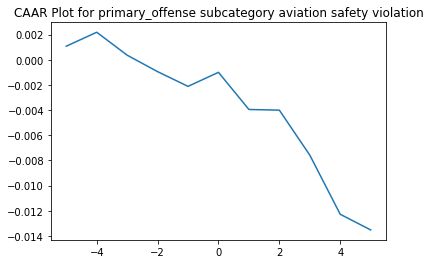

         ARR      CAAR        sd    t_stat   p_value
-5  0.001084  0.001084  0.012604  0.913855  0.362756
-4  0.001108  0.002192  0.017696  1.316740  0.190614
-3 -0.001825  0.000367  0.021788  0.179245  0.858069
-2 -0.001308 -0.000940  0.023952 -0.417301  0.677257
-1 -0.001170 -0.002110  0.026498 -0.846424  0.399121
 0  0.001116 -0.000994  0.028891 -0.365611  0.715345
 1 -0.002953 -0.003947  0.035884 -1.169114  0.244840
 2 -0.000054 -0.004001  0.038355 -1.108810  0.269887
 3 -0.003573 -0.007573  0.049489 -1.626729  0.106605
 4 -0.004702 -0.012276  0.063076 -2.068824  0.040864
 5 -0.001244 -0.013519  0.057370 -2.504999  0.013684
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-08 00:00:00
For ticker None we have 200 NaN values  

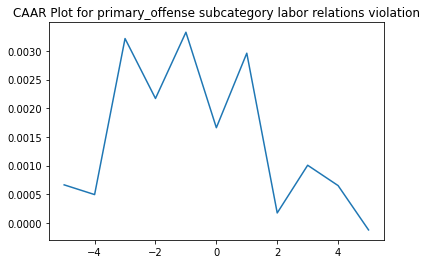

         ARR      CAAR        sd    t_stat   p_value
-5  0.000664  0.000664  0.012180  0.490785  0.624922
-4 -0.000170  0.000495  0.016010  0.278009  0.781723
-3  0.002721  0.003215  0.019731  1.466601  0.146405
-2 -0.001045  0.002170  0.023422  0.833996  0.406766
-1  0.001155  0.003325  0.028274  1.058487  0.293019
 0 -0.001665  0.001661  0.037589  0.397583  0.691996
 1  0.001299  0.002960  0.041335  0.644453  0.521125
 2 -0.002785  0.000175  0.052787  0.029753  0.976338
 3  0.000832  0.001006  0.054140  0.167281  0.867571
 4 -0.000355  0.000651  0.062440  0.093903  0.925421
 5 -0.000773 -0.000121  0.087205 -0.012536  0.990029
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
CAR FOR Different Primary Offence Groups GROUP False Claims Act and related
We found AR for 67 events
AR.shape[1] is 67


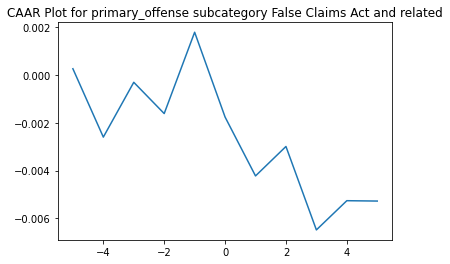

         ARR      CAAR        sd    t_stat   p_value
-5  0.000262  0.000262  0.011937  0.179868  0.857808
-4 -0.002862 -0.002600  0.019579 -1.086875  0.281045
-3  0.002295 -0.000305  0.021895 -0.114046  0.909547
-2 -0.001309 -0.001614  0.023738 -0.556560  0.579711
-1  0.003405  0.001790  0.036817  0.398066  0.691867
 0 -0.003550 -0.001760  0.040908 -0.352103  0.725883
 1 -0.002465 -0.004225  0.047783 -0.723766  0.471767
 2  0.001233 -0.002992  0.051602 -0.474631  0.636617
 3 -0.003493 -0.006485  0.071787 -0.739489  0.462233
 4  0.001223 -0.005262  0.068505 -0.628739  0.531690
 5 -0.000015 -0.005277  0.069756 -0.619252  0.537882
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 83 NaN values     in the window
Something is wrong with TFC in 2018-06-28 00:00:00
CAR FOR Different Primary Offence Groups GROUP benefit plan administrator violation
We found AR for 43 events
AR.shape[1] is 43


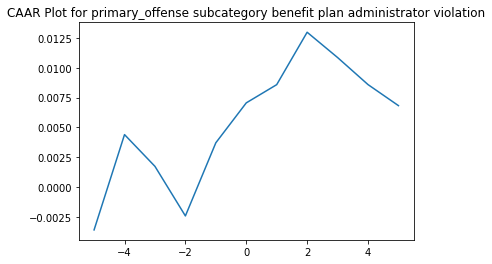

         ARR      CAAR        sd    t_stat   p_value
-5 -0.003601 -0.003601  0.014084 -1.676754  0.101020
-4  0.007992  0.004390  0.018497  1.556377  0.127122
-3 -0.002663  0.001727  0.025156  0.450148  0.654919
-2 -0.004155 -0.002428  0.033082 -0.481238  0.632845
-1  0.006131  0.003703  0.032663  0.743410  0.461372
 0  0.003347  0.007050  0.032908  1.404750  0.167449
 1  0.001528  0.008578  0.032941  1.707492  0.095114
 2  0.004394  0.012971  0.036789  2.312072  0.025747
 3 -0.002119  0.010852  0.040688  1.748895  0.087615
 4 -0.002269  0.008583  0.040711  1.382515  0.174121
 5 -0.001765  0.006818  0.042893  1.042413  0.303184
CAR FOR Different Primary Offence Groups GROUP Family and Medical Leave Act
We found AR for 31 events
AR.shape[1] is 31


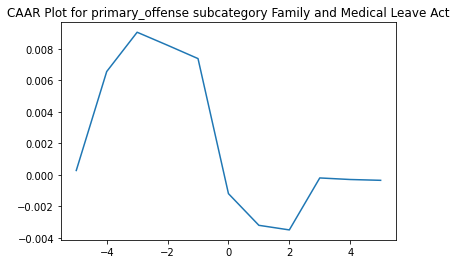

         ARR      CAAR        sd    t_stat   p_value
-5  0.000267  0.000267  0.014200  0.104800  0.917232
-4  0.006283  0.006550  0.015262  2.389639  0.023351
-3  0.002496  0.009046  0.021407  2.352943  0.025377
-2 -0.000827  0.008219  0.022552  2.029205  0.051391
-1 -0.000846  0.007373  0.021060  1.949167  0.060680
 0 -0.008576 -0.001203  0.036929 -0.181370  0.857297
 1 -0.002012 -0.003215  0.046830 -0.382271  0.704955
 2 -0.000292 -0.003507  0.049640 -0.393376  0.696824
 3  0.003301 -0.000207  0.051591 -0.022291  0.982363
 4 -0.000099 -0.000306  0.051677 -0.032952  0.973931
 5 -0.000052 -0.000358  0.049045 -0.040593  0.967889


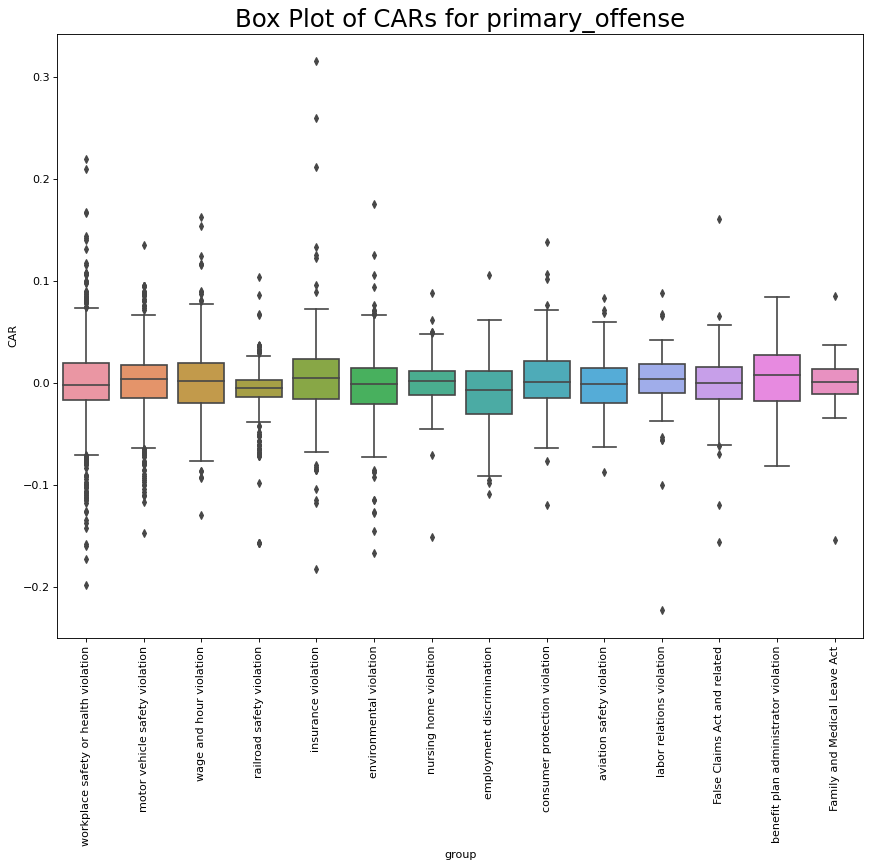

In [ ]:
a = CAAR_by_category(df, events, 'primary_offense',\
                     cat_name='Different Primary Offence Groups', cat_members=primary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
CAR FOR Different Secondary Offence Groups GROUP Fair Labor Standards Act
We found AR for 619 events
AR.shape[1] is 619


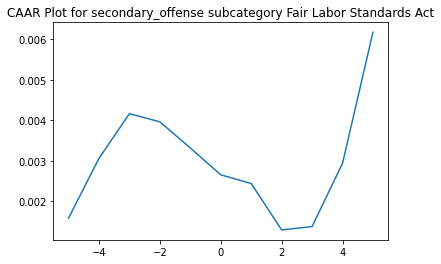

         ARR      CAAR        sd    t_stat   p_value
-5  0.001590  0.001590  0.013717  2.883913  0.004064
-4  0.001475  0.003065  0.017382  4.387739  0.000013
-3  0.001102  0.004167  0.021161  4.899911  0.000001
-2 -0.000204  0.003964  0.025006  3.943896  0.000089
-1 -0.000644  0.003320  0.027271  3.028639  0.002559
 0 -0.000662  0.002657  0.028117  2.351353  0.019018
 1 -0.000215  0.002443  0.030438  1.996687  0.046297
 2 -0.001145  0.001298  0.031482  1.025465  0.305545
 3  0.000083  0.001381  0.033211  1.034439  0.301336
 4  0.001559  0.002940  0.035859  2.039499  0.041825
 5  0.003236  0.006176  0.039086  3.931223  0.000094
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2018-09-12 00:00:00
CAR FOR Different Secondary Offence Groups GROUP overtime violation
We found AR for 391 events
AR.shape[1] is 391


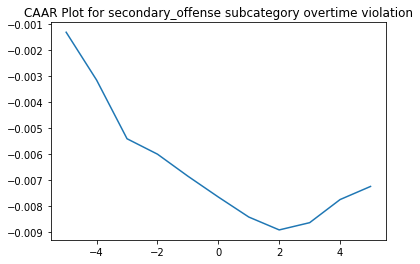

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001318 -0.001318  0.014615 -1.783729  0.075245
-4 -0.001835 -0.003153  0.019584 -3.183973  0.001569
-3 -0.002251 -0.005404  0.024264 -4.404187  0.000014
-2 -0.000591 -0.005996  0.027060 -4.381372  0.000015
-1 -0.000845 -0.006841  0.029088 -4.650336  0.000005
 0 -0.000799 -0.007640  0.032743 -4.613942  0.000005
 1 -0.000767 -0.008407  0.036583 -4.544356  0.000007
 2 -0.000494 -0.008902  0.039263 -4.483132  0.000010
 3  0.000278 -0.008624  0.041449 -4.113989  0.000047
 4  0.000887 -0.007737  0.043550 -3.512814  0.000495
 5  0.000503 -0.007234  0.044354 -3.225019  0.001366
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
CAR FOR Different Secondary Offence Groups GROUP mining violation
We found AR for 313 events
AR.shape[1] is 313


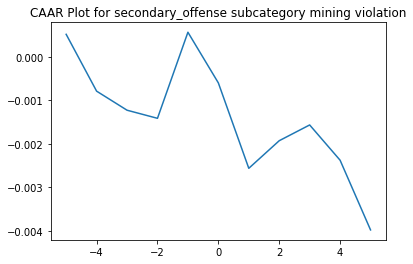

         ARR      CAAR        sd    t_stat   p_value
-5  0.000514  0.000514  0.019062  0.476615  0.633970
-4 -0.001305 -0.000791  0.026706 -0.524272  0.600462
-3 -0.000438 -0.001229  0.033235 -0.654206  0.513461
-2 -0.000186 -0.001415  0.038992 -0.642048  0.521314
-1  0.001976  0.000561  0.043499  0.228251  0.819601
 0 -0.001163 -0.000602  0.046571 -0.228660  0.819283
 1 -0.001961 -0.002563  0.052798 -0.858804  0.391108
 2  0.000634 -0.001929  0.056059 -0.608873  0.543052
 3  0.000362 -0.001567  0.061022 -0.454393  0.649862
 4 -0.000810 -0.002377  0.063866 -0.658484  0.510713
 5 -0.001600 -0.003977  0.069193 -1.016978  0.309952
CAR FOR Different Secondary Offence Groups GROUP misclassification
We found AR for 149 events
AR.shape[1] is 149


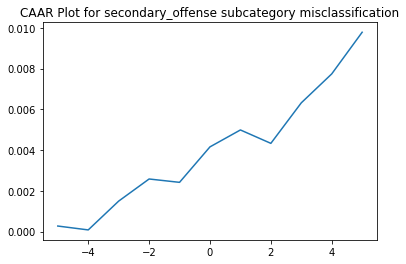

         ARR      CAAR        sd    t_stat   p_value
-5  0.000272  0.000272  0.011854  0.280223  0.779698
-4 -0.000190  0.000082  0.019107  0.052323  0.958342
-3  0.001413  0.001495  0.022722  0.803284  0.423099
-2  0.001085  0.002581  0.024774  1.271530  0.205535
-1 -0.000164  0.002416  0.027698  1.064803  0.288699
 0  0.001740  0.004157  0.031253  1.623410  0.106630
 1  0.000830  0.004987  0.032309  1.883941  0.061534
 2 -0.000658  0.004329  0.034346  1.538558  0.126047
 3  0.001988  0.006317  0.035459  2.174635  0.031246
 4  0.001419  0.007736  0.036728  2.571236  0.011120
 5  0.002044  0.009781  0.038144  3.129982  0.002106
CAR FOR Different Secondary Offence Groups GROUP other pay violation
We found AR for 146 events
AR.shape[1] is 146


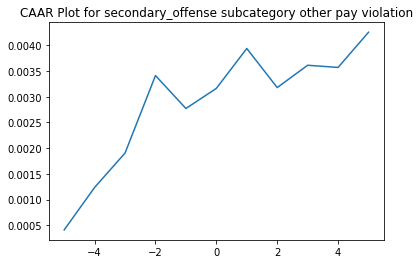

         ARR      CAAR        sd    t_stat   p_value
-5  0.000411  0.000411  0.009965  0.498109  0.619162
-4  0.000826  0.001237  0.014532  1.028454  0.305449
-3  0.000669  0.001905  0.020876  1.102815  0.271935
-2  0.001507  0.003412  0.024457  1.685856  0.093974
-1 -0.000640  0.002772  0.025701  1.303271  0.194548
 0  0.000391  0.003163  0.029208  1.308396  0.192809
 1  0.000775  0.003938  0.029980  1.587248  0.114635
 2 -0.000759  0.003179  0.030971  1.240230  0.216894
 3  0.000434  0.003613  0.030978  1.409138  0.160935
 4 -0.000043  0.003570  0.033005  1.307004  0.193280
 5  0.000684  0.004254  0.034514  1.489476  0.138534
CAR FOR Different Secondary Offence Groups GROUP meal/rest break violation
We found AR for 97 events
AR.shape[1] is 97


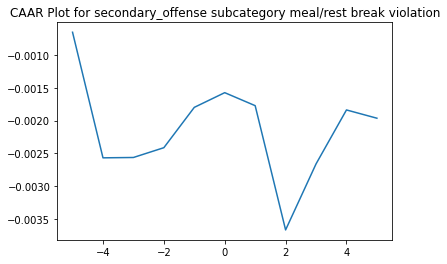

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000653 -0.000653  0.009848 -0.652593  0.515579
-4 -0.001916 -0.002568  0.016249 -1.556631  0.122849
-3  0.000005 -0.002563  0.019154 -1.317815  0.190702
-2  0.000149 -0.002414  0.022630 -1.050398  0.296172
-1  0.000615 -0.001798  0.024990 -0.708769  0.480185
 0  0.000224 -0.001574  0.027799 -0.557691  0.578354
 1 -0.000198 -0.001772  0.029595 -0.589849  0.556678
 2 -0.001895 -0.003668  0.031611 -1.142747  0.255986
 3  0.001007 -0.002661  0.034147 -0.767528  0.444651
 4  0.000823 -0.001838  0.036466 -0.496332  0.620795
 5 -0.000126 -0.001964  0.037970 -0.509403  0.611639
CAR FOR Different Secondary Offence Groups GROUP off-the-clock work
We found AR for 91 events
AR.shape[1] is 91


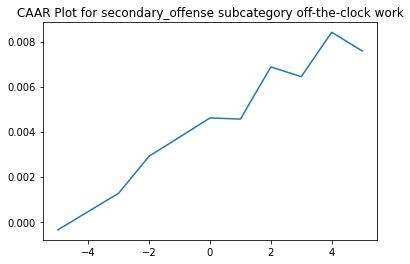

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000366 -0.000366  0.011924 -0.292628  0.770480
-4  0.000815  0.000450  0.019878  0.215726  0.829689
-3  0.000816  0.001265  0.024852  0.485714  0.628350
-2  0.001644  0.002910  0.029015  0.956621  0.341321
-1  0.000845  0.003754  0.029439  1.216587  0.226942
 0  0.000855  0.004609  0.030621  1.435900  0.154497
 1 -0.000052  0.004557  0.033637  1.292434  0.199515
 2  0.002316  0.006874  0.036785  1.782562  0.078030
 3 -0.000431  0.006443  0.039247  1.566051  0.120846
 4  0.001972  0.008415  0.043727  1.835852  0.069682
 5 -0.000830  0.007586  0.048580  1.489554  0.139838
For ticker None we have 104 NaN values     in the window
Something is wrong with RTX in 2017-12-08 00:00:00
CAR FOR Different Secondary Offence Groups GROUP Service Contract Act
We found AR for 59 events
AR.shape[1] is 59


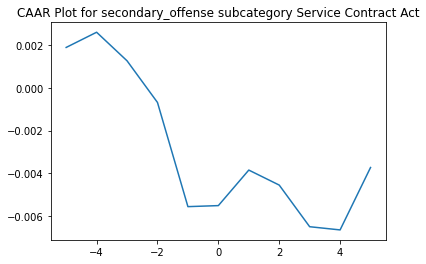

         ARR      CAAR        sd    t_stat   p_value
-5  0.001883  0.001883  0.010773  1.342484  0.184670
-4  0.000710  0.002593  0.017066  1.166915  0.248020
-3 -0.001334  0.001259  0.018842  0.513080  0.609844
-2 -0.001946 -0.000687  0.024353 -0.216796  0.829128
-1 -0.004866 -0.005553  0.026882 -1.586800  0.117995
 0  0.000048 -0.005505  0.028123 -1.503683  0.138089
 1  0.001660 -0.003846  0.028184 -1.048049  0.298964
 2 -0.000701 -0.004547  0.028988 -1.204749  0.233193
 3 -0.001945 -0.006491  0.029204 -1.707287  0.093117
 4 -0.000150 -0.006641  0.031938 -1.597116  0.115674
 5  0.002915 -0.003725  0.034073 -0.839824  0.404455
CAR FOR Different Secondary Offence Groups GROUP racial discrimination
We found AR for 57 events
AR.shape[1] is 57


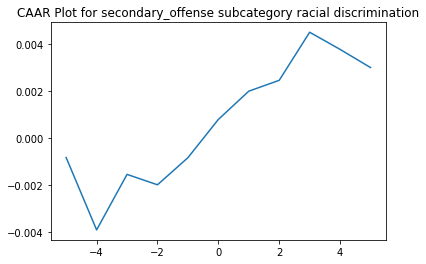

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000834 -0.000834  0.017178 -0.366714  0.715214
-4 -0.003090 -0.003924  0.023767 -1.246493  0.217772
-3  0.002372 -0.001552  0.026895 -0.435761  0.664685
-2 -0.000445 -0.001997  0.028123 -0.536139  0.593986
-1  0.001157 -0.000840  0.031956 -0.198475  0.843392
 0  0.001633  0.000793  0.032031  0.186949  0.852377
 1  0.001208  0.002001  0.033080  0.456764  0.649608
 2  0.000463  0.002464  0.035245  0.527925  0.599637
 3  0.002053  0.004517  0.036981  0.922257  0.360351
 4 -0.000733  0.003785  0.038959  0.733453  0.466342
 5 -0.000775  0.003009  0.040561  0.560141  0.577618
CAR FOR Different Secondary Offence Groups GROUP child labor or youth employment violation
We found AR for 53 events
AR.shape[1] is 53


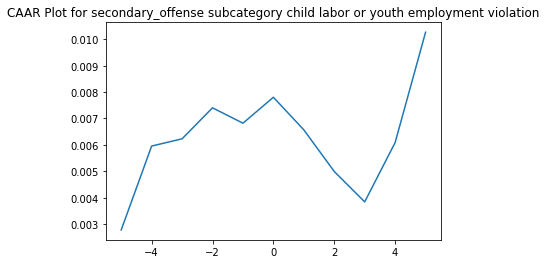

         ARR      CAAR        sd    t_stat   p_value
-5  0.002782  0.002782  0.012746  1.589204  0.118077
-4  0.003174  0.005956  0.021024  2.062562  0.044166
-3  0.000275  0.006231  0.023279  1.948738  0.056732
-2  0.001174  0.007405  0.025934  2.078700  0.042596
-1 -0.000583  0.006822  0.027530  1.804042  0.077018
 0  0.000982  0.007804  0.031896  1.781207  0.080720
 1 -0.001234  0.006570  0.033822  1.414156  0.163276
 2 -0.001576  0.004994  0.038116  0.953776  0.344610
 3 -0.001150  0.003844  0.037884  0.738723  0.463397
 4  0.002246  0.006090  0.039820  1.113347  0.270680
 5  0.004175  0.010265  0.040698  1.836195  0.072049
CAR FOR Different Secondary Offence Groups GROUP Davis-Bacon Act and related
We found AR for 42 events
AR.shape[1] is 42


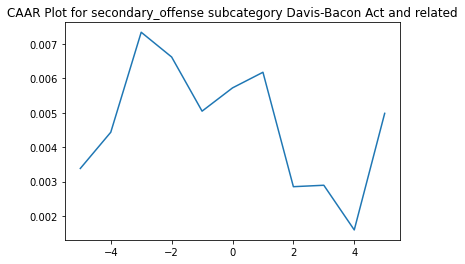

         ARR      CAAR        sd    t_stat   p_value
-5  0.003383  0.003383  0.016763  1.308052  0.198142
-4  0.001052  0.004436  0.020458  1.405208  0.167492
-3  0.002908  0.007344  0.022055  2.157943  0.036841
-2 -0.000720  0.006624  0.025190  1.704088  0.095933
-1 -0.001574  0.005049  0.030501  1.072853  0.289611
 0  0.000676  0.005726  0.031392  1.182034  0.244003
 1  0.000454  0.006180  0.031386  1.276073  0.209111
 2 -0.003327  0.002853  0.033380  0.553887  0.582665
 3  0.000042  0.002895  0.035024  0.535609  0.595123
 4 -0.001299  0.001596  0.038482  0.268779  0.789448
 5  0.003389  0.004985  0.041213  0.783954  0.437573
CAR FOR Different Secondary Offence Groups GROUP antiboycott violation
We found AR for 31 events
AR.shape[1] is 31


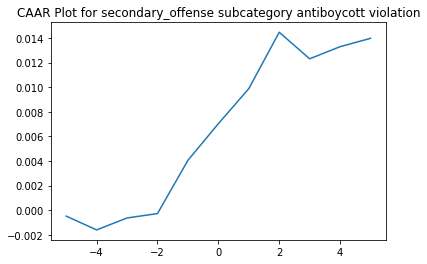

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000479 -0.000479  0.012108 -0.220242  0.827175
-4 -0.001123 -0.001602  0.017508 -0.509475  0.614147
-3  0.000972 -0.000631  0.018248 -0.192386  0.848737
-2  0.000357 -0.000274  0.023023 -0.066251  0.947618
-1  0.004327  0.004053  0.027473  0.821485  0.417851
 0  0.002982  0.007035  0.028056  1.396105  0.172929
 1  0.002848  0.009883  0.032687  1.683373  0.102683
 2  0.004585  0.014468  0.035632  2.260742  0.031189
 3 -0.002159  0.012310  0.040139  1.707486  0.098063
 4  0.000985  0.013294  0.039687  1.865090  0.071977
 5  0.000679  0.013973  0.036677  2.121168  0.042283


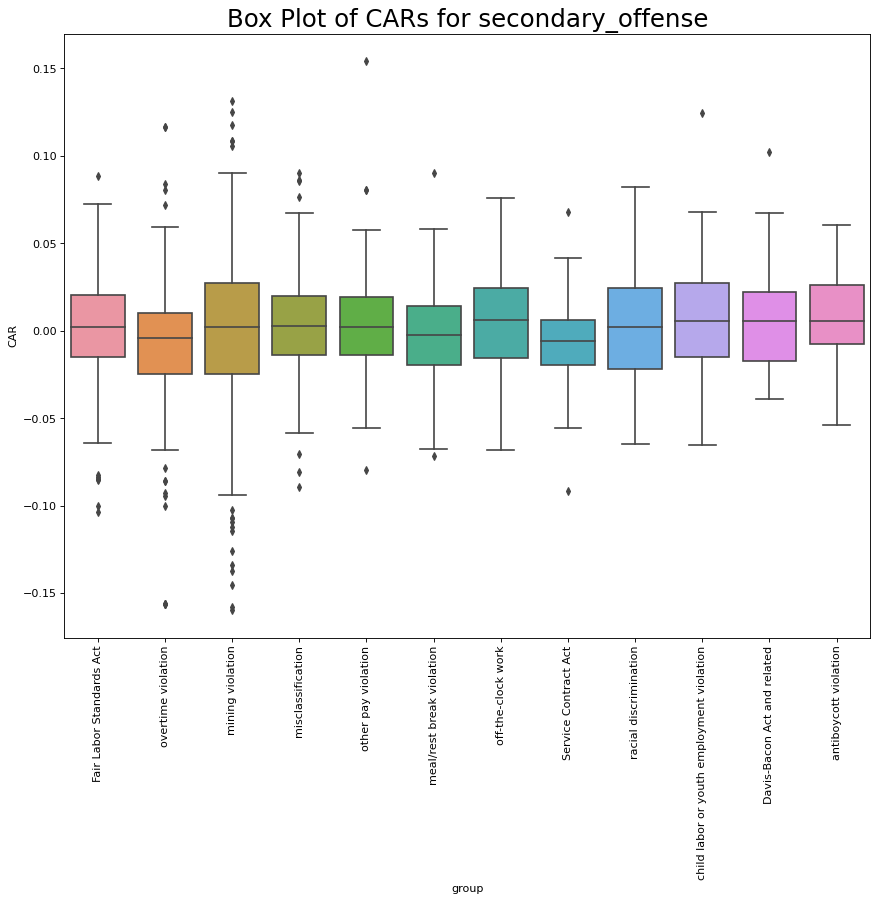

In [ ]:
a = CAAR_by_category(df, events, 'secondary_offense',\
                     cat_name='Different Secondary Offence Groups', cat_members=secondary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 134 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 20 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Agency Groups GROUP OSHA
We found AR for 1435 events
AR.shape[1] is 1435


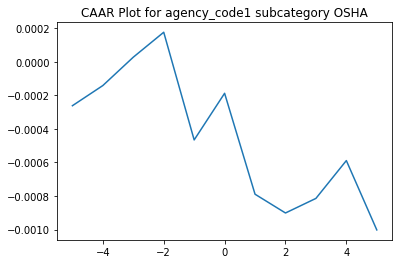

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000262 -0.000262  0.013570 -0.730519  0.465192
-4  0.000120 -0.000141  0.020232 -0.264845  0.791167
-3  0.000169  0.000028  0.025744  0.040522  0.967683
-2  0.000149  0.000176  0.028117  0.237378  0.812397
-1 -0.000642 -0.000466  0.032144 -0.548729  0.583277
 0  0.000278 -0.000188  0.034603 -0.205469  0.837234
 1 -0.000602 -0.000789  0.039063 -0.765327  0.444203
 2 -0.000112 -0.000901  0.041136 -0.829797  0.406792
 3  0.000087 -0.000814  0.044056 -0.700102  0.483977
 4  0.000225 -0.000589  0.046571 -0.478901  0.632082
 5 -0.000413 -0.001002  0.049866 -0.761198  0.446664
CAR FOR Different Agency Groups GROUP FMCSA
We found AR for 1072 events
AR.shape[1] is 1072


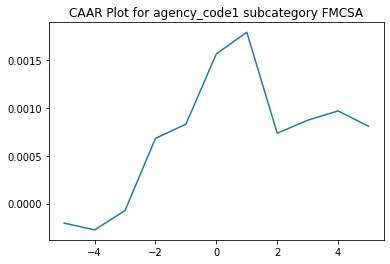

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000204 -0.000204  0.012246 -0.545880  0.585262
-4 -0.000072 -0.000276  0.018448 -0.489318  0.624717
-3  0.000203 -0.000073  0.022015 -0.108048  0.913978
-2  0.000756  0.000684  0.024497  0.913966  0.360940
-1  0.000148  0.000832  0.027814  0.979611  0.327499
 0  0.000737  0.001569  0.031246  1.644165  0.100436
 1  0.000226  0.001796  0.034312  1.713321  0.086943
 2 -0.001058  0.000738  0.038389  0.629028  0.529465
 3  0.000147  0.000885  0.039582  0.731751  0.464481
 4  0.000098  0.000982  0.042884  0.750080  0.453372
 5 -0.000161  0.000822  0.045697  0.588641  0.556226
CAR FOR Different Agency Groups GROUP FRA
We found AR for 869 events
AR.shape[1] is 869


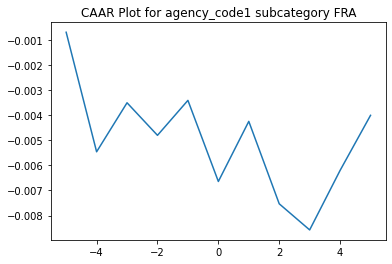

         ARR      CAAR        sd     t_stat       p_value
-5 -0.000704 -0.000704  0.008465  -2.450733  1.445292e-02
-4 -0.004758 -0.005462  0.013181 -12.215411  8.844808e-32
-3  0.001951 -0.003511  0.014937  -6.929091  8.253260e-12
-2 -0.001295 -0.004806  0.018854  -7.515041  1.416102e-13
-1  0.001391 -0.003415  0.021131  -4.764489  2.218684e-06
 0 -0.003228 -0.006643  0.023540  -8.319235  3.409930e-16
 1  0.002392 -0.004251  0.025882  -4.841982  1.521625e-06
 2 -0.003281 -0.007532  0.025366  -8.752946  1.070759e-17
 3 -0.001040 -0.008571  0.027704  -9.120429  5.101702e-19
 4  0.002369 -0.006203  0.027609  -6.622743  6.175847e-11
 5  0.002192 -0.004011  0.028192  -4.193966  3.022699e-05
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 104 NaN values     in the window
Something is wrong with RTX in 2017-12-08 00:00:00
CAR FOR Different Agency Groups GROUP WHD
We found AR for 603 events
AR.shape[1] is 603


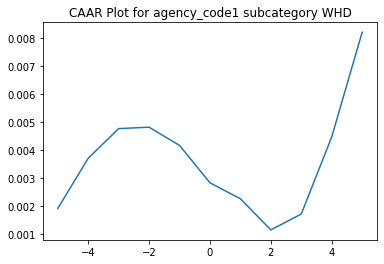

         ARR      CAAR        sd    t_stat       p_value
-5  0.001908  0.001908  0.014384  3.258059  1.184911e-03
-4  0.001793  0.003701  0.018583  4.890816  1.290272e-06
-3  0.001056  0.004758  0.021653  5.395441  9.839476e-08
-2  0.000050  0.004808  0.025901  4.557898  6.259665e-06
-1 -0.000651  0.004157  0.027669  3.689132  2.454008e-04
 0 -0.001335  0.002822  0.029747  2.329608  2.015666e-02
 1 -0.000569  0.002253  0.032321  1.712037  8.740492e-02
 2 -0.001112  0.001142  0.034314  0.817079  4.142068e-01
 3  0.000567  0.001709  0.035144  1.193953  2.329665e-01
 4  0.002752  0.004461  0.038998  2.808980  5.131215e-03
 5  0.003736  0.008197  0.042589  4.725988  2.853758e-06
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00

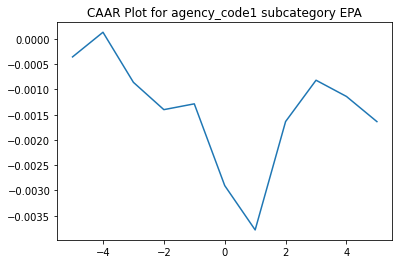

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000354 -0.000354  0.013395 -0.432339  0.665845
-4  0.000489  0.000134  0.024804  0.088348  0.929667
-3 -0.000992 -0.000858  0.028966 -0.484182  0.628655
-2 -0.000541 -0.001399  0.032187 -0.710413  0.478071
-1  0.000115 -0.001284  0.036019 -0.582683  0.560600
 0 -0.001620 -0.002904  0.039057 -1.214957  0.225460
 1 -0.000878 -0.003782  0.042193 -1.464766  0.144166
 2  0.002147 -0.001635  0.043287 -0.617233  0.537609
 3  0.000819 -0.000816  0.044053 -0.302828  0.762258
 4 -0.000322 -0.001138  0.046439 -0.400497  0.689112
 5 -0.000498 -0.001636  0.050778 -0.526603  0.598908
CAR FOR Different Agency Groups GROUP CMS
We found AR for 222 events
AR.shape[1] is 222


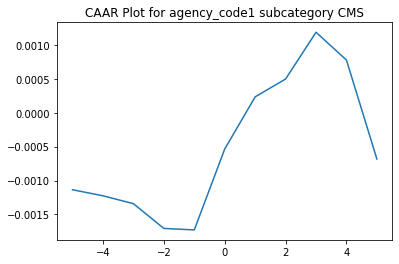

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001136 -0.001136  0.008605 -1.967240  0.050407
-4 -0.000089 -0.001225  0.016322 -1.118361  0.264627
-3 -0.000117 -0.001342  0.022787 -0.877281  0.381286
-2 -0.000365 -0.001707  0.025306 -1.004897  0.316045
-1 -0.000022 -0.001729  0.027666 -0.931047  0.352845
 0  0.001193 -0.000535  0.028986 -0.275197  0.783422
 1  0.000770  0.000235  0.027626  0.126679  0.899310
 2  0.000263  0.000498  0.030027  0.247242  0.804951
 3  0.000690  0.001188  0.029017  0.610176  0.542372
 4 -0.000411  0.000778  0.031960  0.362519  0.717311
 5 -0.001461 -0.000683  0.033850 -0.300762  0.763879
For ticker None we have 169 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 66 NaN values     in the window
Something is wrong with GL in 2019-02-05 00:00:00
CAR FOR Different Agency Groups GROUP INS
We found AR for 225 events
AR.shape[1] is 225


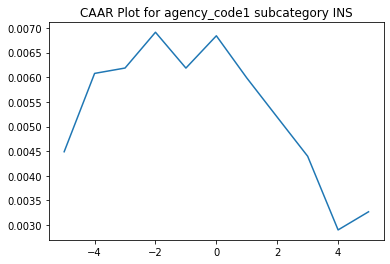

         ARR      CAAR        sd    t_stat   p_value
-5  0.004488  0.004488  0.019616  3.432167  0.000713
-4  0.001590  0.006079  0.025850  3.527338  0.000509
-3  0.000109  0.006188  0.035688  2.600743  0.009922
-2  0.000727  0.006914  0.033444  3.101149  0.002175
-1 -0.000728  0.006187  0.040354  2.299693  0.022387
 0  0.000655  0.006842  0.041380  2.480255  0.013865
 1 -0.000856  0.005987  0.047575  1.887494  0.060387
 2 -0.000796  0.005190  0.049531  1.571884  0.117389
 3 -0.000793  0.004397  0.052884  1.247252  0.213607
 4 -0.001496  0.002902  0.052847  0.823612  0.411036
 5  0.000368  0.003270  0.048953  1.001873  0.317486
CAR FOR Different Agency Groups GROUP AG
We found AR for 214 events
AR.shape[1] is 214


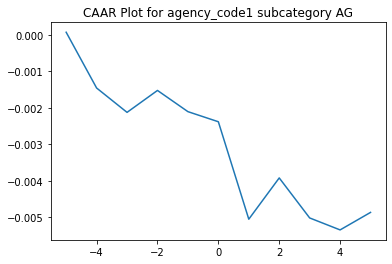

         ARR      CAAR        sd    t_stat   p_value
-5  0.000067  0.000067  0.013152  0.074592  0.940609
-4 -0.001525 -0.001458  0.018700 -1.140833  0.255221
-3 -0.000666 -0.002125  0.028689 -1.083374  0.279867
-2  0.000600 -0.001525  0.029703 -0.751038  0.453459
-1 -0.000580 -0.002105  0.034406 -0.895057  0.371767
 0 -0.000276 -0.002381  0.038598 -0.902552  0.367783
 1 -0.002665 -0.005047  0.039169 -1.884897  0.060805
 2  0.001129 -0.003918  0.042642 -1.344199  0.180314
 3 -0.001095 -0.005013  0.048216 -1.520873  0.129775
 4 -0.000328 -0.005340  0.050098 -1.559442  0.120376
 5  0.000479 -0.004861  0.052576 -1.352609  0.177615
CAR FOR Different Agency Groups GROUP MSHA
We found AR for 204 events
AR.shape[1] is 204


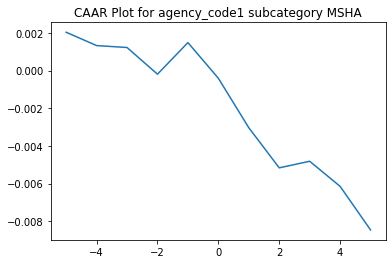

         ARR      CAAR        sd    t_stat   p_value
-5  0.002036  0.002036  0.020510  1.417738  0.157800
-4 -0.000708  0.001327  0.026757  0.708544  0.479421
-3 -0.000102  0.001225  0.034074  0.513543  0.608130
-2 -0.001417 -0.000192  0.040189 -0.068215  0.945682
-1  0.001678  0.001486  0.044553  0.476533  0.634208
 0 -0.001896 -0.000409  0.049518 -0.118030  0.906160
 1 -0.002626 -0.003035  0.056387 -0.768849  0.442877
 2 -0.002132 -0.005167  0.059883 -1.232444  0.219209
 3  0.000350 -0.004818  0.066405 -1.036184  0.301349
 4 -0.001332 -0.006149  0.068131 -1.289097  0.198831
 5 -0.002315 -0.008464  0.073236 -1.650729  0.100340
CAR FOR Different Agency Groups GROUP MHC
We found AR for 123 events
AR.shape[1] is 123


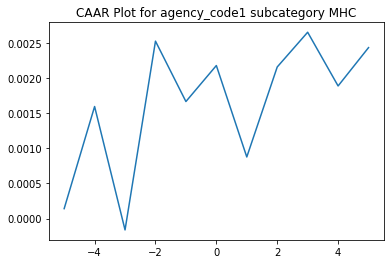

         ARR      CAAR        sd    t_stat   p_value
-5  0.000142  0.000142  0.015679  0.100160  0.920381
-4  0.001452  0.001594  0.023390  0.755591  0.451351
-3 -0.001754 -0.000161  0.027280 -0.065390  0.947971
-2  0.002684  0.002523  0.028969  0.965794  0.336058
-1 -0.000858  0.001664  0.031896  0.578687  0.563867
 0  0.000512  0.002176  0.034515  0.699251  0.485726
 1 -0.001300  0.000876  0.037289  0.260590  0.794848
 2  0.001279  0.002156  0.040038  0.597079  0.551561
 3  0.000494  0.002649  0.041782  0.703255  0.483237
 4 -0.000763  0.001886  0.046729  0.447620  0.655222
 5  0.000545  0.002431  0.050305  0.535931  0.592982
CAR FOR Different Agency Groups GROUP FAA
We found AR for 121 events
AR.shape[1] is 121


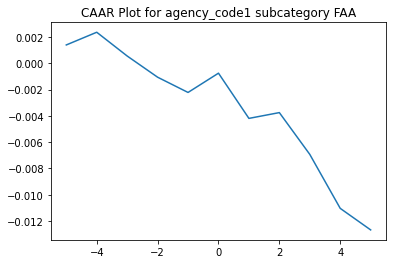

         ARR      CAAR        sd    t_stat   p_value
-5  0.001394  0.001394  0.012526  1.223807  0.223422
-4  0.000966  0.002360  0.017283  1.501862  0.135760
-3 -0.001806  0.000553  0.021244  0.286464  0.775017
-2 -0.001612 -0.001058  0.023840 -0.488317  0.626216
-1 -0.001160 -0.002218  0.026330 -0.926595  0.355997
 0  0.001465 -0.000752  0.028263 -0.292862  0.770134
 1 -0.003438 -0.004190  0.035418 -1.301407  0.195612
 2  0.000440 -0.003751  0.037625 -1.096522  0.275046
 3 -0.003177 -0.006928  0.048648 -1.566432  0.119881
 4 -0.004104 -0.011031  0.061593 -1.970111  0.051129
 5 -0.001639 -0.012670  0.056207 -2.479667  0.014538
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-08 00:00:00
For ticker None we have 200 NaN values  

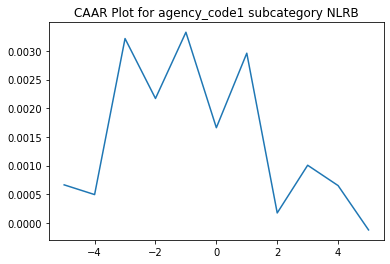

         ARR      CAAR        sd    t_stat   p_value
-5  0.000664  0.000664  0.012180  0.490785  0.624922
-4 -0.000170  0.000495  0.016010  0.278009  0.781723
-3  0.002721  0.003215  0.019731  1.466601  0.146405
-2 -0.001045  0.002170  0.023422  0.833996  0.406766
-1  0.001155  0.003325  0.028274  1.058487  0.293019
 0 -0.001665  0.001661  0.037589  0.397583  0.691996
 1  0.001299  0.002960  0.041335  0.644453  0.521125
 2 -0.002785  0.000175  0.052787  0.029753  0.976338
 3  0.000832  0.001006  0.054140  0.167281  0.867571
 4 -0.000355  0.000651  0.062440  0.093903  0.925421
 5 -0.000773 -0.000121  0.087205 -0.012536  0.990029
For ticker None we have 97 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 83 NaN values     in the window
Something is wrong with TFC in 2018-06-28 00:00:00
CAR FOR Different Agency Groups GROUP EEOC
We found AR for 72 events
AR.shape[1] is 72


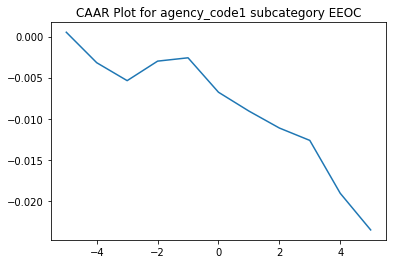

         ARR      CAAR        sd    t_stat   p_value
-5  0.000534  0.000534  0.014566  0.311189  0.756569
-4 -0.003714 -0.003180  0.020323 -1.327806  0.188496
-3 -0.002184 -0.005364  0.024451 -1.861557  0.066805
-2  0.002378 -0.002987  0.029143 -0.869619  0.387439
-1  0.000406 -0.002581  0.032354 -0.676917  0.500658
 0 -0.004197 -0.006778  0.034333 -1.675063  0.098321
 1 -0.002295 -0.009073  0.042515 -1.810801  0.074402
 2 -0.002066 -0.011139  0.057234 -1.651484  0.103056
 3 -0.001509 -0.012648  0.061552 -1.743652  0.085548
 4 -0.006443 -0.019091  0.083804 -1.933030  0.057221
 5 -0.004467 -0.023559  0.114547 -1.745149  0.085286
For ticker None we have 113 NaN values     in the window
Something is wrong with DD in 2019-09-27 00:00:00
CAR FOR Different Agency Groups GROUP OFCCP
We found AR for 56 events
AR.shape[1] is 56


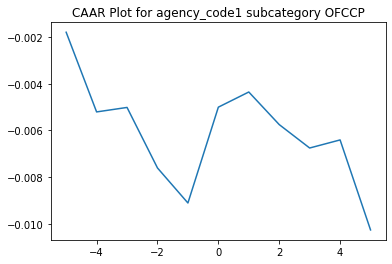

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001801 -0.001801  0.014364 -0.938221  0.352233
-4 -0.003407 -0.005208  0.018465 -2.110528  0.039375
-3  0.000192 -0.005016  0.019641 -1.911178  0.061199
-2 -0.002588 -0.007604  0.023682 -2.402717  0.019675
-1 -0.001498 -0.009102  0.025131 -2.710368  0.008946
 0  0.004098 -0.005004  0.026504 -1.413003  0.163289
 1  0.000648 -0.004356  0.036140 -0.901983  0.370999
 2 -0.001393 -0.005749  0.040195 -1.070406  0.289112
 3 -0.001001 -0.006751  0.044682 -1.130626  0.263119
 4  0.000346 -0.006405  0.043028 -1.113978  0.270133
 5 -0.003848 -0.010253  0.042139 -1.820818  0.074076
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
CAR FOR Different Agency Groups GROUP USAO
We found AR for 52 events
AR.shape[1] is 52


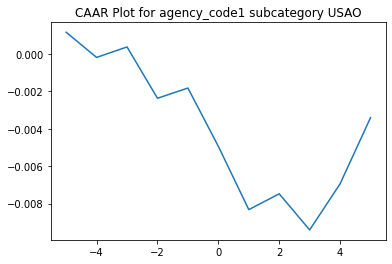

         ARR      CAAR        sd    t_stat   p_value
-5  0.001154  0.001154  0.012805  0.649724  0.518786
-4 -0.001345 -0.000191  0.022090 -0.062339  0.950537
-3  0.000560  0.000369  0.024344  0.109187  0.913482
-2 -0.002741 -0.002373  0.030208 -0.566418  0.573594
-1  0.000547 -0.001826  0.035958 -0.366198  0.715732
 0 -0.003115 -0.004941  0.038782 -0.918818  0.362516
 1 -0.003379 -0.008320  0.051254 -1.170616  0.247194
 2  0.000842 -0.007478  0.057185 -0.943033  0.350110
 3 -0.001927 -0.009406  0.079184 -0.856546  0.395702
 4  0.002463 -0.006943  0.073333 -0.682737  0.497863
 5  0.003535 -0.003408  0.073208 -0.335726  0.738455
For ticker None we have 48 NaN values     in the window
Something is wrong with GL in 2019-01-09 00:00:00
CAR FOR Different Agency Groups GROUP FIN
We found AR for 34 events
AR.shape[1] is 34


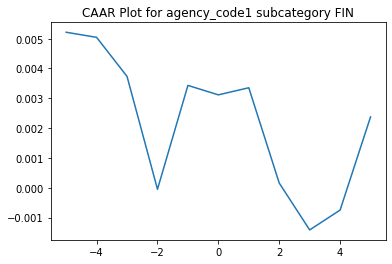

         ARR      CAAR        sd    t_stat   p_value
-5  0.005215  0.005215  0.017273  1.760562  0.087579
-4 -0.000172  0.005044  0.021002  1.400298  0.170756
-3 -0.001310  0.003734  0.022162  0.982411  0.333045
-2 -0.003786 -0.000052  0.023929 -0.012694  0.989948
-1  0.003484  0.003432  0.026811  0.746332  0.460751
 0 -0.000317  0.003115  0.032545  0.558076  0.580559
 1  0.000238  0.003353  0.041951  0.466077  0.644222
 2 -0.003196  0.000157  0.042837  0.021347  0.983097
 3 -0.001573 -0.001416  0.046604 -0.177152  0.860472
 4  0.000665 -0.000751  0.049061 -0.089242  0.929429
 5  0.003125  0.002375  0.049800  0.278034  0.782721
CAR FOR Different Agency Groups GROUP EBSA
We found AR for 30 events
AR.shape[1] is 30


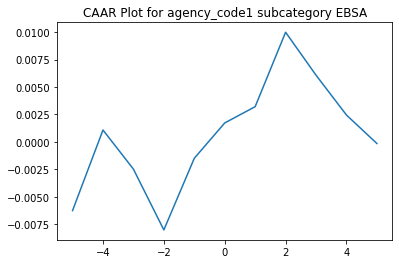

         ARR      CAAR        sd    t_stat   p_value
-5 -0.006252 -0.006252  0.015018 -2.280216  0.030130
-4  0.007341  0.001088  0.018370  0.324554  0.747848
-3 -0.003563 -0.002475  0.025737 -0.526710  0.602401
-2 -0.005535 -0.008010  0.034280 -1.279907  0.210722
-1  0.006523 -0.001487  0.032666 -0.249402  0.804808
 0  0.003217  0.001729  0.030235  0.313256  0.756328
 1  0.001483  0.003212  0.029081  0.604990  0.549891
 2  0.006777  0.009989  0.037213  1.470246  0.152262
 3 -0.003911  0.006078  0.041631  0.799681  0.430398
 4 -0.003628  0.002450  0.040621  0.330320  0.743533
 5 -0.002591 -0.000141  0.043101 -0.017934  0.985814


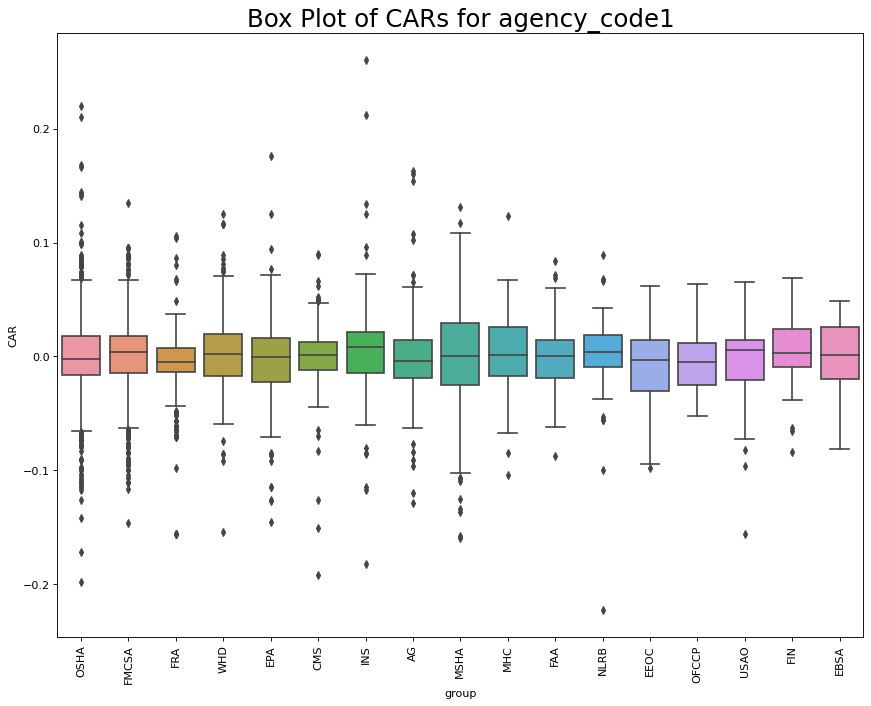

In [ ]:
a = CAAR_by_category(df, events, 'agency_code1',\
                     cat_name='Different Agency Groups', cat_members=agency_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

#Results [-1,1]

In [ ]:
es_win = 200
ev_win = [-1,1]
end_time = 1

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 24 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Offence Groups GROUP safety-related offenses
We found AR for 3813 events
AR.shape[1] is 3813


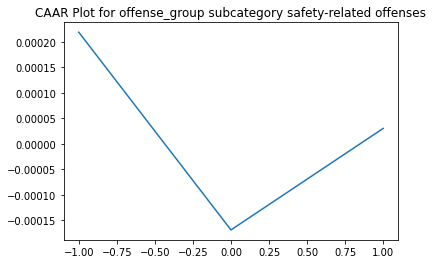

         ARR      CAAR        sd    t_stat   p_value
-1  0.000219  0.000219  0.013033  1.038241  0.299224
 0 -0.000388 -0.000169  0.019118 -0.545803  0.585233
 1  0.000199  0.000030  0.023942  0.078124  0.937734
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 138 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 101 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 117 NaN values     in the window
Something is wrong with DD in 2019-09-27 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-08 00:00:00
For ticker None we have 200 NaN v

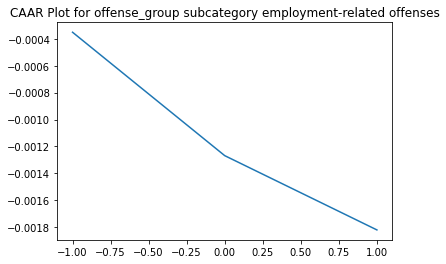

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000351 -0.000351  0.014149 -0.812772  0.416529
 0 -0.000917 -0.001268  0.020536 -2.023053  0.043315
 1 -0.000552 -0.001820  0.025871 -2.304845  0.021366
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-03-18 00:00:00
For ticker None we have 173 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 64 NaN values     in the window
Something is wrong with GL in 2019-01-28 00:00:00
For ticker None we have 70 NaN values     in the window
Something is wrong with GL in 2019-02-05 00:00:00
For ticker None we have 52 NaN values     in the window
Something is wrong with GL in 2019-01-09 00:00:00
CAR FOR Different Offence Groups GROUP consumer-protection-related offenses
We found AR for 591 events
AR.shape[1] is 591


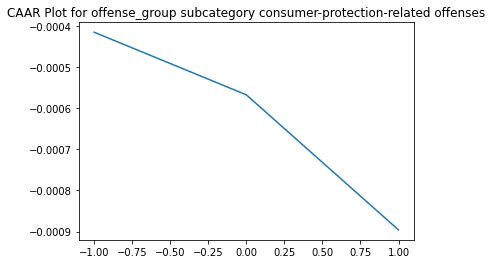

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000416 -0.000416  0.017528 -0.576317  0.564620
 0 -0.000152 -0.000568  0.023164 -0.595643  0.551642
 1 -0.000328 -0.000896  0.030416 -0.716041  0.474250
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with HWM in 2017-07-19 00:00:00
CAR FOR Different Offence Groups GROUP environment-related offenses
We found AR for 330 events
AR.shape[1] is 330


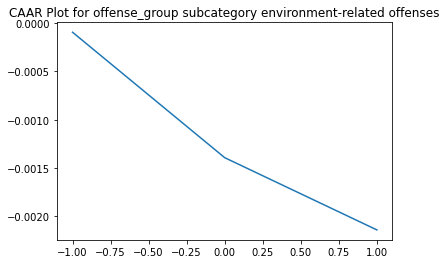

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000093 -0.000093  0.013346 -0.126986  0.899029
 0 -0.001300 -0.001393  0.019667 -1.287090  0.198968
 1 -0.000749 -0.002142  0.022910 -1.698450  0.090368
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
CAR FOR Different Offence Groups GROUP government-contracting-related offenses
We found AR for 68 events
AR.shape[1] is 68


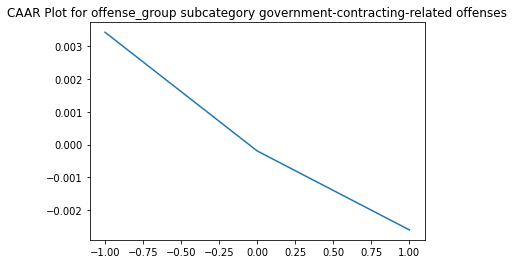

         ARR      CAAR        sd    t_stat   p_value
-1  0.003428  0.003428  0.020625  1.370532  0.175095
 0 -0.003622 -0.000194  0.025131 -0.063785  0.949332
 1 -0.002410 -0.002604  0.033106 -0.648694  0.518754
For ticker None we have 171 NaN values     in the window
Something is wrong with LHX in 2019-09-19 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2018-09-12 00:00:00
CAR FOR Different Offence Groups GROUP competition-related offenses
We found AR for 57 events
AR.shape[1] is 57


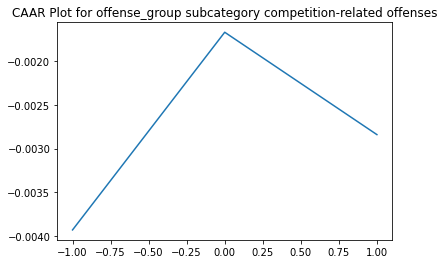

         ARR      CAAR        sd    t_stat   p_value
-1 -0.003932 -0.003932  0.018808 -1.578299  0.120130
 0  0.002263 -0.001669  0.028294 -0.445261  0.657848
 1 -0.001172 -0.002841  0.034077 -0.629360  0.531673
CAR FOR Different Offence Groups GROUP healthcare-related offenses
We found AR for 49 events
AR.shape[1] is 49


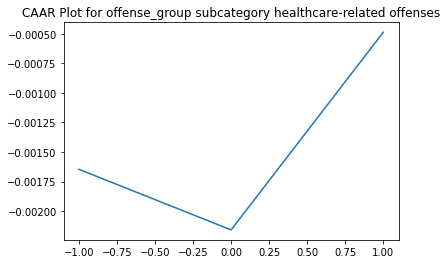

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001646 -0.001646  0.011128 -1.035678  0.305542
 0 -0.000513 -0.002160  0.016202 -0.933203  0.355386
 1  0.001674 -0.000485  0.021397 -0.158825  0.874473


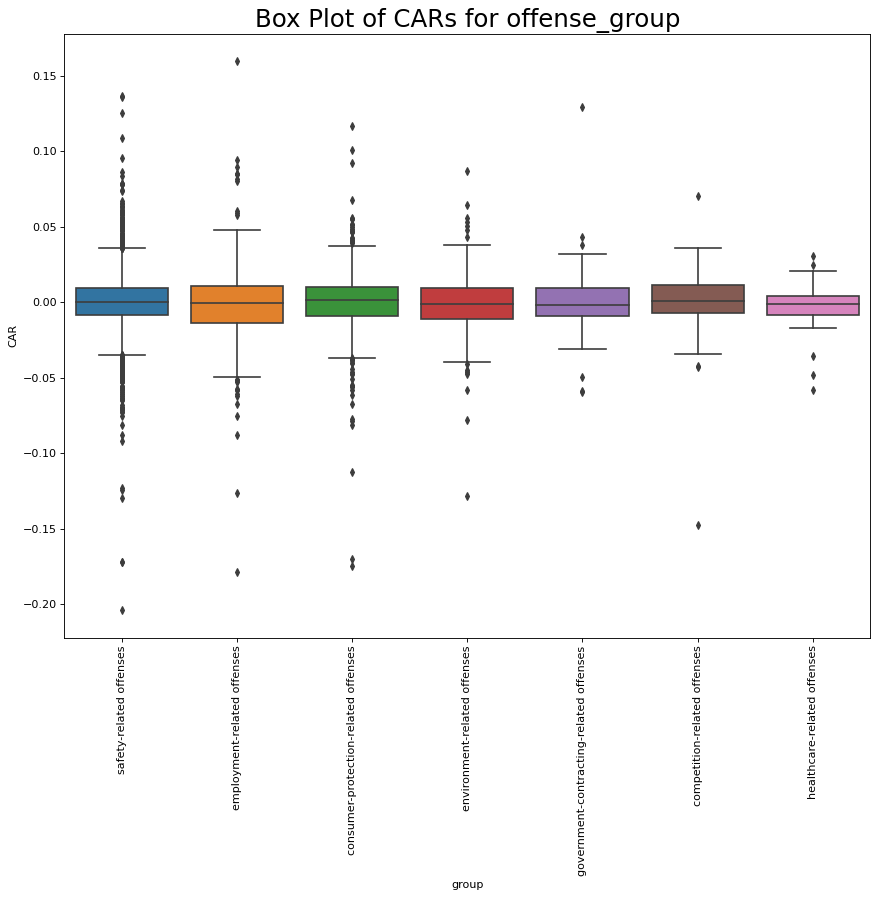

In [ ]:
a = CAAR_by_category(df, events, 'offense_group',\
                     cat_name='Different Offence Groups', cat_members=off_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different Groups of Industries GROUP retailing
We found AR for 983 events
AR.shape[1] is 983


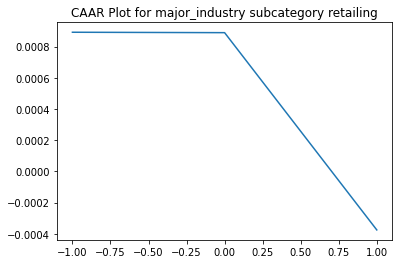

         ARR      CAAR        sd    t_stat   p_value
-1  0.000892  0.000892  0.014568  1.920188  0.055124
 0 -0.000003  0.000890  0.023031  1.210964  0.226200
 1 -0.001265 -0.000376  0.029378 -0.400825  0.688636
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-03-18 00:00:00
For ticker None we have 173 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 64 NaN values     in the window
Something is wrong with GL in 2019-01-28 00:00:00
For ticker None we have 70 NaN values     in the window
Something is wrong with GL in 2019-02-05 00:00:00
For ticker None we have 52 NaN values     in the window
Something is wrong with GL in 2019-01-09 00:00:00
For ticker None we have 87 NaN values     in the window
Something is wrong with TFC in 2018-06-28 00:00:00
CAR FOR Different Groups of Industries G

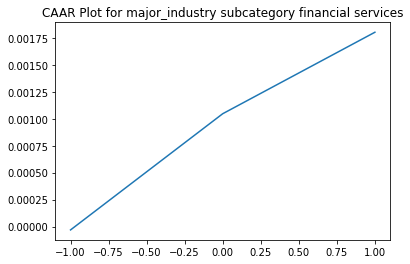

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000031 -0.000031  0.014007 -0.065189  0.948039
 0  0.001078  0.001046  0.018122  1.681577  0.093019
 1  0.000756  0.001802  0.022575  2.324605  0.020329
CAR FOR Different Groups of Industries GROUP railroads
We found AR for 508 events
AR.shape[1] is 508


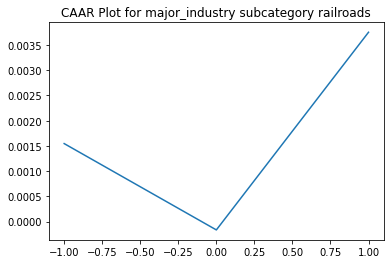

         ARR      CAAR        sd    t_stat       p_value
-1  0.001546  0.001546  0.005875  5.931792  5.552305e-09
 0 -0.001710 -0.000164  0.007301 -0.506045  6.130448e-01
 1  0.003915  0.003751  0.013348  6.334582  5.254736e-10
CAR FOR Different Groups of Industries GROUP oil and gas
We found AR for 346 events
AR.shape[1] is 346


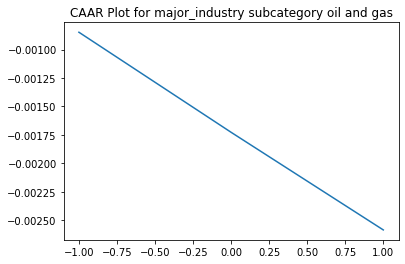

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000847 -0.000847  0.012171 -1.294099  0.196497
 0 -0.000881 -0.001727  0.019595 -1.639803  0.101958
 1 -0.000859 -0.002587  0.027741 -1.734477  0.083727
CAR FOR Different Groups of Industries GROUP healthcare services
We found AR for 282 events
AR.shape[1] is 282


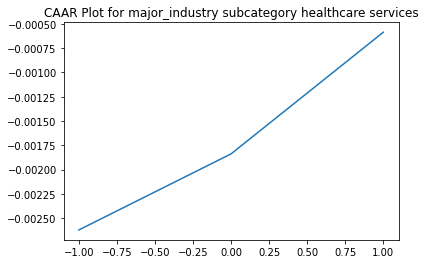

         ARR      CAAR        sd    t_stat   p_value
-1 -0.002623 -0.002623  0.017295 -2.546353  0.011419
 0  0.000784 -0.001839  0.021272 -1.451567  0.147738
 1  0.001254 -0.000585  0.025003 -0.393009  0.694611
CAR FOR Different Groups of Industries GROUP pipelines
We found AR for 249 events
AR.shape[1] is 249


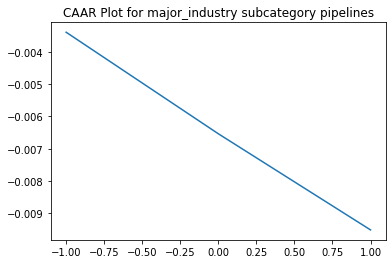

         ARR      CAAR        sd    t_stat       p_value
-1 -0.003399 -0.003399  0.011320 -4.738247  3.633206e-06
 0 -0.003139 -0.006538  0.017261 -5.976846  7.871752e-09
 1 -0.002972 -0.009510  0.020773 -7.223963  6.193775e-12
CAR FOR Different Groups of Industries GROUP pharmaceuticals
We found AR for 244 events
AR.shape[1] is 244


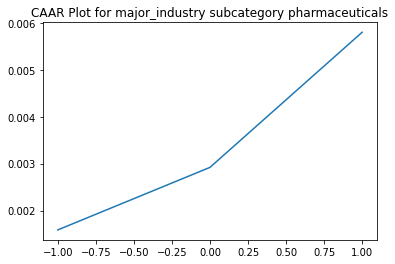

         ARR      CAAR        sd    t_stat   p_value
-1  0.001587  0.001587  0.011887  2.085970  0.038025
 0  0.001333  0.002920  0.017404  2.620863  0.009324
 1  0.002880  0.005800  0.019582  4.626483  0.000006
CAR FOR Different Groups of Industries GROUP telecommunications
We found AR for 228 events
AR.shape[1] is 228


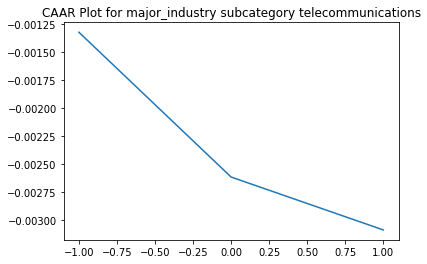

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001323 -0.001323  0.014586 -1.369234  0.172279
 0 -0.001294 -0.002616  0.017306 -2.282925  0.023360
 1 -0.000473 -0.003089  0.019683 -2.369735  0.018638
CAR FOR Different Groups of Industries GROUP diversified
We found AR for 508 events
AR.shape[1] is 508


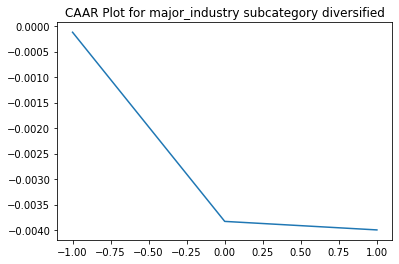

         ARR      CAAR        sd    t_stat       p_value
-1 -0.000120 -0.000120  0.011989 -0.225182  8.219282e-01
 0 -0.003711 -0.003830  0.017367 -4.971126  9.122193e-07
 1 -0.000167 -0.003998  0.020894 -4.312220  1.942962e-05
CAR FOR Different Groups of Industries GROUP utilities and power generation
We found AR for 180 events
AR.shape[1] is 180


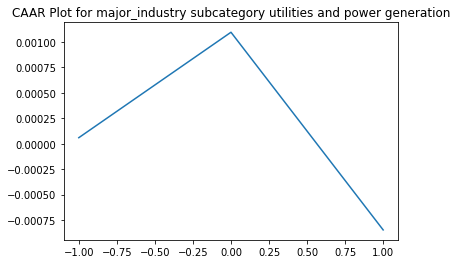

         ARR      CAAR        sd    t_stat   p_value
-1  0.000059  0.000059  0.009723  0.080921  0.935596
 0  0.001035  0.001094  0.013526  1.084872  0.279437
 1 -0.001940 -0.000847  0.021854 -0.519739  0.603887
CAR FOR Different Groups of Industries GROUP miscellaneous manufacturing
We found AR for 160 events
AR.shape[1] is 160


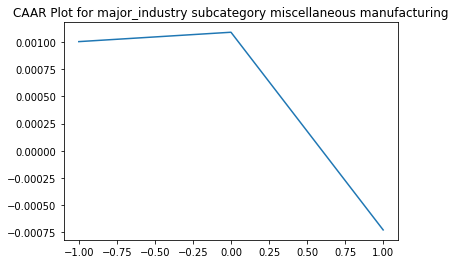

         ARR      CAAR        sd    t_stat   p_value
-1  0.001004  0.001004  0.011126  1.141563  0.255352
 0  0.000086  0.001090  0.017405  0.792501  0.429250
 1 -0.001820 -0.000730  0.022095 -0.417638  0.676775
CAR FOR Different Groups of Industries GROUP airlines
We found AR for 143 events
AR.shape[1] is 143


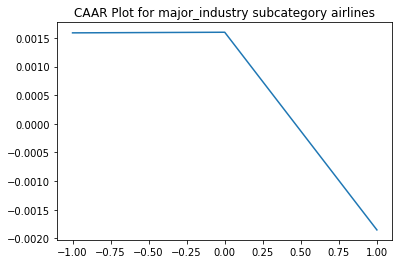

         ARR      CAAR        sd    t_stat   p_value
-1  0.001590  0.001590  0.016457  1.155324  0.249898
 0  0.000011  0.001601  0.026312  0.727481  0.468129
 1 -0.003454 -0.001854  0.030367 -0.729937  0.466631
CAR FOR Different Groups of Industries GROUP food products
We found AR for 139 events
AR.shape[1] is 139


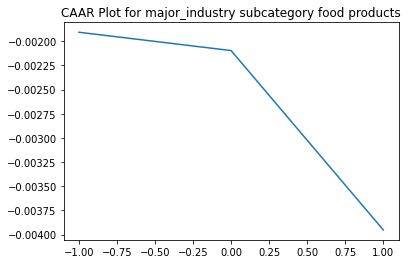

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001908 -0.001908  0.014692 -1.530932  0.128075
 0 -0.000189 -0.002097  0.022515 -1.098192  0.274033
 1 -0.001854 -0.003951  0.027951 -1.666699  0.097842
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 138 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 101 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
For ticker None we have 171 NaN values     in the window
Something is wrong with LHX in 2019-09-19 00:00:00
For ticker None we have 200 NaN 

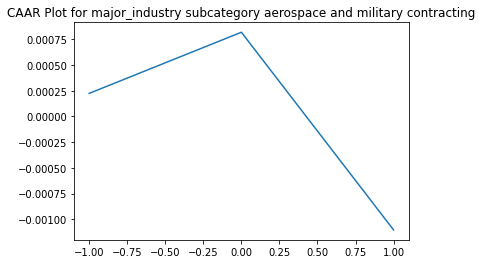

         ARR      CAAR        sd    t_stat   p_value
-1  0.000225  0.000225  0.014693  0.144404  0.885511
 0  0.000594  0.000819  0.018169  0.425352  0.671618
 1 -0.001922 -0.001103  0.028256 -0.368315  0.713523
CAR FOR Different Groups of Industries GROUP freight and logistics
We found AR for 121 events
AR.shape[1] is 121


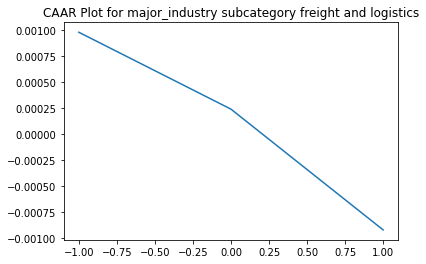

         ARR      CAAR        sd    t_stat   p_value
-1  0.000980  0.000980  0.017429  0.618425  0.537467
 0 -0.000741  0.000239  0.020399  0.129026  0.897553
 1 -0.001163 -0.000924  0.025080 -0.405154  0.686086
CAR FOR Different Groups of Industries GROUP paper and packaging
We found AR for 109 events
AR.shape[1] is 109


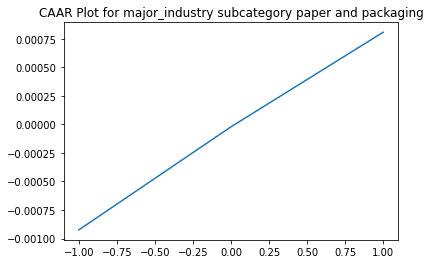

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000925 -0.000925  0.012896 -0.748517  0.455776
 0  0.000904 -0.000021  0.018249 -0.011817  0.990593
 1  0.000829  0.000809  0.025366  0.332848  0.739894
CAR FOR Different Groups of Industries GROUP wholesalers
We found AR for 84 events
AR.shape[1] is 84


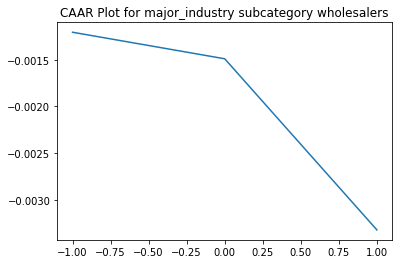

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001205 -0.001205  0.012803 -0.862436  0.390933
 0 -0.000284 -0.001489  0.018170 -0.751152  0.454685
 1 -0.001834 -0.003323  0.021595 -1.410480  0.162135
CAR FOR Different Groups of Industries GROUP mining and minerals
We found AR for 83 events
AR.shape[1] is 83


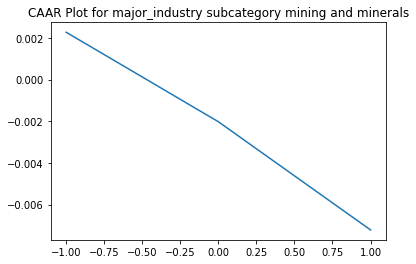

         ARR      CAAR        sd    t_stat   p_value
-1  0.002269  0.002269  0.020141  1.026244  0.307794
 0 -0.004294 -0.002025  0.039905 -0.462412  0.645011
 1 -0.005192 -0.007218  0.047547 -1.383023  0.170412
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 117 NaN values     in the window
Something is wrong with DD in 2019-09-27 00:00:00
CAR FOR Different Groups of Industries GROUP chemicals
We found AR for 62 events
AR.shape[1] is 62


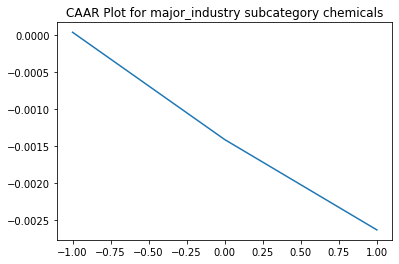

         ARR      CAAR        sd    t_stat   p_value
-1  0.000043  0.000043  0.019151  0.017680  0.985952
 0 -0.001452 -0.001409  0.026734 -0.414910  0.679664
 1 -0.001222 -0.002631  0.031364 -0.660458  0.511446
CAR FOR Different Groups of Industries GROUP construction and engineering
We found AR for 55 events
AR.shape[1] is 55


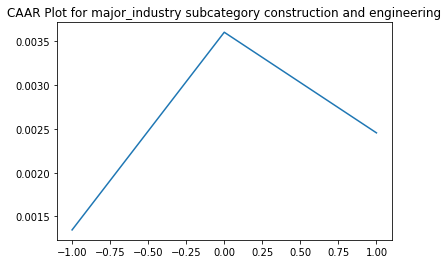

         ARR      CAAR        sd    t_stat   p_value
-1  0.001346  0.001346  0.014133  0.706388  0.482984
 0  0.002258  0.003604  0.023838  1.121190  0.267168
 1 -0.001149  0.002455  0.026725  0.681217  0.498645
CAR FOR Different Groups of Industries GROUP building materials
We found AR for 54 events
AR.shape[1] is 54


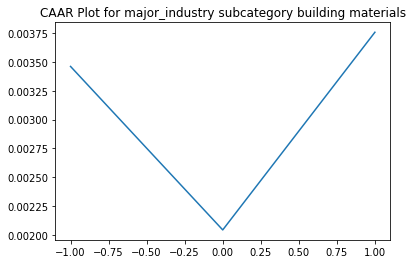

         ARR      CAAR        sd    t_stat   p_value
-1  0.003461  0.003461  0.017141  1.483614  0.143834
 0 -0.001416  0.002045  0.020827  0.721441  0.473809
 1  0.001712  0.003757  0.024633  1.120687  0.267474
CAR FOR Different Groups of Industries GROUP waste management and environmental services
We found AR for 50 events
AR.shape[1] is 50


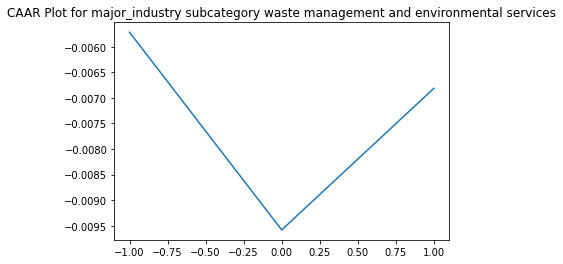

         ARR      CAAR        sd    t_stat   p_value
-1 -0.005718 -0.005718  0.029305 -1.379686  0.173947
 0 -0.003863 -0.009581  0.035711 -1.897202  0.063703
 1  0.002768 -0.006814  0.035335 -1.363516  0.178952
CAR FOR Different Groups of Industries GROUP motor vehicles
We found AR for 48 events
AR.shape[1] is 48


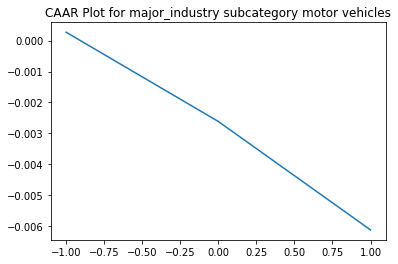

         ARR      CAAR        sd    t_stat   p_value
-1  0.000271  0.000271  0.012058  0.155895  0.876784
 0 -0.002888 -0.002617  0.020950 -0.865472  0.391176
 1 -0.003509 -0.006126  0.025486 -1.665447  0.102476
CAR FOR Different Groups of Industries GROUP industrial equipment
We found AR for 43 events
AR.shape[1] is 43


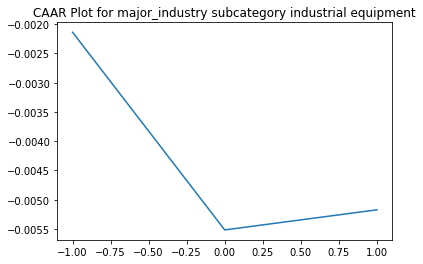

         ARR      CAAR        sd    t_stat   p_value
-1 -0.002137 -0.002137  0.011307 -1.239431  0.222067
 0 -0.003379 -0.005516  0.018762 -1.927794  0.060661
 1  0.000343 -0.005172  0.017433 -1.945491  0.058429
CAR FOR Different Groups of Industries GROUP metals
We found AR for 34 events
AR.shape[1] is 34


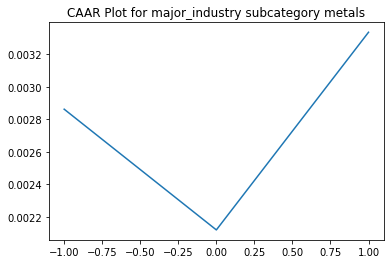

         ARR      CAAR        sd    t_stat   p_value
-1  0.002862  0.002862  0.016107  1.036137  0.307672
 0 -0.000741  0.002121  0.019749  0.626178  0.535506
 1  0.001214  0.003335  0.023723  0.819645  0.418299
CAR FOR Different Groups of Industries GROUP information technology
We found AR for 34 events
AR.shape[1] is 34


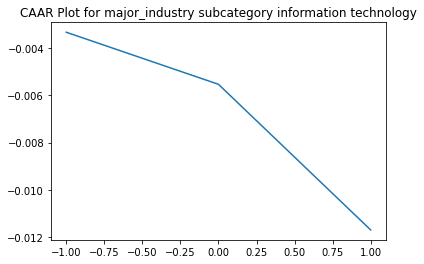

         ARR      CAAR        sd    t_stat   p_value
-1 -0.003339 -0.003339  0.015247 -1.276882  0.210556
 0 -0.002200 -0.005539  0.035248 -0.916264  0.366176
 1 -0.006151 -0.011690  0.046519 -1.465323  0.152297
CAR FOR Different Groups of Industries GROUP housewares and home furnishings
We found AR for 30 events
AR.shape[1] is 30


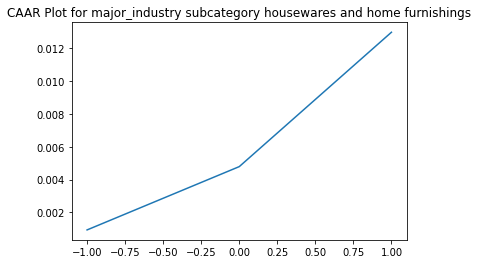

         ARR      CAAR        sd    t_stat   p_value
-1  0.000928  0.000928  0.011306  0.449421  0.656469
 0  0.003858  0.004786  0.016145  1.623615  0.115280
 1  0.008190  0.012976  0.038096  1.865629  0.072239


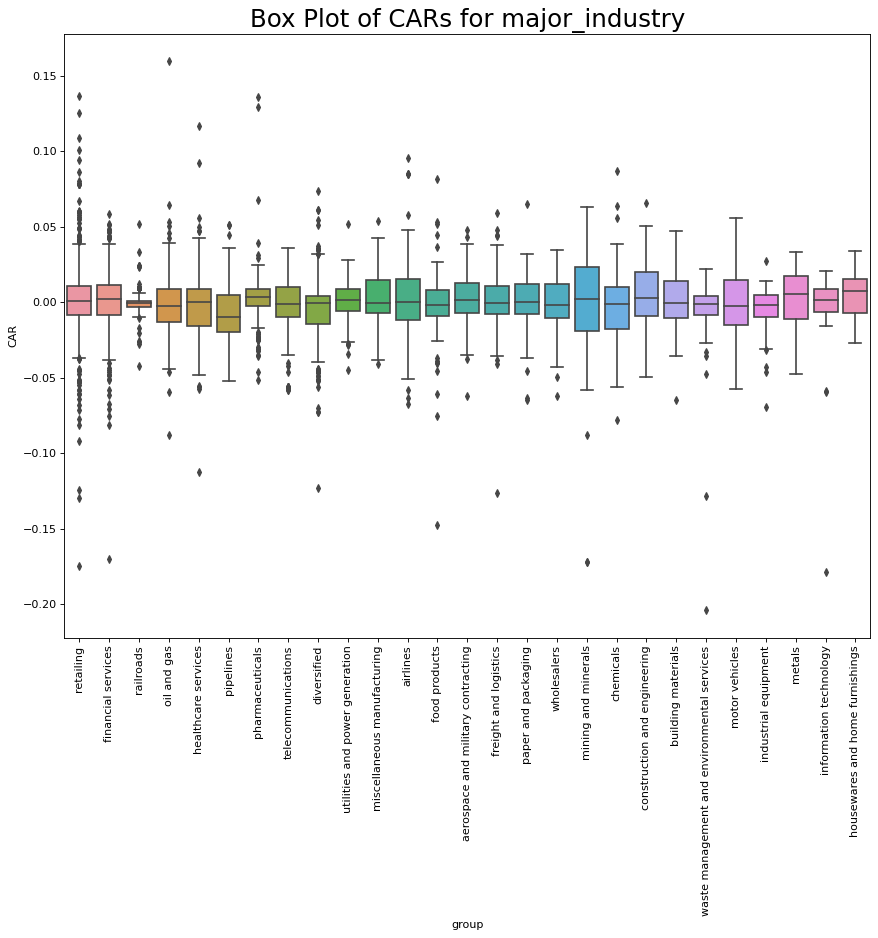

In [ ]:
b = CAAR_by_category(df, events, 'major_industry',\
                     cat_name='Different Groups of Industries', cat_members=Major_industry_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

In [ ]:
'''
a = CAAR_by_category(df, events, 'govt_level',\
                     cat_name='Different Government levels Groups', cat_members=gov_level_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0
'''

"\na = CAAR_by_category(df, events, 'govt_level',                     cat_name='Different Government levels Groups', cat_members=gov_level_group,                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0\n"

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 24 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Primary Offence Groups GROUP workplace safety or health violation
We found AR for 1619 events
AR.shape[1] is 1619


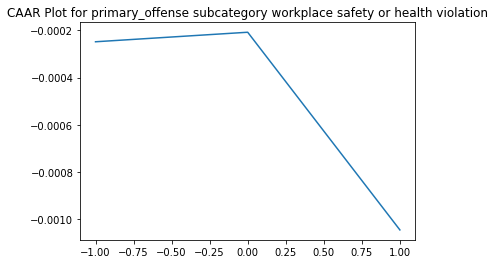

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000248 -0.000248  0.015233 -0.655602  0.512174
 0  0.000040 -0.000208  0.022759 -0.367533  0.713270
 1 -0.000837 -0.001045  0.027867 -1.508269  0.131681
CAR FOR Different Primary Offence Groups GROUP motor vehicle safety violation
We found AR for 1051 events
AR.shape[1] is 1051


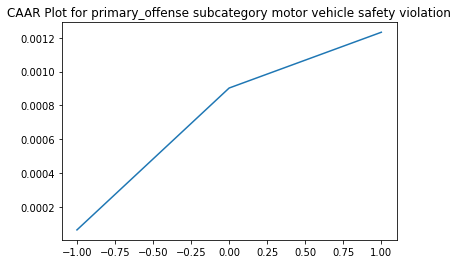

         ARR      CAAR        sd    t_stat   p_value
-1  0.000065  0.000065  0.013233  0.159410  0.873376
 0  0.000838  0.000903  0.019217  1.523337  0.127975
 1  0.000329  0.001232  0.023898  1.671848  0.094852
For ticker None we have 108 NaN values     in the window
Something is wrong with RTX in 2017-12-08 00:00:00
CAR FOR Different Primary Offence Groups GROUP wage and hour violation
We found AR for 751 events
AR.shape[1] is 751


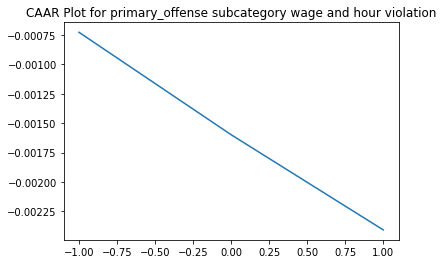

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000725 -0.000725  0.013408 -1.482711  0.138571
 0 -0.000872 -0.001598  0.018019 -2.429718  0.015344
 1 -0.000811 -0.002408  0.022468 -2.937395  0.003411
CAR FOR Different Primary Offence Groups GROUP railroad safety violation
We found AR for 830 events
AR.shape[1] is 830


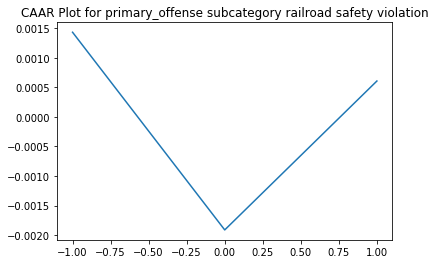

         ARR      CAAR        sd    t_stat       p_value
-1  0.001434  0.001434  0.007747  5.332433  1.250557e-07
 0 -0.003346 -0.001913  0.010685 -5.156585  3.147393e-07
 1  0.002521  0.000608  0.015245  1.149432  2.507093e-01
For ticker None we have 173 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 64 NaN values     in the window
Something is wrong with GL in 2019-01-28 00:00:00
For ticker None we have 70 NaN values     in the window
Something is wrong with GL in 2019-02-05 00:00:00
For ticker None we have 52 NaN values     in the window
Something is wrong with GL in 2019-01-09 00:00:00
CAR FOR Different Primary Offence Groups GROUP insurance violation
We found AR for 409 events
AR.shape[1] is 409


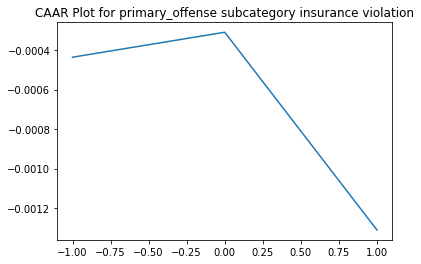

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000436 -0.000436  0.018555 -0.475283  0.634840
 0  0.000126 -0.000310  0.022956 -0.272785  0.785156
 1 -0.001001 -0.001311  0.029881 -0.887026  0.375588
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with HWM in 2017-07-19 00:00:00
CAR FOR Different Primary Offence Groups GROUP environmental violation
We found AR for 330 events
AR.shape[1] is 330


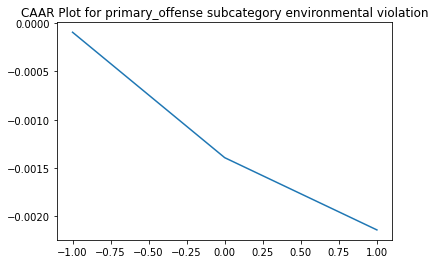

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000093 -0.000093  0.013346 -0.126986  0.899029
 0 -0.001300 -0.001393  0.019667 -1.287090  0.198968
 1 -0.000749 -0.002142  0.022910 -1.698450  0.090368
CAR FOR Different Primary Offence Groups GROUP nursing home violation
We found AR for 187 events
AR.shape[1] is 187


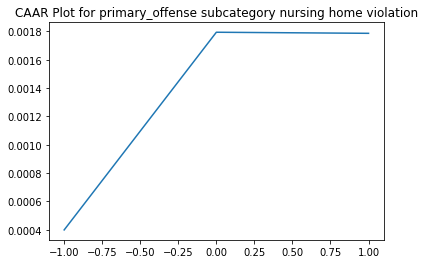

         ARR      CAAR        sd    t_stat   p_value
-1  0.000399  0.000399  0.010022  0.544644  0.586651
 0  0.001394  0.001793  0.012793  1.916991  0.056772
 1 -0.000008  0.001786  0.015476  1.578021  0.116260
For ticker None we have 138 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 101 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 117 NaN values     in the window
Something is wrong with DD in 2019-09-27 00:00:00
CAR FOR Different Primary Offence Groups GROUP employment discrimination
We found AR for 144 events
AR.shape[1] is 144


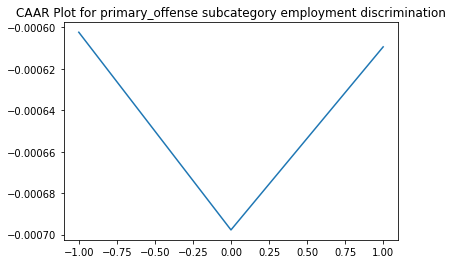

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000602 -0.000602  0.014896 -0.485228  0.628257
 0 -0.000095 -0.000698  0.022762 -0.367868  0.713515
 1  0.000088 -0.000609  0.032995 -0.221628  0.824920
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-03-18 00:00:00
CAR FOR Different Primary Offence Groups GROUP consumer protection violation
We found AR for 122 events
AR.shape[1] is 122


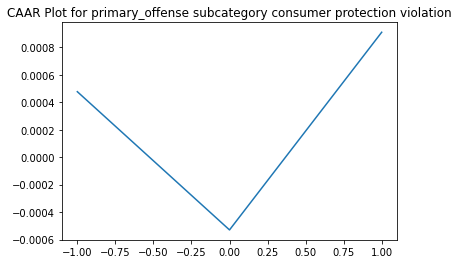

         ARR      CAAR        sd    t_stat   p_value
-1  0.000477  0.000477  0.014547  0.362330  0.717738
 0 -0.001007 -0.000530  0.024894 -0.235121  0.814512
 1  0.001440  0.000910  0.034328  0.292885  0.770112
CAR FOR Different Primary Offence Groups GROUP aviation safety violation
We found AR for 113 events
AR.shape[1] is 113


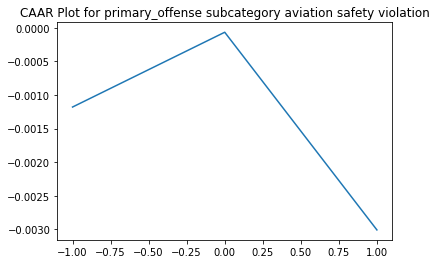

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001179 -0.001179  0.012060 -1.038791  0.301139
 0  0.001113 -0.000065  0.017643 -0.039322  0.968704
 1 -0.002943 -0.003008  0.025558 -1.250992  0.213544
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN 

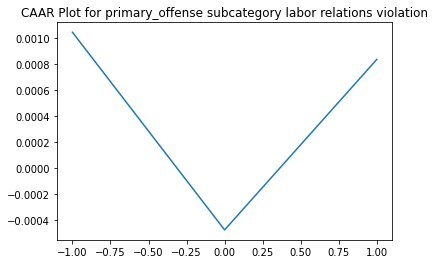

         ARR      CAAR        sd    t_stat   p_value
-1  0.001042  0.001042  0.016802  0.558062  0.578361
 0 -0.001521 -0.000479  0.024193 -0.178103  0.859093
 1  0.001311  0.000833  0.026222  0.285791  0.775777
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
CAR FOR Different Primary Offence Groups GROUP False Claims Act and related
We found AR for 67 events
AR.shape[1] is 67


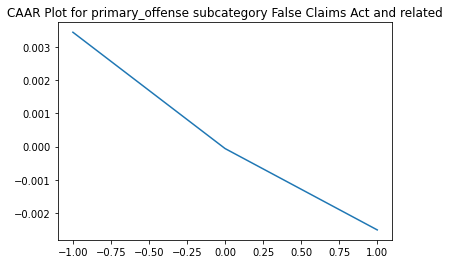

         ARR      CAAR        sd    t_stat   p_value
-1  0.003442  0.003442  0.020781  1.355933  0.179742
 0 -0.003501 -0.000059  0.025295 -0.019090  0.984827
 1 -0.002449 -0.002508  0.033347 -0.615644  0.540247
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 87 NaN values     in the window
Something is wrong with TFC in 2018-06-28 00:00:00
CAR FOR Different Primary Offence Groups GROUP benefit plan administrator violation
We found AR for 43 events
AR.shape[1] is 43


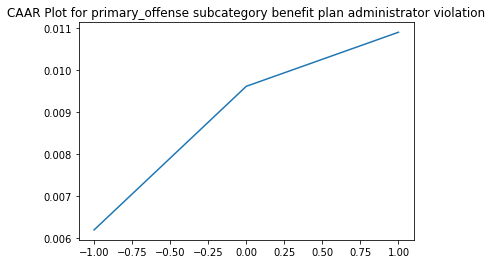

         ARR      CAAR        sd    t_stat   p_value
-1  0.006192  0.006192  0.019444  2.088285  0.042873
 0  0.003420  0.009612  0.026976  2.336517  0.024309
 1  0.001288  0.010900  0.025523  2.800388  0.007682
CAR FOR Different Primary Offence Groups GROUP Family and Medical Leave Act
We found AR for 31 events
AR.shape[1] is 31


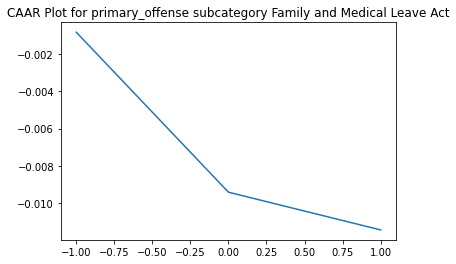

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000851 -0.000851  0.010937 -0.432965  0.668137
 0 -0.008553 -0.009404  0.037893 -1.381765  0.177248
 1 -0.002017 -0.011421  0.049319 -1.289288  0.207150


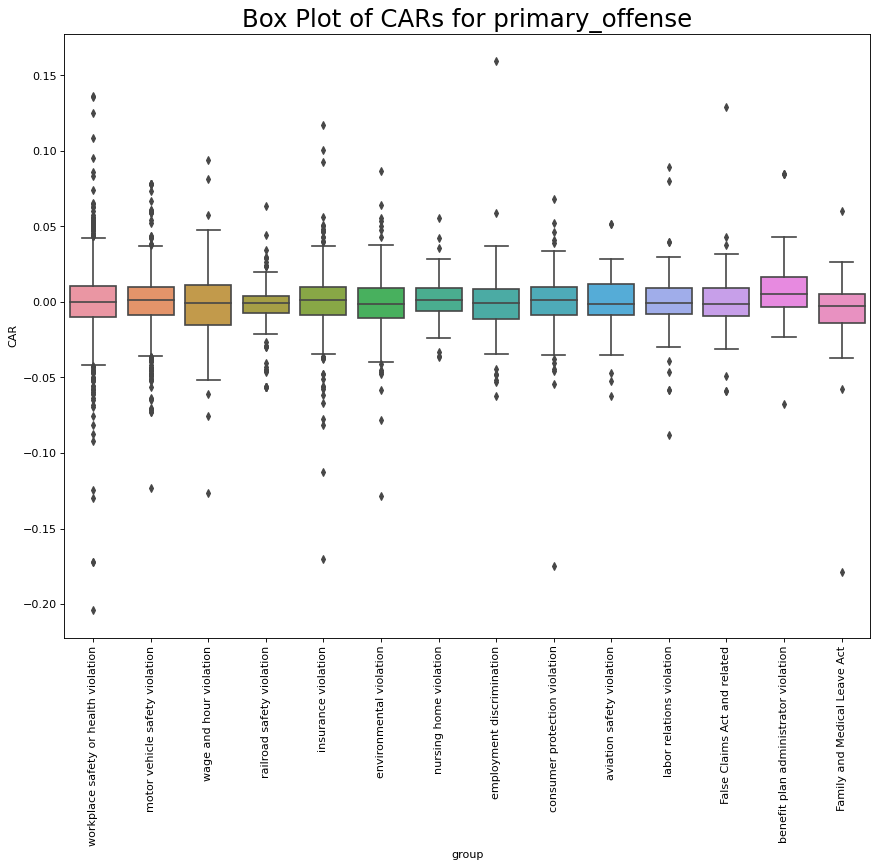

In [ ]:
a = CAAR_by_category(df, events, 'primary_offense',\
                     cat_name='Different Primary Offence Groups', cat_members=primary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
CAR FOR Different Secondary Offence Groups GROUP Fair Labor Standards Act
We found AR for 619 events
AR.shape[1] is 619


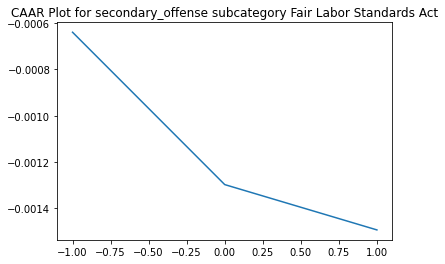

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000639 -0.000639  0.012109 -1.312411  0.189869
 0 -0.000659 -0.001298  0.017595 -1.835576  0.066901
 1 -0.000196 -0.001494  0.021763 -1.708357  0.088072
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2018-09-12 00:00:00
CAR FOR Different Secondary Offence Groups GROUP overtime violation
We found AR for 391 events
AR.shape[1] is 391


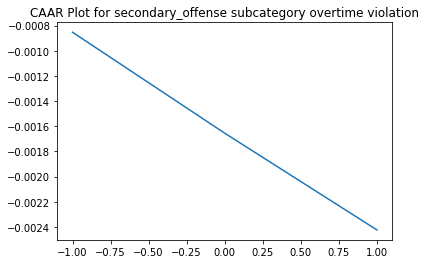

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000853 -0.000853  0.011663 -1.446170  0.148933
 0 -0.000802 -0.001655  0.016709 -1.959063  0.050818
 1 -0.000769 -0.002424  0.020476 -2.341161  0.019727
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
CAR FOR Different Secondary Offence Groups GROUP mining violation
We found AR for 313 events
AR.shape[1] is 313


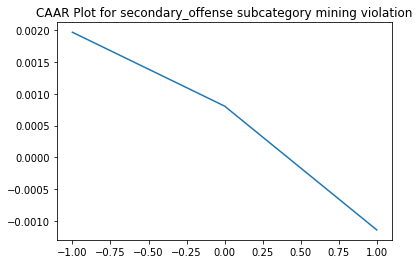

         ARR      CAAR        sd    t_stat   p_value
-1  0.001971  0.001971  0.016009  2.177598  0.030185
 0 -0.001163  0.000808  0.026545  0.538399  0.590685
 1 -0.001950 -0.001142  0.032735 -0.617100  0.537619
CAR FOR Different Secondary Offence Groups GROUP misclassification
We found AR for 149 events
AR.shape[1] is 149


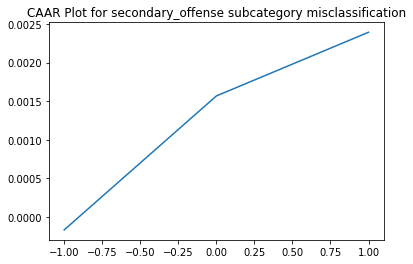

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000170 -0.000170  0.011854 -0.174998  0.861320
 0  0.001738  0.001568  0.017844  1.072461  0.285259
 1  0.000827  0.002394  0.020979  1.393162  0.165660
CAR FOR Different Secondary Offence Groups GROUP other pay violation
We found AR for 146 events
AR.shape[1] is 146


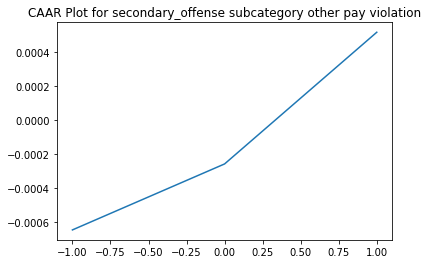

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000645 -0.000645  0.011425 -0.681814  0.496444
 0  0.000388 -0.000257  0.015408 -0.201448  0.840631
 1  0.000774  0.000517  0.018349  0.340455  0.734007
CAR FOR Different Secondary Offence Groups GROUP meal/rest break violation
We found AR for 97 events
AR.shape[1] is 97


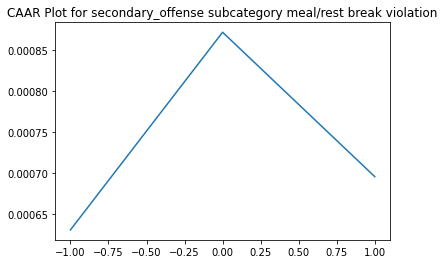

         ARR      CAAR        sd    t_stat   p_value
-1  0.000631  0.000631  0.012702  0.489378  0.625691
 0  0.000241  0.000872  0.019294  0.445171  0.657198
 1 -0.000176  0.000696  0.022349  0.306746  0.759701
CAR FOR Different Secondary Offence Groups GROUP off-the-clock work
We found AR for 91 events
AR.shape[1] is 91


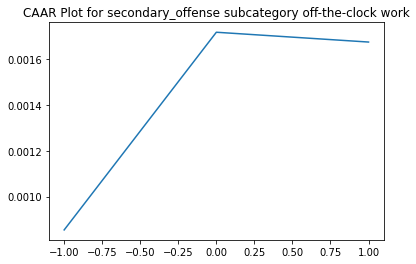

         ARR      CAAR        sd    t_stat   p_value
-1  0.000854  0.000854  0.015446  0.527402  0.599213
 0  0.000865  0.001719  0.016895  0.970772  0.334264
 1 -0.000043  0.001676  0.019803  0.807548  0.421480
For ticker None we have 108 NaN values     in the window
Something is wrong with RTX in 2017-12-08 00:00:00
CAR FOR Different Secondary Offence Groups GROUP Service Contract Act
We found AR for 59 events
AR.shape[1] is 59


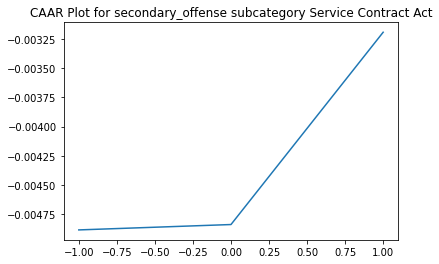

         ARR      CAAR        sd    t_stat   p_value
-1 -0.004885 -0.004885  0.015134 -2.479269  0.016093
 0  0.000046 -0.004839  0.020725 -1.793438  0.078117
 1  0.001647 -0.003192  0.020232 -1.211756  0.230519
CAR FOR Different Secondary Offence Groups GROUP racial discrimination
We found AR for 57 events
AR.shape[1] is 57


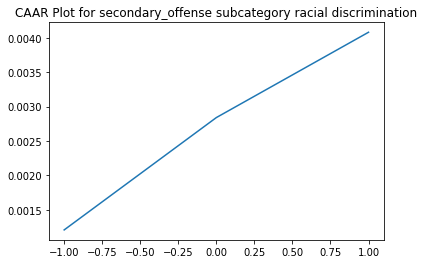

         ARR      CAAR        sd    t_stat   p_value
-1  0.001208  0.001208  0.013387  0.681422  0.498413
 0  0.001633  0.002841  0.017390  1.233437  0.222565
 1  0.001240  0.004081  0.021602  1.426401  0.159304
CAR FOR Different Secondary Offence Groups GROUP child labor or youth employment violation
We found AR for 53 events
AR.shape[1] is 53


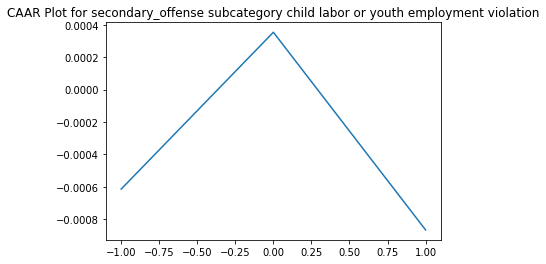

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000614 -0.000614  0.011490 -0.388750  0.699048
 0  0.000968  0.000354  0.020232  0.127419  0.899100
 1 -0.001220 -0.000866  0.023754 -0.265294  0.791832
CAR FOR Different Secondary Offence Groups GROUP Davis-Bacon Act and related
We found AR for 42 events
AR.shape[1] is 42


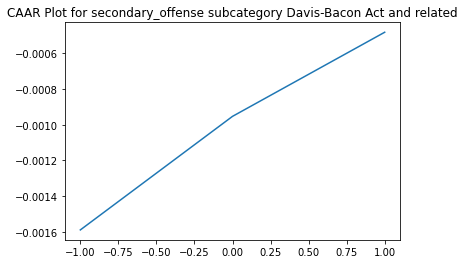

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001590 -0.001590  0.013215 -0.779672  0.440061
 0  0.000636 -0.000953  0.017473 -0.353623  0.725433
 1  0.000471 -0.000482  0.017137 -0.182300  0.856245
CAR FOR Different Secondary Offence Groups GROUP antiboycott violation
We found AR for 31 events
AR.shape[1] is 31


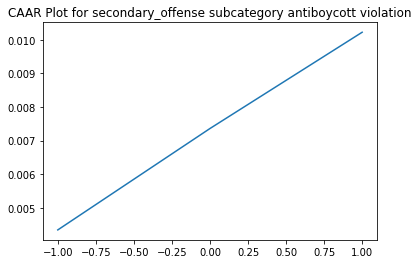

         ARR      CAAR        sd    t_stat   p_value
-1  0.004344  0.004344  0.014145  1.709919  0.097606
 0  0.003016  0.007360  0.017159  2.388199  0.023428
 1  0.002863  0.010223  0.020385  2.792109  0.009026


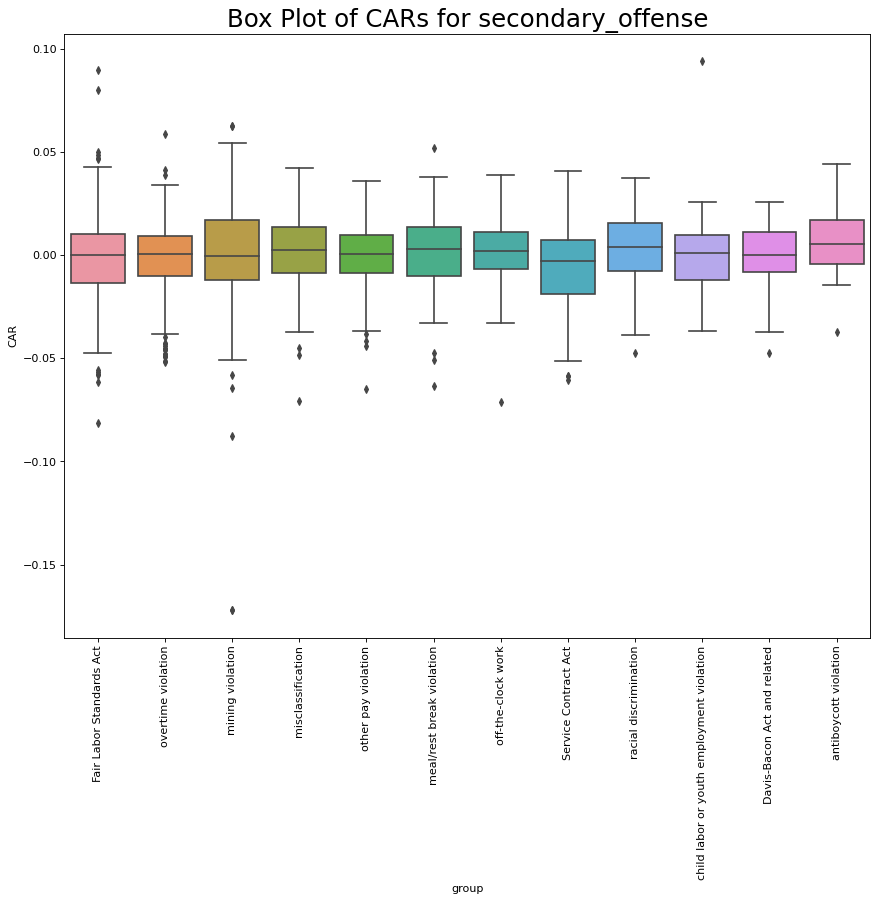

In [ ]:
a = CAAR_by_category(df, events, 'secondary_offense',\
                     cat_name='Different Secondary Offence Groups', cat_members=secondary_offence_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-12-05 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-03-18 00:00:00
For ticker None we have 138 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 24 NaN values     in the window
Something is wrong with RTX in 2017-08-10 00:00:00
CAR FOR Different Agency Groups GROUP OSHA
We found AR for 1435 events
AR.shape[1] is 1435


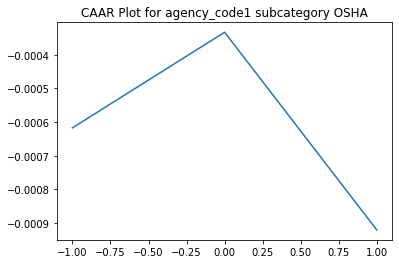

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000617 -0.000617  0.014977 -1.560661  0.118824
 0  0.000284 -0.000333  0.021561 -0.584820  0.558761
 1 -0.000587 -0.000920  0.026393 -1.320893  0.186748
CAR FOR Different Agency Groups GROUP FMCSA
We found AR for 1072 events
AR.shape[1] is 1072


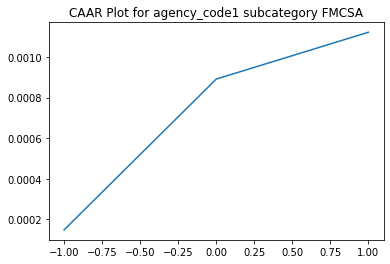

         ARR      CAAR        sd    t_stat   p_value
-1  0.000149  0.000149  0.013205  0.368438  0.712619
 0  0.000742  0.000891  0.019139  1.523770  0.127861
 1  0.000231  0.001121  0.023884  1.537103  0.124563
CAR FOR Different Agency Groups GROUP FRA
We found AR for 869 events
AR.shape[1] is 869


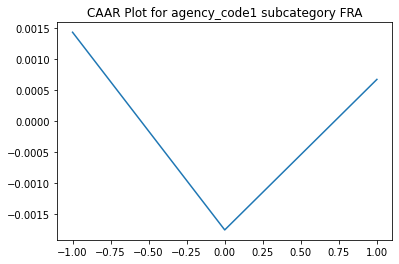

         ARR      CAAR        sd    t_stat       p_value
-1  0.001432  0.001432  0.007809  5.406606  8.305666e-08
 0 -0.003194 -0.001762  0.010802 -4.807292  1.802663e-06
 1  0.002432  0.000670  0.015412  1.282408  2.000420e-01
For ticker None we have 200 NaN values     in the window
Something is wrong with TFC in 2019-05-06 00:00:00
For ticker None we have 108 NaN values     in the window
Something is wrong with RTX in 2017-12-08 00:00:00
CAR FOR Different Agency Groups GROUP WHD
We found AR for 603 events
AR.shape[1] is 603


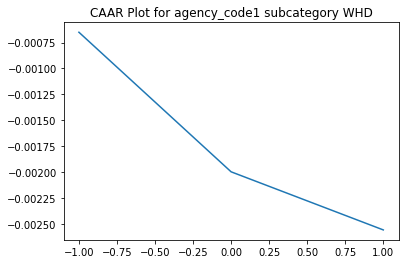

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000650 -0.000650  0.012409 -1.286375  0.198807
 0 -0.001348 -0.001998  0.018887 -2.597211  0.009628
 1 -0.000561 -0.002559  0.023007 -2.730884  0.006502
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-06-25 00:00:00
For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with HWM in 2017-07-19 00:00:00
CAR FOR Different Agency Groups GROUP EPA
We found AR for 267 events
AR.shape[1] is 267


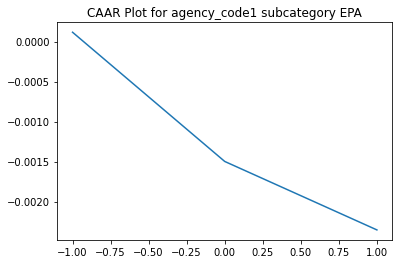

         ARR      CAAR        sd    t_stat   p_value
-1  0.000117  0.000117  0.013506  0.141694  0.887429
 0 -0.001615 -0.001498  0.020220 -1.210168  0.227289
 1 -0.000856 -0.002353  0.022823 -1.684735  0.093212
CAR FOR Different Agency Groups GROUP CMS
We found AR for 222 events
AR.shape[1] is 222


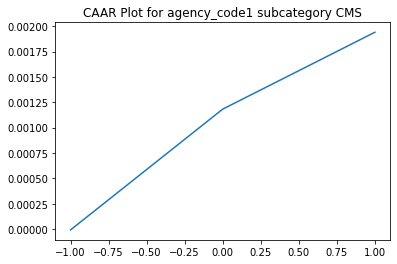

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000008 -0.000008  0.010989 -0.011273  0.991016
 0  0.001191  0.001182  0.013503  1.304740  0.193338
 1  0.000758  0.001940  0.016876  1.712742  0.088162
For ticker None we have 173 NaN values     in the window
Something is wrong with GL in 2019-07-03 00:00:00
For ticker None we have 70 NaN values     in the window
Something is wrong with GL in 2019-02-05 00:00:00
CAR FOR Different Agency Groups GROUP INS
We found AR for 225 events
AR.shape[1] is 225


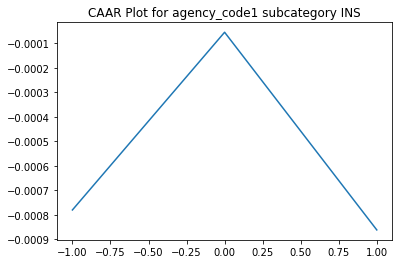

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000780 -0.000780  0.021529 -0.543436  0.587370
 0  0.000725 -0.000055  0.024871 -0.033072  0.973646
 1 -0.000807 -0.000861  0.032512 -0.397432  0.691428
CAR FOR Different Agency Groups GROUP AG
We found AR for 214 events
AR.shape[1] is 214


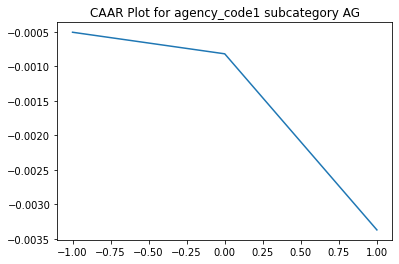

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000505 -0.000505  0.016849 -0.438553  0.661430
 0 -0.000313 -0.000818  0.022065 -0.542179  0.588262
 1 -0.002552 -0.003370  0.023987 -2.055330  0.041067
CAR FOR Different Agency Groups GROUP MSHA
We found AR for 204 events
AR.shape[1] is 204


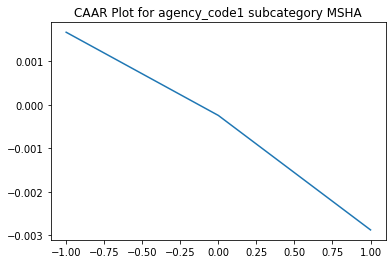

         ARR      CAAR        sd    t_stat   p_value
-1  0.001663  0.001663  0.016906  1.405093  0.161522
 0 -0.001909 -0.000246  0.029563 -0.118931  0.905447
 1 -0.002627 -0.002873  0.036566 -1.122273  0.263072
CAR FOR Different Agency Groups GROUP MHC
We found AR for 123 events
AR.shape[1] is 123


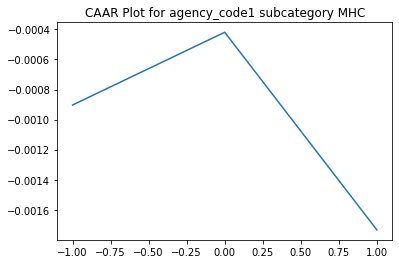

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000903 -0.000903  0.014540 -0.688883  0.492205
 0  0.000484 -0.000419  0.020184 -0.230283  0.818257
 1 -0.001315 -0.001734  0.025071 -0.767076  0.444518
CAR FOR Different Agency Groups GROUP FAA
We found AR for 121 events
AR.shape[1] is 121


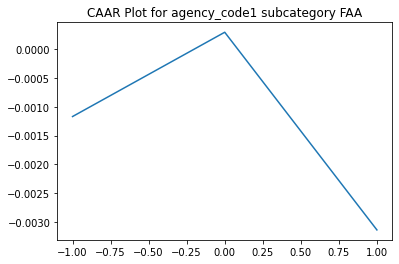

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001171 -0.001171  0.012309 -1.046185  0.297578
 0  0.001462  0.000292  0.017651  0.181754  0.856083
 1 -0.003429 -0.003138  0.025254 -1.366742  0.174261
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2020-01-30 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN 

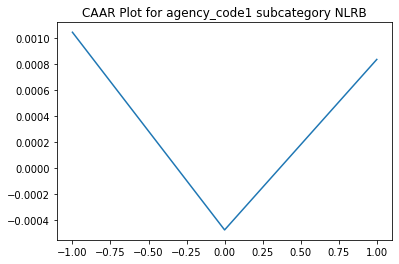

         ARR      CAAR        sd    t_stat   p_value
-1  0.001042  0.001042  0.016802  0.558062  0.578361
 0 -0.001521 -0.000479  0.024193 -0.178103  0.859093
 1  0.001311  0.000833  0.026222  0.285791  0.775777
For ticker None we have 101 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 87 NaN values     in the window
Something is wrong with TFC in 2018-06-28 00:00:00
CAR FOR Different Agency Groups GROUP EEOC
We found AR for 72 events
AR.shape[1] is 72


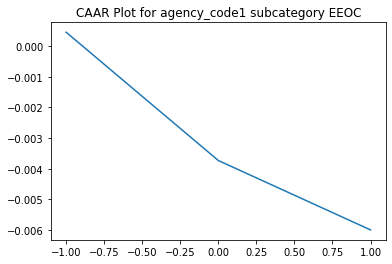

         ARR      CAAR        sd    t_stat   p_value
-1  0.000448  0.000448  0.016502  0.230609  0.818282
 0 -0.004183 -0.003734  0.018445 -1.717804  0.090191
 1 -0.002262 -0.005996  0.032471 -1.566958  0.121571
For ticker None we have 117 NaN values     in the window
Something is wrong with DD in 2019-09-27 00:00:00
CAR FOR Different Agency Groups GROUP OFCCP
We found AR for 56 events
AR.shape[1] is 56


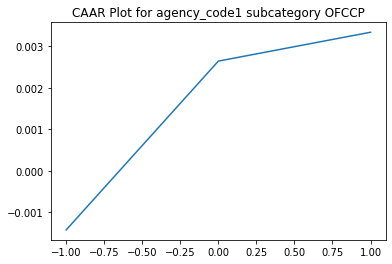

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001428 -0.001428  0.013313 -0.802616  0.425651
 0  0.004074  0.002646  0.028256  0.700811  0.486375
 1  0.000696  0.003343  0.043559  0.574262  0.568132
For ticker None we have 200 NaN values     in the window
Something is wrong with RTX in 2019-06-28 00:00:00
CAR FOR Different Agency Groups GROUP USAO
We found AR for 52 events
AR.shape[1] is 52


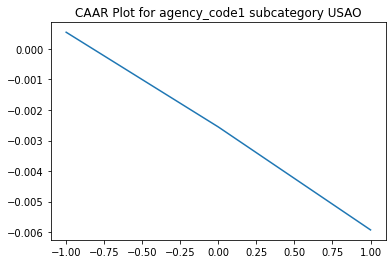

         ARR      CAAR        sd    t_stat   p_value
-1  0.000548  0.000548  0.016482  0.239720  0.811508
 0 -0.003103 -0.002555  0.021408 -0.860792  0.393382
 1 -0.003372 -0.005928  0.035743 -1.195919  0.237259
For ticker None we have 52 NaN values     in the window
Something is wrong with GL in 2019-01-09 00:00:00
CAR FOR Different Agency Groups GROUP FIN
We found AR for 34 events
AR.shape[1] is 34


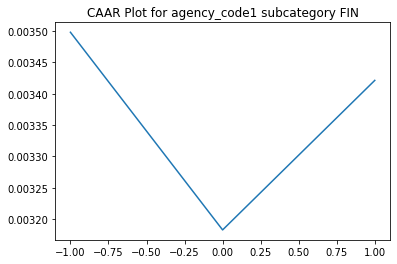

         ARR      CAAR        sd    t_stat   p_value
-1  0.003498  0.003498  0.011980  1.702641  0.098038
 0 -0.000315  0.003183  0.020039  0.926082  0.361127
 1  0.000239  0.003421  0.033156  0.601683  0.551497
CAR FOR Different Agency Groups GROUP EBSA
We found AR for 30 events
AR.shape[1] is 30


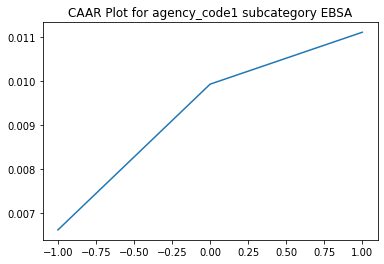

         ARR      CAAR        sd    t_stat   p_value
-1  0.006611  0.006611  0.021819  1.659540  0.107785
 0  0.003311  0.009922  0.031086  1.748241  0.091003
 1  0.001180  0.011102  0.027213  2.234486  0.033322


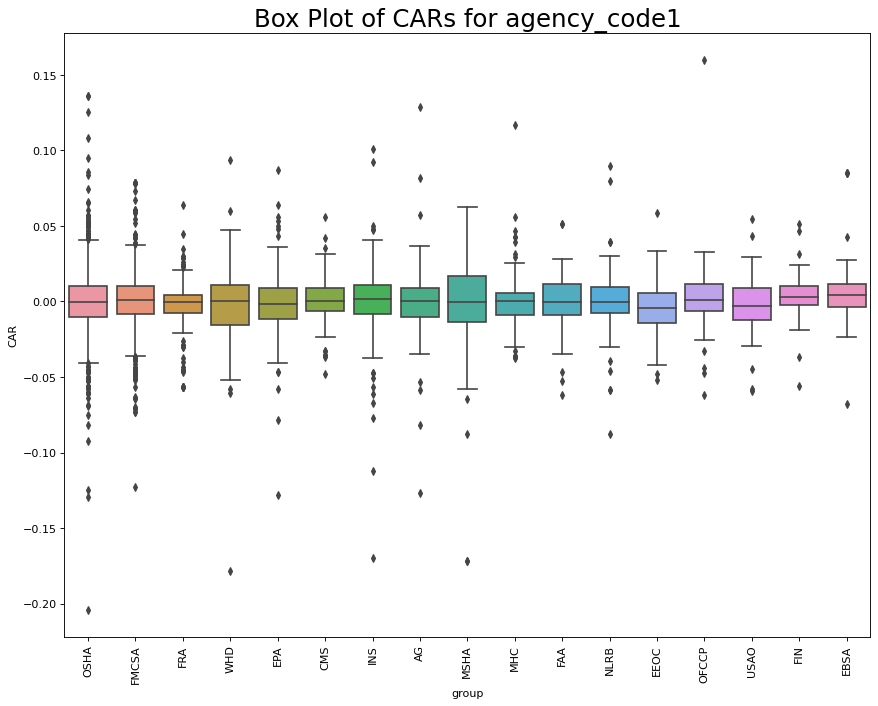

In [ ]:
a = CAAR_by_category(df, events, 'agency_code1',\
                     cat_name='Different Agency Groups', cat_members=agency_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

#Penalty

For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
CAR FOR Different Penalty Groups GROUP [1000,6000]
We found AR for 969 events
AR.shape[1] is 969


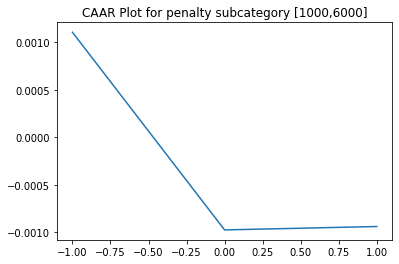

         ARR      CAAR        sd    t_stat   p_value
-1  0.001107  0.001107  0.010407  3.310835  0.000965
 0 -0.002080 -0.000973  0.017991 -1.684106  0.092484
 1  0.000036 -0.000938  0.022455 -1.299821  0.193972


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-12 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
For ticker None we have 5 NaN values     in the window
Something is wrong with HWM in 2017-07-19 00:00:00
CAR FOR Different Penalty Groups GROUP [20000, 31000]
We found AR for 581 events
AR.shape[1] is 581


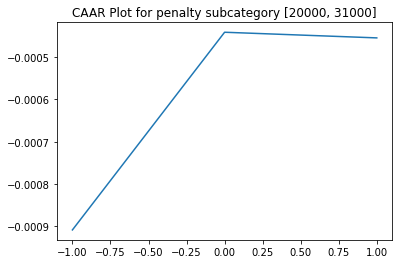

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000908 -0.000908  0.013110 -1.670227  0.095414
 0  0.000467 -0.000442  0.018646 -0.570744  0.568394
 1 -0.000013 -0.000455  0.023751 -0.461615  0.644530


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
CAR FOR Different Penalty Groups GROUP [44000,60000]
We found AR for 221 events
AR.shape[1] is 221


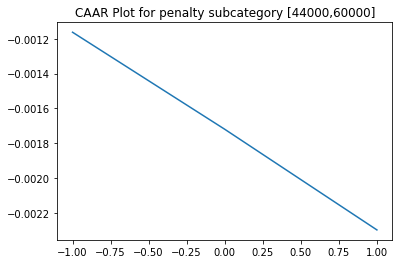

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001162 -0.001162  0.014151 -1.221075  0.223365
 0 -0.000557 -0.001719  0.020997 -1.217371  0.224767
 1 -0.000578 -0.002298  0.024149 -1.414324  0.158680


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 101 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-05 00:00:00
CAR FOR Different Penalty Groups GROUP [71000, 87000]
We found AR for 125 events
AR.shape[1] is 125


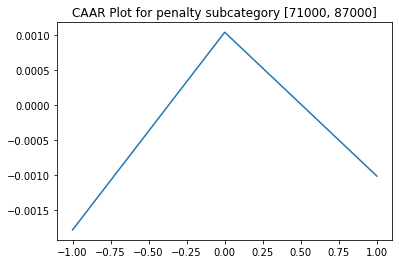

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001778 -0.001778  0.016781 -1.184538  0.238466
 0  0.002814  0.001036  0.021021  0.551177  0.582504
 1 -0.002048 -0.001012  0.025446 -0.444503  0.657454


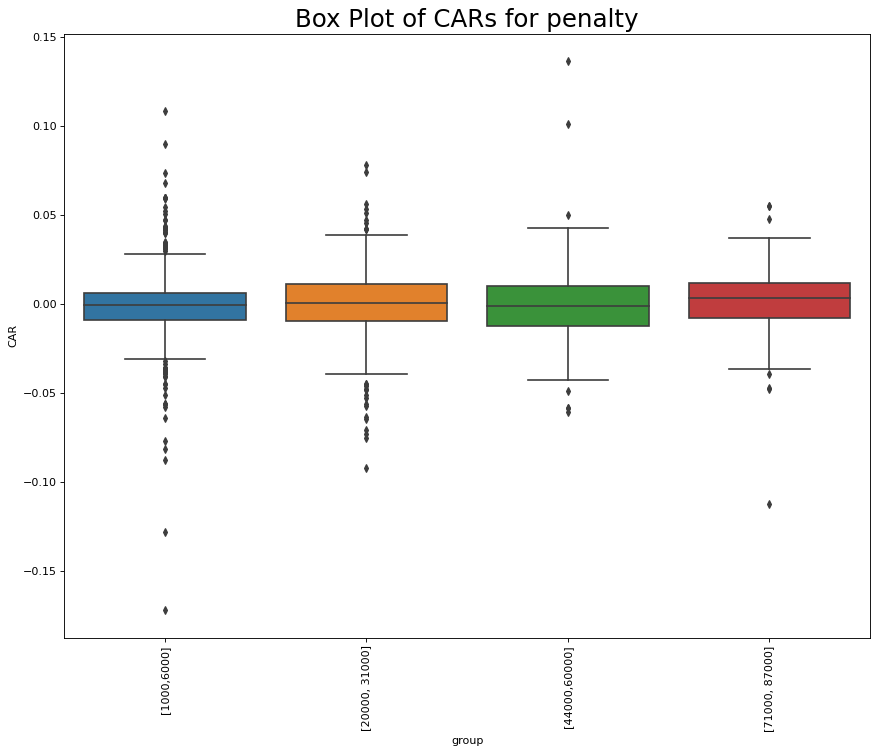

In [ ]:
es_win = 200
ev_win = [-1,1]
end_time = 1
a = CAAR_by_category(df, events, 'penalty',\
                     cat_name='Different Penalty Groups', cat_members=penalty_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
CAR FOR Different Penalty Groups GROUP [1000,6000]
We found AR for 969 events
AR.shape[1] is 969


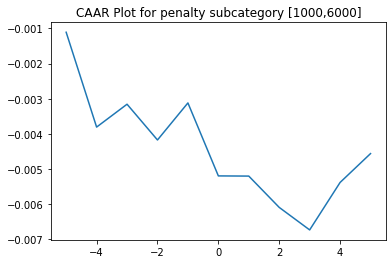

         ARR      CAAR        sd    t_stat       p_value
-5 -0.001108 -0.001108  0.012944 -2.664686  7.834227e-03
-4 -0.002698 -0.003806  0.018935 -6.256253  5.911771e-10
-3  0.000651 -0.003155  0.022527 -4.359748  1.441435e-05
-2 -0.001017 -0.004172  0.025509 -5.091194  4.274817e-07
-1  0.001054 -0.003118  0.027857 -3.484641  5.148847e-04
 0 -0.002076 -0.005194  0.031424 -5.145257  3.234005e-07
 1 -0.000005 -0.005199  0.034284 -4.720766  2.695970e-06
 2 -0.000891 -0.006090  0.035387 -5.357073  1.057108e-07
 3 -0.000640 -0.006730  0.036797 -5.693531  1.649354e-08
 4  0.001350 -0.005380  0.039421 -4.248491  2.359946e-05
 5  0.000821 -0.004559  0.041420 -3.426561  6.369839e-04


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-12 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
For ticker None we have 1 NaN values     in the window
Something is wrong with HWM in 2017-07-19 00:00:00
CAR FOR Different Penalty Groups GROUP [20000, 31000]
We found AR for 581 events
AR.shape[1] is 581


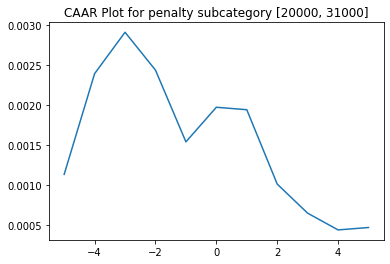

         ARR      CAAR        sd    t_stat   p_value
-5  0.001134  0.001134  0.012927  2.113862  0.034953
-4  0.001263  0.002396  0.020703  2.789942  0.005445
-3  0.000519  0.002915  0.025297  2.777842  0.005649
-2 -0.000475  0.002441  0.026047  2.258669  0.024275
-1 -0.000899  0.001541  0.029724  1.250009  0.211801
 0  0.000434  0.001975  0.032460  1.466669  0.143008
 1 -0.000031  0.001944  0.035197  1.331468  0.183558
 2 -0.000932  0.001012  0.037931  0.643124  0.520398
 3 -0.000365  0.000647  0.040510  0.385126  0.700286
 4 -0.000210  0.000438  0.042997  0.245323  0.806293
 5  0.000030  0.000468  0.044680  0.252404  0.800818


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
CAR FOR Different Penalty Groups GROUP [44000,60000]
We found AR for 221 events
AR.shape[1] is 221


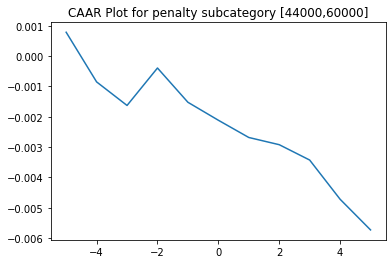

         ARR      CAAR        sd    t_stat   p_value
-5  0.000785  0.000785  0.012673  0.920526  0.358306
-4 -0.001636 -0.000852  0.018720 -0.676336  0.499538
-3 -0.000776 -0.001628  0.025201 -0.960300  0.337958
-2  0.001234 -0.000394  0.029254 -0.200289  0.841439
-1 -0.001129 -0.001523  0.031738 -0.713423  0.476340
 0 -0.000592 -0.002115  0.034089 -0.922419  0.357321
 1 -0.000568 -0.002683  0.036930 -1.080157  0.281255
 2 -0.000238 -0.002921  0.038978 -1.114053  0.266472
 3 -0.000506 -0.003427  0.038548 -1.321528  0.187698
 4 -0.001292 -0.004718  0.040660 -1.725132  0.085908
 5 -0.001011 -0.005729  0.043404 -1.962320  0.050986


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 97 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-05 00:00:00
CAR FOR Different Penalty Groups GROUP [71000, 87000]
We found AR for 125 events
AR.shape[1] is 125


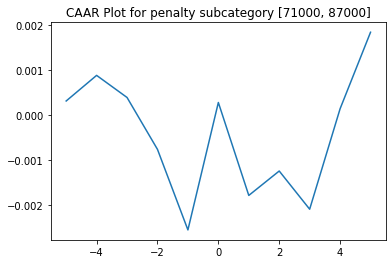

         ARR      CAAR        sd    t_stat   p_value
-5  0.000307  0.000307  0.017574  0.195599  0.845245
-4  0.000569  0.000877  0.024919  0.393403  0.694697
-3 -0.000491  0.000386  0.031489  0.136908  0.891326
-2 -0.001154 -0.000768  0.032639 -0.263118  0.792896
-1 -0.001791 -0.002559  0.037383 -0.765236  0.445585
 0  0.002833  0.000274  0.038427  0.079744  0.936570
 1 -0.002066 -0.001792  0.040072 -0.499977  0.617977
 2  0.000543 -0.001249  0.042499 -0.328645  0.742978
 3 -0.000849 -0.002098  0.045840 -0.511789  0.609709
 4  0.002233  0.000135  0.051054  0.029536  0.976485
 5  0.001701  0.001836  0.051167  0.401135  0.689011


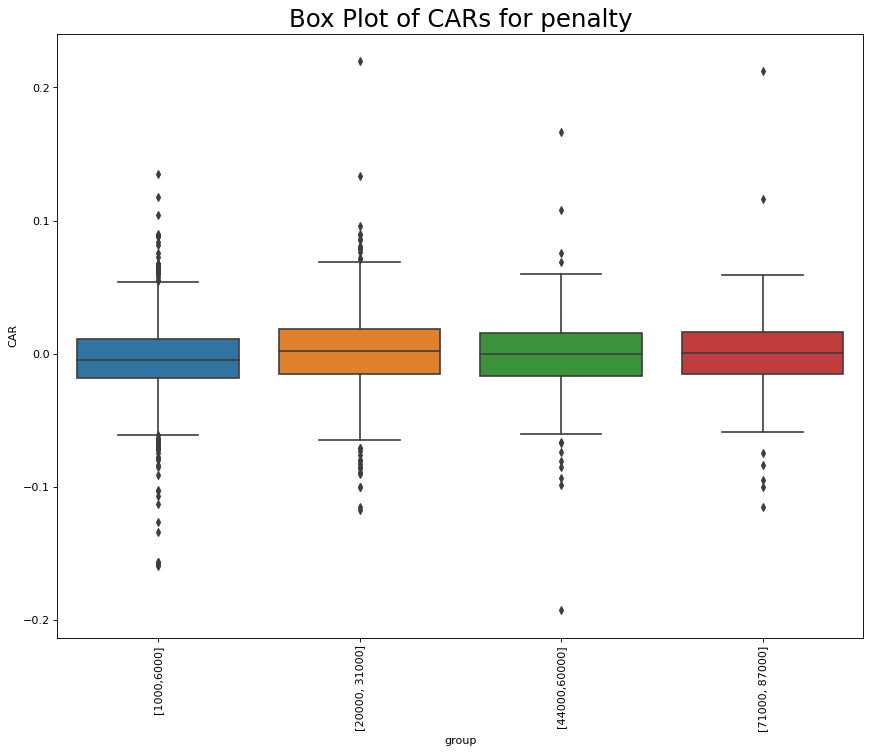

In [ ]:
es_win = 200
ev_win = [-5,5]
end_time = 5
a = CAAR_by_category(df, events, 'penalty',\
                     cat_name='Different Penalty Groups', cat_members=penalty_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 196 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
CAR FOR Different Penalty Groups GROUP [1000,6000]
We found AR for 969 events
AR.shape[1] is 969


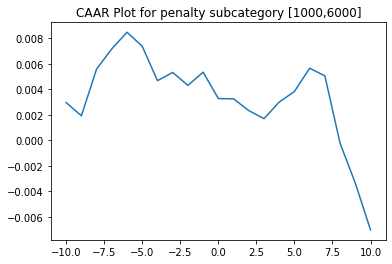

          ARR      CAAR        sd    t_stat       p_value
-10  0.002954  0.002954  0.014408  6.381085  2.721908e-10
-9  -0.001033  0.001920  0.017752  3.367371  7.887720e-04
-8   0.003661  0.005581  0.024518  7.086086  2.654690e-12
-7   0.001582  0.007164  0.027898  7.992997  3.732262e-15
-6   0.001299  0.008462  0.030850  8.538520  5.210672e-17
-5  -0.001100  0.007362  0.034397  6.662573  4.508092e-11
-4  -0.002691  0.004671  0.035984  4.040496  5.756495e-05
-3   0.000644  0.005314  0.038291  4.320431  1.717953e-05
-2  -0.001013  0.004302  0.039654  3.376928  7.621786e-04
-1   0.001032  0.005334  0.041829  3.969148  7.746196e-05
 0  -0.002065  0.003268  0.042678  2.383705  1.733124e-02
 1  -0.000023  0.003245  0.045490  2.220618  2.660772e-02
 2  -0.000918  0.002327  0.047243  1.533034  1.255942e-01
 3  -0.000633  0.001694  0.048280  1.092144  2.750417e-01
 4   0.001301  0.002995  0.051763  1.801071  7.200285e-02
 5   0.000827  0.003822  0.053531  2.222621  2.647173e-02
 6   0.001823 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-12 00:00:00
For ticker None we have 196 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
CAR FOR Different Penalty Groups GROUP [20000, 31000]
We found AR for 582 events
AR.shape[1] is 582


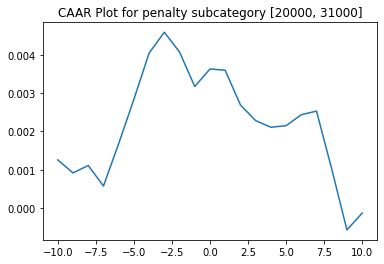

          ARR      CAAR        sd    t_stat   p_value
-10  0.001256  0.001256  0.013298  2.278441  0.023062
-9  -0.000340  0.000916  0.019691  1.122173  0.262253
-8   0.000194  0.001110  0.023270  1.151137  0.250149
-7  -0.000537  0.000573  0.026579  0.520446  0.602951
-6   0.001173  0.001746  0.028903  1.457618  0.145486
-5   0.001158  0.002904  0.031187  2.246561  0.025043
-4   0.001205  0.004110  0.035715  2.775985  0.005681
-3   0.000545  0.004654  0.039114  2.870645  0.004246
-2  -0.000516  0.004139  0.038380  2.601386  0.009521
-1  -0.000901  0.003238  0.040873  1.910972  0.056500
 0   0.000459  0.003697  0.041855  2.130795  0.033525
 1  -0.000035  0.003662  0.043676  2.022478  0.043585
 2  -0.000903  0.002758  0.046128  1.442512  0.149697
 3  -0.000409  0.002349  0.048680  1.164076  0.244871
 4  -0.000174  0.002175  0.051056  1.027851  0.304448
 5   0.000040  0.002215  0.052336  1.020985  0.307686
 6   0.000287  0.002502  0.054372  1.110034  0.267444
 7   0.000095  0.002597  0.0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
CAR FOR Different Penalty Groups GROUP [44000,60000]
We found AR for 221 events
AR.shape[1] is 221


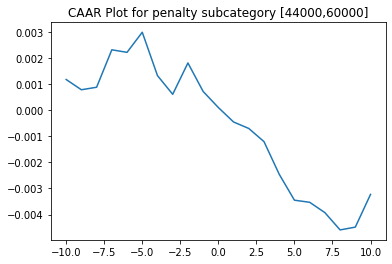

          ARR      CAAR        sd    t_stat   p_value
-10  0.001183  0.001183  0.013633  1.289769  0.198485
-9  -0.000393  0.000790  0.019435  0.603908  0.546527
-8   0.000097  0.000886  0.021975  0.599537  0.549432
-7   0.001437  0.002323  0.024319  1.420135  0.156984
-6  -0.000097  0.002226  0.028155  1.175297  0.241146
-5   0.000771  0.002997  0.031761  1.402990  0.162030
-4  -0.001665  0.001333  0.035042  0.565362  0.572404
-3  -0.000718  0.000615  0.037931  0.241081  0.809717
-2   0.001204  0.001819  0.041569  0.650433  0.516092
-1  -0.001094  0.000725  0.042242  0.255185  0.798819
 0  -0.000618  0.000107  0.043885  0.036259  0.971108
 1  -0.000555 -0.000447  0.046421 -0.143307  0.886179
 2  -0.000249 -0.000696  0.047154 -0.219543  0.826431
 3  -0.000505 -0.001201  0.046107 -0.387372  0.698855
 4  -0.001253 -0.002455  0.047459 -0.768945  0.442751
 5  -0.000995 -0.003450  0.050579 -1.013973  0.311709
 6  -0.000080 -0.003530  0.052335 -1.002750  0.317083
 7  -0.000396 -0.003927  0.0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 92 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 195 NaN values     in the window
Something is wrong with LHX in 2019-11-05 00:00:00
CAR FOR Different Penalty Groups GROUP [71000, 87000]
We found AR for 125 events
AR.shape[1] is 125


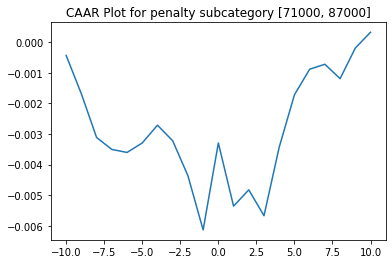

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000438 -0.000438  0.015358 -0.318568  0.750590
-9  -0.001254 -0.001692  0.019515 -0.969311  0.334277
-8  -0.001423 -0.003115  0.023503 -1.481784  0.140935
-7  -0.000389 -0.003504  0.027126 -1.444250  0.151191
-6  -0.000099 -0.003603  0.034433 -1.169773  0.244336
-5   0.000310 -0.003293  0.035237 -1.044700  0.298194
-4   0.000580 -0.002713  0.034662 -0.875013  0.383259
-3  -0.000510 -0.003222  0.036318 -0.991986  0.323136
-2  -0.001139 -0.004361  0.039178 -1.244561  0.215640
-1  -0.001769 -0.006131  0.042183 -1.624889  0.106725
 0   0.002836 -0.003294  0.042616 -0.864292  0.389096
 1  -0.002060 -0.005354  0.045316 -1.321047  0.188918
 2   0.000531 -0.004823  0.048379 -1.114652  0.267155
 3  -0.000843 -0.005666  0.053904 -1.175266  0.242140
 4   0.002237 -0.003429  0.055391 -0.692150  0.490137
 5   0.001708 -0.001721  0.055212 -0.348468  0.728079
 6   0.000835 -0.000886  0.056506 -0.175307  0.861124
 7   0.000162 -0.000724  0.0

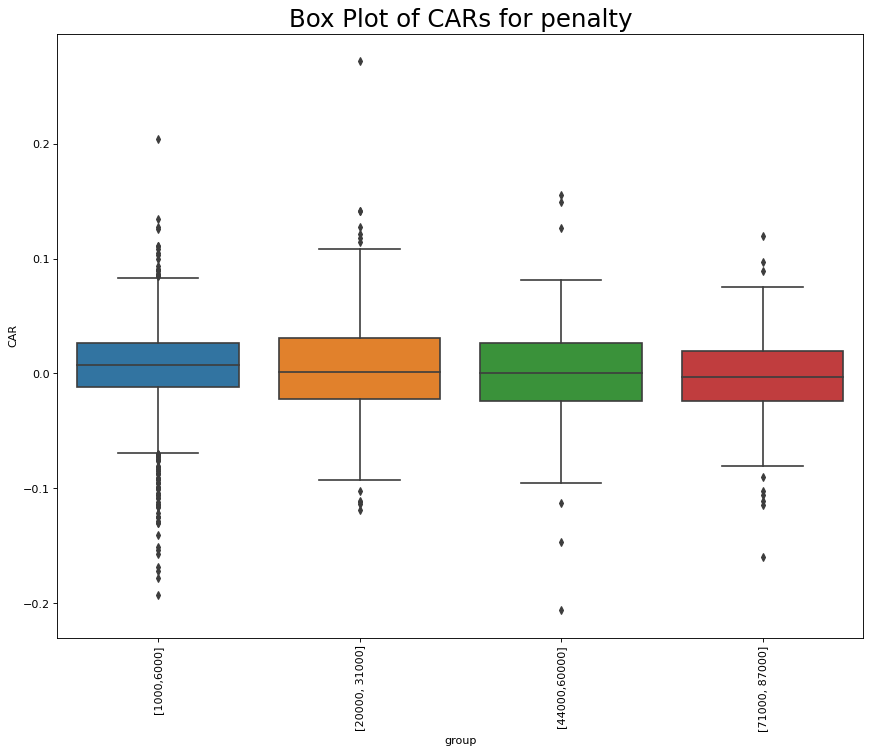

In [ ]:
es_win = 200
ev_win = [-10,10]
end_time = 10
a = CAAR_by_category(df, events, 'penalty',\
                     cat_name='Different Penalty Groups', cat_members=penalty_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

For ticker None we have 186 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
CAR FOR Different Penalty Groups GROUP [1000,6000]
We found AR for 969 events
AR.shape[1] is 969


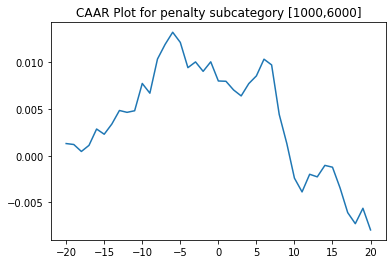

          ARR      CAAR        sd    t_stat       p_value
-20  0.001304  0.001304  0.012531  3.239458  1.238353e-03
-19 -0.000100  0.001204  0.017893  2.094260  3.649642e-02
-18 -0.000746  0.000458  0.021678  0.657804  5.108206e-01
-17  0.000653  0.001111  0.026286  1.316133  1.884408e-01
-16  0.001748  0.002859  0.029774  2.989516  2.864837e-03
-15 -0.000557  0.002303  0.033831  2.118814  3.436039e-02
-14  0.001088  0.003390  0.035273  2.991968  2.842139e-03
-13  0.001453  0.004843  0.037989  3.968766  7.758415e-05
-12 -0.000198  0.004645  0.039307  3.678638  2.474038e-04
-11  0.000171  0.004816  0.041733  3.592161  3.444470e-04
-10  0.002921  0.007737  0.045087  5.341794  1.147434e-07
-9  -0.001042  0.006696  0.045832  4.547594  6.113781e-06
-8   0.003653  0.010348  0.051381  6.269391  5.451819e-10
-7   0.001566  0.011914  0.053704  6.905884  9.024080e-12
-6   0.001304  0.013218  0.056364  7.299772  6.005846e-13
-5  -0.001088  0.012129  0.058652  6.437382  1.910101e-10
-4  -0.002702 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-02 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-11-26 00:00:00
For ticker None we have 190 NaN values     in the window
Something is wrong with LHX in 2019-11-12 00:00:00
For ticker None we have 186 NaN values     in the window
Something is wrong with LHX in 2019-11-06 00:00:00
CAR FOR Different Penalty Groups GROUP [20000, 31000]
We found AR for 582 events
AR.shape[1] is 582


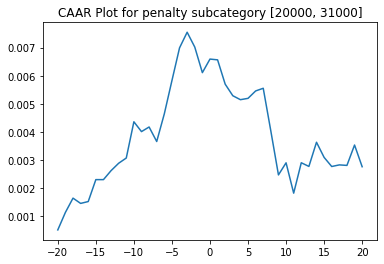

              ARR      CAAR        sd    t_stat   p_value
-20  5.216190e-04  0.000522  0.013205  0.952994  0.340989
-19  6.221739e-04  0.001144  0.019136  1.441946  0.149856
-18  5.067601e-04  0.001651  0.025704  1.549123  0.121897
-17 -1.870625e-04  0.001463  0.029545  1.194984  0.232581
-16  6.571448e-05  0.001529  0.031748  1.162008  0.245709
-15  7.790948e-04  0.002308  0.033864  1.644433  0.100628
-14 -2.619508e-07  0.002308  0.035274  1.578517  0.114991
-13  3.190404e-04  0.002627  0.035862  1.767237  0.077713
-12  2.631808e-04  0.002890  0.037729  1.848096  0.065096
-11  1.854910e-04  0.003076  0.038785  1.913172  0.056217
-10  1.287255e-03  0.004363  0.039944  2.635087  0.008636
-9  -3.490166e-04  0.004014  0.042995  2.252271  0.024678
-8   1.638984e-04  0.004178  0.045226  2.228588  0.026223
-7  -5.158238e-04  0.003662  0.046822  1.886850  0.059679
-6   1.124729e-03  0.004787  0.048132  2.399253  0.016743
-5   1.179900e-03  0.005967  0.049425  2.912383  0.003725
-4   1.163090e

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 2 NaN values     in the window
Something is wrong with DOW in 2019-11-04 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with HWM in 2018-09-28 00:00:00
CAR FOR Different Penalty Groups GROUP [44000,60000]
We found AR for 221 events
AR.shape[1] is 221


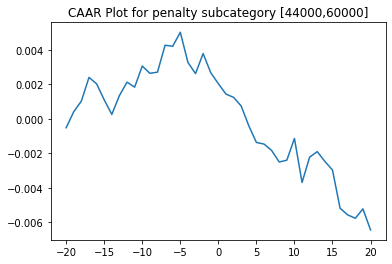

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000519 -0.000519  0.015530 -0.496388  0.620116
-19  0.000932  0.000414  0.020006  0.307376  0.758848
-18  0.000613  0.001027  0.024058  0.634352  0.526510
-17  0.001370  0.002396  0.027760  1.283159  0.200787
-16 -0.000374  0.002022  0.031520  0.953670  0.341297
-15 -0.000927  0.001095  0.036186  0.450000  0.653153
-14 -0.000842  0.000253  0.039521  0.095236  0.924214
-13  0.001092  0.001346  0.041217  0.485318  0.627933
-12  0.000774  0.002120  0.042102  0.748546  0.454930
-11 -0.000289  0.001831  0.044843  0.606940  0.544516
-10  0.001223  0.003054  0.045289  1.002497  0.317205
-9  -0.000422  0.002632  0.048758  0.802407  0.423184
-8   0.000067  0.002699  0.050571  0.793420  0.428388
-7   0.001559  0.004258  0.050718  1.247941  0.213379
-6  -0.000060  0.004198  0.052990  1.177672  0.240200
-5   0.000811  0.005009  0.054006  1.378741  0.169375
-4  -0.001745  0.003263  0.057753  0.840014  0.401812
-3  -0.000648  0.002615  0.0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


For ticker None we have 82 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-03 00:00:00
For ticker None we have 185 NaN values     in the window
Something is wrong with LHX in 2019-11-05 00:00:00
CAR FOR Different Penalty Groups GROUP [71000, 87000]
We found AR for 125 events
AR.shape[1] is 125


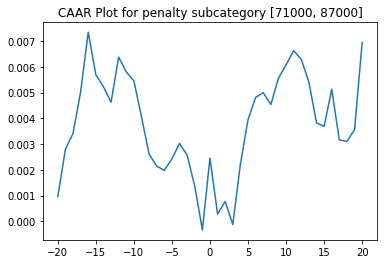

          ARR      CAAR        sd    t_stat   p_value
-20  0.000963  0.000963  0.011415  0.943132  0.347447
-19  0.001832  0.002795  0.021236  1.471741  0.143624
-18  0.000616  0.003411  0.023820  1.601066  0.111907
-17  0.001611  0.005022  0.028004  2.004877  0.047154
-16  0.002317  0.007339  0.028868  2.842186  0.005241
-15 -0.001645  0.005693  0.031833  1.999504  0.047740
-14 -0.000470  0.005223  0.034027  1.716094  0.088642
-13 -0.000598  0.004625  0.035544  1.454688  0.148282
-12  0.001748  0.006372  0.037063  1.922314  0.056860
-11 -0.000573  0.005800  0.042062  1.541617  0.125715
-10 -0.000350  0.005450  0.044601  1.366225  0.174341
-9  -0.001395  0.004055  0.046099  0.983469  0.327292
-8  -0.001443  0.002612  0.049268  0.592667  0.554484
-7  -0.000471  0.002140  0.052943  0.452011  0.652051
-6  -0.000160  0.001980  0.061130  0.362203  0.717817
-5   0.000447  0.002427  0.059224  0.458164  0.647637
-4   0.000600  0.003027  0.057149  0.592099  0.554862
-3  -0.000459  0.002568  0.0

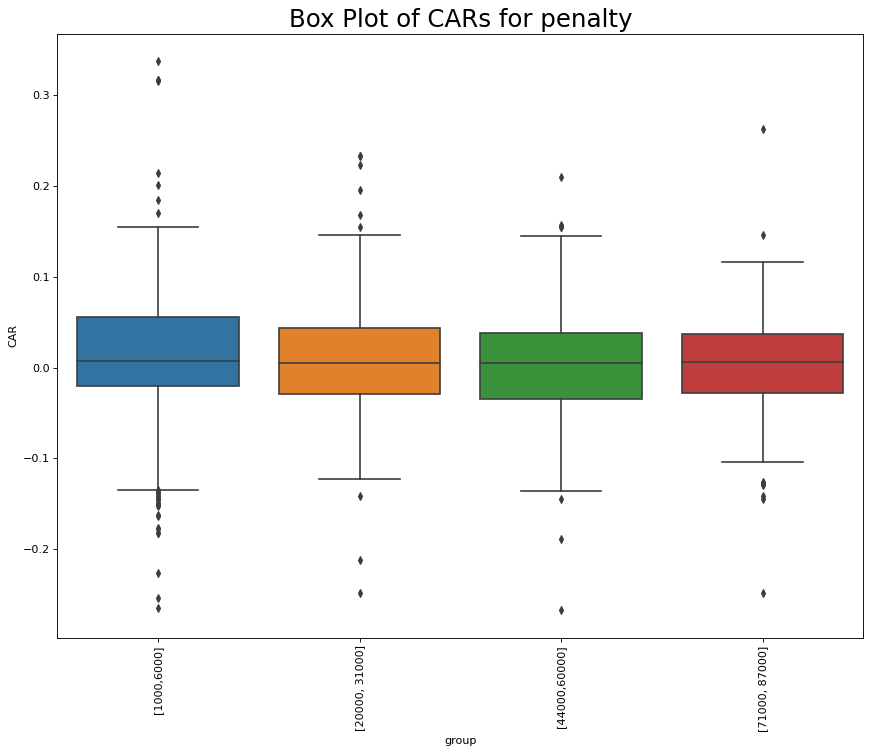

In [ ]:
es_win = 200
ev_win = [-20,20]
end_time = 20
a = CAAR_by_category(df, events, 'penalty',\
                     cat_name='Different Penalty Groups', cat_members=penalty_group,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

#Tickers

CAR FOR Different tickers GROUP BRK
We found AR for 130 events
AR.shape[1] is 130


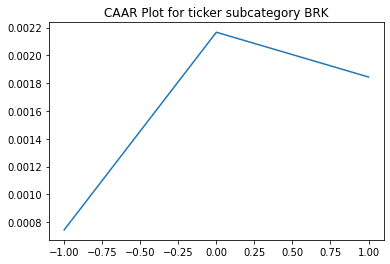

         ARR      CAAR        sd    t_stat   p_value
-1  0.000745  0.000745  0.007567  1.121918  0.263981
 0  0.001422  0.002166  0.010804  2.285957  0.023888
 1 -0.000322  0.001844  0.014285  1.471831  0.143502
CAR FOR Different tickers GROUP KMI
We found AR for 111 events
AR.shape[1] is 111


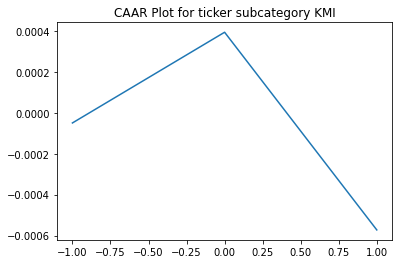

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000050 -0.000050  0.011332 -0.046273  0.963176
 0  0.000443  0.000394  0.018013  0.230221  0.818348
 1 -0.000966 -0.000573  0.020506 -0.294201  0.769159
CAR FOR Different tickers GROUP UNP
We found AR for 12 events
AR.shape[1] is 12


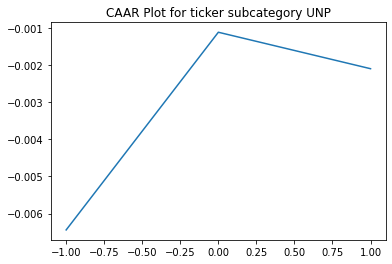

         ARR      CAAR        sd    t_stat   p_value
-1 -0.006439 -0.006439  0.012654 -1.762800  0.105657
 0  0.005325 -0.001114  0.018730 -0.206037  0.840526
 1 -0.000982 -0.002096  0.018422 -0.394195  0.700972
CAR FOR Different tickers GROUP DLTR
We found AR for 222 events
AR.shape[1] is 222


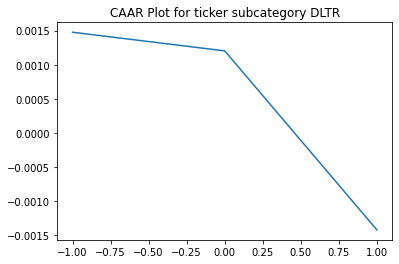

         ARR      CAAR        sd    t_stat   p_value
-1  0.001476  0.001476  0.014575  1.509373  0.132632
 0 -0.000273  0.001203  0.022372  0.801384  0.423770
 1 -0.002628 -0.001424  0.030180 -0.703209  0.482666
CAR FOR Different tickers GROUP BAC
We found AR for 186 events
AR.shape[1] is 186


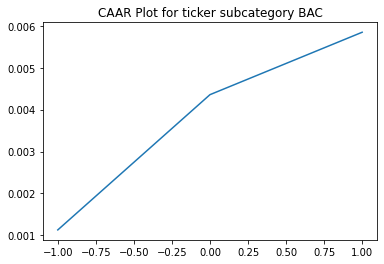

         ARR      CAAR        sd    t_stat   p_value
-1  0.001131  0.001131  0.013539  1.139366  0.256024
 0  0.003226  0.004357  0.018172  3.270193  0.001282
 1  0.001489  0.005846  0.021057  3.786409  0.000206
CAR FOR Different tickers GROUP CSX
We found AR for 9 events
AR.shape[1] is 9


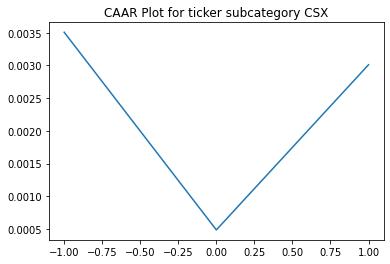

         ARR      CAAR        sd    t_stat   p_value
-1  0.003506  0.003506  0.014966  0.702884  0.502066
 0 -0.003022  0.000485  0.022975  0.063324  0.951062
 1  0.002525  0.003010  0.037232  0.242516  0.814482
CAR FOR Different tickers GROUP WFC
We found AR for 164 events
AR.shape[1] is 164


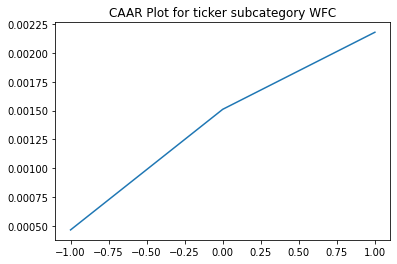

         ARR      CAAR        sd    t_stat   p_value
-1  0.000464  0.000464  0.011914  0.498680  0.618677
 0  0.001047  0.001510  0.017779  1.088025  0.278190
 1  0.000669  0.002179  0.020436  1.365595  0.173948
CAR FOR Different tickers GROUP JNJ
We found AR for 105 events
AR.shape[1] is 105


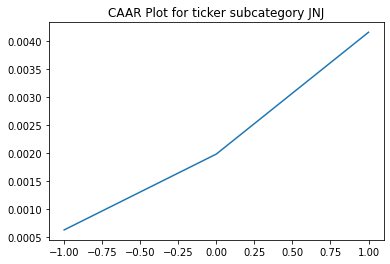

         ARR      CAAR        sd    t_stat   p_value
-1  0.000629  0.000629  0.009643  0.668424  0.505344
 0  0.001356  0.001985  0.014728  1.381348  0.170133
 1  0.002178  0.004163  0.020420  2.088976  0.039151
CAR FOR Different tickers GROUP WMT
We found AR for 102 events
AR.shape[1] is 102


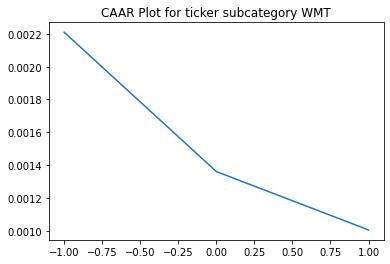

         ARR      CAAR        sd    t_stat   p_value
-1  0.002210  0.002210  0.012563  1.776639  0.078639
 0 -0.000850  0.001360  0.013808  0.995061  0.322085
 1 -0.000356  0.001005  0.015948  0.636178  0.526099
CAR FOR Different tickers GROUP GE
We found AR for 140 events
AR.shape[1] is 140


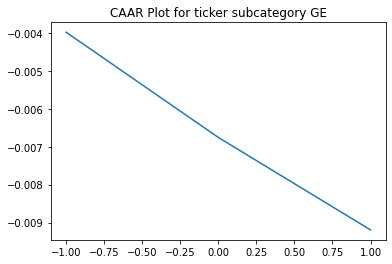

         ARR      CAAR        sd    t_stat   p_value
-1 -0.003981 -0.003981  0.019456 -2.421078  0.016765
 0 -0.002775 -0.006756  0.027164 -2.943034  0.003810
 1 -0.002439 -0.009196  0.034389 -3.163849  0.001913
CAR FOR Different tickers GROUP JPM
We found AR for 138 events
AR.shape[1] is 138


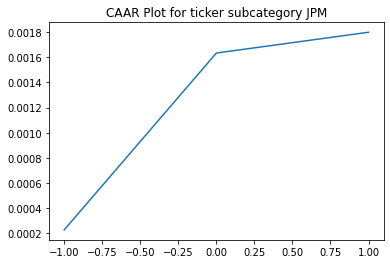

         ARR      CAAR        sd    t_stat   p_value
-1  0.000227  0.000227  0.010287  0.259122  0.795930
 0  0.001407  0.001634  0.014270  1.345089  0.180819
 1  0.000166  0.001799  0.018304  1.154867  0.250155
CAR FOR Different tickers GROUP VZ
We found AR for 79 events
AR.shape[1] is 79


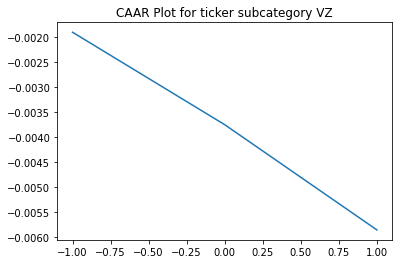

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001911 -0.001911  0.011649 -1.457942  0.148871
 0 -0.001845 -0.003756  0.015191 -2.197485  0.030953
 1 -0.002100 -0.005856  0.017986 -2.893854  0.004932
CAR FOR Different tickers GROUP MMM
We found AR for 68 events
AR.shape[1] is 68


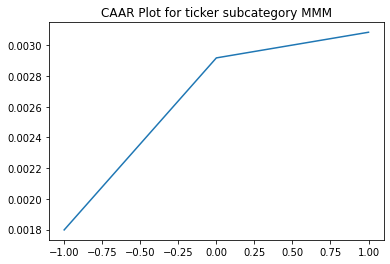

         ARR      CAAR        sd    t_stat   p_value
-1  0.001798  0.001798  0.011311  1.310618  0.194462
 0  0.001120  0.002918  0.017260  1.394247  0.167849
 1  0.000167  0.003085  0.019279  1.319720  0.191420
CAR FOR Different tickers GROUP NSC
We found AR for 12 events
AR.shape[1] is 12


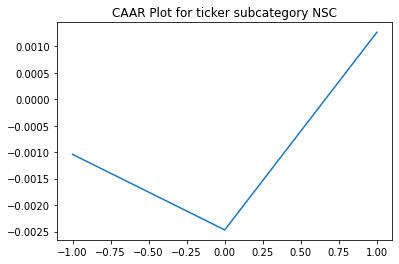

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001041 -0.001041  0.013099 -0.275300  0.788189
 0 -0.001429 -0.002470  0.015764 -0.542769  0.598114
 1  0.003738  0.001268  0.022409  0.196000  0.848184
CAR FOR Different tickers GROUP PSX
We found AR for 96 events
AR.shape[1] is 96


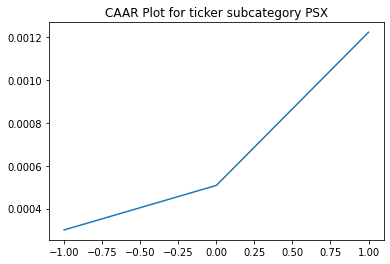

         ARR      CAAR        sd    t_stat   p_value
-1  0.000300  0.000300  0.010826  0.271903  0.786287
 0  0.000208  0.000508  0.014508  0.343304  0.732128
 1  0.000715  0.001224  0.016937  0.707941  0.480715
CAR FOR Different tickers GROUP CI
We found AR for 52 events
AR.shape[1] is 52


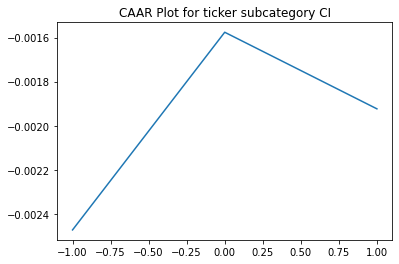

         ARR      CAAR        sd    t_stat   p_value
-1 -0.002473 -0.002473  0.023688 -0.752901  0.454971
 0  0.000897 -0.001576  0.024159 -0.470401  0.640074
 1 -0.000348 -0.001924  0.027667 -0.501358  0.618276
CAR FOR Different tickers GROUP HD
We found AR for 85 events
AR.shape[1] is 85


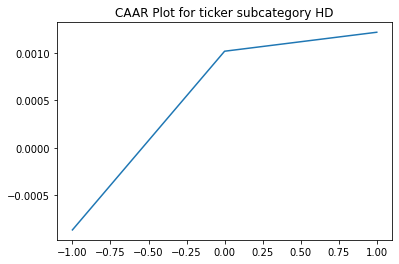

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000868 -0.000868  0.008485 -0.943255  0.348256
 0  0.001886  0.001018  0.011531  0.813753  0.418087
 1  0.000200  0.001218  0.014236  0.788879  0.432404
CAR FOR Different tickers GROUP DG
We found AR for 74 events
AR.shape[1] is 74


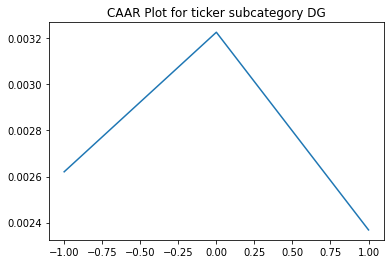

         ARR      CAAR        sd    t_stat   p_value
-1  0.002621  0.002621  0.011736  1.920888  0.058651
 0  0.000606  0.003226  0.016494  1.682583  0.096729
 1 -0.000858  0.002368  0.020970  0.971564  0.334476
CAR FOR Different tickers GROUP KR
We found AR for 80 events
AR.shape[1] is 80


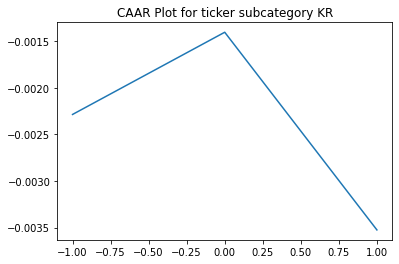

         ARR      CAAR        sd    t_stat   p_value
-1 -0.002287 -0.002287  0.015490 -1.320356  0.190529
 0  0.000882 -0.001405  0.024588 -0.511120  0.610693
 1 -0.002120 -0.003525  0.027761 -1.135668  0.259529
CAR FOR Different tickers GROUP XOM
We found AR for 75 events
AR.shape[1] is 75


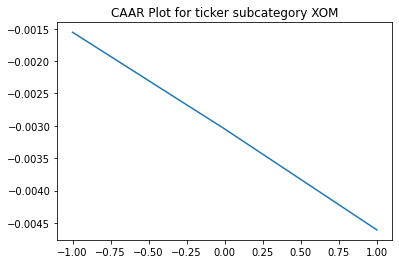

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001554 -0.001554  0.006755 -1.992826  0.049968
 0 -0.001494 -0.003048  0.011041 -2.390840  0.019354
 1 -0.001558 -0.004606  0.012773 -3.123334  0.002552
CAR FOR Different tickers GROUP UPS
We found AR for 78 events
AR.shape[1] is 78


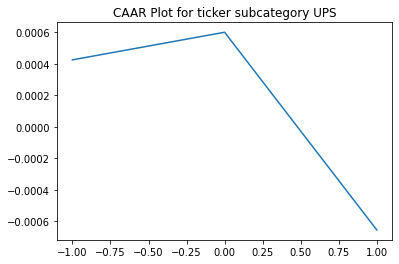

         ARR      CAAR        sd    t_stat   p_value
-1  0.000425  0.000425  0.009548  0.392933  0.695455
 0  0.000175  0.000600  0.013661  0.387944  0.699128
 1 -0.001255 -0.000655  0.018956 -0.305277  0.760979
CAR FOR Different tickers GROUP AMZN
We found AR for 49 events
AR.shape[1] is 49


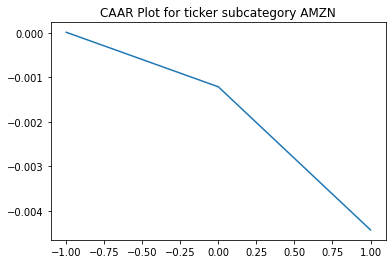

         ARR      CAAR        sd    t_stat   p_value
-1  0.000019  0.000019  0.014756  0.008913  0.992926
 0 -0.001229 -0.001210  0.024077 -0.351799  0.726529
 1 -0.003223 -0.004433  0.026695 -1.162343  0.250843
CAR FOR Different tickers GROUP FCX
We found AR for 65 events
AR.shape[1] is 65


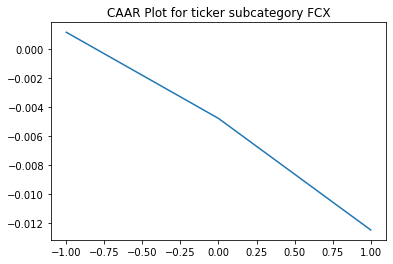

         ARR      CAAR        sd    t_stat   p_value
-1  0.001192  0.001192  0.020205  0.475788  0.635846
 0 -0.005959 -0.004767  0.043714 -0.879165  0.382601
 1 -0.007711 -0.012478  0.050540 -1.990573  0.050802
CAR FOR Different tickers GROUP IP
We found AR for 72 events
AR.shape[1] is 72


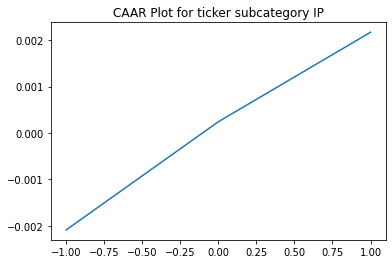

         ARR      CAAR        sd    t_stat   p_value
-1 -0.002091 -0.002091  0.012536 -1.415179  0.161387
 0  0.002333  0.000242  0.018163  0.113018  0.910335
 1  0.001930  0.002172  0.023920  0.770444  0.443593
CAR FOR Different tickers GROUP AAL
We found AR for 50 events
AR.shape[1] is 50


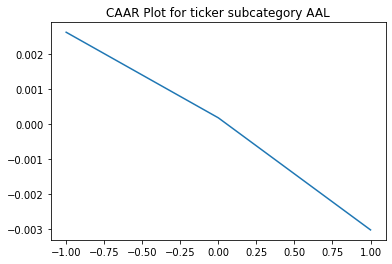

         ARR      CAAR        sd    t_stat   p_value
-1  0.002619  0.002619  0.018251  1.014565  0.315297
 0 -0.002446  0.000172  0.029996  0.040626  0.967759
 1 -0.003203 -0.003031  0.034447 -0.622078  0.536775
CAR FOR Different tickers GROUP ANTM
We found AR for 58 events
AR.shape[1] is 58


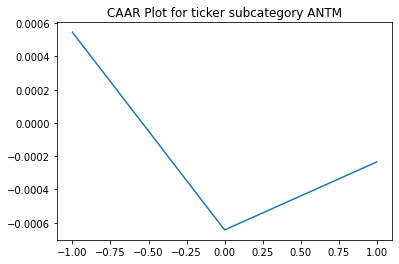

         ARR      CAAR        sd    t_stat   p_value
-1  0.000546  0.000546  0.013853  0.300117  0.765179
 0 -0.001190 -0.000644  0.020565 -0.238331  0.812479
 1  0.000409 -0.000234  0.023542 -0.075855  0.939800
CAR FOR Different tickers GROUP CVS
We found AR for 58 events
AR.shape[1] is 58


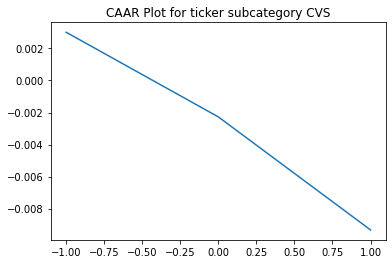

         ARR      CAAR        sd    t_stat   p_value
-1  0.003011  0.003011  0.015248  1.503898  0.138129
 0 -0.005286 -0.002275  0.027147 -0.638211  0.525892
 1 -0.007056 -0.009331  0.035187 -2.019611  0.048134
CAR FOR Different tickers GROUP UNH
We found AR for 52 events
AR.shape[1] is 52


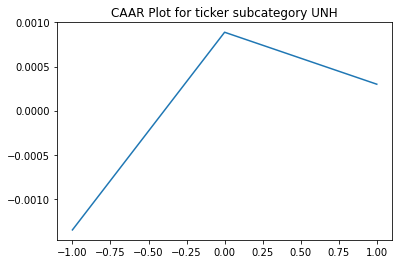

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001352 -0.001352  0.016178 -0.602451  0.549544
 0  0.002240  0.000888  0.023842  0.268659  0.789276
 1 -0.000589  0.000300  0.029296  0.073722  0.941520
CAR FOR Different tickers GROUP D
We found AR for 47 events
AR.shape[1] is 47


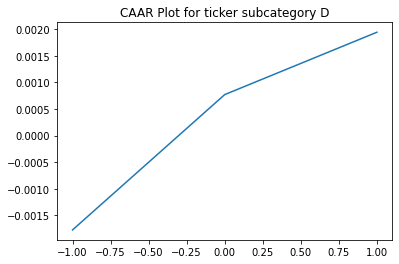

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001775 -0.001775  0.009852 -1.234838  0.223161
 0  0.002546  0.000771  0.012253  0.431341  0.668235
 1  0.001173  0.001944  0.014096  0.945229  0.349481
CAR FOR Different tickers GROUP C
We found AR for 49 events
AR.shape[1] is 49


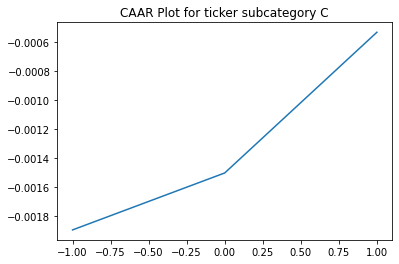

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001899 -0.001899  0.012584 -1.056098  0.296210
 0  0.000395 -0.001504  0.016272 -0.646934  0.520756
 1  0.000975 -0.000529  0.021212 -0.174556  0.862163
CAR FOR Different tickers GROUP ABT
We found AR for 30 events
AR.shape[1] is 30


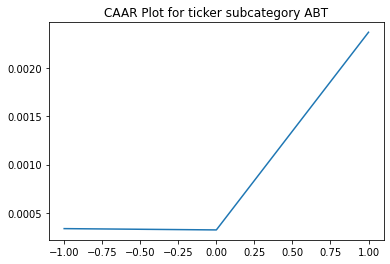

         ARR      CAAR        sd    t_stat   p_value
-1  0.000337  0.000337  0.007244  0.254523  0.800888
 0 -0.000013  0.000323  0.012000  0.147533  0.883732
 1  0.002049  0.002372  0.011161  1.164131  0.253859
CAR FOR Different tickers GROUP DAL
We found AR for 45 events
AR.shape[1] is 45


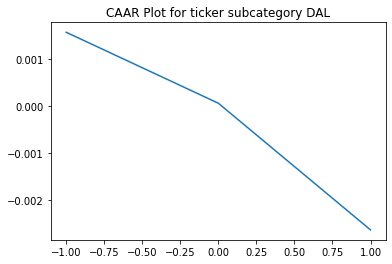

         ARR      CAAR        sd    t_stat   p_value
-1  0.001572  0.001572  0.014999  0.703051  0.485728
 0 -0.001507  0.000065  0.021465  0.020183  0.983989
 1 -0.002690 -0.002626  0.025338 -0.695187  0.490594
CAR FOR Different tickers GROUP TSN
We found AR for 43 events
AR.shape[1] is 43


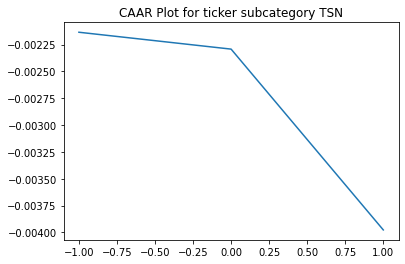

         ARR      CAAR        sd    t_stat   p_value
-1 -0.002136 -0.002136  0.012833 -1.091362  0.281335
 0 -0.000157 -0.002293  0.020754 -0.724450  0.472806
 1 -0.001683 -0.003976  0.026698 -0.976605  0.334357
CAR FOR Different tickers GROUP CMCSA
We found AR for 19 events
AR.shape[1] is 19


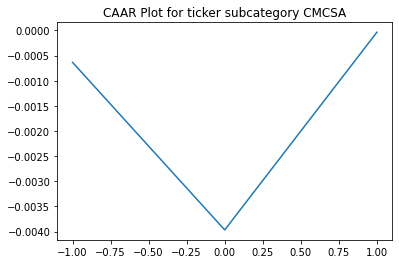

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000636 -0.000636  0.022199 -0.124924  0.901968
 0 -0.003330 -0.003966  0.025022 -0.690857  0.498469
 1  0.003928 -0.000038  0.023659 -0.006932  0.994545
CAR FOR Different tickers GROUP MLM
We found AR for 38 events
AR.shape[1] is 38


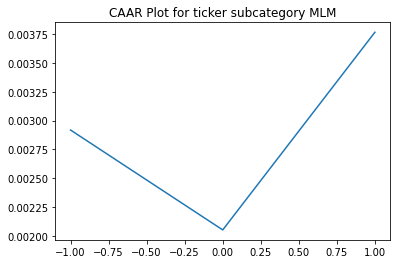

         ARR      CAAR        sd    t_stat   p_value
-1  0.002919  0.002919  0.015493  1.161322  0.252948
 0 -0.000867  0.002052  0.019364  0.653305  0.517599
 1  0.001715  0.003767  0.023544  0.986280  0.330402
CAR FOR Different tickers GROUP GM
We found AR for 18 events
AR.shape[1] is 18


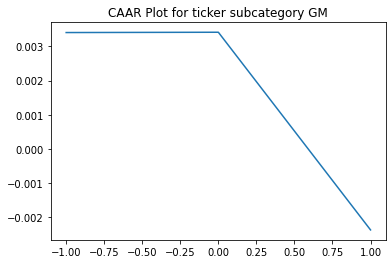

         ARR      CAAR        sd    t_stat   p_value
-1  0.003408  0.003408  0.012875  1.123125  0.276996
 0  0.000009  0.003417  0.025767  0.562667  0.581007
 1 -0.005790 -0.002373  0.035440 -0.284102  0.779764
CAR FOR Different tickers GROUP FDX
We found AR for 36 events
AR.shape[1] is 36


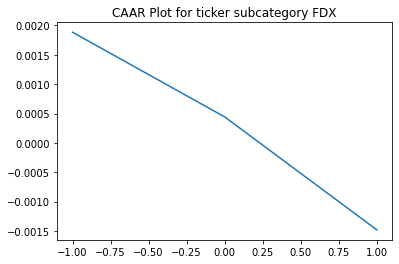

         ARR      CAAR        sd    t_stat   p_value
-1  0.001885  0.001885  0.028448  0.397473  0.693432
 0 -0.001442  0.000442  0.031241  0.084929  0.932802
 1 -0.001924 -0.001482  0.035327 -0.251750  0.802707
CAR FOR Different tickers GROUP NUE
We found AR for 34 events
AR.shape[1] is 34


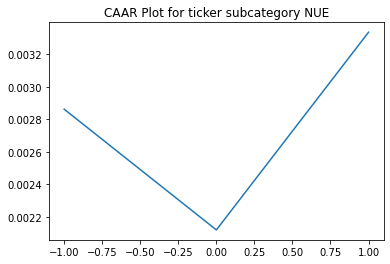

         ARR      CAAR        sd    t_stat   p_value
-1  0.002862  0.002862  0.016107  1.036137  0.307672
 0 -0.000741  0.002121  0.019749  0.626178  0.535506
 1  0.001214  0.003335  0.023723  0.819645  0.418299
CAR FOR Different tickers GROUP PGR
We found AR for 34 events
AR.shape[1] is 34


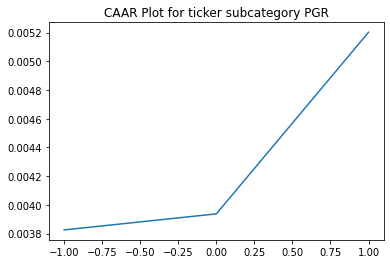

         ARR      CAAR        sd    t_stat   p_value
-1  0.003826  0.003826  0.010368  2.151657  0.038838
 0  0.000112  0.003938  0.017737  1.294521  0.204471
 1  0.001265  0.005202  0.020378  1.488594  0.146089
For ticker None we have 138 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 101 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 171 NaN values     in the window
Something is wrong with LHX in 2019-09-19 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-20 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-11 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-08 00:00:00
For ticker None we have 200 NaN values     in the window
Something is wrong with LHX in 2019-12-05 00:00:00
For ticker None we have 200 NaN 

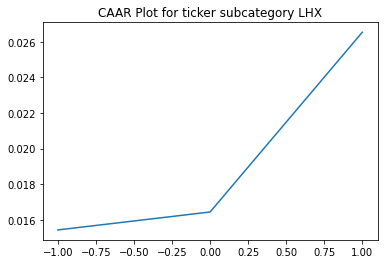

         ARR      CAAR        sd    t_stat   p_value
-1  0.015434  0.015434  0.005655  3.859674  0.161393
 0  0.001006  0.016441  0.014821  1.568770  0.361279
 1  0.010093  0.026533  0.018611  2.016218  0.293116
CAR FOR Different tickers GROUP MPC
We found AR for 33 events
AR.shape[1] is 33


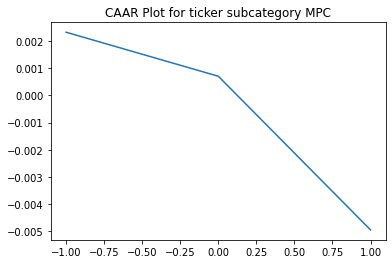

         ARR      CAAR        sd    t_stat   p_value
-1  0.002317  0.002317  0.017080  0.779406  0.441467
 0 -0.001617  0.000701  0.025803  0.156021  0.876997
 1 -0.005645 -0.004944  0.034034 -0.834535  0.410167
CAR FOR Different tickers GROUP TGT
We found AR for 32 events
AR.shape[1] is 32


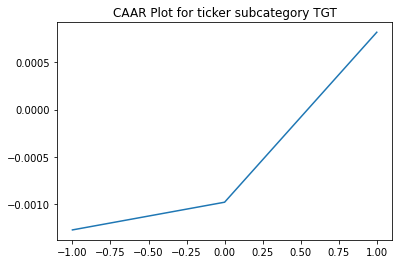

         ARR      CAAR        sd    t_stat   p_value
-1 -0.001276 -0.001276  0.014248 -0.506623  0.616004
 0  0.000294 -0.000982  0.032124 -0.172992  0.863782
 1  0.001801  0.000819  0.041804  0.110804  0.912486
CAR FOR Different tickers GROUP WBA
We found AR for 22 events
AR.shape[1] is 22


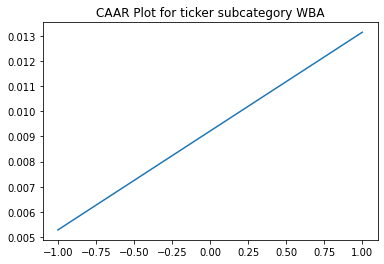

         ARR      CAAR        sd    t_stat   p_value
-1  0.005279  0.005279  0.018595  1.331664  0.197245
 0  0.003937  0.009216  0.032029  1.349582  0.191520
 1  0.003932  0.013148  0.041170  1.497888  0.149044
CAR FOR Different tickers GROUP COP
We found AR for 7 events
AR.shape[1] is 7


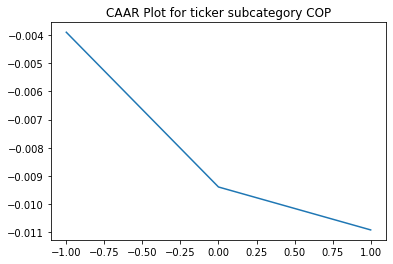

         ARR      CAAR        sd    t_stat   p_value
-1 -0.003903 -0.003903  0.016474 -0.626853  0.553843
 0 -0.005488 -0.009391  0.024800 -1.001930  0.355057
 1 -0.001523 -0.010914  0.029897 -0.965853  0.371418
CAR FOR Different tickers GROUP PFE
We found AR for 30 events
AR.shape[1] is 30


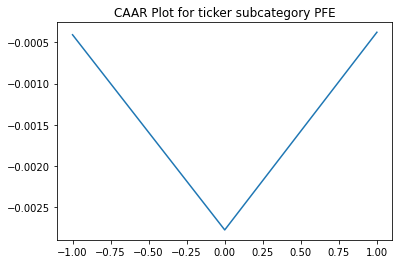

         ARR      CAAR        sd    t_stat   p_value
-1 -0.000408 -0.000408  0.008317 -0.268558  0.790171
 0 -0.002367 -0.002775  0.015873 -0.957558  0.346201
 1  0.002398 -0.000377  0.019211 -0.107584  0.915066


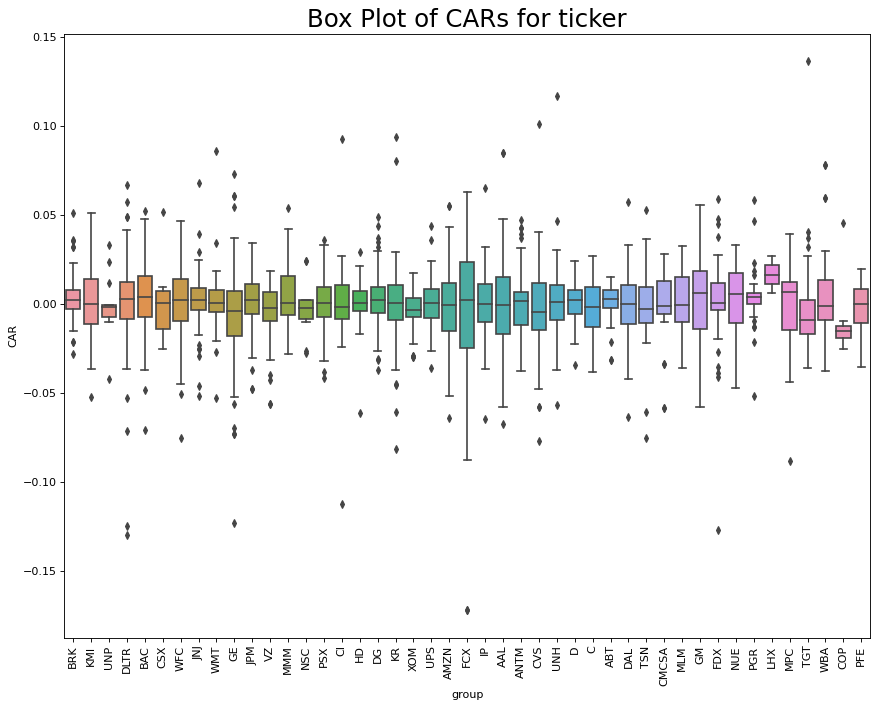

In [ ]:
es_win = 200
ev_win = [-1,1]
end_time = 1
a = CAAR_by_category(df, events, 'ticker',\
                     cat_name='Different tickers', cat_members=ticker_lst,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different tickers GROUP BRK
We found AR for 130 events
AR.shape[1] is 130


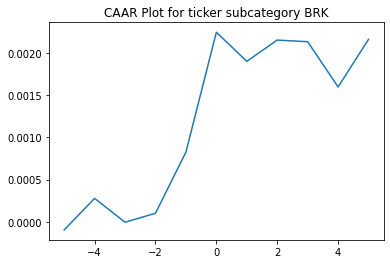

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000097 -0.000097  0.006404 -0.173247  0.862729
-4  0.000374  0.000276  0.010896  0.289174  0.772912
-3 -0.000282 -0.000006  0.014070 -0.004929  0.996075
-2  0.000106  0.000100  0.015886  0.071717  0.942938
-1  0.000725  0.000825  0.018104  0.519294  0.604445
 0  0.001420  0.002245  0.019589  1.306518  0.193701
 1 -0.000344  0.001900  0.021601  1.003036  0.317721
 2  0.000252  0.002152  0.023415  1.047790  0.296694
 3 -0.000019  0.002133  0.022529  1.079272  0.282480
 4 -0.000536  0.001597  0.023502  0.774592  0.439998
 5  0.000564  0.002161  0.024489  1.006098  0.316252
CAR FOR Different tickers GROUP KMI
We found AR for 111 events
AR.shape[1] is 111


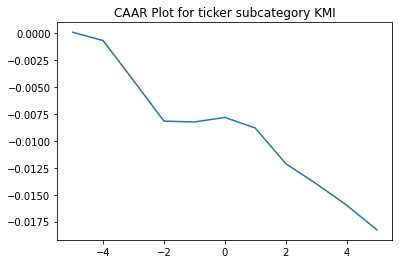

         ARR      CAAR        sd    t_stat       p_value
-5  0.000109  0.000109  0.013234  0.087125  9.307306e-01
-4 -0.000775 -0.000666  0.019233 -0.364713  7.160259e-01
-3 -0.003721 -0.004387  0.022152 -2.086293  3.926387e-02
-2 -0.003770 -0.008156  0.022593 -3.803436  2.347985e-04
-1 -0.000079 -0.008235  0.024133 -3.595210  4.867073e-04
 0  0.000425 -0.007810  0.027218 -3.023286  3.111742e-03
 1 -0.000990 -0.008800  0.028853 -3.213425  1.721231e-03
 2 -0.003307 -0.012107  0.031970 -3.989834  1.194991e-04
 3 -0.001862 -0.013969  0.033618 -4.377679  2.744151e-05
 4 -0.002001 -0.015970  0.035021 -4.804353  4.941861e-06
 5 -0.002303 -0.018272  0.036668 -5.250154  7.478941e-07
CAR FOR Different tickers GROUP UNP
We found AR for 12 events
AR.shape[1] is 12


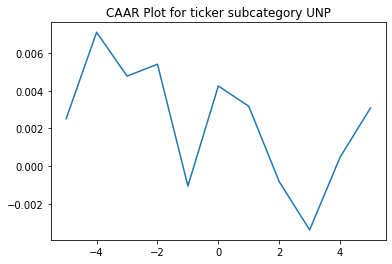

         ARR      CAAR        sd    t_stat   p_value
-5  0.002515  0.002515  0.008447  1.031365  0.324513
-4  0.004592  0.007107  0.026405  0.932405  0.371141
-3 -0.002329  0.004778  0.026789  0.617838  0.549260
-2  0.000631  0.005409  0.037867  0.494815  0.630465
-1 -0.006467 -0.001058  0.037324 -0.098158  0.923572
 0  0.005312  0.004255  0.043886  0.335830  0.743318
 1 -0.001079  0.003175  0.039573  0.277956  0.786201
 2 -0.004001 -0.000826  0.037039 -0.077225  0.939831
 3 -0.002564 -0.003390  0.040495 -0.290005  0.777206
 4  0.003863  0.000473  0.045996  0.035598  0.972241
 5  0.002614  0.003087  0.042131  0.253832  0.804307
CAR FOR Different tickers GROUP DLTR
We found AR for 222 events
AR.shape[1] is 222


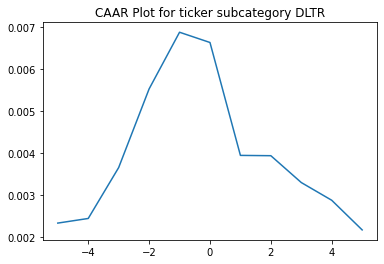

         ARR      CAAR        sd    t_stat   p_value
-5  0.002330  0.002330  0.017965  1.932609  0.054562
-4  0.000110  0.002440  0.025302  1.437010  0.152129
-3  0.001212  0.003652  0.029487  1.845481  0.066305
-2  0.001873  0.005525  0.030224  2.723789  0.006970
-1  0.001350  0.006875  0.034413  2.976687  0.003238
 0 -0.000244  0.006631  0.037946  2.603728  0.009847
 1 -0.002689  0.003942  0.045877  1.280386  0.201752
 2 -0.000007  0.003935  0.049397  1.186901  0.236541
 3 -0.000639  0.003296  0.053942  0.910347  0.363631
 4 -0.000422  0.002874  0.058175  0.736051  0.462480
 5 -0.000706  0.002168  0.062397  0.517613  0.605246
CAR FOR Different tickers GROUP BAC
We found AR for 186 events
AR.shape[1] is 186


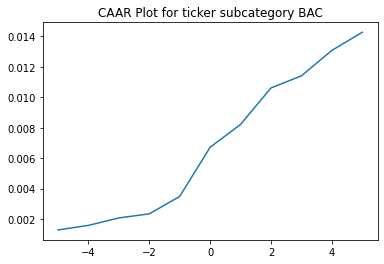

         ARR      CAAR        sd    t_stat       p_value
-5  0.001287  0.001287  0.011848  1.481234  1.402453e-01
-4  0.000297  0.001583  0.018910  1.142039  2.549139e-01
-3  0.000490  0.002073  0.022948  1.232146  2.194582e-01
-2  0.000269  0.002342  0.025885  1.233932  2.187935e-01
-1  0.001142  0.003484  0.028125  1.689220  9.286184e-02
 0  0.003233  0.006716  0.030500  3.003166  3.041536e-03
 1  0.001499  0.008216  0.031403  3.567944  4.582568e-04
 2  0.002397  0.010613  0.033668  4.298898  2.772857e-05
 3  0.000797  0.011409  0.036250  4.292501  2.846495e-05
 4  0.001670  0.013079  0.036805  4.846523  2.651063e-06
 5  0.001194  0.014273  0.038132  5.104933  8.176818e-07
CAR FOR Different tickers GROUP CSX
We found AR for 9 events
AR.shape[1] is 9


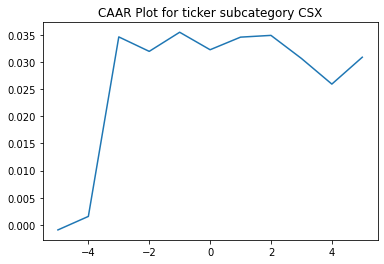

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000935 -0.000935  0.006884 -0.407452  0.694361
-4  0.002486  0.001551  0.033317  0.139626  0.892406
-3  0.033051  0.034601  0.062535  1.659926  0.135510
-2 -0.002663  0.031938  0.055796  1.717216  0.124269
-1  0.003521  0.035459  0.069018  1.541283  0.161817
 0 -0.003222  0.032237  0.072641  1.331370  0.219754
 1  0.002320  0.034558  0.084967  1.220154  0.257151
 2  0.000323  0.034881  0.088722  1.179451  0.272102
 3 -0.004245  0.030636  0.086735  1.059648  0.320247
 4 -0.004725  0.025911  0.085212  0.912250  0.388300
 5  0.004950  0.030861  0.074467  1.243280  0.248964
CAR FOR Different tickers GROUP WFC
We found AR for 164 events
AR.shape[1] is 164


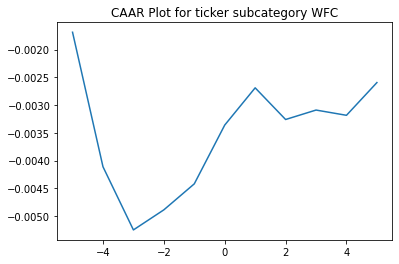

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001688 -0.001688  0.009876 -2.189448  0.029986
-4 -0.002421 -0.004109  0.015115 -3.481804  0.000639
-3 -0.001137 -0.005247  0.018456 -3.640552  0.000365
-2  0.000361 -0.004885  0.022596 -2.768713  0.006280
-1  0.000468 -0.004417  0.025054 -2.257877  0.025280
 0  0.001058 -0.003360  0.028202 -1.525513  0.129069
 1  0.000670 -0.002689  0.030272 -1.137631  0.256944
 2 -0.000570 -0.003259  0.031389 -1.329692  0.185477
 3  0.000170 -0.003089  0.032478 -1.218066  0.224959
 4 -0.000094 -0.003184  0.035317 -1.154403  0.250025
 5  0.000589 -0.002595  0.037630 -0.882964  0.378556
CAR FOR Different tickers GROUP JNJ
We found AR for 105 events
AR.shape[1] is 105


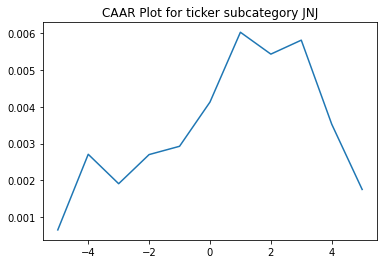

         ARR      CAAR        sd    t_stat   p_value
-5  0.000654  0.000654  0.010487  0.638830  0.524338
-4  0.002055  0.002709  0.014084  1.971127  0.051366
-3 -0.000800  0.001909  0.018021  1.085611  0.280161
-2  0.000792  0.002701  0.024101  1.148440  0.253421
-1  0.000225  0.002926  0.026127  1.147701  0.253725
 0  0.001202  0.004128  0.029622  1.427968  0.156297
 1  0.001898  0.006026  0.031888  1.936293  0.055546
 2 -0.000595  0.005431  0.033128  1.679910  0.095976
 3  0.000379  0.005810  0.031878  1.867713  0.064618
 4 -0.002283  0.003527  0.033525  1.078134  0.283468
 5 -0.001774  0.001753  0.034842  0.515679  0.607173
CAR FOR Different tickers GROUP WMT
We found AR for 102 events
AR.shape[1] is 102


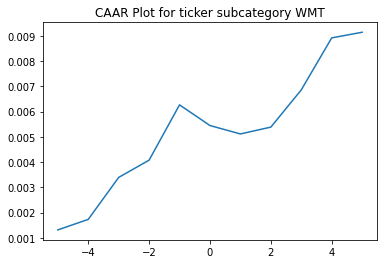

         ARR      CAAR        sd    t_stat   p_value
-5  0.001312  0.001312  0.010141  1.306503  0.194349
-4  0.000417  0.001729  0.015195  1.149193  0.253190
-3  0.001663  0.003392  0.019140  1.789649  0.076507
-2  0.000685  0.004076  0.021456  1.918698  0.057846
-1  0.002191  0.006267  0.022316  2.836118  0.005518
 0 -0.000819  0.005448  0.023506  2.340675  0.021214
 1 -0.000333  0.005115  0.026059  1.982279  0.050165
 2  0.000271  0.005386  0.024174  2.250009  0.026617
 3  0.001476  0.006861  0.027513  2.518672  0.013349
 4  0.002060  0.008921  0.027835  3.236953  0.001635
 5  0.000223  0.009144  0.027762  3.326594  0.001227
CAR FOR Different tickers GROUP GE
We found AR for 140 events
AR.shape[1] is 140


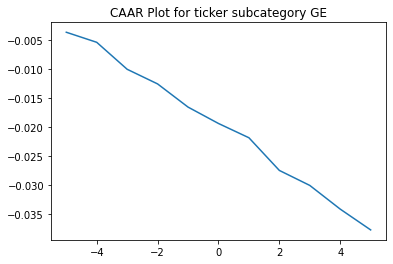

         ARR      CAAR        sd    t_stat       p_value
-5 -0.003709 -0.003709  0.019457 -2.255430  2.566860e-02
-4 -0.001733 -0.005442  0.029812 -2.159876  3.249750e-02
-3 -0.004644 -0.010086  0.034006 -3.509229  6.060398e-04
-2 -0.002519 -0.012605  0.034493 -4.323878  2.905384e-05
-1 -0.003989 -0.016594  0.038842 -5.054736  1.334939e-06
 0 -0.002821 -0.019415  0.042815 -5.365449  3.290609e-07
 1 -0.002457 -0.021872  0.046492 -5.566287  1.296182e-07
 2 -0.005625 -0.027497  0.054687 -5.949311  2.077895e-08
 3 -0.002582 -0.030079  0.059396 -5.991900  1.688178e-08
 4 -0.004078 -0.034157  0.066964 -6.035356  1.364641e-08
 5 -0.003581 -0.037738  0.070468 -6.336554  3.054655e-09
CAR FOR Different tickers GROUP JPM
We found AR for 138 events
AR.shape[1] is 138


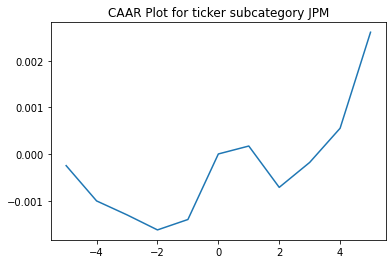

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000245 -0.000245  0.009349 -0.308103  0.758472
-4 -0.000755 -0.001001  0.014641 -0.802858  0.423448
-3 -0.000299 -0.001299  0.017609 -0.866844  0.387543
-2 -0.000322 -0.001621  0.020291 -0.938758  0.349507
-1  0.000223 -0.001398  0.021106 -0.778317  0.437724
 0  0.001403  0.000005  0.024306  0.002453  0.998046
 1  0.000170  0.000175  0.026114  0.078621  0.937449
 2 -0.000885 -0.000710  0.028038 -0.297554  0.766494
 3  0.000534 -0.000176  0.030151 -0.068725  0.945309
 4  0.000732  0.000555  0.032222  0.202406  0.839899
 5  0.002056  0.002612  0.032230  0.951862  0.342843
CAR FOR Different tickers GROUP VZ
We found AR for 79 events
AR.shape[1] is 79


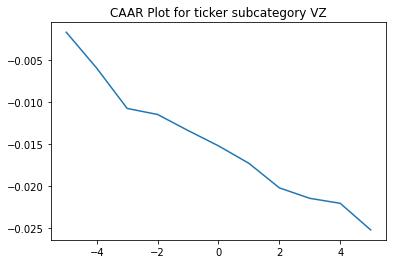

         ARR      CAAR        sd    t_stat       p_value
-5 -0.001709 -0.001709  0.011156 -1.361768  1.771913e-01
-4 -0.004277 -0.005986  0.017399 -3.058022  3.051954e-03
-3 -0.004794 -0.010780  0.021227 -4.513853  2.222379e-05
-2 -0.000721 -0.011501  0.023268 -4.393188  3.477893e-05
-1 -0.001908 -0.013408  0.024832 -4.799390  7.519515e-06
 0 -0.001827 -0.015235  0.026770 -5.058374  2.739458e-06
 1 -0.002081 -0.017316  0.030457 -5.053266  2.795213e-06
 2 -0.002921 -0.020236  0.030044 -5.986778  6.170270e-08
 3 -0.001247 -0.021483  0.030327 -6.296233  1.660628e-08
 4 -0.000593 -0.022077  0.030143 -6.509833  6.638667e-09
 5 -0.003168 -0.025244  0.031591 -7.102631  5.021340e-10
CAR FOR Different tickers GROUP MMM
We found AR for 68 events
AR.shape[1] is 68


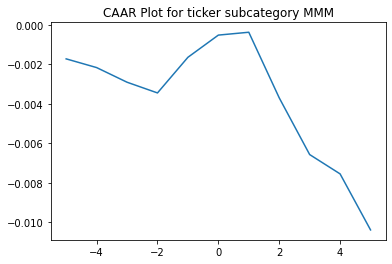

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001714 -0.001714  0.018591 -0.760247  0.449774
-4 -0.000442 -0.002156  0.021827 -0.814678  0.418143
-3 -0.000743 -0.002900  0.023861 -1.002103  0.319899
-2 -0.000544 -0.003444  0.031446 -0.903068  0.369725
-1  0.001809 -0.001634  0.032998 -0.408405  0.684279
 0  0.001127 -0.000507  0.034443 -0.121429  0.903715
 1  0.000145 -0.000362  0.035123 -0.085038  0.932484
 2 -0.003331 -0.003694  0.036981 -0.823630  0.413072
 3 -0.002880 -0.006573  0.040094 -1.351940  0.180941
 4 -0.000981 -0.007555  0.041379 -1.505492  0.136898
 5 -0.002845 -0.010399  0.044933 -1.908480  0.060615
CAR FOR Different tickers GROUP NSC
We found AR for 12 events
AR.shape[1] is 12


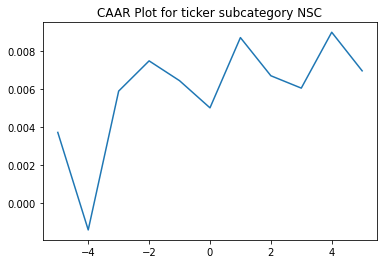

         ARR      CAAR        sd    t_stat   p_value
-5  0.003714  0.003714  0.008042  1.599738  0.137962
-4 -0.005151 -0.001437  0.013699 -0.363367  0.723218
-3  0.007333  0.005896  0.020653  0.989010  0.343914
-2  0.001596  0.007492  0.024179  1.073418  0.306067
-1 -0.001046  0.006446  0.029427  0.758803  0.463920
 0 -0.001435  0.005011  0.026590  0.652871  0.527249
 1  0.003711  0.008723  0.028856  1.047162  0.317489
 2 -0.002016  0.006707  0.031517  0.737173  0.476447
 3 -0.000654  0.006053  0.033129  0.632965  0.539692
 4  0.002952  0.009005  0.040367  0.772767  0.455944
 5 -0.002039  0.006966  0.044921  0.537183  0.601838
CAR FOR Different tickers GROUP PSX
We found AR for 96 events
AR.shape[1] is 96


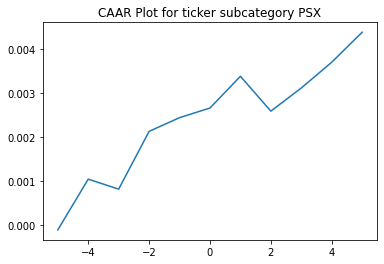

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000108 -0.000108  0.009651 -0.109688  0.912889
-4  0.001151  0.001043  0.013388  0.763340  0.447152
-3 -0.000227  0.000816  0.016375  0.488267  0.626486
-2  0.001310  0.002126  0.019208  1.084323  0.280966
-1  0.000311  0.002436  0.020968  1.138517  0.257768
 0  0.000219  0.002655  0.023400  1.111819  0.269022
 1  0.000719  0.003375  0.025904  1.276402  0.204925
 2 -0.000790  0.002585  0.029207  0.867019  0.388116
 3  0.000524  0.003109  0.030725  0.991344  0.324036
 4  0.000585  0.003693  0.032466  1.114672  0.267803
 5  0.000679  0.004373  0.034281  1.249759  0.214458
CAR FOR Different tickers GROUP CI
We found AR for 52 events
AR.shape[1] is 52


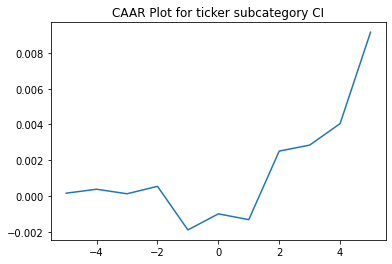

         ARR      CAAR        sd    t_stat   p_value
-5  0.000158  0.000158  0.018182  0.062691  0.950258
-4  0.000221  0.000379  0.026435  0.103346  0.918094
-3 -0.000253  0.000126  0.033990  0.026631  0.978858
-2  0.000416  0.000542  0.030798  0.126857  0.899552
-1 -0.002438 -0.001896  0.045599 -0.299827  0.765528
 0  0.000898 -0.000998  0.046086 -0.156105  0.876567
 1 -0.000324 -0.001321  0.048230 -0.197569  0.844168
 2  0.003834  0.002512  0.047505  0.381339  0.704536
 3  0.000334  0.002846  0.043869  0.467866  0.641874
 4  0.001203  0.004050  0.047573  0.613830  0.542056
 5  0.005108  0.009158  0.048494  1.361749  0.179263
CAR FOR Different tickers GROUP HD
We found AR for 85 events
AR.shape[1] is 85


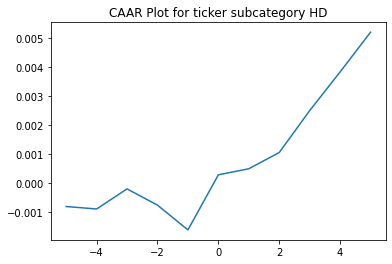

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000800 -0.000800  0.008554 -0.862514  0.390861
-4 -0.000084 -0.000885  0.010938 -0.745756  0.457896
-3  0.000691 -0.000194  0.013543 -0.131922  0.895361
-2 -0.000558 -0.000752  0.013329 -0.520223  0.604276
-1 -0.000853 -0.001606  0.017106 -0.865363  0.389304
 0  0.001896  0.000291  0.019129  0.140089  0.888925
 1  0.000210  0.000501  0.020926  0.220587  0.825949
 2  0.000558  0.001058  0.021734  0.448999  0.654588
 3  0.001442  0.002501  0.023396  0.985438  0.327239
 4  0.001333  0.003834  0.023784  1.486150  0.140983
 5  0.001366  0.005200  0.024370  1.967228  0.052458
CAR FOR Different tickers GROUP DG
We found AR for 74 events
AR.shape[1] is 74


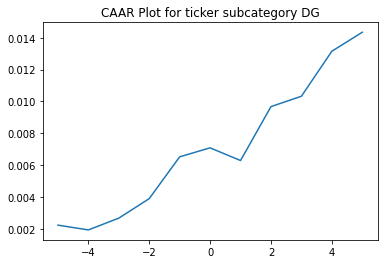

         ARR      CAAR        sd    t_stat   p_value
-5  0.002238  0.002238  0.016192  1.189173  0.238225
-4 -0.000299  0.001939  0.020916  0.797584  0.427699
-3  0.000739  0.002678  0.026449  0.871105  0.386553
-2  0.001225  0.003903  0.028865  1.163238  0.248521
-1  0.002623  0.006526  0.028416  1.975575  0.051983
 0  0.000564  0.007090  0.028426  2.145593  0.035231
 1 -0.000797  0.006293  0.032062  1.688574  0.095569
 2  0.003383  0.009676  0.032661  2.548616  0.012918
 3  0.000652  0.010328  0.036085  2.462145  0.016172
 4  0.002823  0.013152  0.037915  2.983864  0.003869
 5  0.001193  0.014344  0.038508  3.204385  0.002008
CAR FOR Different tickers GROUP KR
We found AR for 80 events
AR.shape[1] is 80


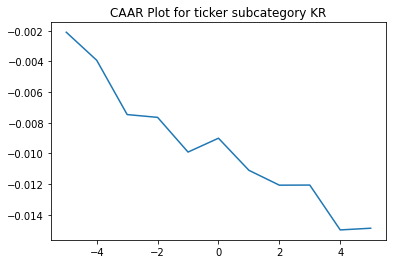

         ARR      CAAR        sd    t_stat   p_value
-5 -0.002099 -0.002099  0.014769 -1.271488  0.207286
-4 -0.001828 -0.003928  0.023277 -1.509349  0.135199
-3 -0.003537 -0.007465  0.029216 -2.285313  0.024976
-2 -0.000183 -0.007647  0.032413 -2.110273  0.037999
-1 -0.002261 -0.009909  0.035774 -2.477332  0.015371
 0  0.000903 -0.009006  0.040211 -2.003203  0.048585
 1 -0.002092 -0.011098  0.042352 -2.343738  0.021606
 2 -0.000968 -0.012066  0.049454 -2.182263  0.032061
 3  0.000007 -0.012059  0.050979 -2.115769  0.037514
 4 -0.002923 -0.014982  0.050936 -2.630857  0.010237
 5  0.000110 -0.014872  0.054032 -2.461895  0.015998
CAR FOR Different tickers GROUP XOM
We found AR for 75 events
AR.shape[1] is 75


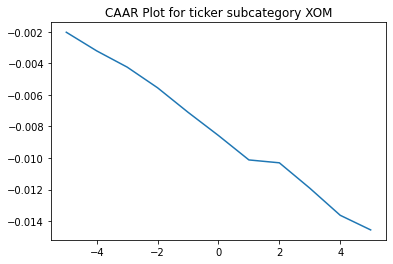

         ARR      CAAR        sd    t_stat   p_value
-5 -0.002033 -0.002033  0.007981 -2.206525  0.030450
-4 -0.001182 -0.003215  0.010084 -2.761114  0.007259
-3 -0.001027 -0.004242  0.012925 -2.842579  0.005780
-2 -0.001311 -0.005553  0.014975 -3.211480  0.001955
-1 -0.001550 -0.007103  0.016317 -3.769985  0.000326
 0 -0.001473 -0.008576  0.017824 -4.166748  0.000083
 1 -0.001546 -0.010121  0.019773 -4.432945  0.000032
 2 -0.000182 -0.010304  0.021493 -4.151623  0.000087
 3 -0.001607 -0.011910  0.021980 -4.692752  0.000012
 4 -0.001718 -0.013628  0.023591 -5.002919  0.000004
 5 -0.000926 -0.014554  0.024826 -5.077144  0.000003
CAR FOR Different tickers GROUP UPS
We found AR for 78 events
AR.shape[1] is 78


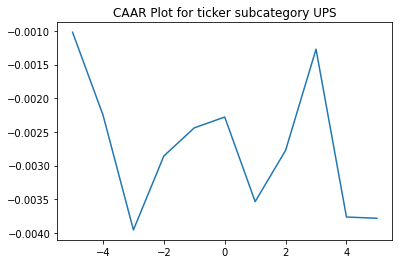

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001019 -0.001019  0.009183 -0.979839  0.330234
-4 -0.001228 -0.002247  0.017303 -1.146929  0.254962
-3 -0.001707 -0.003954  0.023697 -1.473755  0.144624
-2  0.001098 -0.002856  0.026835 -0.939978  0.350168
-1  0.000418 -0.002438  0.027686 -0.777873  0.439028
 0  0.000160 -0.002278  0.028697 -0.701084  0.485364
 1 -0.001256 -0.003534  0.032020 -0.974763  0.332730
 2  0.000760 -0.002774  0.030826 -0.794651  0.429259
 3  0.001503 -0.001270  0.033397 -0.335917  0.737847
 4 -0.002492 -0.003763  0.038315 -0.867326  0.388458
 5 -0.000019 -0.003781  0.038540 -0.866534  0.388890
CAR FOR Different tickers GROUP AMZN
We found AR for 49 events
AR.shape[1] is 49


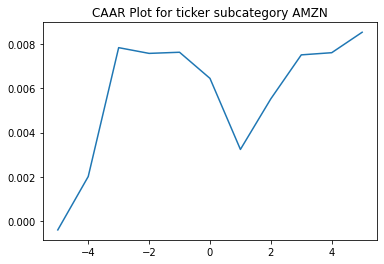

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000410 -0.000410  0.019034 -0.150920  0.880672
-4  0.002418  0.002008  0.027142  0.517831  0.606955
-3  0.005837  0.007844  0.027626  1.987642  0.052572
-2 -0.000260  0.007585  0.028116  1.888345  0.065031
-1  0.000051  0.007636  0.030054  1.778536  0.081650
 0 -0.001183  0.006453  0.035081  1.287561  0.204072
 1 -0.003218  0.003235  0.037667  0.601185  0.550545
 2  0.002293  0.005528  0.039214  0.986824  0.328677
 3  0.001989  0.007518  0.038886  1.353251  0.182315
 4  0.000098  0.007616  0.043340  1.230028  0.224681
 5  0.000926  0.008542  0.041142  1.453399  0.152620
CAR FOR Different tickers GROUP FCX
We found AR for 65 events
AR.shape[1] is 65


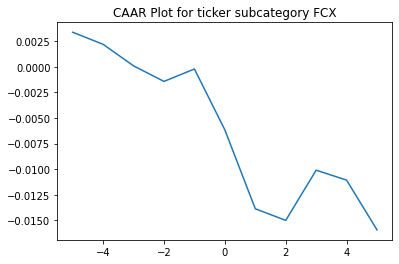

         ARR      CAAR        sd    t_stat   p_value
-5  0.003384  0.003384  0.023652  1.153440  0.253020
-4 -0.001179  0.002205  0.032670  0.544082  0.588275
-3 -0.002106  0.000099  0.044496  0.017952  0.985733
-2 -0.001519 -0.001420  0.051773 -0.221141  0.825686
-1  0.001212 -0.000208  0.058265 -0.028730  0.977169
 0 -0.005950 -0.006158  0.065963 -0.752640  0.454426
 1 -0.007707 -0.013865  0.074009 -1.510376  0.135869
 2 -0.001136 -0.015001  0.075377 -1.604489  0.113530
 3  0.004905 -0.010096  0.081166 -1.002801  0.319734
 4 -0.000972 -0.011067  0.085068 -1.048881  0.298178
 5 -0.004865 -0.015932  0.090559 -1.418420  0.160920
CAR FOR Different tickers GROUP IP
We found AR for 72 events
AR.shape[1] is 72


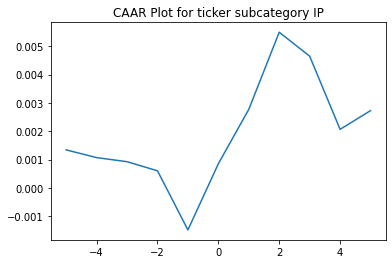

         ARR      CAAR        sd    t_stat   p_value
-5  0.001342  0.001342  0.010687  1.065679  0.290179
-4 -0.000273  0.001069  0.015798  0.574095  0.567718
-3 -0.000144  0.000925  0.021484  0.365179  0.716064
-2 -0.000321  0.000603  0.026555  0.192750  0.847705
-1 -0.002087 -0.001483  0.029375 -0.428520  0.669570
 0  0.002336  0.000853  0.029975  0.241381  0.809956
 1  0.001920  0.002773  0.032401  0.726193  0.470107
 2  0.002721  0.005494  0.033821  1.378506  0.172375
 3 -0.000845  0.004650  0.033814  1.166829  0.247183
 4 -0.002584  0.002066  0.036699  0.477673  0.634351
 5  0.000662  0.002728  0.037668  0.614444  0.540886
CAR FOR Different tickers GROUP AAL
We found AR for 50 events
AR.shape[1] is 50


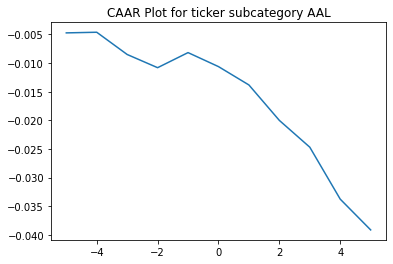

         ARR      CAAR        sd    t_stat   p_value
-5 -0.004733 -0.004733  0.015039 -2.225358  0.030691
-4  0.000111 -0.004621  0.023383 -1.397530  0.168550
-3 -0.003883 -0.008505  0.030930 -1.944362  0.057604
-2 -0.002305 -0.010810  0.035119 -2.176579  0.034360
-1  0.002634 -0.008176  0.035132 -1.645657  0.106235
 0 -0.002446 -0.010622  0.041617 -1.804747  0.077261
 1 -0.003204 -0.013826  0.046892 -2.084933  0.042308
 2 -0.006187 -0.020014  0.057697 -2.452782  0.017782
 3 -0.004678 -0.024692  0.064118 -2.723088  0.008935
 4 -0.009071 -0.033763  0.068189 -3.501184  0.000998
 5 -0.005373 -0.039137  0.071001 -3.897663  0.000295
CAR FOR Different tickers GROUP ANTM
We found AR for 58 events
AR.shape[1] is 58


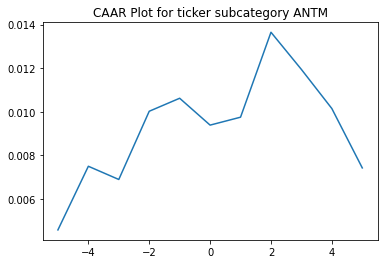

         ARR      CAAR        sd    t_stat   p_value
-5  0.004572  0.004572  0.026889  1.294847  0.200594
-4  0.002923  0.007495  0.034508  1.654089  0.103607
-3 -0.000607  0.006888  0.041673  1.258755  0.213250
-2  0.003133  0.010021  0.041617  1.833814  0.071904
-1  0.000597  0.010618  0.045365  1.782510  0.079992
 0 -0.001233  0.009385  0.045026  1.587295  0.117978
 1  0.000364  0.009749  0.042363  1.752551  0.085057
 2  0.003901  0.013649  0.041096  2.529484  0.014213
 3 -0.001709  0.011941  0.045974  1.978020  0.052768
 4 -0.001796  0.010145  0.052332  1.476401  0.145340
 5 -0.002726  0.007419  0.055227  1.023092  0.310587
CAR FOR Different tickers GROUP CVS
We found AR for 58 events
AR.shape[1] is 58


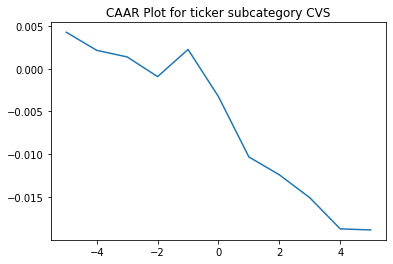

         ARR      CAAR        sd    t_stat   p_value
-5  0.004265  0.004265  0.014427  2.251401  0.028232
-4 -0.002114  0.002151  0.022664  0.722845  0.472731
-3 -0.000773  0.001378  0.027273  0.384733  0.701867
-2 -0.002302 -0.000924  0.035807 -0.196484  0.844931
-1  0.003178  0.002254  0.036534  0.469870  0.640240
 0 -0.005519 -0.003265  0.039619 -0.627672  0.532726
 1 -0.007052 -0.010317  0.047938 -1.639119  0.106697
 2 -0.002083 -0.012401  0.047031 -2.008040  0.049387
 3 -0.002678 -0.015079  0.052977 -2.167687  0.034373
 4 -0.003645 -0.018724  0.058400 -2.441707  0.017745
 5 -0.000120 -0.018844  0.061169 -2.346136  0.022470
CAR FOR Different tickers GROUP UNH
We found AR for 52 events
AR.shape[1] is 52


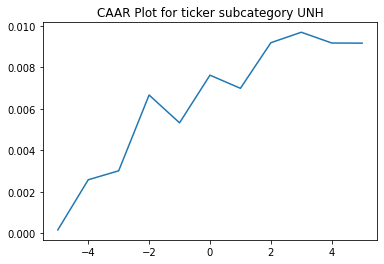

         ARR      CAAR        sd    t_stat   p_value
-5  0.000164  0.000164  0.013002  0.091204  0.927688
-4  0.002417  0.002581  0.023859  0.780090  0.438943
-3  0.000433  0.003014  0.036793  0.590635  0.557373
-2  0.003653  0.006666  0.035472  1.355210  0.181323
-1 -0.001340  0.005326  0.037679  1.019372  0.312838
 0  0.002297  0.007623  0.040776  1.348115  0.183579
 1 -0.000634  0.006990  0.045026  1.119398  0.268215
 2  0.002197  0.009187  0.048742  1.359181  0.180069
 3  0.000505  0.009692  0.048044  1.454716  0.151875
 4 -0.000518  0.009174  0.046922  1.409848  0.164654
 5 -0.000008  0.009166  0.043759  1.510507  0.137086
CAR FOR Different tickers GROUP D
We found AR for 47 events
AR.shape[1] is 47


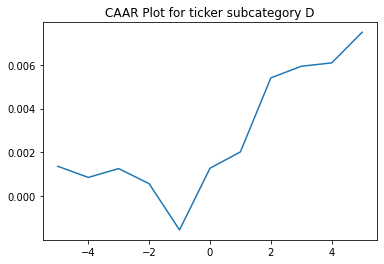

         ARR      CAAR        sd    t_stat   p_value
-5  0.001369  0.001369  0.007807  1.202044  0.235498
-4 -0.000508  0.000861  0.010574  0.557924  0.579601
-3  0.000402  0.001263  0.013035  0.664038  0.509981
-2 -0.000687  0.000576  0.016409  0.240494  0.811016
-1 -0.002108 -0.001533  0.022956 -0.457682  0.649336
 0  0.002810  0.001277  0.018551  0.472055  0.639119
 1  0.000748  0.002026  0.023443  0.592389  0.556491
 2  0.003371  0.005397  0.016842  2.196980  0.033098
 3  0.000531  0.005928  0.020292  2.002848  0.051107
 4  0.000153  0.006082  0.022000  1.895168  0.064365
 5  0.001397  0.007479  0.024839  2.064158  0.044669
CAR FOR Different tickers GROUP C
We found AR for 49 events
AR.shape[1] is 49


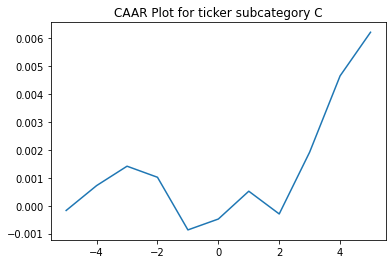

         ARR      CAAR        sd    t_stat   p_value
-5 -0.000173 -0.000173  0.009595 -0.125966  0.900285
-4  0.000893  0.000720  0.013497  0.373399  0.710496
-3  0.000696  0.001416  0.016834  0.588914  0.558681
-2 -0.000397  0.001019  0.019041  0.374601  0.709607
-1 -0.001889 -0.000870  0.023507 -0.259176  0.796607
 0  0.000391 -0.000479  0.028136 -0.119250  0.905575
 1  0.000998  0.000519  0.031031  0.117017  0.907335
 2 -0.000816 -0.000298  0.032189 -0.064711  0.948673
 3  0.002219  0.001922  0.033425  0.402494  0.689108
 4  0.002736  0.004658  0.034057  0.957370  0.343178
 5  0.001566  0.006224  0.034063  1.278943  0.207066
CAR FOR Different tickers GROUP ABT
We found AR for 30 events
AR.shape[1] is 30


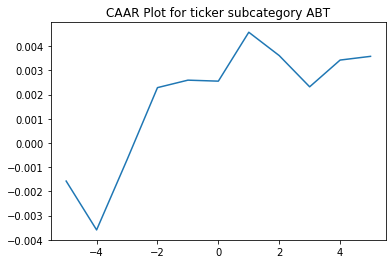

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001575 -0.001575  0.008299 -1.039343  0.307234
-4 -0.002020 -0.003594  0.011089 -1.775425  0.086325
-3  0.002902 -0.000693  0.010990 -0.345345  0.732328
-2  0.002982  0.002289  0.014866  0.843518  0.405843
-1  0.000309  0.002599  0.015995  0.889802  0.380894
 0 -0.000041  0.002557  0.016911  0.828229  0.414305
 1  0.002023  0.004580  0.014888  1.684839  0.102753
 2 -0.000965  0.003615  0.016026  1.235394  0.226599
 3 -0.001291  0.002323  0.018648  0.682391  0.500407
 4  0.001106  0.003429  0.019463  0.964996  0.342525
 5  0.000154  0.003583  0.025964  0.755845  0.455838
CAR FOR Different tickers GROUP DAL
We found AR for 45 events
AR.shape[1] is 45


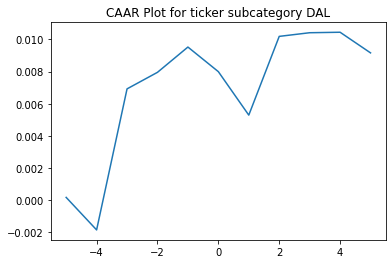

         ARR      CAAR        sd    t_stat   p_value
-5  0.000179  0.000179  0.012966  0.092632  0.926616
-4 -0.002021 -0.001842  0.018457 -0.669434  0.506717
-3  0.008765  0.006923  0.027533  1.686746  0.098731
-2  0.001029  0.007952  0.028791  1.852680  0.070643
-1  0.001571  0.009522  0.032210  1.983127  0.053617
 0 -0.001529  0.007993  0.038601  1.389069  0.171803
 1 -0.002701  0.005292  0.039977  0.887987  0.379377
 2  0.004893  0.010185  0.053440  1.278526  0.207767
 3  0.000227  0.010412  0.056395  1.238525  0.222089
 4  0.000030  0.010442  0.055824  1.254824  0.216167
 5 -0.001283  0.009160  0.054897  1.119251  0.269106
CAR FOR Different tickers GROUP TSN
We found AR for 43 events
AR.shape[1] is 43


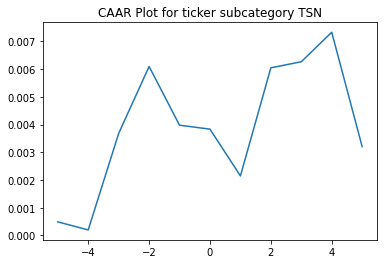

         ARR      CAAR        sd    t_stat   p_value
-5  0.000488  0.000488  0.010674  0.299671  0.765906
-4 -0.000290  0.000198  0.014027  0.092438  0.926790
-3  0.003483  0.003680  0.018003  1.340543  0.187275
-2  0.002417  0.006097  0.024881  1.606898  0.115570
-1 -0.002120  0.003977  0.028211  0.924504  0.360506
 0 -0.000142  0.003835  0.032552  0.772549  0.444115
 1 -0.001688  0.002147  0.036504  0.385702  0.701664
 2  0.003900  0.006047  0.040275  0.984623  0.330448
 3  0.000221  0.006268  0.043815  0.938081  0.353566
 4  0.001065  0.007333  0.044936  1.070082  0.290694
 5 -0.004129  0.003204  0.046672  0.450204  0.654879
CAR FOR Different tickers GROUP CMCSA
We found AR for 19 events
AR.shape[1] is 19


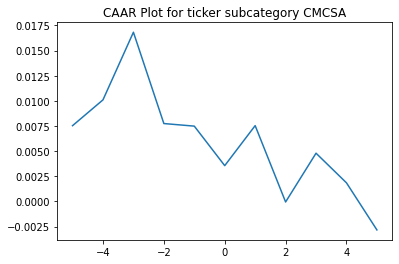

         ARR      CAAR        sd    t_stat   p_value
-5  0.007533  0.007533  0.016525  1.987102  0.062347
-4  0.002566  0.010099  0.018745  2.348388  0.030480
-3  0.006721  0.016820  0.023460  3.125042  0.005850
-2 -0.009075  0.007744  0.026595  1.269285  0.220506
-1 -0.000257  0.007488  0.030679  1.063836  0.301467
 0 -0.003928  0.003560  0.025473  0.609138  0.550045
 1  0.003978  0.007537  0.027730  1.184822  0.251496
 2 -0.007588 -0.000051  0.032728 -0.006740  0.994696
 3  0.004847  0.004797  0.033690  0.620599  0.542643
 4 -0.002945  0.001851  0.029036  0.277922  0.784240
 5 -0.004680 -0.002829  0.032141 -0.383594  0.705773
CAR FOR Different tickers GROUP MLM
We found AR for 38 events
AR.shape[1] is 38


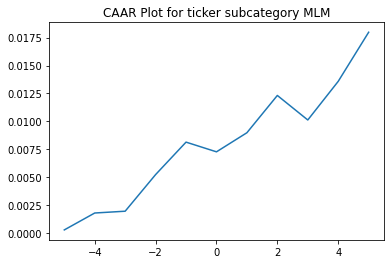

         ARR      CAAR        sd    t_stat   p_value
-5  0.000269  0.000269  0.015359  0.107980  0.914595
-4  0.001515  0.001784  0.020499  0.536571  0.594776
-3  0.000161  0.001945  0.023808  0.503699  0.617459
-2  0.003282  0.005228  0.028956  1.112878  0.272939
-1  0.002908  0.008136  0.034563  1.451028  0.155198
 0 -0.000869  0.007266  0.034348  1.304112  0.200250
 1  0.001712  0.008978  0.039943  1.385558  0.174178
 2  0.003340  0.012318  0.043876  1.730652  0.091847
 3 -0.002198  0.010121  0.051365  1.214597  0.232215
 4  0.003461  0.013582  0.052307  1.600620  0.117966
 5  0.004401  0.017982  0.053227  2.082605  0.044256
CAR FOR Different tickers GROUP GM
We found AR for 18 events
AR.shape[1] is 18


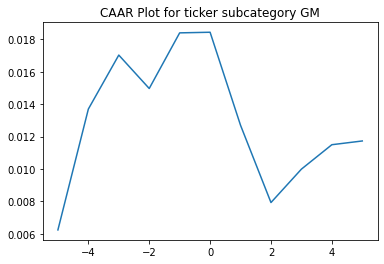

         ARR      CAAR        sd    t_stat   p_value
-5  0.006232  0.006232  0.022241  1.188859  0.250837
-4  0.007465  0.013697  0.031306  1.856266  0.080834
-3  0.003333  0.017030  0.033539  2.154258  0.045857
-2 -0.002063  0.014967  0.033495  1.895764  0.075122
-1  0.003435  0.018402  0.031819  2.453688  0.025223
 0  0.000038  0.018440  0.036736  2.129698  0.048106
 1 -0.005746  0.012694  0.037631  1.431188  0.170503
 2 -0.004771  0.007923  0.032674  1.028801  0.317990
 3  0.002063  0.009986  0.032155  1.317588  0.205123
 4  0.001508  0.011494  0.036439  1.338304  0.198423
 5  0.000231  0.011726  0.037946  1.311019  0.207285
CAR FOR Different tickers GROUP FDX
We found AR for 36 events
AR.shape[1] is 36


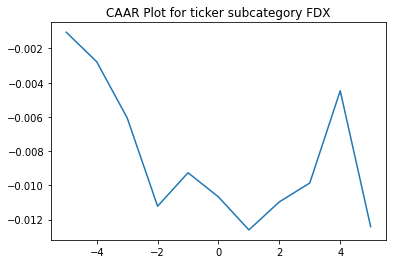

         ARR      CAAR        sd    t_stat   p_value
-5 -0.001052 -0.001052  0.017366 -0.363600  0.718344
-4 -0.001726 -0.002779  0.021141 -0.788588  0.435662
-3 -0.003276 -0.006055  0.029377 -1.236604  0.224468
-2 -0.005166 -0.011221  0.033954 -1.982776  0.055284
-1  0.001958 -0.009263  0.042751 -1.300021  0.202090
 0 -0.001414 -0.010677  0.045230 -1.416342  0.165514
 1 -0.001928 -0.012605  0.047463 -1.593429  0.120056
 2  0.001639 -0.010966  0.053160 -1.237702  0.224065
 3  0.001103 -0.009863  0.057543 -1.028433  0.310801
 4  0.005390 -0.004473  0.056903 -0.471627  0.640120
 5 -0.007941 -0.012414  0.069985 -1.064301  0.294480
CAR FOR Different tickers GROUP NUE
We found AR for 34 events
AR.shape[1] is 34


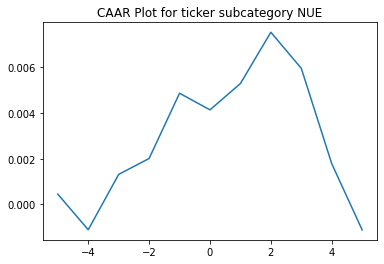

         ARR      CAAR        sd    t_stat   p_value
-5  0.000451  0.000451  0.022409  0.117359  0.907287
-4 -0.001560 -0.001109  0.028930 -0.223461  0.824554
-3  0.002425  0.001317  0.034518  0.222430  0.825350
-2  0.000696  0.002012  0.035932  0.326571  0.746055
-1  0.002859  0.004871  0.040846  0.695387  0.491681
 0 -0.000728  0.004143  0.040753  0.592757  0.557384
 1  0.001153  0.005296  0.042202  0.731751  0.469486
 2  0.002246  0.007542  0.043931  1.001089  0.324068
 3 -0.001579  0.005963  0.047379  0.733890  0.468198
 4 -0.004177  0.001786  0.047776  0.217988  0.828781
 5 -0.002902 -0.001116  0.048383 -0.134468  0.893850
CAR FOR Different tickers GROUP PGR
We found AR for 34 events
AR.shape[1] is 34


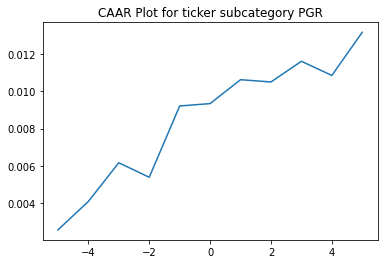

         ARR      CAAR        sd    t_stat   p_value
-5  0.002553  0.002553  0.012003  1.240274  0.223621
-4  0.001529  0.004082  0.016719  1.423744  0.163908
-3  0.002079  0.006161  0.018824  1.908389  0.065072
-2 -0.000780  0.005381  0.023092  1.358606  0.183487
-1  0.003829  0.009210  0.021789  2.464608  0.019093
 0  0.000129  0.009339  0.024927  2.184592  0.036126
 1  0.001283  0.010622  0.025925  2.389097  0.022763
 2 -0.000121  0.010501  0.033702  1.816900  0.078324
 3  0.001109  0.011610  0.031247  2.166578  0.037588
 4 -0.000758  0.010853  0.030759  2.057328  0.047628
 5  0.002319  0.013172  0.032421  2.368980  0.023843
For ticker None we have 134 NaN values     in the window
Something is wrong with LHX in 2019-08-02 00:00:00
For ticker None we have 97 NaN values     in the window
Something is wrong with LHX in 2019-06-11 00:00:00
For ticker None we have 167 NaN values     in the window
Something is wrong with LHX in 2019-09-19 00:00:00
For ticker None we have 200 NaN values   

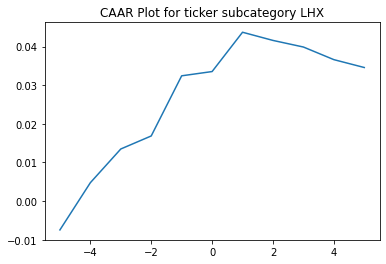

         ARR      CAAR        sd    t_stat   p_value
-5 -0.007463 -0.007463  0.005254 -2.008814  0.294049
-4  0.012223  0.004760  0.027689  0.243109  0.848177
-3  0.008725  0.013485  0.027970  0.681832  0.619029
-2  0.003374  0.016859  0.037852  0.629884  0.642154
-1  0.015566  0.032425  0.043290  1.059267  0.481683
 0  0.001102  0.033527  0.052291  0.906739  0.531113
 1  0.010175  0.043702  0.055933  1.104960  0.468282
 2 -0.002117  0.041585  0.041915  1.403098  0.394198
 3  0.004265  0.045850  0.033903  1.912566  0.306702
 4 -0.003265  0.042585  0.030638  1.965678  0.299598
 5 -0.002040  0.040545  0.028598  2.005010  0.294531
CAR FOR Different tickers GROUP MPC
We found AR for 33 events
AR.shape[1] is 33


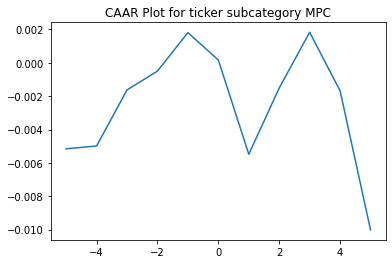

         ARR      CAAR        sd    t_stat   p_value
-5 -0.005156 -0.005156  0.026713 -1.108813  0.275775
-4  0.000171 -0.004985  0.033409 -0.857096  0.397766
-3  0.003361 -0.001623  0.029587 -0.315191  0.754663
-2  0.001128 -0.000495  0.035189 -0.080851  0.936064
-1  0.002307  0.001812  0.041938  0.248182  0.805580
 0 -0.001643  0.000168  0.055058  0.017564  0.986096
 1 -0.005651 -0.005482  0.062534 -0.503623  0.617976
 2  0.003972 -0.001510  0.081698 -0.106165  0.916114
 3  0.003344  0.001834  0.083259  0.126516  0.900115
 4 -0.003511 -0.001677  0.095468 -0.100900  0.920260
 5 -0.008342 -0.010019  0.135871 -0.423596  0.674694
CAR FOR Different tickers GROUP TGT
We found AR for 32 events
AR.shape[1] is 32


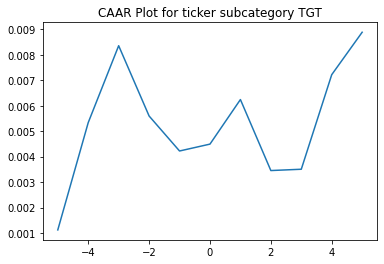

         ARR      CAAR        sd    t_stat   p_value
-5  0.001121  0.001121  0.015045  0.421313  0.676433
-4  0.004217  0.005338  0.041045  0.735676  0.467458
-3  0.003021  0.008359  0.046487  1.017231  0.316917
-2 -0.002762  0.005597  0.045533  0.695349  0.492017
-1 -0.001375  0.004222  0.048793  0.489513  0.627925
 0  0.000270  0.004493  0.059245  0.428965  0.670915
 1  0.001751  0.006244  0.069289  0.509753  0.613834
 2 -0.002790  0.003454  0.072677  0.268809  0.789858
 3  0.000052  0.003505  0.080226  0.247149  0.806423
 4  0.003716  0.007221  0.084548  0.483125  0.632402
 5  0.001668  0.008889  0.087885  0.572144  0.571351
CAR FOR Different tickers GROUP WBA
We found AR for 22 events
AR.shape[1] is 22


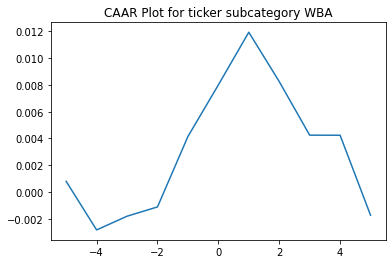

         ARR      CAAR        sd    t_stat   p_value
-5  0.000792  0.000792  0.011153  0.333250  0.742250
-4 -0.003630 -0.002838  0.017094 -0.778614  0.444892
-3  0.001024 -0.001814  0.023698 -0.359059  0.723136
-2  0.000695 -0.001119  0.028894 -0.181686  0.857572
-1  0.005264  0.004144  0.040208  0.483470  0.633765
 0  0.003859  0.008003  0.049740  0.754685  0.458819
 1  0.003938  0.011941  0.056879  0.984718  0.335973
 2 -0.003684  0.008257  0.054052  0.716503  0.481574
 3 -0.004012  0.004245  0.049312  0.403777  0.690459
 4 -0.000005  0.004240  0.055175  0.360484  0.722086
 5 -0.005977 -0.001737  0.058505 -0.139230  0.890595
CAR FOR Different tickers GROUP COP
We found AR for 7 events
AR.shape[1] is 7


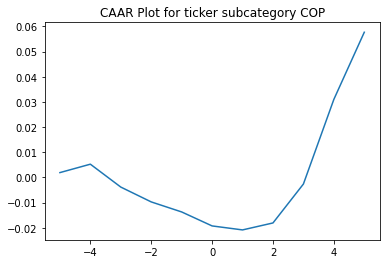

         ARR      CAAR        sd    t_stat   p_value
-5  0.001891  0.001891  0.011722  0.426740  0.684456
-4  0.003346  0.005236  0.009601  1.442864  0.199159
-3 -0.009097 -0.003860  0.014830 -0.688689  0.516749
-2 -0.005898 -0.009759  0.019068 -1.354055  0.224493
-1 -0.003989 -0.013747  0.018151 -2.003860  0.091933
 0 -0.005557 -0.019305  0.022195 -2.301211  0.060999
 1 -0.001586 -0.020891  0.025257 -2.188401  0.071232
 2  0.002771 -0.018120  0.017135 -2.797838  0.031253
 3  0.015471 -0.002649  0.022563 -0.310647  0.766577
 4  0.033635  0.030986  0.040103  2.044273  0.086929
 5  0.026696  0.057681  0.033904  4.501310  0.004098
CAR FOR Different tickers GROUP PFE
We found AR for 30 events
AR.shape[1] is 30


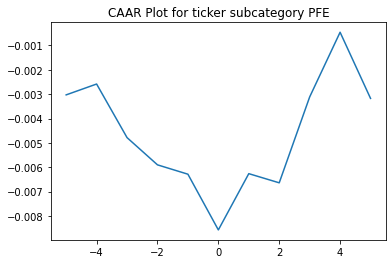

         ARR      CAAR        sd    t_stat   p_value
-5 -0.003029 -0.003029  0.012915 -1.284577  0.209107
-4  0.000446 -0.002583  0.022243 -0.636156  0.529664
-3 -0.002200 -0.004784  0.024126 -1.086052  0.286402
-2 -0.001118 -0.005902  0.027643 -1.169433  0.251752
-1 -0.000384 -0.006286  0.031745 -1.084517  0.287070
 0 -0.002288 -0.008573  0.033874 -1.386252  0.176237
 1  0.002310 -0.006263  0.034121 -1.005410  0.323015
 2 -0.000376 -0.006640  0.036713 -0.990570  0.330089
 3  0.003525 -0.003115  0.034940 -0.488313  0.629000
 4  0.002657 -0.000458  0.035365 -0.070892  0.943970
 5 -0.002716 -0.003173  0.038364 -0.453057  0.653879


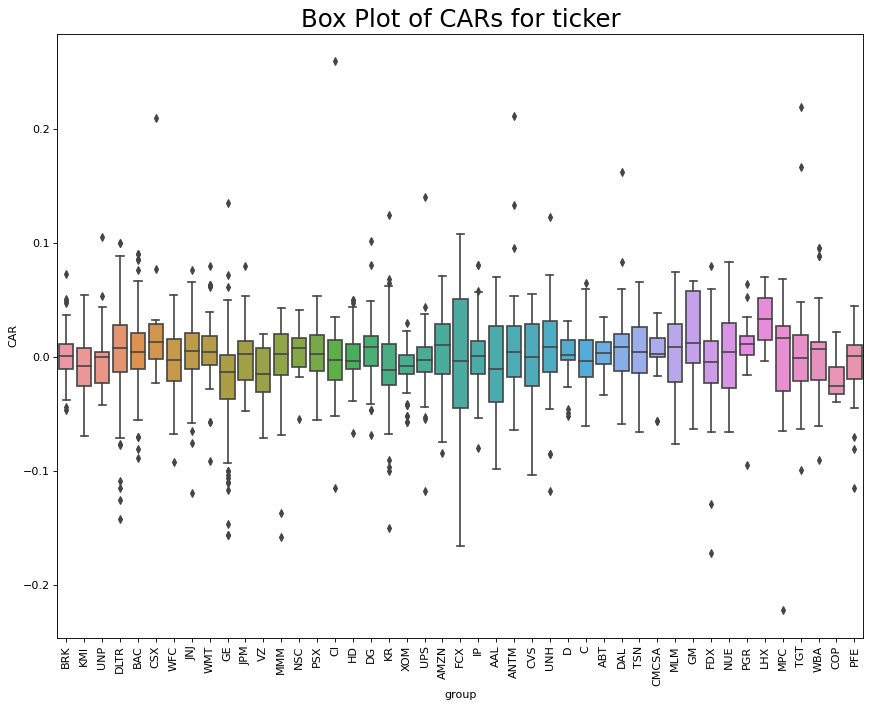

In [ ]:
es_win = 200
ev_win = [-5,5]
end_time = 5
a = CAAR_by_category(df, events, 'ticker',\
                     cat_name='Different tickers', cat_members=ticker_lst,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different tickers GROUP BRK
We found AR for 130 events
AR.shape[1] is 130


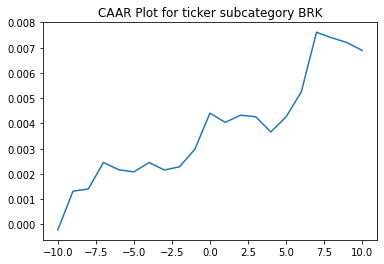

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000219 -0.000219  0.007933 -0.314520  0.753634
-9   0.001537  0.001318  0.012968  1.158603  0.248758
-8   0.000083  0.001401  0.013908  1.148223  0.253001
-7   0.001052  0.002453  0.017836  1.567863  0.119363
-6  -0.000287  0.002166  0.019175  1.288010  0.200048
-5  -0.000085  0.002081  0.019804  1.197993  0.233116
-4   0.000371  0.002451  0.021000  1.330988  0.185541
-3  -0.000297  0.002154  0.022758  1.079290  0.282473
-2   0.000128  0.002283  0.023333  1.115376  0.266763
-1   0.000690  0.002972  0.025571  1.325310  0.187411
 0   0.001436  0.004408  0.026215  1.917350  0.057404
 1  -0.000365  0.004043  0.027586  1.671110  0.097124
 2   0.000282  0.004325  0.027971  1.762935  0.080280
 3  -0.000058  0.004267  0.027450  1.772366  0.078694
 4  -0.000604  0.003663  0.029070  1.436849  0.153182
 5   0.000598  0.004262  0.030403  1.598295  0.112424
 6   0.000987  0.005249  0.030797  1.943265  0.054162
 7   0.002365  0.007614  0.0

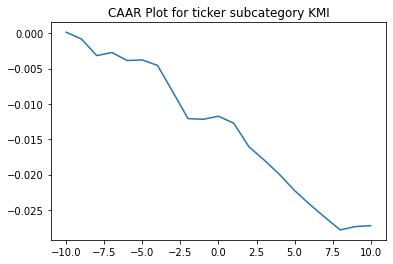

          ARR      CAAR        sd    t_stat       p_value
-10  0.000148  0.000148  0.014056  0.110571  9.121580e-01
-9  -0.000966 -0.000818  0.020310 -0.424458  6.720609e-01
-8  -0.002342 -0.003161  0.021067 -1.580618  1.168366e-01
-7   0.000439 -0.002722  0.021511 -1.333207  1.852184e-01
-6  -0.001130 -0.003852  0.021547 -1.883413  6.228538e-02
-5   0.000083 -0.003769  0.025480 -1.558566  1.219715e-01
-4  -0.000790 -0.004560  0.030190 -1.591232  1.144273e-01
-3  -0.003742 -0.008302  0.031790 -2.751316  6.943103e-03
-2  -0.003774 -0.012076  0.032702 -3.890612  1.716549e-04
-1  -0.000096 -0.012172  0.033929 -3.779712  2.554836e-04
 0   0.000436 -0.011736  0.036278 -3.408261  9.144402e-04
 1  -0.000985 -0.012721  0.037645 -3.560287  5.485097e-04
 2  -0.003333 -0.016054  0.040805 -4.145138  6.699484e-05
 3  -0.001879 -0.017933  0.041607 -4.540838  1.440922e-05
 4  -0.002022 -0.019955  0.041238 -5.098197  1.438519e-06
 5  -0.002299 -0.022254  0.041498 -5.649963  1.275284e-07
 6  -0.001963 

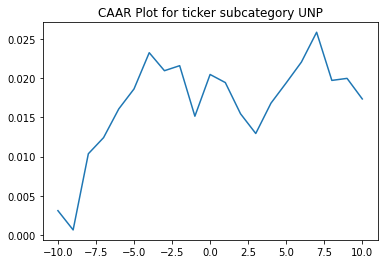

          ARR      CAAR        sd    t_stat   p_value
-10  0.003110  0.003110  0.011059  0.974121  0.350932
-9  -0.002457  0.000653  0.008506  0.265778  0.795326
-8   0.009718  0.010370  0.019787  1.815507  0.096776
-7   0.002056  0.012427  0.023776  1.810528  0.097585
-6   0.003665  0.016091  0.022054  2.527427  0.028102
-5   0.002548  0.018639  0.020594  3.135171  0.009490
-4   0.004622  0.023261  0.026748  3.012519  0.011813
-3  -0.002297  0.020964  0.027334  2.656801  0.022314
-2   0.000641  0.021605  0.039841  1.878519  0.087054
-1  -0.006446  0.015159  0.041783  1.256761  0.234872
 0   0.005325  0.020483  0.043424  1.634031  0.130520
 1  -0.001033  0.019451  0.038161  1.765670  0.105155
 2  -0.003982  0.015469  0.035650  1.503126  0.160962
 3  -0.002516  0.012953  0.037923  1.183236  0.261657
 4   0.003870  0.016824  0.043480  1.340367  0.207153
 5   0.002585  0.019409  0.038053  1.766833  0.104952
 6   0.002656  0.022065  0.034847  2.193506  0.050657
 7   0.003806  0.025871  0.0

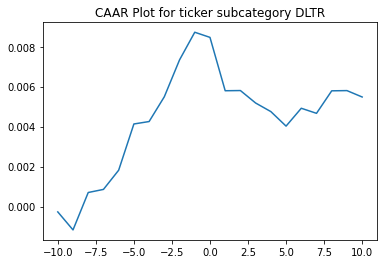

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000269 -0.000269  0.012386 -0.323646  0.746512
-9  -0.000901 -0.001170  0.022920 -0.760815  0.447579
-8   0.001873  0.000702  0.025565  0.409278  0.682732
-7   0.000154  0.000857  0.028228  0.452150  0.651604
-6   0.000961  0.001818  0.030214  0.896387  0.371021
-5   0.002313  0.004131  0.037243  1.652713  0.099809
-4   0.000122  0.004253  0.042173  1.502593  0.134372
-3   0.001241  0.005494  0.045428  1.801828  0.072935
-2   0.001844  0.007338  0.046016  2.375982  0.018356
-1   0.001384  0.008722  0.048236  2.694116  0.007599
 0  -0.000257  0.008465  0.051761  2.436668  0.015614
 1  -0.002670  0.005794  0.059082  1.461288  0.145357
 2   0.000010  0.005804  0.062658  1.380193  0.168922
 3  -0.000624  0.005180  0.066007  1.169283  0.243549
 4  -0.000429  0.004751  0.070268  1.007387  0.314850
 5  -0.000726  0.004024  0.074044  0.809818  0.418916
 6   0.000894  0.004918  0.075677  0.968257  0.333974
 7  -0.000254  0.004664  0.0

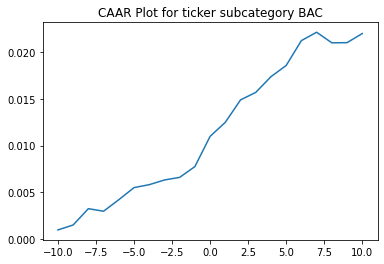

          ARR      CAAR        sd    t_stat       p_value
-10  0.000958  0.000958  0.013589  0.961419  3.375963e-01
-9   0.000526  0.001484  0.020647  0.980242  3.282467e-01
-8   0.001750  0.003234  0.025327  1.741604  8.323999e-02
-7  -0.000274  0.002960  0.030032  1.344375  1.804734e-01
-6   0.001233  0.004193  0.032471  1.761268  7.984511e-02
-5   0.001298  0.005492  0.033746  2.219519  2.766662e-02
-4   0.000314  0.005805  0.036762  2.153772  3.255191e-02
-3   0.000504  0.006309  0.038810  2.217149  2.783094e-02
-2   0.000279  0.006588  0.040120  2.239603  2.630740e-02
-1   0.001157  0.007745  0.040480  2.609340  9.813919e-03
 0   0.003237  0.010982  0.040401  3.707129  2.768678e-04
 1   0.001507  0.012489  0.039976  4.260660  3.241831e-05
 2   0.002401  0.014890  0.041398  4.905302  2.036349e-06
 3   0.000806  0.015696  0.043740  4.894141  2.141320e-06
 4   0.001682  0.017378  0.044164  5.366642  2.380999e-07
 5   0.001203  0.018582  0.045149  5.612952  7.180520e-08
 6   0.002664 

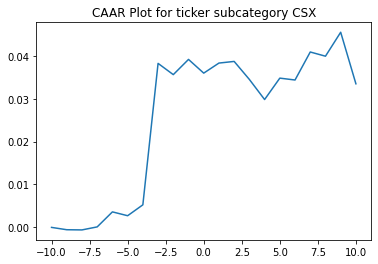

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000064 -0.000064  0.009412 -0.020525  0.984127
-9  -0.000546 -0.000610  0.015129 -0.121055  0.906633
-8  -0.000043 -0.000654  0.015658 -0.125280  0.903393
-7   0.000708  0.000054  0.017071  0.009523  0.992635
-6   0.003510  0.003564  0.019137  0.558727  0.591639
-5  -0.000899  0.002665  0.015214  0.525582  0.613431
-4   0.002547  0.005213  0.018977  0.824052  0.433789
-3   0.033074  0.038287  0.069723  1.647384  0.138094
-2  -0.002630  0.035657  0.062047  1.724013  0.122994
-1   0.003559  0.039216  0.075228  1.563884  0.156474
 0  -0.003208  0.036008  0.079913  1.351751  0.213429
 1   0.002354  0.038361  0.090807  1.267345  0.240676
 2   0.000383  0.038745  0.094445  1.230705  0.253388
 3  -0.004215  0.034530  0.091991  1.126083  0.292775
 4  -0.004697  0.029833  0.089897  0.995576  0.348612
 5   0.005006  0.034839  0.078679  1.328398  0.220690
 6  -0.000439  0.034400  0.084875  1.215911  0.258677
 7   0.006550  0.040950  0.0

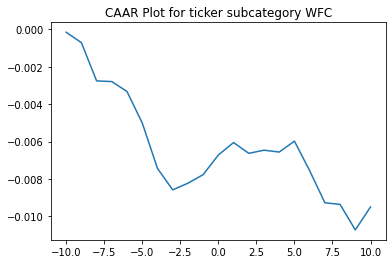

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000151 -0.000151  0.010799 -0.179445  0.857811
-9  -0.000555 -0.000706  0.017014 -0.531402  0.595864
-8  -0.002047 -0.002753  0.020736 -1.700158  0.091009
-7  -0.000036 -0.002789  0.022785 -1.567626  0.118908
-6  -0.000533 -0.003322  0.023755 -1.790877  0.075169
-5  -0.001685 -0.005007  0.026708 -2.400919  0.017480
-4  -0.002426 -0.007433  0.028070 -3.391097  0.000873
-3  -0.001144 -0.008577  0.030307 -3.624342  0.000387
-2   0.000353 -0.008224  0.032781 -3.212907  0.001584
-1   0.000459 -0.007766  0.033652 -2.955228  0.003588
 0   0.001051 -0.006715  0.034946 -2.460832  0.014904
 1   0.000665 -0.006050  0.037424 -2.070171  0.040014
 2  -0.000576 -0.006626  0.038158 -2.223795  0.027537
 3   0.000168 -0.006458  0.039099 -2.115295  0.035925
 4  -0.000099 -0.006557  0.042034 -1.997741  0.047408
 5   0.000583 -0.005974  0.044532 -1.718048  0.087687
 6  -0.001580 -0.007554  0.045636 -2.119749  0.035541
 7  -0.001715 -0.009269  0.0

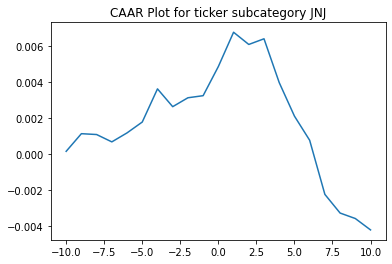

          ARR      CAAR        sd    t_stat   p_value
-10  0.000146  0.000146  0.011242  0.133042  0.894417
-9   0.000978  0.001124  0.014048  0.819829  0.414189
-8  -0.000047  0.001077  0.017411  0.633818  0.527591
-7  -0.000408  0.000669  0.022830  0.300455  0.764430
-6   0.000498  0.001168  0.025550  0.468367  0.640502
-5   0.000602  0.001770  0.028632  0.633322  0.527913
-4   0.001838  0.003607  0.028056  1.317564  0.190545
-3  -0.000987  0.002621  0.027509  0.976232  0.331215
-2   0.000494  0.003114  0.030702  1.039435  0.301013
-1   0.000116  0.003230  0.032791  1.009345  0.315152
 0   0.001616  0.004846  0.033741  1.471660  0.144132
 1   0.001900  0.006746  0.037173  1.859555  0.065775
 2  -0.000677  0.006069  0.039664  1.567903  0.119941
 3   0.000314  0.006383  0.038173  1.713500  0.089600
 4  -0.002428  0.003955  0.040473  1.001362  0.318976
 5  -0.001857  0.002098  0.039864  0.539347  0.590800
 6  -0.001339  0.000759  0.039275  0.197977  0.843450
 7  -0.002999 -0.002241  0.0

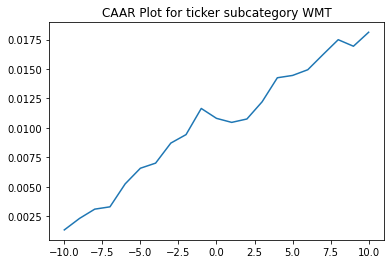

          ARR      CAAR        sd    t_stat   p_value
-10  0.001344  0.001344  0.011267  1.204573  0.231183
-9   0.000975  0.002319  0.016575  1.412925  0.160752
-8   0.000787  0.003106  0.018170  1.726459  0.087322
-7   0.000196  0.003302  0.017812  1.872495  0.064031
-6   0.001948  0.005250  0.018280  2.900560  0.004572
-5   0.001328  0.006578  0.020745  3.202291  0.001824
-4   0.000434  0.007011  0.023853  2.968614  0.003736
-3   0.001701  0.008712  0.027095  3.247439  0.001581
-2   0.000719  0.009431  0.028064  3.394045  0.000985
-1   0.002220  0.011651  0.028111  4.185890  0.000061
 0  -0.000840  0.010811  0.028969  3.769103  0.000276
 1  -0.000342  0.010469  0.031263  3.382146  0.001024
 2   0.000288  0.010757  0.030722  3.536232  0.000614
 3   0.001461  0.012218  0.034899  3.535782  0.000615
 4   0.002038  0.014256  0.034228  4.206483  0.000056
 5   0.000197  0.014453  0.033614  4.342451  0.000034
 6   0.000484  0.014937  0.034558  4.365273  0.000031
 7   0.001286  0.016223  0.0

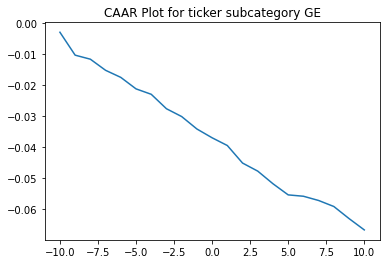

          ARR      CAAR        sd    t_stat       p_value
-10 -0.003025 -0.003025  0.021494 -1.664950  9.817523e-02
-9  -0.007373 -0.010398  0.031471 -3.909345  1.440746e-04
-8  -0.001297 -0.011695  0.037009 -3.739097  2.690919e-04
-7  -0.003576 -0.015272  0.044794 -4.033939  9.009146e-05
-6  -0.002278 -0.017550  0.049819 -4.168165  5.371158e-05
-5  -0.003693 -0.021243  0.054908 -4.577707  1.033074e-05
-4  -0.001745 -0.022988  0.059101 -4.602308  9.326193e-06
-3  -0.004647 -0.027636  0.061022 -5.358523  3.396820e-07
-2  -0.002517 -0.030153  0.057978 -6.153585  7.617783e-09
-1  -0.003997 -0.034150  0.059492 -6.791878  2.968365e-10
 0  -0.002835 -0.036985  0.062830 -6.964965  1.199594e-10
 1  -0.002485 -0.039470  0.062915 -7.422946  1.040799e-11
 2  -0.005643 -0.045113  0.072387 -7.373996  1.355742e-11
 3  -0.002601 -0.047714  0.077213 -7.311702  1.896013e-11
 4  -0.004063 -0.051777  0.086805 -7.057553  7.357650e-11
 5  -0.003581 -0.055358  0.090386 -7.246765  2.686219e-11
 6  -0.000436 

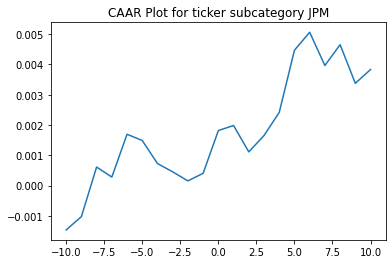

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001460 -0.001460  0.010724 -1.599201  0.112080
-9   0.000438 -0.001021  0.015219 -0.788410  0.431819
-8   0.001635  0.000614  0.017147  0.420606  0.674702
-7  -0.000331  0.000283  0.020609  0.161157  0.872207
-6   0.001412  0.001695  0.022202  0.896777  0.371411
-5  -0.000206  0.001489  0.023290  0.750969  0.453959
-4  -0.000760  0.000729  0.024742  0.345948  0.729912
-3  -0.000273  0.000456  0.026445  0.202386  0.839915
-2  -0.000298  0.000158  0.028070  0.065923  0.947535
-1   0.000250  0.000407  0.028524  0.167793  0.866994
 0   0.001410  0.001817  0.031212  0.683978  0.495144
 1   0.000167  0.001984  0.032011  0.728082  0.467806
 2  -0.000870  0.001114  0.032987  0.396756  0.692165
 3   0.000539  0.001653  0.034891  0.556534  0.578754
 4   0.000760  0.002413  0.036227  0.782478  0.435284
 5   0.002053  0.004466  0.036945  1.419968  0.157889
 6   0.000593  0.005059  0.037351  1.591184  0.113873
 7  -0.001097  0.003962  0.0

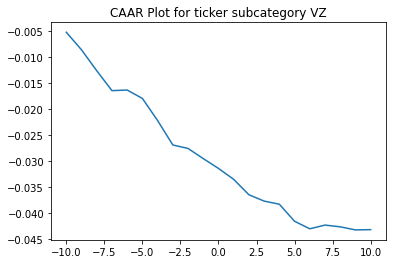

          ARR      CAAR        sd     t_stat       p_value
-10 -0.005238 -0.005238  0.015201  -3.062614  3.010514e-03
-9  -0.003375 -0.008613  0.018087  -4.232361  6.255126e-05
-8  -0.004013 -0.012626  0.020103  -5.582471  3.316084e-07
-7  -0.003824 -0.016451  0.024318  -6.012634  5.533687e-08
-6   0.000111 -0.016339  0.023670  -6.135352  3.293873e-08
-5  -0.001608 -0.017947  0.025872  -6.165671  2.896185e-08
-4  -0.004247 -0.022194  0.029040  -6.793056  1.945457e-09
-3  -0.004693 -0.026887  0.032726  -7.302468  2.082559e-10
-2  -0.000667 -0.027555  0.034409  -7.117738  4.698805e-10
-1  -0.001947 -0.029502  0.033907  -7.733300  3.086278e-11
 0  -0.001888 -0.031389  0.036281  -7.689779  3.745003e-11
 1  -0.002095 -0.033484  0.039449  -7.544132  7.148947e-11
 2  -0.002963 -0.036447  0.037491  -8.640662  5.377816e-13
 3  -0.001214 -0.037661  0.036240  -9.236794  3.749636e-14
 4  -0.000602 -0.038263  0.034955  -9.729317  4.186956e-15
 5  -0.003274 -0.041537  0.037610  -9.816278  2.846518e-

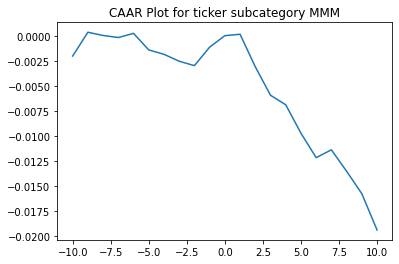

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001985 -0.001985  0.019202 -0.852306  0.397081
-9   0.002381  0.000396  0.021312  0.153309  0.878615
-8  -0.000322  0.000074  0.025011  0.024345  0.980650
-7  -0.000206 -0.000132  0.028150 -0.038801  0.969164
-6   0.000416  0.000283  0.029930  0.078025  0.938040
-5  -0.001654 -0.001371  0.033899 -0.333465  0.739825
-4  -0.000438 -0.001809  0.035590 -0.419072  0.676504
-3  -0.000693 -0.002502  0.036001 -0.573088  0.568503
-2  -0.000438 -0.002940  0.041360 -0.586098  0.559779
-1   0.001846 -0.001094  0.044183 -0.204114  0.838883
 0   0.001146  0.000053  0.048130  0.009030  0.992822
 1   0.000143  0.000196  0.048054  0.033566  0.973323
 2  -0.003249 -0.003054  0.047862 -0.526153  0.600519
 3  -0.002844 -0.005898  0.049207 -0.988367  0.326529
 4  -0.000949 -0.006847  0.050078 -1.127524  0.263543
 5  -0.002842 -0.009690  0.054702 -1.460711  0.148769
 6  -0.002441 -0.012131  0.057008 -1.754769  0.083871
 7   0.000779 -0.011352  0.0

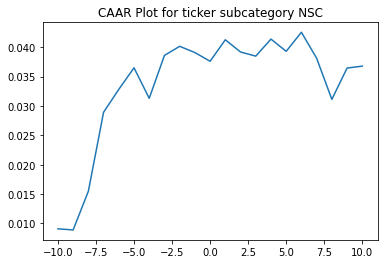

          ARR      CAAR        sd     t_stat       p_value
-10  0.009091  0.009091  0.008423   3.738515  3.274624e-03
-9  -0.000184  0.008906  0.011519   2.678356  2.147117e-02
-8   0.006581  0.015487  0.018233   2.942360  1.339110e-02
-7   0.013449  0.028937  0.017105   5.860242  1.092484e-04
-6   0.003899  0.032836  0.011572   9.829543  8.776359e-07
-5   0.003670  0.036506  0.008377  15.096650  1.065136e-08
-4  -0.005189  0.031317  0.014368   7.550159  1.127545e-05
-3   0.007297  0.038613  0.018854   7.094438  2.007560e-05
-2   0.001552  0.040165  0.018489   7.525232  1.162953e-05
-1  -0.001063  0.039102  0.024691   5.485909  1.902339e-04
 0  -0.001484  0.037618  0.025646   5.081115  3.543617e-04
 1   0.003658  0.041276  0.028593   5.000616  4.021392e-04
 2  -0.002080  0.039196  0.030950   4.387111  1.086199e-03
 3  -0.000701  0.038495  0.032150   4.147748  1.622623e-03
 4   0.002897  0.041392  0.037683   3.805056  2.917627e-03
 5  -0.002080  0.039312  0.042508   3.203629  8.400234e-

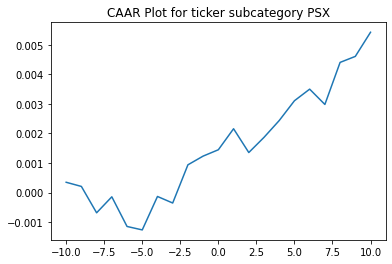

          ARR      CAAR        sd    t_stat   p_value
-10  0.000347  0.000347  0.008959  0.379501  0.705163
-9  -0.000141  0.000206  0.013390  0.150707  0.880526
-8  -0.000893 -0.000687  0.014939 -0.450399  0.653449
-7   0.000541 -0.000146  0.017512 -0.081430  0.935271
-6  -0.001004 -0.001149  0.020653 -0.545183  0.586906
-5  -0.000117 -0.001266  0.023348 -0.531345  0.596420
-4   0.001132 -0.000134  0.024525 -0.053420  0.957510
-3  -0.000222 -0.000355  0.025123 -0.138636  0.890031
-2   0.001293  0.000938  0.026517  0.346497  0.729736
-1   0.000295  0.001233  0.028497  0.423975  0.672543
 0   0.000215  0.001448  0.029909  0.474323  0.636358
 1   0.000711  0.002159  0.032522  0.650441  0.516978
 2  -0.000805  0.001354  0.035784  0.370691  0.711693
 3   0.000514  0.001868  0.037338  0.490119  0.625179
 4   0.000569  0.002437  0.038867  0.614400  0.540420
 5   0.000670  0.003107  0.039908  0.762867  0.447433
 6   0.000393  0.003500  0.040639  0.843780  0.400912
 7  -0.000518  0.002982  0.0

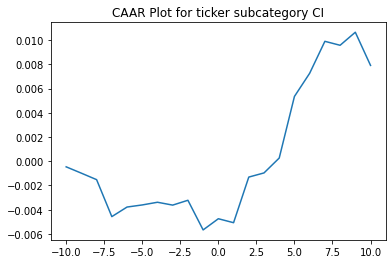

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000461 -0.000461  0.019379 -0.171549  0.864471
-9  -0.000524 -0.000985  0.025417 -0.279396  0.781071
-8  -0.000534 -0.001519  0.030703 -0.356670  0.722810
-7  -0.003050 -0.004569  0.033388 -0.986718  0.328439
-6   0.000790 -0.003779  0.037646 -0.723811  0.472489
-5   0.000174 -0.003605  0.038867 -0.668867  0.506597
-4   0.000222 -0.003383  0.040016 -0.609714  0.544758
-3  -0.000236 -0.003620  0.042627 -0.612309  0.543054
-2   0.000399 -0.003220  0.040641 -0.571404  0.570235
-1  -0.002446 -0.005666  0.047893 -0.853119  0.397582
 0   0.000923 -0.004743  0.048217 -0.709414  0.481298
 1  -0.000327 -0.005071  0.048787 -0.749479  0.457012
 2   0.003764 -0.001306  0.049321 -0.190980  0.849300
 3   0.000342 -0.000964  0.048786 -0.142458  0.887279
 4   0.001229  0.000265  0.049692  0.038420  0.969503
 5   0.005083  0.005347  0.049179  0.784062  0.436630
 6   0.001911  0.007258  0.051864  1.009162  0.317661
 7   0.002636  0.009895  0.0

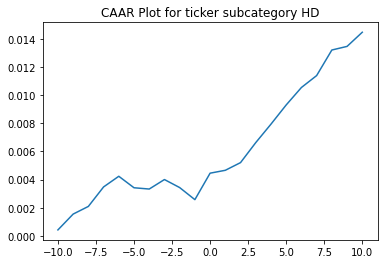

          ARR      CAAR        sd    t_stat   p_value
-10  0.000433  0.000433  0.008360  0.477769  0.634055
-9   0.001123  0.001556  0.012398  1.157123  0.250502
-8   0.000544  0.002100  0.015270  1.268073  0.208275
-7   0.001382  0.003482  0.017815  1.802126  0.075113
-6   0.000757  0.004239  0.020011  1.952980  0.054152
-5  -0.000815  0.003424  0.021902  1.441486  0.153165
-4  -0.000091  0.003334  0.022220  1.383256  0.170252
-3   0.000674  0.004007  0.023763  1.554847  0.123742
-2  -0.000570  0.003438  0.023294  1.360518  0.177306
-1  -0.000856  0.002581  0.025733  0.924805  0.357717
 0   0.001878  0.004459  0.027584  1.490466  0.139847
 1   0.000204  0.004664  0.028934  1.486037  0.141013
 2   0.000545  0.005209  0.029339  1.636920  0.105388
 3   0.001419  0.006628  0.030228  2.021652  0.046396
 4   0.001310  0.007938  0.029136  2.511890  0.013922
 5   0.001362  0.009300  0.029154  2.941098  0.004225
 6   0.001237  0.010538  0.031689  3.065862  0.002919
 7   0.000846  0.011383  0.0

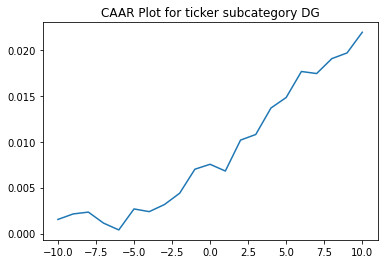

          ARR      CAAR        sd    t_stat   p_value
-10  0.001537  0.001537  0.011241  1.176088  0.243381
-9   0.000598  0.002135  0.015208  1.207717  0.231054
-8   0.000201  0.002336  0.018983  1.058603  0.293271
-7  -0.001200  0.001136  0.021781  0.448693  0.654982
-6  -0.000738  0.000398  0.026325  0.129955  0.896960
-5   0.002282  0.002680  0.030219  0.762787  0.448049
-4  -0.000293  0.002386  0.033140  0.619432  0.537561
-3   0.000772  0.003158  0.036956  0.735147  0.464605
-2   0.001232  0.004390  0.039630  0.952890  0.343790
-1   0.002613  0.007002  0.039153  1.538492  0.128252
 0   0.000538  0.007540  0.037479  1.730615  0.087746
 1  -0.000736  0.006804  0.038884  1.505151  0.136600
 2   0.003366  0.010170  0.041022  2.132615  0.036320
 3   0.000611  0.010781  0.046021  2.015266  0.047559
 4   0.002882  0.013663  0.046490  2.528223  0.013627
 5   0.001143  0.014806  0.048342  2.634788  0.010275
 6   0.002830  0.017637  0.047111  3.220407  0.001912
 7  -0.000224  0.017413  0.0

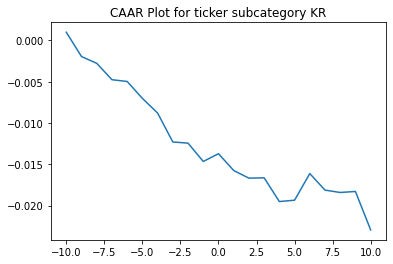

          ARR      CAAR        sd    t_stat   p_value
-10  0.000987  0.000987  0.017331  0.509350  0.611927
-9  -0.002944 -0.001957  0.022712 -0.770615  0.443233
-8  -0.000817 -0.002774  0.029498 -0.840981  0.402897
-7  -0.001986 -0.004759  0.036311 -1.172277  0.244609
-6  -0.000212 -0.004971  0.046466 -0.956943  0.341515
-5  -0.002046 -0.007017  0.047993 -1.307728  0.194759
-4  -0.001777 -0.008794  0.051593 -1.524458  0.131388
-3  -0.003501 -0.012294  0.057210 -1.922117  0.058196
-2  -0.000143 -0.012437  0.057878 -1.922054  0.058204
-1  -0.002216 -0.014653  0.062588 -2.094056  0.039461
 0   0.000938 -0.013715  0.064528 -1.901026  0.060945
 1  -0.002032 -0.015747  0.064560 -2.181551  0.032116
 2  -0.000928 -0.016674  0.071488 -2.086228  0.040185
 3   0.000041 -0.016634  0.072868 -2.041747  0.044514
 4  -0.002870 -0.019504  0.070260 -2.482929  0.015149
 5   0.000162 -0.019342  0.073189 -2.363778  0.020547
 6   0.003223 -0.016119  0.073509 -1.961355  0.053361
 7  -0.002001 -0.018121  0.0

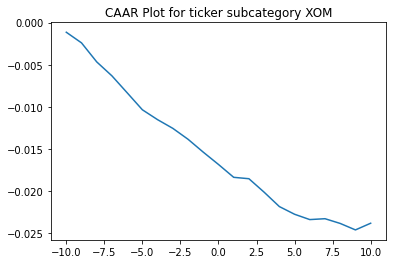

          ARR      CAAR        sd    t_stat       p_value
-10 -0.001144 -0.001144  0.005790 -1.710461  9.137026e-02
-9  -0.001264 -0.002407  0.010408 -2.002961  4.884449e-02
-8  -0.002260 -0.004667  0.012371 -3.267100  1.648676e-03
-7  -0.001662 -0.006329  0.015430 -3.552049  6.693353e-04
-6  -0.002009 -0.008338  0.018010 -4.009336  1.439139e-04
-5  -0.002020 -0.010358  0.019361 -4.633193  1.510434e-05
-4  -0.001175 -0.011533  0.020502 -4.871407  6.128338e-06
-3  -0.001032 -0.012564  0.021772 -4.997751  3.767110e-06
-2  -0.001297 -0.013861  0.021651 -5.544316  4.332394e-07
-1  -0.001531 -0.015392  0.022322 -5.971575  7.559004e-08
 0  -0.001463 -0.016855  0.024137 -6.047377  5.521981e-08
 1  -0.001528 -0.018383  0.024491 -6.500294  8.272428e-09
 2  -0.000166 -0.018549  0.026251 -6.119188  4.096813e-08
 3  -0.001602 -0.020150  0.026985 -6.466876  9.527418e-09
 4  -0.001707 -0.021858  0.028790 -6.574961  6.029916e-09
 5  -0.000913 -0.022771  0.029623 -6.657168  4.253266e-09
 6  -0.000633 

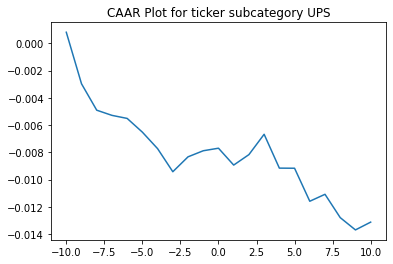

          ARR      CAAR        sd    t_stat   p_value
-10  0.000820  0.000820  0.012866  0.562791  0.575213
-9  -0.003784 -0.002965  0.017625 -1.485567  0.141477
-8  -0.001938 -0.004903  0.022034 -1.965103  0.053009
-7  -0.000380 -0.005282  0.024354 -1.915602  0.059128
-6  -0.000225 -0.005507  0.026487 -1.836242  0.070182
-5  -0.001009 -0.006516  0.027922 -2.060974  0.042682
-4  -0.001211 -0.007727  0.033617 -2.029980  0.045813
-3  -0.001694 -0.009421  0.036870 -2.256707  0.026862
-2   0.001094 -0.008327  0.038855 -1.892643  0.062164
-1   0.000446 -0.007881  0.041523 -1.676146  0.097766
 0   0.000187 -0.007694  0.041693 -1.629714  0.107246
 1  -0.001239 -0.008933  0.044572 -1.769964  0.080692
 2   0.000768 -0.008164  0.044004 -1.638608  0.105375
 3   0.001493 -0.006671  0.045373 -1.298503  0.197990
 4  -0.002485 -0.009156  0.048027 -1.683697  0.096290
 5  -0.000009 -0.009165  0.047899 -1.689799  0.095112
 6  -0.002423 -0.011588  0.048068 -2.129129  0.036440
 7   0.000510 -0.011078  0.0

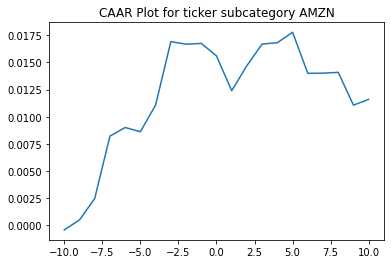

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000410 -0.000410  0.011738 -0.244360  0.807993
-9   0.000919  0.000509  0.021701  0.164168  0.870289
-8   0.001971  0.002479  0.025006  0.694097  0.490967
-7   0.005742  0.008222  0.027068  2.126234  0.038653
-6   0.000788  0.009010  0.031946  1.974343  0.054112
-5  -0.000389  0.008621  0.040252  1.499310  0.140342
-4   0.002453  0.011075  0.043446  1.784361  0.080686
-3   0.005836  0.016911  0.047495  2.492408  0.016193
-2  -0.000242  0.016669  0.045175  2.582936  0.012900
-1   0.000077  0.016746  0.047349  2.475716  0.016877
 0  -0.001152  0.015594  0.048284  2.260808  0.028342
 1  -0.003202  0.012393  0.047001  1.845664  0.071114
 2   0.002308  0.014701  0.047156  2.182177  0.034023
 3   0.001982  0.016682  0.047543  2.456197  0.017711
 4   0.000123  0.016805  0.051463  2.285767  0.026725
 5   0.000966  0.017770  0.047126  2.639578  0.011163
 6  -0.003778  0.013992  0.044405  2.205771  0.032221
 7   0.000012  0.014004  0.0

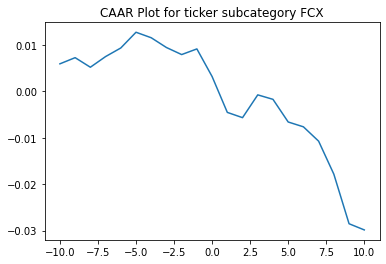

          ARR      CAAR        sd    t_stat   p_value
-10  0.005900  0.005900  0.030454  1.561837  0.123258
-9   0.001327  0.007227  0.039920  1.459584  0.149296
-8  -0.002060  0.005167  0.045194  0.921837  0.360076
-7   0.002293  0.007460  0.053642  1.121254  0.266369
-6   0.001852  0.009312  0.063439  1.183431  0.241016
-5   0.003386  0.012698  0.070501  1.452122  0.151353
-4  -0.001186  0.011513  0.075304  1.232580  0.222241
-3  -0.002103  0.009410  0.083844  0.904840  0.368944
-2  -0.001516  0.007893  0.092800  0.685765  0.495338
-1   0.001215  0.009109  0.100521  0.730556  0.467716
 0  -0.005944  0.003165  0.104328  0.244550  0.807587
 1  -0.007719 -0.004554  0.111052 -0.330621  0.742010
 2  -0.001133 -0.005688  0.114229 -0.401426  0.689444
 3   0.004905 -0.000782  0.121308 -0.051990  0.958698
 4  -0.000962 -0.001744  0.125063 -0.112448  0.910820
 5  -0.004877 -0.006621  0.128729 -0.414687  0.679758
 6  -0.001038 -0.007659  0.135339 -0.456271  0.649740
 7  -0.003091 -0.010750  0.1

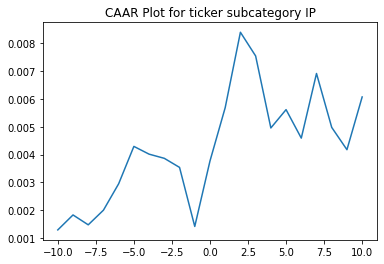

          ARR      CAAR        sd    t_stat   p_value
-10  0.001290  0.001290  0.011899  0.919746  0.360820
-9   0.000538  0.001828  0.015831  0.979818  0.330503
-8  -0.000355  0.001473  0.020556  0.608029  0.545108
-7   0.000527  0.002000  0.024750  0.685561  0.495222
-6   0.000950  0.002949  0.022503  1.112116  0.269840
-5   0.001342  0.004291  0.026321  1.383488  0.170850
-4  -0.000279  0.004013  0.027882  1.221194  0.226052
-3  -0.000150  0.003863  0.030797  1.064262  0.290816
-2  -0.000326  0.003537  0.033101  0.906675  0.367646
-1  -0.002123  0.001414  0.033556  0.357609  0.721697
 0   0.002352  0.003767  0.031427  1.017017  0.312598
 1   0.001917  0.005684  0.033386  1.444677  0.152947
 2   0.002711  0.008395  0.033936  2.098971  0.039377
 3  -0.000853  0.007542  0.035185  1.818904  0.073143
 4  -0.002588  0.004954  0.038425  1.094033  0.277638
 5   0.000659  0.005613  0.039086  1.218542  0.227052
 6  -0.001023  0.004590  0.040154  0.969859  0.335409
 7   0.002323  0.006913  0.0

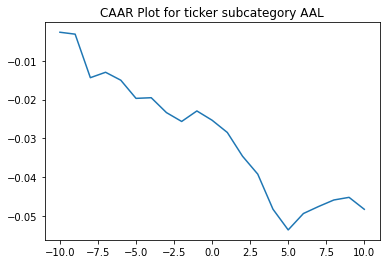

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002635 -0.002635  0.020931 -0.890306  0.377652
-9  -0.000494 -0.003130  0.022460 -0.985324  0.329306
-8  -0.011239 -0.014368  0.029713 -3.419418  0.001273
-7   0.001400 -0.012969  0.032103 -2.856544  0.006267
-6  -0.002049 -0.015018  0.036140 -2.938356  0.005019
-5  -0.004689 -0.019707  0.040438 -3.446005  0.001176
-4   0.000169 -0.019538  0.043789 -3.154953  0.002743
-3  -0.003841 -0.023379  0.047916 -3.450100  0.001162
-2  -0.002289 -0.025668  0.051621 -3.516050  0.000954
-1   0.002713 -0.022955  0.054877 -2.957827  0.004758
 0  -0.002398 -0.025353  0.063064 -2.842688  0.006505
 1  -0.003157 -0.028510  0.068314 -2.951045  0.004847
 2  -0.006133 -0.034643  0.078485 -3.121105  0.003019
 3  -0.004621 -0.039264  0.085299 -3.254878  0.002060
 4  -0.009056 -0.048320  0.087932 -3.885651  0.000306
 5  -0.005347 -0.053667  0.088528 -4.286595  0.000085
 6   0.004233 -0.049434  0.091149 -3.834951  0.000359
 7   0.001818 -0.047616  0.0

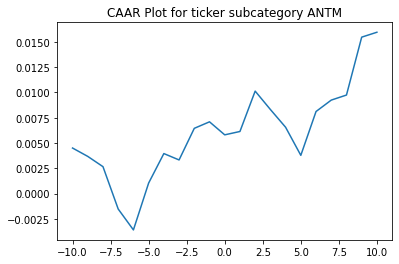

          ARR      CAAR        sd    t_stat   p_value
-10  0.004504  0.004504  0.015543  2.206888  0.031365
-9  -0.000826  0.003678  0.016920  1.655499  0.103319
-8  -0.001013  0.002665  0.025391  0.799220  0.427481
-7  -0.004181 -0.001517  0.030951 -0.373219  0.710370
-6  -0.002062 -0.003579  0.047095 -0.578806  0.565000
-5   0.004625  0.001045  0.043894  0.181357  0.856731
-4   0.002913  0.003958  0.046490  0.648403  0.519328
-3  -0.000630  0.003328  0.050615  0.500728  0.618491
-2   0.003121  0.006449  0.048401  1.014739  0.314519
-1   0.000643  0.007092  0.049700  1.086689  0.281749
 0  -0.001285  0.005807  0.047201  0.936871  0.352777
 1   0.000331  0.006138  0.044790  1.043627  0.301064
 2   0.003986  0.010124  0.044826  1.720039  0.090851
 3  -0.001814  0.008310  0.047975  1.319188  0.192381
 4  -0.001754  0.006556  0.046921  1.064096  0.291772
 5  -0.002773  0.003783  0.052027  0.553792  0.581888
 6   0.004327  0.008110  0.055031  1.122310  0.266436
 7   0.001126  0.009236  0.0

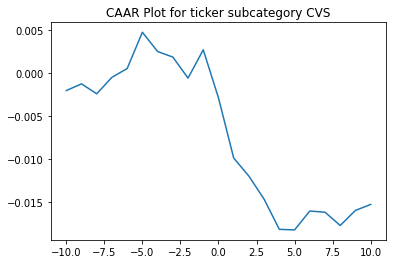

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002052 -0.002052  0.015858 -0.985664  0.328463
-9   0.000777 -0.001275  0.021123 -0.459832  0.647386
-8  -0.001153 -0.002428  0.025872 -0.714711  0.477704
-7   0.001915 -0.000513  0.029011 -0.134628  0.893380
-6   0.001014  0.000502  0.031837  0.119968  0.904931
-5   0.004213  0.004714  0.032164  1.116190  0.269024
-4  -0.002235  0.002479  0.036244  0.520820  0.604510
-3  -0.000644  0.001835  0.037726  0.370427  0.712437
-2  -0.002442 -0.000607  0.039490 -0.117122  0.907175
-1   0.003281  0.002673  0.040831  0.498606  0.619975
 0  -0.005572 -0.002899  0.041322 -0.534229  0.595261
 1  -0.006984 -0.009883  0.047979 -1.568710  0.122251
 2  -0.002099 -0.011982  0.048136 -1.895753  0.063067
 3  -0.002679 -0.014661  0.050871 -2.194844  0.032263
 4  -0.003494 -0.018155  0.053531 -2.582893  0.012389
 5  -0.000068 -0.018223  0.055360 -2.506868  0.015056
 6   0.002193 -0.016030  0.055937 -2.182510  0.033207
 7  -0.000138 -0.016169  0.0

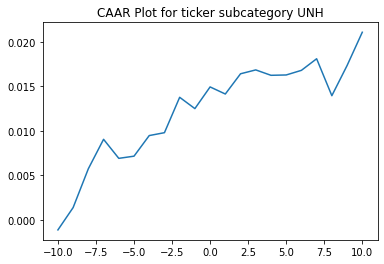

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001153 -0.001153  0.015269 -0.544310  0.588600
-9   0.002515  0.001363  0.019120  0.513941  0.609513
-8   0.004368  0.005731  0.033265  1.242273  0.219818
-7   0.003308  0.009038  0.030200  2.158170  0.035646
-6  -0.002142  0.006897  0.038963  1.276417  0.207590
-5   0.000245  0.007142  0.040756  1.263668  0.212095
-4   0.002317  0.009459  0.051505  1.324356  0.191289
-3   0.000324  0.009783  0.063705  1.107437  0.273301
-2   0.003980  0.013764  0.054411  1.824109  0.073997
-1  -0.001273  0.012491  0.051262  1.757155  0.084893
 0   0.002439  0.014930  0.047868  2.249165  0.028849
 1  -0.000798  0.014132  0.052222  1.951455  0.056506
 2   0.002276  0.016408  0.057419  2.060711  0.044448
 3   0.000436  0.016844  0.057221  2.122754  0.038650
 4  -0.000607  0.016237  0.057478  2.037109  0.046845
 5   0.000038  0.016275  0.053266  2.203260  0.032119
 6   0.000520  0.016795  0.053135  2.279258  0.026868
 7   0.001303  0.018098  0.0

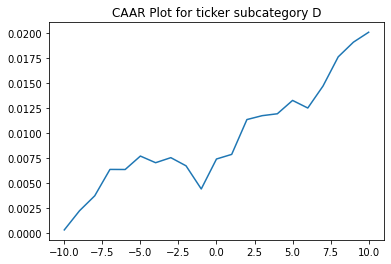

          ARR      CAAR        sd    t_stat   p_value
-10  0.000301  0.000301  0.009289  0.221788  0.825461
-9   0.001915  0.002216  0.010289  1.476462  0.146633
-8   0.001494  0.003710  0.015162  1.677427  0.100242
-7   0.002639  0.006349  0.021875  1.989605  0.052599
-6  -0.000008  0.006341  0.020030  2.170265  0.035186
-5   0.001343  0.007684  0.021118  2.494468  0.016269
-4  -0.000664  0.007020  0.019320  2.490902  0.016413
-3   0.000505  0.007525  0.019006  2.714334  0.009318
-2  -0.000817  0.006708  0.022312  2.061065  0.044976
-1  -0.002314  0.004394  0.023628  1.274859  0.208761
 0   0.002996  0.007390  0.020804  2.435116  0.018823
 1   0.000461  0.007851  0.022700  2.371132  0.021978
 2   0.003482  0.011333  0.022932  3.388126  0.001451
 3   0.000388  0.011722  0.027279  2.945836  0.005040
 4   0.000191  0.011912  0.024864  3.284565  0.001958
 5   0.001335  0.013247  0.025586  3.549449  0.000903
 6  -0.000759  0.012488  0.036577  2.340625  0.023643
 7   0.002195  0.014682  0.0

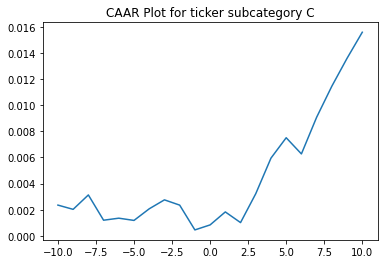

          ARR      CAAR        sd    t_stat   p_value
-10  0.002353  0.002353  0.011193  1.471691  0.147631
-9  -0.000325  0.002028  0.015480  0.917276  0.363584
-8   0.001102  0.003130  0.019035  1.151226  0.255342
-7  -0.001933  0.001197  0.024437  0.342989  0.733105
-6   0.000155  0.001353  0.027982  0.338373  0.736558
-5  -0.000171  0.001181  0.029047  0.284682  0.777113
-4   0.000889  0.002070  0.028962  0.500324  0.619133
-3   0.000684  0.002754  0.029117  0.662131  0.511054
-2  -0.000402  0.002352  0.029589  0.556411  0.580515
-1  -0.001897  0.000455  0.029016  0.109799  0.913026
 0   0.000383  0.000838  0.032269  0.181862  0.856457
 1   0.000993  0.001831  0.032972  0.388752  0.699179
 2  -0.000816  0.001015  0.034090  0.208457  0.835754
 3   0.002210  0.003225  0.036596  0.616950  0.540183
 4   0.002721  0.005947  0.035784  1.163292  0.250461
 5   0.001559  0.007505  0.036380  1.444114  0.155203
 6  -0.001237  0.006268  0.038034  1.153603  0.254375
 7   0.002803  0.009071  0.0

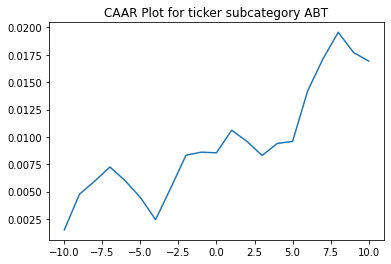

          ARR      CAAR        sd    t_stat   p_value
-10  0.001495  0.001495  0.012849  0.637312  0.528921
-9   0.003272  0.004767  0.012960  2.014809  0.053280
-8   0.001189  0.005956  0.012502  2.609304  0.014200
-7   0.001291  0.007246  0.014924  2.659435  0.012612
-6  -0.001255  0.005992  0.017439  1.881907  0.069920
-5  -0.001534  0.004458  0.018526  1.318088  0.197791
-4  -0.002027  0.002431  0.017162  0.775797  0.444150
-3   0.002909  0.005339  0.018215  1.605568  0.119205
-2   0.002987  0.008327  0.020000  2.280312  0.030124
-1   0.000275  0.008601  0.019789  2.380691  0.024068
 0  -0.000057  0.008544  0.022402  2.089033  0.045591
 1   0.002065  0.010610  0.018241  3.185708  0.003442
 2  -0.001018  0.009592  0.017034  3.084255  0.004452
 3  -0.001295  0.008297  0.020428  2.224540  0.034055
 4   0.001108  0.009404  0.019636  2.623321  0.013738
 5   0.000180  0.009585  0.026398  1.988686  0.056245
 6   0.004646  0.014231  0.027777  2.806101  0.008866
 7   0.002905  0.017135  0.0

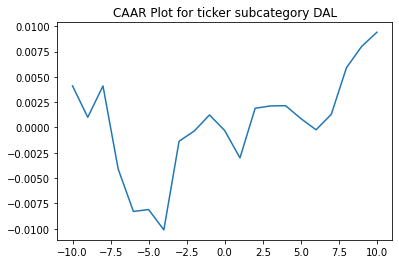

          ARR      CAAR        sd    t_stat   p_value
-10  0.004101  0.004101  0.018125  1.517955  0.136179
-9  -0.003094  0.001007  0.028895  0.233884  0.816160
-8   0.003092  0.004099  0.030291  0.907766  0.368947
-7  -0.008209 -0.004110  0.045253 -0.609263  0.545484
-6  -0.004188 -0.008298  0.054083 -1.029185  0.309017
-5   0.000185 -0.008112  0.056777 -0.958480  0.343058
-4  -0.002011 -0.010123  0.062793 -1.081491  0.285371
-3   0.008761 -0.001362  0.063329 -0.144295  0.885927
-2   0.001014 -0.000349  0.062326 -0.037516  0.970243
-1   0.001586  0.001237  0.059175  0.140227  0.889121
 0  -0.001545 -0.000308  0.066568 -0.031057  0.975364
 1  -0.002701 -0.003009  0.061942 -0.325884  0.746057
 2   0.004902  0.001893  0.069406  0.182968  0.855664
 3   0.000232  0.002125  0.077591  0.183756  0.855049
 4   0.000024  0.002150  0.072684  0.198411  0.843638
 5  -0.001272  0.000878  0.074268  0.079263  0.937183
 6  -0.001109 -0.000231  0.079447 -0.019504  0.984528
 7   0.001520  0.001289  0.0

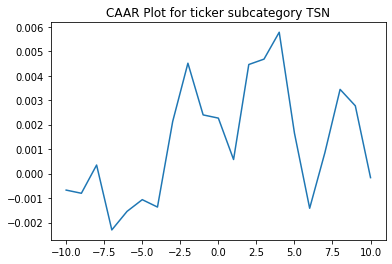

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000671 -0.000671  0.012789 -0.344267  0.732363
-9  -0.000130 -0.000801  0.021935 -0.239508  0.811877
-8   0.001153  0.000352  0.028820  0.080034  0.936591
-7  -0.002649 -0.002297  0.034067 -0.442178  0.660629
-6   0.000757 -0.001541  0.034304 -0.294497  0.769829
-5   0.000479 -0.001062  0.034604 -0.201257  0.841469
-4  -0.000302 -0.001364  0.034952 -0.255865  0.799304
-3   0.003495  0.002131  0.038478  0.363188  0.718286
-2   0.002377  0.004509  0.041227  0.717129  0.477264
-1  -0.002110  0.002398  0.041559  0.378421  0.707024
 0  -0.000131  0.002267  0.043734  0.339947  0.735590
 1  -0.001690  0.000577  0.046167  0.081974  0.935057
 2   0.003878  0.004455  0.049934  0.585077  0.561626
 3   0.000220  0.004676  0.051550  0.594756  0.555198
 4   0.001097  0.005773  0.051993  0.728090  0.470598
 5  -0.004117  0.001656  0.052872  0.205420  0.838237
 6  -0.003069 -0.001413  0.054371 -0.170440  0.865483
 7   0.002270  0.000857  0.0

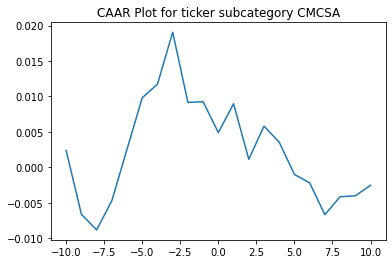

          ARR      CAAR        sd    t_stat   p_value
-10  0.002384  0.002384  0.015917  0.652808  0.522131
-9  -0.008974 -0.006590  0.020192 -1.422624  0.171945
-8  -0.002211 -0.008801  0.022840 -1.679663  0.110296
-7   0.004108 -0.004693  0.023614 -0.866322  0.397715
-6   0.007268  0.002575  0.020937  0.536019  0.598508
-5   0.007248  0.009823  0.021717  1.971665  0.064217
-4   0.001912  0.011735  0.028223  1.812455  0.086631
-3   0.007319  0.019054  0.019274  4.309175  0.000422
-2  -0.009889  0.009166  0.019851  2.012667  0.059356
-1   0.000103  0.009269  0.025241  1.600721  0.126843
 0  -0.004362  0.004908  0.025968  0.823798  0.420836
 1   0.004077  0.008985  0.029400  1.332061  0.199461
 2  -0.007831  0.001153  0.037957  0.132444  0.896102
 3   0.004669  0.005822  0.036221  0.700633  0.492490
 4  -0.002265  0.003557  0.034372  0.451112  0.657297
 5  -0.004540 -0.000983  0.037153 -0.115313  0.909474
 6  -0.001189 -0.002172  0.037551 -0.252084  0.803832
 7  -0.004483 -0.006655  0.0

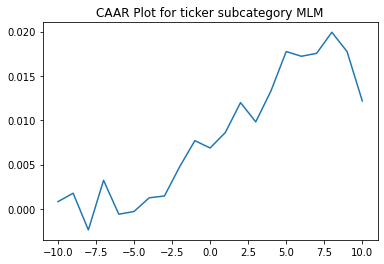

          ARR      CAAR        sd    t_stat   p_value
-10  0.000814  0.000814  0.017837  0.281404  0.779969
-9   0.000950  0.001764  0.020670  0.526043  0.601997
-8  -0.004140 -0.002376  0.020363 -0.719248  0.476507
-7   0.005598  0.003222  0.027395  0.725008  0.473007
-6  -0.003827 -0.000605  0.026861 -0.138780  0.890376
-5   0.000308 -0.000297  0.021849 -0.083683  0.933760
-4   0.001547  0.001250  0.023883  0.322622  0.748797
-3   0.000201  0.001451  0.024283  0.368342  0.714718
-2   0.003304  0.004755  0.026477  1.107088  0.275401
-1   0.002944  0.007699  0.029255  1.622242  0.113243
 0  -0.000829  0.006870  0.029365  1.442100  0.157686
 1   0.001743  0.008613  0.032541  1.631526  0.111263
 2   0.003379  0.011992  0.037113  1.991843  0.053808
 3  -0.002176  0.009816  0.044559  1.358035  0.182677
 4   0.003498  0.013315  0.044276  1.853806  0.071753
 5   0.004438  0.017753  0.046629  2.346973  0.024389
 6  -0.000534  0.017219  0.049964  2.124460  0.040377
 7   0.000335  0.017554  0.0

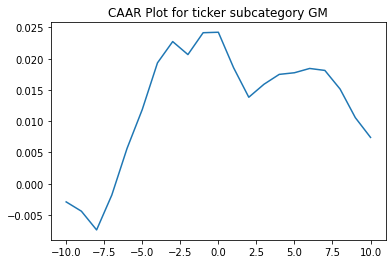

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002902 -0.002902  0.018023 -0.683052  0.503777
-9  -0.001489 -0.004391  0.026422 -0.705008  0.490353
-8  -0.002994 -0.007384  0.031920 -0.981503  0.340108
-7   0.005581 -0.001803  0.035454 -0.215740  0.831757
-6   0.007450  0.005647  0.037050  0.646693  0.526467
-5   0.006223  0.011870  0.035911  1.402390  0.178796
-4   0.007464  0.019334  0.040611  2.019813  0.059452
-3   0.003405  0.022739  0.043002  2.243472  0.038477
-2  -0.002080  0.020659  0.043272  2.025572  0.058802
-1   0.003496  0.024156  0.037516  2.731696  0.014202
 0   0.000076  0.024231  0.037826  2.717807  0.014621
 1  -0.005667  0.018565  0.041716  1.888091  0.076203
 2  -0.004728  0.013836  0.039114  1.500768  0.151760
 3   0.002079  0.015915  0.041081  1.643639  0.118616
 4   0.001576  0.017491  0.044535  1.666288  0.113973
 5   0.000262  0.017754  0.047956  1.570636  0.134692
 6   0.000686  0.018439  0.051084  1.531426  0.144061
 7  -0.000315  0.018124  0.0

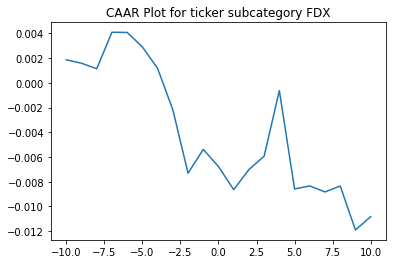

          ARR      CAAR        sd    t_stat   p_value
-10  0.001854  0.001854  0.012699  0.876079  0.386960
-9  -0.000276  0.001578  0.024567  0.385408  0.702267
-8  -0.000445  0.001133  0.045765  0.148531  0.882776
-7   0.002950  0.004083  0.049307  0.496818  0.622424
-6  -0.000016  0.004067  0.053065  0.459868  0.648455
-5  -0.001169  0.002898  0.058039  0.299559  0.766285
-4  -0.001738  0.001160  0.058174  0.119624  0.905465
-3  -0.003340 -0.002180  0.066023 -0.198094  0.844118
-2  -0.005131 -0.007311  0.064311 -0.682088  0.499673
-1   0.001926 -0.005385  0.075085 -0.430323  0.669599
 0  -0.001389 -0.006774  0.074180 -0.547908  0.587233
 1  -0.001866 -0.008640  0.070164 -0.738800  0.464954
 2   0.001622 -0.007018  0.075922 -0.554602  0.582694
 3   0.001083 -0.005935  0.072595 -0.490491  0.626848
 4   0.005303 -0.000631  0.076299 -0.049653  0.960681
 5  -0.007952 -0.008583  0.085851 -0.599878  0.552452
 6   0.000246 -0.008337  0.093985 -0.532259  0.597909
 7  -0.000488 -0.008825  0.0

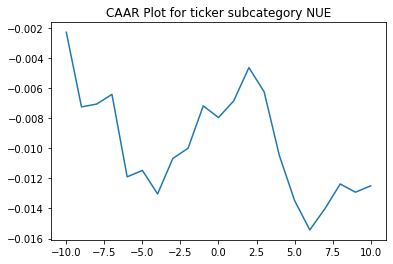

          ARR      CAAR        sd    t_stat   p_value
-10 -0.002293 -0.002293  0.011868 -1.126719  0.267988
-9  -0.004959 -0.007253  0.015813 -2.674387  0.011554
-8   0.000189 -0.007064  0.019613 -2.100074  0.043448
-7   0.000645 -0.006419  0.023011 -1.626495  0.113357
-6  -0.005479 -0.011898  0.024150 -2.872588  0.007065
-5   0.000426 -0.011471  0.032836 -2.037050  0.049731
-4  -0.001563 -0.013035  0.039630 -1.917896  0.063812
-3   0.002358 -0.010677  0.045991 -1.353679  0.185038
-2   0.000676 -0.010001  0.047559 -1.226218  0.228795
-1   0.002815 -0.007187  0.049304 -0.849929  0.401489
 0  -0.000775 -0.007962  0.048811 -0.951097  0.348470
 1   0.001105 -0.006856  0.050588 -0.790259  0.435019
 2   0.002214 -0.004642  0.051998 -0.520534  0.606167
 3  -0.001609 -0.006251  0.052171 -0.698600  0.489696
 4  -0.004231 -0.010481  0.051780 -1.180304  0.246317
 5  -0.002986 -0.013468  0.051020 -1.539193  0.133292
 6  -0.001957 -0.015425  0.051978 -1.730345  0.092912
 7   0.001416 -0.014009  0.0

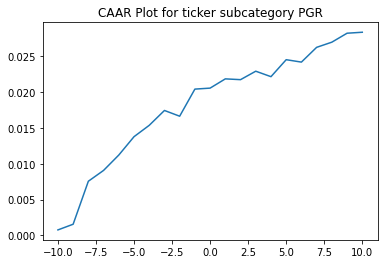

          ARR      CAAR        sd    t_stat   p_value
-10  0.000776  0.000776  0.019420  0.233075  0.817143
-9   0.000791  0.001567  0.019954  0.458037  0.649928
-8   0.005987  0.007554  0.019576  2.250205  0.031223
-7   0.001507  0.009062  0.025032  2.110801  0.042451
-6   0.002139  0.011201  0.024431  2.673385  0.011583
-5   0.002555  0.013756  0.029535  2.715829  0.010439
-4   0.001582  0.015338  0.034132  2.620311  0.013176
-3   0.002069  0.017407  0.034673  2.927383  0.006149
-2  -0.000798  0.016609  0.040803  2.373532  0.023595
-1   0.003773  0.020382  0.036640  3.243699  0.002702
 0   0.000137  0.020519  0.037912  3.155892  0.003406
 1   0.001288  0.021807  0.036748  3.460227  0.001510
 2  -0.000109  0.021698  0.041792  3.027396  0.004759
 3   0.001177  0.022875  0.040790  3.270035  0.002519
 4  -0.000761  0.022114  0.040035  3.220889  0.002870
 5   0.002363  0.024477  0.042878  3.328581  0.002155
 6  -0.000335  0.024142  0.043802  3.213830  0.002924
 7   0.002055  0.026197  0.0

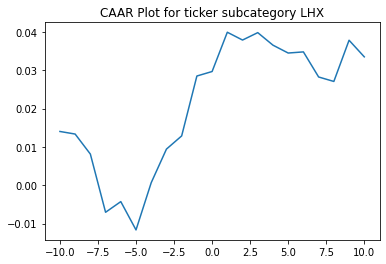

          ARR      CAAR        sd    t_stat   p_value
-10  0.014026  0.014026  0.011584  1.712255  0.336511
-9  -0.000675  0.013350  0.024793  0.761506  0.585672
-8  -0.005226  0.008124  0.033329  0.344718  0.788667
-7  -0.015188 -0.007064  0.014088 -0.709076  0.607338
-6   0.002781 -0.004283  0.006167 -0.982134  0.505738
-5  -0.007387 -0.011670  0.011280 -1.463126  0.381682
-4   0.012332  0.000662  0.033533  0.027925  0.982227
-3   0.008759  0.009421  0.033731  0.395004  0.760509
-2   0.003443  0.012864  0.043489  0.418336  0.747763
-1   0.015633  0.028497  0.048804  0.825776  0.560566
 0   0.001174  0.029671  0.057673  0.727575  0.599570
 1   0.010250  0.039921  0.061182  0.922770  0.525557
 2  -0.002037  0.037884  0.047020  1.139434  0.458568
 3   0.004254  0.042138  0.037502  1.589036  0.357586
 4  -0.003275  0.038863  0.034227  1.605763  0.354587
 5  -0.002049  0.036814  0.032178  1.617960  0.352429
 6   0.000295  0.037109  0.032473  1.616109  0.352755
 7  -0.006547  0.030562  0.0

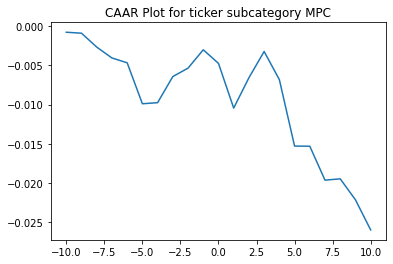

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000790 -0.000790  0.016327 -0.277782  0.782966
-9  -0.000121 -0.000911  0.018927 -0.276495  0.783946
-8  -0.001769 -0.002680  0.022123 -0.695953  0.491482
-7  -0.001388 -0.004068  0.028697 -0.814343  0.421468
-6  -0.000610 -0.004678  0.027937 -0.962002  0.343262
-5  -0.005217 -0.009896  0.040704 -1.396569  0.172155
-4   0.000136 -0.009760  0.046272 -1.211685  0.234505
-3   0.003329 -0.006431  0.044227 -0.835307  0.409739
-2   0.001070 -0.005361  0.052073 -0.591408  0.558402
-1   0.002337 -0.003024  0.057913 -0.300002  0.766116
 0  -0.001729 -0.004753  0.071103 -0.384040  0.703489
 1  -0.005694 -0.010448  0.078484 -0.764711  0.450046
 2   0.003860 -0.006588  0.099120 -0.381804  0.705131
 3   0.003346 -0.003242  0.100157 -0.185943  0.853664
 4  -0.003579 -0.006821  0.112839 -0.347262  0.730668
 5  -0.008464 -0.015285  0.153795 -0.570924  0.572039
 6  -0.000020 -0.015305  0.141804 -0.620001  0.539648
 7  -0.004321 -0.019626  0.1

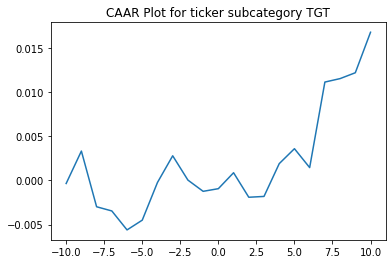

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000351 -0.000351  0.023123 -0.085824  0.932158
-9   0.003665  0.003314  0.033420  0.560996  0.578833
-8  -0.006296 -0.002982  0.036940 -0.456619  0.651128
-7  -0.000473 -0.003455  0.034802 -0.561582  0.578438
-6  -0.002144 -0.005599  0.046013 -0.688300  0.496383
-5   0.001104 -0.004495  0.047325 -0.537258  0.594925
-4   0.004260 -0.000235  0.061849 -0.021507  0.982979
-3   0.003016  0.002780  0.066201  0.237588  0.813764
-2  -0.002747  0.000033  0.064569  0.002923  0.997686
-1  -0.001270 -0.001237  0.067357 -0.103875  0.917937
 0   0.000299 -0.000937  0.073247 -0.072397  0.942751
 1   0.001802  0.000864  0.082103  0.059540  0.952904
 2  -0.002771 -0.001906  0.082359 -0.130945  0.896665
 3   0.000093 -0.001813  0.091831 -0.111712  0.911772
 4   0.003705  0.001892  0.092622  0.115533  0.908768
 5   0.001689  0.003581  0.096197  0.210586  0.834588
 6  -0.002135  0.001446  0.095584  0.085568  0.932360
 7   0.009668  0.011114  0.1

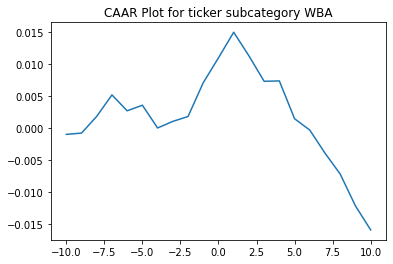

          ARR      CAAR        sd    t_stat   p_value
-10 -0.000993 -0.000993  0.014461 -0.322211  0.750478
-9   0.000202 -0.000791  0.016029 -0.231602  0.819089
-8   0.002628  0.001837  0.019800  0.435167  0.667881
-7   0.003361  0.005198  0.017189  1.418531  0.170707
-6  -0.002493  0.002706  0.019263  0.658850  0.517152
-5   0.000873  0.003579  0.015421  1.088528  0.288697
-4  -0.003567  0.000011  0.024511  0.002179  0.998282
-3   0.001035  0.001046  0.031432  0.156090  0.877453
-2   0.000765  0.001811  0.034919  0.243222  0.810193
-1   0.005301  0.007112  0.048270  0.691045  0.497106
 0   0.003902  0.011013  0.055392  0.932575  0.361639
 1   0.004011  0.015024  0.060574  1.163385  0.257723
 2  -0.003696  0.011328  0.055595  0.955746  0.350075
 3  -0.003999  0.007330  0.051211  0.671328  0.509330
 4   0.000063  0.007393  0.055436  0.625529  0.538363
 5  -0.005929  0.001464  0.059381  0.115644  0.909033
 6  -0.001783 -0.000319  0.060466 -0.024763  0.980478
 7  -0.003614 -0.003933  0.0

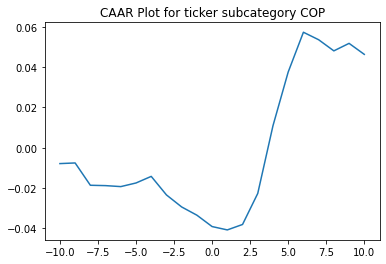

          ARR      CAAR        sd     t_stat   p_value
-10 -0.007842 -0.007842  0.027765  -0.747244  0.483161
-9   0.000314 -0.007528  0.024359  -0.817646  0.444807
-8  -0.011056 -0.018584  0.030451  -1.614673  0.157509
-7  -0.000177 -0.018761  0.025790  -1.924693  0.102596
-6  -0.000486 -0.019247  0.034165  -1.490499  0.186681
-5   0.001796 -0.017452  0.023226  -1.988019  0.093974
-4   0.003269 -0.014183  0.030448  -1.232423  0.263890
-3  -0.009184 -0.023368  0.022208  -2.783849  0.031835
-2  -0.005970 -0.029338  0.021457  -3.617477  0.011131
-1  -0.004073 -0.033411  0.035458  -2.493021  0.046970
 0  -0.005643 -0.039054  0.044284  -2.333277  0.058378
 1  -0.001662 -0.040716  0.047904  -2.248730  0.065556
 2   0.002698 -0.038018  0.044371  -2.266969  0.063933
 3   0.015391 -0.022627  0.053515  -1.118648  0.306066
 4   0.033549  0.010923  0.057993   0.498306  0.636005
 5   0.026620  0.037542  0.057376   1.731166  0.134139
 6   0.019718  0.057261  0.014503  10.446257  0.000045
 7  -0.003

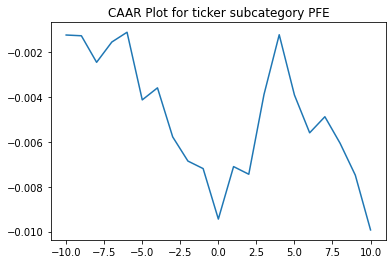

          ARR      CAAR        sd    t_stat   p_value
-10 -0.001234 -0.001234  0.009901 -0.682640  0.500252
-9  -0.000033 -0.001267  0.012516 -0.554562  0.583446
-8  -0.001184 -0.002451  0.016157 -0.830840  0.412852
-7   0.000904 -0.001547  0.014844 -0.570674  0.572616
-6   0.000437 -0.001110  0.016117 -0.377254  0.708732
-5  -0.003017 -0.004127  0.022105 -1.022570  0.314966
-4   0.000537 -0.003590  0.027648 -0.711200  0.482642
-3  -0.002187 -0.005777  0.029273 -1.080996  0.288607
-2  -0.001078 -0.006855  0.031670 -1.185539  0.245428
-1  -0.000336 -0.007191  0.034806 -1.131620  0.267065
 0  -0.002251 -0.009442  0.036723 -1.408343  0.169661
 1   0.002340 -0.007102  0.037552 -1.035886  0.308817
 2  -0.000341 -0.007443  0.039491 -1.032352  0.310441
 3   0.003559 -0.003884  0.037632 -0.565375  0.576167
 4   0.002663 -0.001222  0.037819 -0.176914  0.860806
 5  -0.002687 -0.003909  0.040422 -0.529630  0.600400
 6  -0.001686 -0.005595  0.042056 -0.728659  0.472054
 7   0.000717 -0.004878  0.0

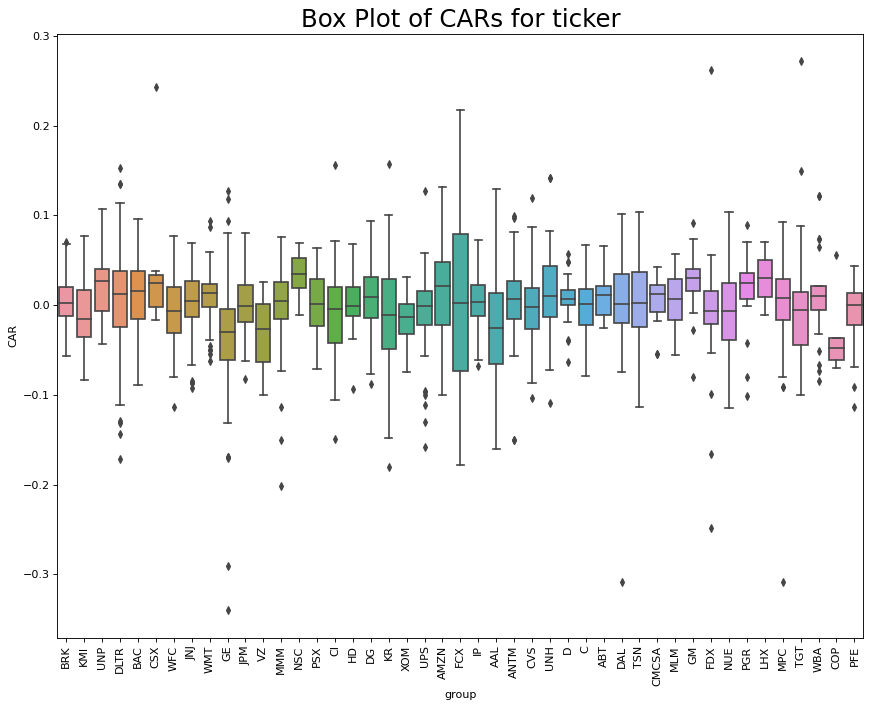

In [ ]:
es_win = 200
ev_win = [-10,10]
end_time = 10
a = CAAR_by_category(df, events, 'ticker',\
                     cat_name='Different tickers', cat_members=ticker_lst,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

CAR FOR Different tickers GROUP BRK
We found AR for 130 events
AR.shape[1] is 130


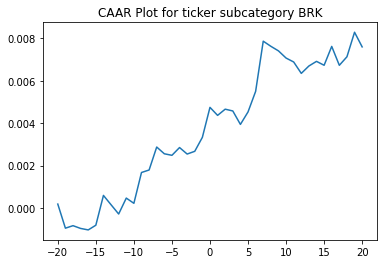

          ARR      CAAR        sd    t_stat   p_value
-20  0.000183  0.000183  0.009483  0.219930  0.826273
-19 -0.001137 -0.000954  0.010939 -0.994027  0.322071
-18  0.000118 -0.000836  0.012779 -0.745617  0.457255
-17 -0.000130 -0.000966  0.014669 -0.750728  0.454184
-16 -0.000070 -0.001036  0.017433 -0.677412  0.499358
-15  0.000222 -0.000814  0.021460 -0.432481  0.666114
-14  0.001405  0.000591  0.022367  0.301447  0.763559
-13 -0.000440  0.000151  0.023671  0.072835  0.942050
-12 -0.000436 -0.000285  0.027432 -0.118532  0.905830
-11  0.000751  0.000466  0.028291  0.187698  0.851408
-10 -0.000247  0.000219  0.028467  0.087705  0.930247
-9   0.001454  0.001673  0.031098  0.613219  0.540811
-8   0.000118  0.001790  0.030588  0.667316  0.505762
-7   0.001083  0.002873  0.031459  1.041437  0.299621
-6  -0.000318  0.002555  0.032203  0.904780  0.367269
-5  -0.000073  0.002483  0.031888  0.887769  0.376317
-4   0.000366  0.002849  0.032062  1.013291  0.312818
-3  -0.000307  0.002543  0.0

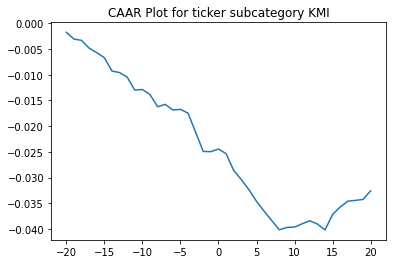

          ARR      CAAR        sd    t_stat       p_value
-20 -0.001733 -0.001733  0.011139 -1.639251  1.040180e-01
-19 -0.001317 -0.003050  0.015463 -2.078074  4.002951e-02
-18 -0.000268 -0.003317  0.017968 -1.945232  5.429920e-02
-17 -0.001496 -0.004814  0.021152 -2.397772  1.817923e-02
-16 -0.000884 -0.005698  0.021516 -2.790225  6.210201e-03
-15 -0.000983 -0.006681  0.021825 -3.225168  1.658064e-03
-14 -0.002592 -0.009273  0.024754 -3.946775  1.399400e-04
-13 -0.000299 -0.009572  0.024716 -4.080239  8.547053e-05
-12 -0.000886 -0.010458  0.028522 -3.862881  1.897364e-04
-11 -0.002518 -0.012976  0.031857 -4.291394  3.835223e-05
-10  0.000117 -0.012859  0.033383 -4.058205  9.278643e-05
-9  -0.000987 -0.013846  0.036377 -4.010201  1.108561e-04
-8  -0.002370 -0.016216  0.037858 -4.512861  1.610857e-05
-7   0.000462 -0.015754  0.037150 -4.467663  1.927031e-05
-6  -0.001084 -0.016838  0.037094 -4.782435  5.409212e-06
-5   0.000111 -0.016727  0.039527 -4.458436  1.998568e-05
-4  -0.000738 

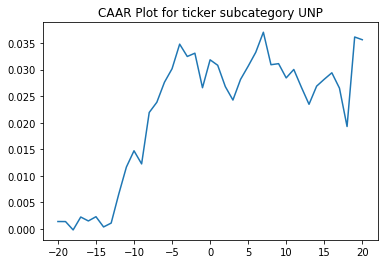

          ARR      CAAR        sd    t_stat   p_value
-20  0.001403  0.001403  0.008374  0.580493  0.573282
-19 -0.000009  0.001395  0.012061  0.400542  0.696427
-18 -0.001571 -0.000176  0.017801 -0.034265  0.973280
-17  0.002428  0.002252  0.019809  0.393859  0.701212
-16 -0.000740  0.001512  0.024264  0.215840  0.833062
-15  0.000797  0.002309  0.028228  0.283377  0.782150
-14 -0.001925  0.000384  0.031733  0.041909  0.967322
-13  0.000729  0.001113  0.036072  0.106921  0.916777
-12  0.005475  0.006588  0.030143  0.757134  0.464879
-11  0.005072  0.011660  0.032850  1.229591  0.244502
-10  0.003056  0.014717  0.038620  1.320025  0.213637
-9  -0.002469  0.012247  0.037061  1.144774  0.276601
-8   0.009679  0.021927  0.049019  1.549542  0.149526
-7   0.001921  0.023848  0.055261  1.494925  0.163058
-6   0.003763  0.027611  0.052680  1.815594  0.096762
-5   0.002547  0.030158  0.051032  2.047154  0.065295
-4   0.004628  0.034786  0.044978  2.679160  0.021440
-3  -0.002320  0.032466  0.0

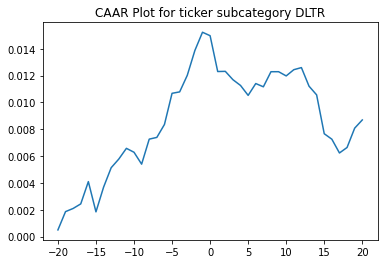

          ARR      CAAR        sd    t_stat   p_value
-20  0.000499  0.000499  0.012802  0.581083  0.561777
-19  0.001364  0.001863  0.019035  1.458140  0.146222
-18  0.000236  0.002099  0.024283  1.287876  0.199136
-17  0.000341  0.002440  0.028146  1.291411  0.197910
-16  0.001660  0.004100  0.031392  1.945978  0.052925
-15 -0.002254  0.001846  0.036576  0.752025  0.452836
-14  0.001838  0.003684  0.039415  1.392754  0.165094
-13  0.001453  0.005137  0.043059  1.777635  0.076839
-12  0.000644  0.005781  0.045942  1.874890  0.062127
-11  0.000800  0.006581  0.049916  1.964362  0.050742
-10 -0.000292  0.006289  0.051535  1.818242  0.070381
-9  -0.000887  0.005402  0.055126  1.460015  0.145706
-8   0.001866  0.007267  0.056935  1.901847  0.058492
-7   0.000129  0.007396  0.058683  1.877910  0.061710
-6   0.000964  0.008360  0.060767  2.049938  0.041551
-5   0.002323  0.010683  0.064255  2.477275  0.013989
-4   0.000106  0.010789  0.068043  2.362602  0.019015
-3   0.001234  0.012024  0.0

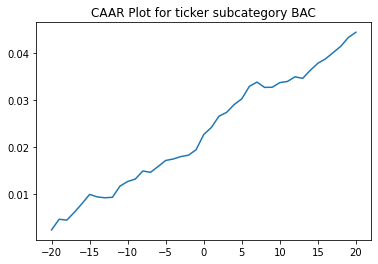

          ARR      CAAR        sd     t_stat       p_value
-20  0.002372  0.002372  0.012189   2.654032  8.646143e-03
-19  0.002267  0.004639  0.019624   3.223864  1.495074e-03
-18 -0.000189  0.004450  0.028352   2.140622  3.361379e-02
-17  0.001663  0.006113  0.035347   2.358484  1.939323e-02
-16  0.001847  0.007960  0.037066   2.928861  3.829930e-03
-15  0.001955  0.009915  0.038441   3.517832  5.474530e-04
-14 -0.000519  0.009396  0.040404   3.171632  1.774816e-03
-13 -0.000196  0.009200  0.040376   3.107520  2.184354e-03
-12  0.000106  0.009306  0.042910   2.957802  3.502911e-03
-11  0.002388  0.011694  0.045074   3.538377  5.090746e-04
-10  0.000963  0.012657  0.043589   3.960225  1.067403e-04
-9   0.000517  0.013174  0.043814   4.100792  6.161252e-05
-8   0.001721  0.014895  0.043698   4.648870  6.331117e-06
-7  -0.000282  0.014614  0.045991   4.333563  2.404483e-05
-6   0.001228  0.015841  0.047145   4.582615  8.427346e-06
-5   0.001292  0.017134  0.047918   4.876502  2.317980e-

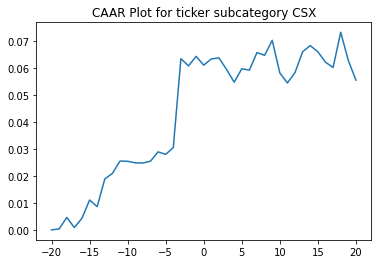

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000068 -0.000068  0.008489 -0.024025  0.981421
-19  0.000367  0.000299  0.008649  0.103785  0.919895
-18  0.004261  0.004560  0.019691  0.694806  0.506851
-17 -0.003729  0.000832  0.029070  0.085829  0.933711
-16  0.003445  0.004277  0.023124  0.554871  0.594152
-15  0.006760  0.011037  0.029168  1.135180  0.289164
-14 -0.002442  0.008596  0.028089  0.918050  0.385435
-13  0.010276  0.018872  0.032313  1.752127  0.117851
-12  0.002067  0.020939  0.025987  2.417222  0.042032
-11  0.004585  0.025524  0.029212  2.621241  0.030591
-10 -0.000082  0.025441  0.030247  2.523376  0.035621
-9  -0.000584  0.024857  0.037112  2.009363  0.079356
-8  -0.000063  0.024795  0.035791  2.078272  0.071307
-7   0.000670  0.025465  0.039129  1.952384  0.086672
-6   0.003472  0.028937  0.037344  2.324615  0.048568
-5  -0.000921  0.028015  0.035847  2.344615  0.047075
-4   0.002515  0.030531  0.040534  2.259648  0.053752
-3   0.033036  0.063567  0.0

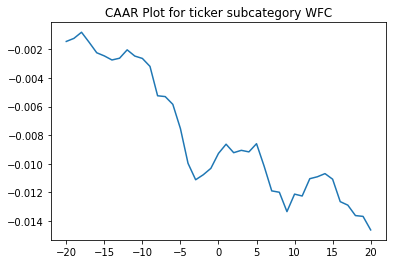

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001437 -0.001437  0.009909 -1.857219  0.065084
-19  0.000213 -0.001224  0.015905 -0.985453  0.325862
-18  0.000430 -0.000794  0.017941 -0.566431  0.571880
-17 -0.000702 -0.001496  0.021104 -0.907504  0.365480
-16 -0.000733 -0.002229  0.022842 -1.249527  0.213264
-15 -0.000221 -0.002450  0.024415 -1.285139  0.200567
-14 -0.000284 -0.002734  0.027695 -1.264286  0.207932
-13  0.000123 -0.002611  0.029087 -1.149527  0.252022
-12  0.000586 -0.002025  0.030349 -0.854538  0.394061
-11 -0.000434 -0.002459  0.033184 -0.949136  0.343957
-10 -0.000167 -0.002626  0.034262 -0.981634  0.327735
-9  -0.000558 -0.003184  0.036089 -1.129853  0.260198
-8  -0.002054 -0.005238  0.038226 -1.754884  0.081158
-7  -0.000058 -0.005296  0.038494 -1.761838  0.079971
-6  -0.000542 -0.005838  0.038597 -1.937100  0.054462
-5  -0.001697 -0.007536  0.040935 -2.357474  0.019587
-4  -0.002432 -0.009968  0.041110 -3.105091  0.002244
-3  -0.001147 -0.011115  0.0

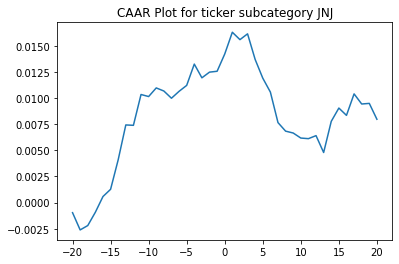

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000961 -0.000961  0.013537 -0.727174  0.468753
-19 -0.001648 -0.002609  0.020383 -1.311419  0.192604
-18  0.000417 -0.002192  0.029548 -0.760201  0.448854
-17  0.001276 -0.000917  0.031214 -0.300872  0.764113
-16  0.001500  0.000583  0.032585  0.183429  0.854819
-15  0.000690  0.001273  0.032526  0.401027  0.689223
-14  0.002826  0.004099  0.032801  1.280476  0.203226
-13  0.003325  0.007424  0.030892  2.462705  0.015431
-12 -0.000036  0.007389  0.032520  2.328155  0.021839
-11  0.002945  0.010334  0.033195  3.189980  0.001881
-10 -0.000196  0.010138  0.033400  3.110379  0.002412
-9   0.000824  0.010963  0.032233  3.485058  0.000722
-8  -0.000295  0.010667  0.033335  3.279083  0.001417
-7  -0.000690  0.009977  0.037926  2.695650  0.008195
-6   0.000660  0.010637  0.038908  2.801432  0.006068
-5   0.000567  0.011204  0.041176  2.788166  0.006304
-4   0.002036  0.013240  0.042667  3.179719  0.001943
-3  -0.001311  0.011928  0.0

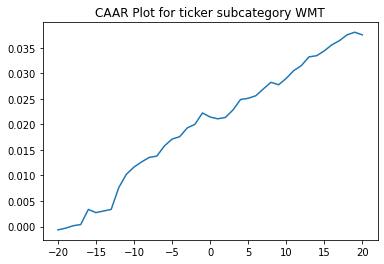

          ARR      CAAR        sd    t_stat       p_value
-20 -0.000647 -0.000647  0.009985 -0.654322  5.143919e-01
-19  0.000335 -0.000312  0.015579 -0.201968  8.403482e-01
-18  0.000479  0.000168  0.015961  0.106254  9.155916e-01
-17  0.000246  0.000414  0.016834  0.248459  8.042838e-01
-16  0.002949  0.003363  0.020790  1.633599  1.054566e-01
-15 -0.000624  0.002739  0.022165  1.247973  2.149265e-01
-14  0.000314  0.003052  0.023863  1.291887  1.993445e-01
-13  0.000313  0.003365  0.027760  1.224412  2.236451e-01
-12  0.004274  0.007639  0.031357  2.460396  1.557544e-02
-11  0.002608  0.010248  0.033150  3.122000  2.343143e-03
-10  0.001405  0.011653  0.033287  3.535480  6.160156e-04
-9   0.001009  0.012662  0.034851  3.669257  3.905483e-04
-8   0.000873  0.013534  0.035002  3.905225  1.702171e-04
-7   0.000260  0.013795  0.035893  3.881535  1.852956e-04
-6   0.001993  0.015788  0.036184  4.406722  2.620096e-05
-5   0.001333  0.017121  0.037451  4.617177  1.147814e-05
-4   0.000470 

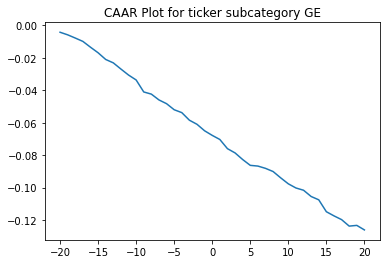

          ARR      CAAR        sd     t_stat       p_value
-20 -0.004230 -0.004230  0.021112  -2.370539  1.913514e-02
-19 -0.001589 -0.005819  0.029267  -2.352509  2.004993e-02
-18 -0.001985 -0.007804  0.035104  -2.630262  9.493886e-03
-17 -0.002069 -0.009872  0.043031  -2.714495  7.479074e-03
-16 -0.003580 -0.013452  0.046328  -3.435590  7.799241e-04
-15 -0.003424 -0.016876  0.053185  -3.754379  2.546219e-04
-14 -0.004133 -0.021008  0.058613  -4.240967  4.037658e-05
-13 -0.002098 -0.023107  0.065596  -4.167973  5.375160e-05
-12 -0.003813 -0.026919  0.067697  -4.704947  6.062703e-06
-11 -0.003687 -0.030607  0.069261  -5.228650  6.134399e-07
-10 -0.003039 -0.033645  0.065185  -6.107138  9.585311e-09
-9  -0.007389 -0.041034  0.066659  -7.283731  2.203342e-11
-8  -0.001340 -0.042374  0.065740  -7.626690  3.437931e-12
-7  -0.003582 -0.045956  0.071946  -7.557849  5.005012e-12
-6  -0.002316 -0.048272  0.075147  -7.600548  3.965555e-12
-5  -0.003726 -0.051998  0.080999  -7.595759  4.070553e-

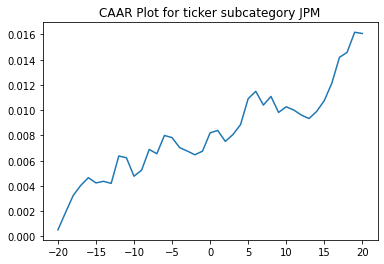

          ARR      CAAR        sd    t_stat   p_value
-20  0.000519  0.000519  0.010271  0.593792  0.553631
-19  0.001375  0.001895  0.014962  1.487601  0.139154
-18  0.001340  0.003234  0.016895  2.248937  0.026112
-17  0.000809  0.004044  0.019298  2.461667  0.015072
-16  0.000612  0.004656  0.022450  2.436032  0.016134
-15 -0.000414  0.004242  0.022568  2.207914  0.028913
-14  0.000127  0.004369  0.024744  2.074215  0.039931
-13 -0.000165  0.004204  0.026500  1.863610  0.064517
-12  0.002168  0.006372  0.026416  2.833747  0.005297
-11 -0.000137  0.006236  0.027275  2.685686  0.008133
-10 -0.001463  0.004772  0.028169  1.990126  0.048567
-9   0.000482  0.005254  0.029164  2.116420  0.036117
-8   0.001637  0.006892  0.029182  2.774233  0.006306
-7  -0.000338  0.006553  0.031577  2.438025  0.016049
-6   0.001448  0.008001  0.031692  2.965836  0.003562
-5  -0.000174  0.007827  0.033457  2.748176  0.006800
-4  -0.000788  0.007039  0.035576  2.324171  0.021587
-3  -0.000274  0.006765  0.0

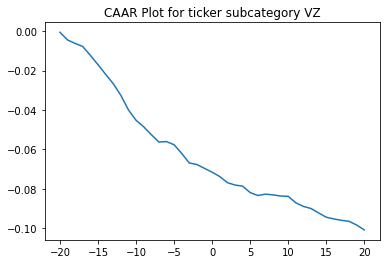

          ARR      CAAR        sd     t_stat       p_value
-20 -0.000500 -0.000500  0.013744  -0.323411  7.472492e-01
-19 -0.003919 -0.004419  0.019884  -1.975143  5.178995e-02
-18 -0.001769 -0.006187  0.023471  -2.343116  2.167263e-02
-17 -0.001550 -0.007737  0.025644  -2.681740  8.935769e-03
-16 -0.004508 -0.012245  0.031127  -3.496631  7.808665e-04
-15 -0.004712 -0.016957  0.030654  -4.916668  4.774359e-06
-14 -0.004895 -0.021852  0.030259  -6.418662  9.828200e-09
-13 -0.004739 -0.026591  0.032990  -7.163993  3.833937e-10
-12 -0.005919 -0.032510  0.034295  -8.425663  1.406238e-12
-11 -0.007422 -0.039932  0.032044 -11.076162  1.126919e-17
-10 -0.005283 -0.045215  0.029615 -13.569899  3.145377e-22
-9  -0.003297 -0.048512  0.033365 -12.922971  4.458779e-21
-8  -0.003990 -0.052501  0.036689 -12.718951  1.039771e-20
-7  -0.003789 -0.056291  0.038508 -12.992778  3.341130e-21
-6   0.000226 -0.056065  0.040013 -12.453776  3.148260e-20
-5  -0.001595 -0.057659  0.040580 -12.629002  1.512655e-

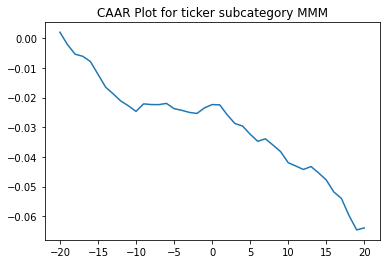

          ARR      CAAR        sd    t_stat       p_value
-20  0.002075  0.002075  0.012215  1.400601  1.659479e-01
-19 -0.004196 -0.002122  0.022683 -0.771341  4.432165e-01
-18 -0.003218 -0.005340  0.024579 -1.791444  7.773817e-02
-17 -0.000699 -0.006039  0.026398 -1.886368  6.358018e-02
-16 -0.001750 -0.007789  0.032283 -1.989477  5.073305e-02
-15 -0.004301 -0.012089  0.036303 -2.746119  7.736425e-03
-14 -0.004342 -0.016432  0.039122 -3.463529  9.338543e-04
-13 -0.002290 -0.018722  0.041842 -3.689694  4.522803e-04
-12 -0.002405 -0.021127  0.044585 -3.907584  2.196697e-04
-11 -0.001631 -0.022758  0.048373 -3.879605  2.413154e-04
-10 -0.001881 -0.024639  0.048889 -4.155885  9.395894e-05
-9   0.002542 -0.022097  0.048791 -3.734619  3.904312e-04
-8  -0.000237 -0.022333  0.047719 -3.859357  2.582406e-04
-7  -0.000017 -0.022350  0.046950 -3.925594  2.067361e-04
-6   0.000409 -0.021942  0.046591 -3.883480  2.381999e-04
-5  -0.001758 -0.023699  0.048447 -4.033889  1.430918e-04
-4  -0.000566 

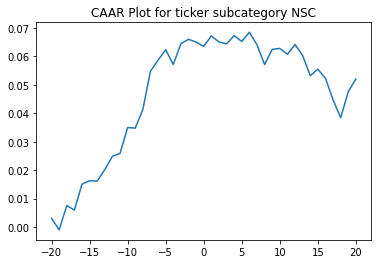

          ARR      CAAR        sd     t_stat       p_value
-20  0.003061  0.003061  0.005158   2.055888  6.431977e-02
-19 -0.004092 -0.001031  0.017670  -0.202064  8.435548e-01
-18  0.008595  0.007564  0.013475   1.944436  7.785166e-02
-17 -0.001622  0.005942  0.015283   1.346871  2.051146e-01
-16  0.009099  0.015041  0.012115   4.300723  1.254443e-03
-15  0.001242  0.016283  0.016647   3.388285  6.053208e-03
-14 -0.000134  0.016148  0.022491   2.487206  3.018486e-02
-13  0.004053  0.020201  0.023141   3.024051  1.157164e-02
-12  0.004644  0.024846  0.027769   3.099455  1.011397e-02
-11  0.001037  0.025883  0.022121   4.053287  1.904858e-03
-10  0.009084  0.034967  0.022366   5.415783  2.115272e-04
-9  -0.000190  0.034777  0.025287   4.764159  5.861653e-04
-8   0.006571  0.041348  0.024864   5.760664  1.263739e-04
-7   0.013442  0.054790  0.032548   5.831343  1.139481e-04
-6   0.003900  0.058690  0.029065   6.995025  2.284382e-05
-5   0.003653  0.062343  0.022968   9.402839  1.362975e-

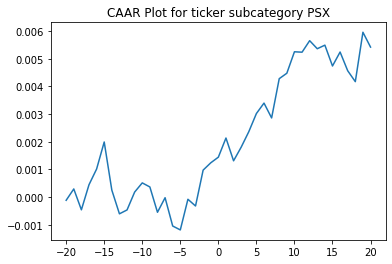

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000115 -0.000115  0.010202 -0.110825  0.911989
-19  0.000410  0.000294  0.013429  0.214685  0.830473
-18 -0.000754 -0.000460  0.016462 -0.273497  0.785065
-17  0.000906  0.000447  0.019003  0.230301  0.818353
-16  0.000568  0.001014  0.020518  0.484302  0.629286
-15  0.000977  0.001991  0.022748  0.857442  0.393359
-14 -0.001738  0.000253  0.023678  0.104556  0.916949
-13 -0.000857 -0.000604  0.024075 -0.245939  0.806260
-12  0.000140 -0.000464  0.027583 -0.164915  0.869362
-11  0.000646  0.000182  0.028672  0.062164  0.950563
-10  0.000331  0.000513  0.029941  0.167984  0.866953
-9  -0.000147  0.000366  0.030804  0.116437  0.907552
-8  -0.000914 -0.000548  0.031795 -0.168992  0.866162
-7   0.000526 -0.000022  0.033608 -0.006522  0.994810
-6  -0.001022 -0.001045  0.036024 -0.284168  0.776900
-5  -0.000141 -0.001186  0.037697 -0.308171  0.758627
-4   0.001107 -0.000078  0.038047 -0.020186  0.983937
-3  -0.000243 -0.000321  0.0

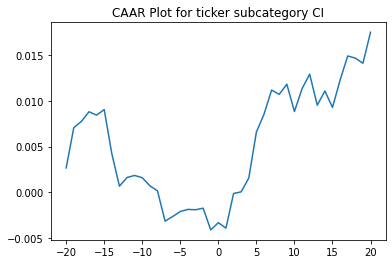

          ARR      CAAR        sd    t_stat   p_value
-20  0.002668  0.002668  0.012340  1.559312  0.125107
-19  0.004414  0.007083  0.018026  2.833283  0.006583
-18  0.000681  0.007764  0.020766  2.695982  0.009484
-17  0.001060  0.008824  0.024146  2.635242  0.011109
-16 -0.000372  0.008452  0.024392  2.498707  0.015728
-15  0.000616  0.009068  0.028528  2.292075  0.026062
-14 -0.004843  0.004224  0.032637  0.933401  0.355011
-13 -0.003556  0.000668  0.038558  0.124978  0.901032
-12  0.000952  0.001620  0.040264  0.290171  0.772862
-11  0.000224  0.001844  0.046847  0.283885  0.777648
-10 -0.000252  0.001592  0.048768  0.235428  0.814820
-9  -0.000880  0.000713  0.055552  0.092499  0.926664
-8  -0.000558  0.000154  0.056192  0.019776  0.984299
-7  -0.003320 -0.003166  0.058551 -0.389877  0.698251
-6   0.000511 -0.002655  0.068252 -0.280510  0.780221
-5   0.000548 -0.002107  0.062872 -0.241641  0.810027
-4   0.000230 -0.001877  0.058243 -0.232356  0.817191
-3  -0.000040 -0.001916  0.0

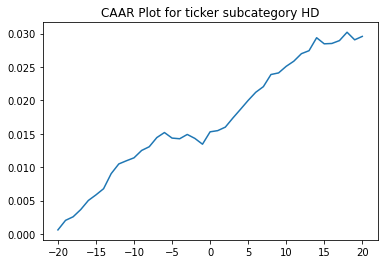

          ARR      CAAR        sd    t_stat       p_value
-20  0.000595  0.000595  0.007059  0.776907  4.393958e-01
-19  0.001431  0.002026  0.010717  1.742534  8.507475e-02
-18  0.000538  0.002563  0.012491  1.891850  6.195661e-02
-17  0.001083  0.003646  0.014267  2.355966  2.080371e-02
-16  0.001361  0.005007  0.017169  2.688485  8.653988e-03
-15  0.000838  0.005844  0.019540  2.757523  7.144254e-03
-14  0.000921  0.006766  0.021270  2.932679  4.329854e-03
-13  0.002260  0.009026  0.023437  3.550541  6.329013e-04
-12  0.001451  0.010477  0.025926  3.725807  3.518702e-04
-11  0.000476  0.010953  0.027673  3.649061  4.559878e-04
-10  0.000442  0.011395  0.030267  3.470976  8.213863e-04
-9   0.001102  0.012497  0.032488  3.546578  6.412281e-04
-8   0.000556  0.013054  0.033784  3.562307  6.087772e-04
-7   0.001375  0.014429  0.036416  3.653037  4.499409e-04
-6   0.000754  0.015183  0.037363  3.746521  3.279094e-04
-5  -0.000832  0.014351  0.038387  3.446728  8.886422e-04
-4  -0.000099 

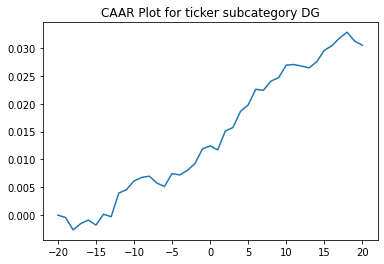

          ARR      CAAR        sd    t_stat   p_value
-20  0.000005  0.000005  0.010875  0.003635  0.997110
-19 -0.000430 -0.000425  0.019464 -0.187875  0.851496
-18 -0.002229 -0.002654  0.023966 -0.952496  0.343989
-17  0.001138 -0.001515  0.026475 -0.492397  0.623916
-16  0.000628 -0.000888  0.027851 -0.274195  0.784709
-15 -0.000906 -0.001793  0.031207 -0.494364  0.622533
-14  0.001960  0.000166  0.030377  0.047101  0.962562
-13 -0.000450 -0.000284  0.033519 -0.072812  0.942155
-12  0.004244  0.003960  0.034363  0.991365  0.324782
-11  0.000600  0.004560  0.034985  1.121355  0.265812
-10  0.001572  0.006133  0.037119  1.421287  0.159491
-9   0.000637  0.006770  0.037283  1.561960  0.122623
-8   0.000221  0.006991  0.042033  1.430666  0.156793
-7  -0.001223  0.005768  0.042833  1.158363  0.250491
-6  -0.000636  0.005132  0.043815  1.007567  0.316991
-5   0.002333  0.007464  0.047537  1.350775  0.180940
-4  -0.000247  0.007218  0.049162  1.262924  0.210635
-3   0.000794  0.008012  0.0

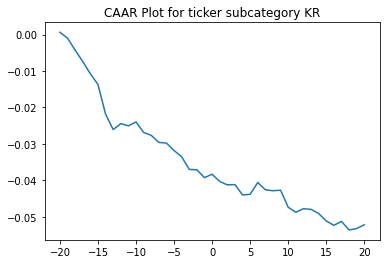

          ARR      CAAR        sd    t_stat   p_value
-20  0.000651  0.000651  0.022954  0.253790  0.800317
-19 -0.001634 -0.000983  0.025795 -0.340817  0.734146
-18 -0.003274 -0.004257  0.032193 -1.182679  0.240484
-17 -0.003128 -0.007385  0.035091 -1.882224  0.063488
-16 -0.003369 -0.010754  0.040192 -2.393092  0.019080
-15 -0.002949 -0.013703  0.044034 -2.783359  0.006728
-14 -0.008111 -0.021813  0.053762 -3.629063  0.000503
-13 -0.004256 -0.026069  0.058087 -4.014147  0.000135
-12  0.001639 -0.024431  0.060597 -3.606054  0.000543
-11 -0.000607 -0.025038  0.064308 -3.482446  0.000813
-10  0.001065 -0.023973  0.066620 -3.218602  0.001869
-9  -0.002881 -0.026854  0.067293 -3.569348  0.000612
-8  -0.000791 -0.027645  0.070862 -3.489455  0.000795
-7  -0.001948 -0.029593  0.072164 -3.667889  0.000442
-6  -0.000184 -0.029778  0.074923 -3.554844  0.000642
-5  -0.002037 -0.031815  0.073299 -3.882218  0.000214
-4  -0.001709 -0.033525  0.070985 -4.224197  0.000064
-3  -0.003476 -0.037000  0.0

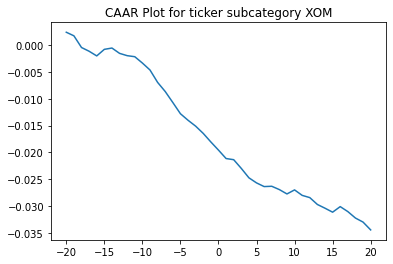

          ARR      CAAR        sd    t_stat       p_value
-20  0.002380  0.002380  0.007081  2.910820  4.760124e-03
-19 -0.000667  0.001713  0.010372  1.430651  1.567395e-01
-18 -0.002179 -0.000465  0.012543 -0.321372  7.488344e-01
-17 -0.000697 -0.001163  0.013448 -0.748850  4.563213e-01
-16 -0.000868 -0.002031  0.015677 -1.121808  2.655709e-01
-15  0.001224 -0.000807  0.017343 -0.402971  6.881311e-01
-14  0.000244 -0.000563  0.019606 -0.248722  8.042647e-01
-13 -0.000992 -0.001555  0.020396 -0.660436  5.110247e-01
-12 -0.000429 -0.001984  0.020822 -0.825166  4.119297e-01
-11 -0.000195 -0.002179  0.022046 -0.855977  3.947738e-01
-10 -0.001179 -0.003358  0.021457 -1.355426  1.794046e-01
-9  -0.001297 -0.004655  0.021576 -1.868522  6.564745e-02
-8  -0.002307 -0.006962  0.022236 -2.711457  8.323670e-03
-7  -0.001702 -0.008664  0.024091 -3.114645  2.619759e-03
-6  -0.002050 -0.010714  0.027045 -3.430733  9.879538e-04
-5  -0.002090 -0.012804  0.029153 -3.803572  2.911858e-04
-4  -0.001217 

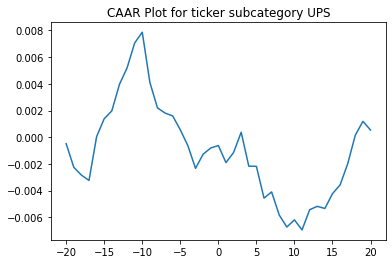

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000487 -0.000487  0.011716 -0.367175  0.714495
-19 -0.001767 -0.002254  0.017180 -1.158711  0.250155
-18 -0.000587 -0.002841  0.022461 -1.117038  0.267452
-17 -0.000402 -0.003243  0.024136 -1.186632  0.239021
-16  0.003281  0.000038  0.030943  0.010926  0.991311
-15  0.001347  0.001385  0.035927  0.340469  0.734430
-14  0.000587  0.001972  0.041349  0.421206  0.674778
-13  0.001987  0.003959  0.042140  0.829660  0.409296
-12  0.001232  0.005190  0.043882  1.044656  0.299451
-11  0.001867  0.007058  0.045032  1.384209  0.170293
-10  0.000809  0.007866  0.047272  1.469670  0.145725
-9  -0.003760  0.004106  0.050292  0.721046  0.473065
-8  -0.001913  0.002193  0.051671  0.374886  0.708776
-7  -0.000386  0.001808  0.051996  0.307044  0.759638
-6  -0.000214  0.001593  0.054545  0.257981  0.797110
-5  -0.001041  0.000552  0.056271  0.086654  0.931171
-4  -0.001196 -0.000644  0.059672 -0.095346  0.924287
-3  -0.001692 -0.002336  0.0

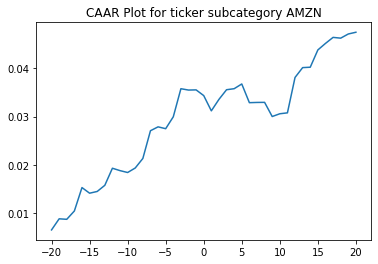

          ARR      CAAR        sd    t_stat   p_value
-20  0.006492  0.006492  0.016863  2.694803  0.009678
-19  0.002303  0.008795  0.024867  2.475875  0.016871
-18 -0.000105  0.008691  0.027573  2.206313  0.032181
-17  0.001729  0.010419  0.030621  2.381860  0.021237
-16  0.004854  0.015273  0.023068  4.634707  0.000028
-15 -0.001168  0.014106  0.029016  3.402957  0.001353
-14  0.000359  0.014465  0.036279  2.791034  0.007518
-13  0.001274  0.015739  0.038554  2.857621  0.006294
-12  0.003543  0.019282  0.040402  3.340793  0.001624
-11 -0.000497  0.018785  0.042191  3.116692  0.003086
-10 -0.000388  0.018397  0.038499  3.344957  0.001604
-9   0.000936  0.019332  0.040098  3.374863  0.001470
-8   0.001977  0.021309  0.040541  3.679322  0.000591
-7   0.005751  0.027059  0.040419  4.686280  0.000023
-6   0.000803  0.027863  0.046417  4.201912  0.000114
-5  -0.000382  0.027481  0.052283  3.679333  0.000591
-4   0.002466  0.029947  0.052834  3.967737  0.000241
-3   0.005822  0.035769  0.0

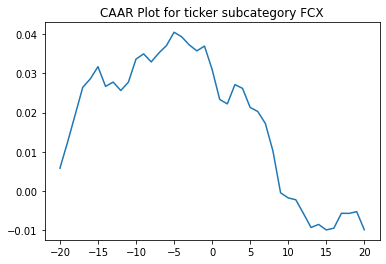

          ARR      CAAR        sd    t_stat   p_value
-20  0.005760  0.005760  0.021368  2.173341  0.033462
-19  0.006629  0.012390  0.033166  3.011796  0.003716
-18  0.007014  0.019404  0.042400  3.689523  0.000466
-17  0.007059  0.026463  0.044520  4.792237  0.000010
-16  0.002175  0.028638  0.054975  4.199841  0.000084
-15  0.003105  0.031743  0.059990  4.266122  0.000067
-14 -0.005043  0.026701  0.075531  2.850055  0.005875
-13  0.001102  0.027802  0.082535  2.715818  0.008491
-12 -0.002153  0.025649  0.085591  2.416051  0.018554
-11  0.002133  0.027782  0.091276  2.453934  0.016862
-10  0.005902  0.033684  0.095783  2.835234  0.006122
-9   0.001334  0.035018  0.103311  2.732743  0.008111
-8  -0.002053  0.032965  0.108784  2.443137  0.017330
-7   0.002277  0.035242  0.114803  2.474915  0.015986
-6   0.001888  0.037130  0.121737  2.459011  0.016646
-5   0.003422  0.040552  0.129337  2.527783  0.013958
-4  -0.001160  0.039391  0.132423  2.398235  0.019400
-3  -0.002088  0.037303  0.1

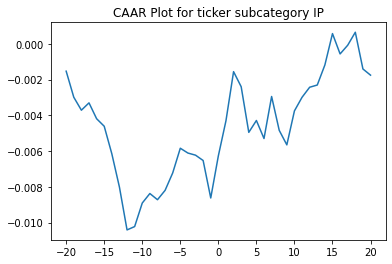

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001534 -0.001534  0.012629 -1.030420  0.306310
-19 -0.001455 -0.002989  0.018009 -1.408357  0.163389
-18 -0.000726 -0.003715  0.019666 -1.602846  0.113409
-17  0.000410 -0.003305  0.023809 -1.177702  0.242848
-16 -0.000886 -0.004191  0.028229 -1.259636  0.211926
-15 -0.000422 -0.004612  0.029679 -1.318650  0.191524
-14 -0.001539 -0.006151  0.031684 -1.647239  0.103928
-13 -0.001862 -0.008013  0.032775 -2.074603  0.041649
-12 -0.002393 -0.010407  0.039920 -2.211983  0.030187
-11  0.000187 -0.010220  0.043649 -1.986662  0.050820
-10  0.001315 -0.008904  0.043163 -1.750494  0.084353
-9   0.000532 -0.008372  0.044917 -1.581621  0.118181
-8  -0.000347 -0.008719  0.047487 -1.557941  0.123694
-7   0.000523 -0.008196  0.050563 -1.375444  0.173318
-6   0.000974 -0.007222  0.050803 -1.206310  0.231702
-5   0.001382 -0.005841  0.053154 -0.932365  0.354308
-4  -0.000269 -0.006110  0.054394 -0.953078  0.343784
-3  -0.000119 -0.006228  0.0

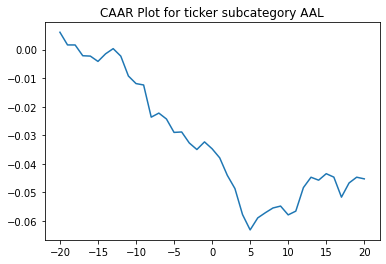

          ARR      CAAR        sd    t_stat   p_value
-20  0.006078  0.006078  0.020709  2.075483  0.043212
-19 -0.004445  0.001633  0.035285  0.327306  0.744831
-18 -0.000011  0.001622  0.038156  0.300653  0.764951
-17 -0.003772 -0.002150  0.038551 -0.394350  0.695034
-16 -0.000130 -0.002280  0.038045 -0.423847  0.673532
-15 -0.001861 -0.004141  0.045968 -0.637061  0.527051
-14  0.002661 -0.001481  0.049307 -0.212358  0.832708
-13  0.001814  0.000333  0.050983  0.046162  0.963368
-12 -0.002626 -0.002294  0.047725 -0.339820  0.735445
-11 -0.006958 -0.009251  0.052067 -1.256384  0.214934
-10 -0.002653 -0.011904  0.052079 -1.616285  0.112454
-9  -0.000492 -0.012396  0.058092 -1.508818  0.137767
-8  -0.011272 -0.023668  0.063659 -2.628947  0.011409
-7   0.001422 -0.022246  0.060582 -2.596552  0.012395
-6  -0.002069 -0.024315  0.062280 -2.760603  0.008095
-5  -0.004697 -0.029011  0.062542 -3.280049  0.001915
-4   0.000153 -0.028858  0.066147 -3.084892  0.003343
-3  -0.003848 -0.032706  0.0

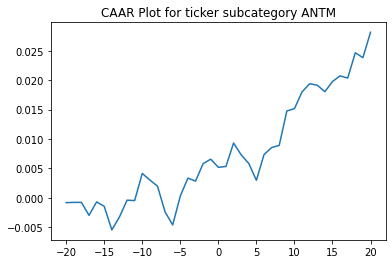

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000836 -0.000836  0.015965 -0.398884  0.691469
-19  0.000043 -0.000793  0.029569 -0.204224  0.838906
-18  0.000005 -0.000788  0.032366 -0.185326  0.853631
-17 -0.002212 -0.003000  0.038595 -0.591956  0.556221
-16  0.002283 -0.000717  0.042257 -0.129156  0.897689
-15 -0.000741 -0.001458  0.055041 -0.201744  0.840835
-14 -0.004024 -0.005482  0.061582 -0.677983  0.500526
-13  0.002196 -0.003286  0.054955 -0.455392  0.650558
-12  0.002868 -0.000418  0.050284 -0.063371  0.949692
-11 -0.000067 -0.000485  0.051321 -0.071992  0.942860
-10  0.004624  0.004139  0.052960  0.595195  0.554069
-9  -0.001132  0.003007  0.057842  0.395953  0.693618
-8  -0.001032  0.001975  0.060947  0.246807  0.805945
-7  -0.004399 -0.002424  0.065903 -0.280159  0.780370
-6  -0.002210 -0.004634  0.079937 -0.441504  0.660519
-5   0.004923  0.000289  0.072342  0.030390  0.975862
-4   0.003056  0.003345  0.073522  0.346488  0.730252
-3  -0.000517  0.002828  0.0

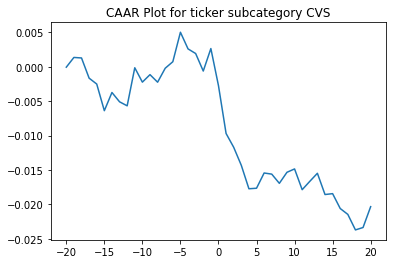

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000049 -0.000049  0.015240 -0.024610  0.980452
-19  0.001417  0.001368  0.018394  0.566317  0.573401
-18 -0.000076  0.001292  0.026706  0.368381  0.713954
-17 -0.002939 -0.001648  0.032832 -0.382201  0.703733
-16 -0.000854 -0.002502  0.033986 -0.560645  0.577237
-15 -0.003877 -0.006379  0.037291 -1.302806  0.197880
-14  0.002648 -0.003732  0.040049 -0.709610  0.480839
-13 -0.001356 -0.005088  0.043297 -0.894932  0.374587
-12 -0.000583 -0.005671  0.042456 -1.017312  0.313304
-11  0.005537 -0.000134  0.044042 -0.023199  0.981573
-10 -0.002090 -0.002224  0.043109 -0.392940  0.695830
-9   0.001089 -0.001136  0.042930 -0.201446  0.841067
-8  -0.001099 -0.002234  0.044006 -0.386641  0.700462
-7   0.002031 -0.000203  0.043416 -0.035656  0.971681
-6   0.000948  0.000744  0.041950  0.135128  0.892987
-5   0.004289  0.005034  0.043325  0.884853  0.379954
-4  -0.002424  0.002610  0.052087  0.381627  0.704157
-3  -0.000671  0.001939  0.0

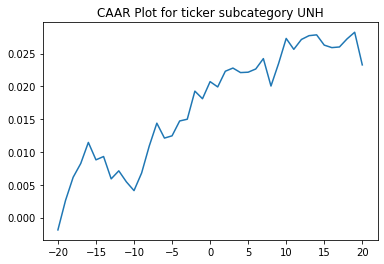

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001871 -0.001871  0.013757 -0.980912  0.331267
-19  0.004496  0.002625  0.012916  1.465344  0.148965
-18  0.003524  0.006148  0.026297  1.685991  0.097907
-17  0.002107  0.008256  0.039615  1.502789  0.139061
-16  0.003208  0.011464  0.036814  2.245490  0.029099
-15 -0.002654  0.008809  0.043672  1.454572  0.151915
-14  0.000507  0.009316  0.047233  1.422339  0.161016
-13 -0.003405  0.005911  0.047994  0.888111  0.378651
-12  0.001224  0.007135  0.048899  1.052145  0.297693
-11 -0.001684  0.005451  0.048765  0.806014  0.423977
-10 -0.001332  0.004119  0.054212  0.547919  0.586138
-9   0.002684  0.006803  0.057462  0.853762  0.397230
-8   0.004101  0.010905  0.058866  1.335823  0.187538
-7   0.003492  0.014397  0.054748  1.896252  0.063598
-6  -0.002270  0.012127  0.059451  1.470881  0.147467
-5   0.000342  0.012469  0.057925  1.552221  0.126794
-4   0.002267  0.014735  0.065795  1.614974  0.112487
-3   0.000265  0.015000  0.0

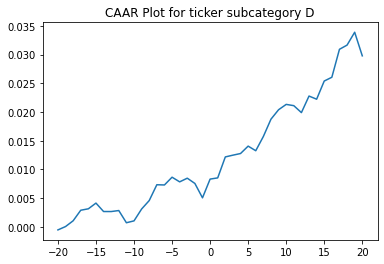

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000540 -0.000540  0.016192 -0.228730  0.820093
-19  0.000585  0.000045  0.009948  0.030797  0.975565
-18  0.001004  0.001049  0.014080  0.510790  0.611941
-17  0.001837  0.002886  0.017714  1.117028  0.269783
-16  0.000251  0.003137  0.017847  1.204948  0.234386
-15  0.000993  0.004130  0.021607  1.310387  0.196571
-14 -0.001468  0.002661  0.019305  0.945172  0.349510
-13 -0.000003  0.002658  0.016938  1.075794  0.287630
-12  0.000175  0.002833  0.019082  1.017634  0.314174
-11 -0.002124  0.000709  0.015687  0.309677  0.758205
-10  0.000324  0.001033  0.019159  0.369636  0.713350
-9   0.002067  0.003100  0.019436  1.093548  0.279847
-8   0.001472  0.004573  0.022259  1.408328  0.165757
-7   0.002752  0.007325  0.027305  1.839116  0.072358
-6  -0.000038  0.007287  0.025870  1.931209  0.059633
-5   0.001351  0.008639  0.026585  2.227737  0.030830
-4  -0.000811  0.007827  0.025361  2.115918  0.039795
-3   0.000639  0.008467  0.0

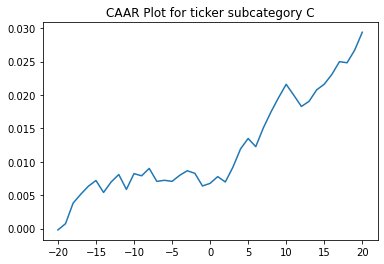

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000193 -0.000193  0.010661 -0.126502  0.899863
-19  0.000936  0.000743  0.017566  0.296028  0.768486
-18  0.003086  0.003829  0.023348  1.147972  0.256669
-17  0.001317  0.005146  0.026061  1.382280  0.173284
-16  0.001201  0.006347  0.029366  1.512978  0.136842
-15  0.000855  0.007202  0.031634  1.593689  0.117570
-14 -0.001784  0.005418  0.033683  1.125936  0.265791
-13  0.001576  0.006994  0.037164  1.317270  0.194002
-12  0.001108  0.008102  0.039953  1.419446  0.162231
-11 -0.002227  0.005874  0.040459  1.016307  0.314579
-10  0.002359  0.008233  0.039879  1.445164  0.154909
-9  -0.000322  0.007911  0.040741  1.359271  0.180413
-8   0.001103  0.009014  0.042748  1.476067  0.146456
-7  -0.001940  0.007074  0.046451  1.066105  0.291709
-6   0.000160  0.007235  0.049290  1.027475  0.309347
-5  -0.000158  0.007077  0.047426  1.044541  0.301467
-4   0.000899  0.007976  0.047091  1.185580  0.241624
-3   0.000695  0.008670  0.0

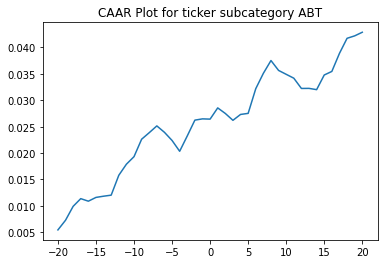

          ARR      CAAR        sd    t_stat       p_value
-20  0.005441  0.005441  0.009073  3.284886  2.668947e-03
-19  0.001831  0.007272  0.012392  3.214383  3.198644e-03
-18  0.002634  0.009906  0.015894  3.413685  1.911083e-03
-17  0.001459  0.011365  0.014516  4.288203  1.820188e-04
-16 -0.000481  0.010885  0.013556  4.397836  1.346107e-04
-15  0.000714  0.011599  0.014800  4.292450  1.799068e-04
-14  0.000230  0.011829  0.014935  4.338035  1.587117e-04
-13  0.000196  0.012025  0.018006  3.657820  1.004225e-03
-12  0.003764  0.015789  0.019852  4.356298  1.509306e-04
-11  0.002100  0.017889  0.020480  4.784182  4.620286e-05
-10  0.001430  0.019318  0.028429  3.721832  8.466460e-04
-9   0.003305  0.022623  0.027859  4.447727  1.173043e-04
-8   0.001238  0.023861  0.027409  4.768069  4.831629e-05
-7   0.001285  0.025145  0.028022  4.915009  3.212531e-05
-6  -0.001216  0.023930  0.027098  4.836719  3.993106e-05
-5  -0.001541  0.022389  0.027500  4.459192  1.136499e-04
-4  -0.002049 

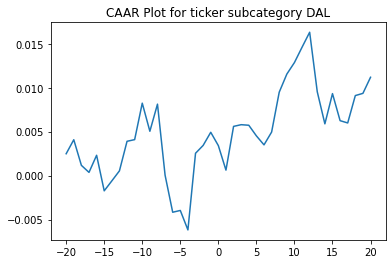

          ARR      CAAR        sd    t_stat   p_value
-20  0.002485  0.002485  0.019824  0.840818  0.404996
-19  0.001594  0.004079  0.022101  1.238109  0.222241
-18 -0.002914  0.001165  0.021125  0.369875  0.713250
-17 -0.000802  0.000363  0.049366  0.049350  0.960864
-16  0.001947  0.002310  0.068590  0.225927  0.822304
-15 -0.004046 -0.001736  0.064477 -0.180613  0.857501
-14  0.001129 -0.000607  0.056794 -0.071691  0.943173
-13  0.001144  0.000537  0.037594  0.095773  0.924135
-12  0.003365  0.003902  0.034180  0.765719  0.447932
-11  0.000190  0.004092  0.038857  0.706384  0.483673
-10  0.004150  0.008242  0.041576  1.329806  0.190435
-9  -0.003199  0.005043  0.045919  0.736784  0.465164
-8   0.003086  0.008130  0.049288  1.106460  0.274540
-7  -0.008087  0.000043  0.059308  0.004876  0.996131
-6  -0.004217 -0.004174  0.067740 -0.413310  0.681387
-5   0.000203 -0.003970  0.071256 -0.373783  0.710361
-4  -0.002215 -0.006185  0.077834 -0.533104  0.596644
-3   0.008724  0.002539  0.0

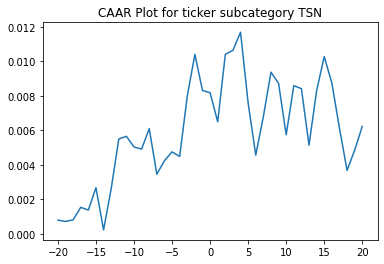

          ARR      CAAR        sd    t_stat   p_value
-20  0.000800  0.000800  0.011218  0.467684  0.642428
-19 -0.000071  0.000729  0.016769  0.284930  0.777098
-18  0.000091  0.000820  0.023622  0.227650  0.821023
-17  0.000725  0.001545  0.025993  0.389736  0.698701
-16 -0.000158  0.001387  0.027888  0.326170  0.745916
-15  0.001294  0.002681  0.034471  0.510014  0.612712
-14 -0.002444  0.000237  0.038300  0.040609  0.967800
-13  0.002383  0.002620  0.038996  0.440537  0.661808
-12  0.002882  0.005502  0.038560  0.935626  0.354814
-11  0.000157  0.005659  0.041623  0.891495  0.377743
-10 -0.000621  0.005038  0.044571  0.741222  0.462683
-9  -0.000121  0.004917  0.044244  0.728788  0.470176
-8   0.001187  0.006104  0.049456  0.809378  0.422860
-7  -0.002643  0.003461  0.055403  0.409682  0.684121
-6   0.000786  0.004247  0.054770  0.508508  0.613758
-5   0.000508  0.004755  0.055458  0.562276  0.576917
-4  -0.000265  0.004490  0.055767  0.527971  0.600298
-3   0.003493  0.007983  0.0

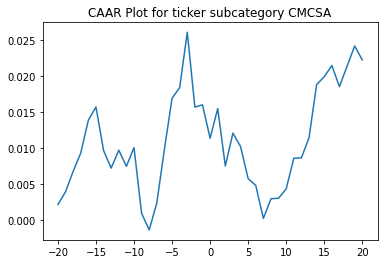

          ARR      CAAR        sd    t_stat   p_value
-20  0.002189  0.002189  0.014433  0.661060  0.516947
-19  0.001764  0.003953  0.018582  0.927261  0.366059
-18  0.002844  0.006797  0.012524  2.365634  0.029426
-17  0.002551  0.009348  0.016342  2.493464  0.022613
-16  0.004573  0.013921  0.022250  2.727212  0.013828
-15  0.001829  0.015750  0.028432  2.414669  0.026613
-14 -0.006051  0.009699  0.030375  1.391882  0.180920
-13 -0.002442  0.007257  0.031869  0.992612  0.334056
-12  0.002494  0.009751  0.027243  1.560120  0.136141
-11 -0.002248  0.007503  0.030292  1.079659  0.294549
-10  0.002602  0.010105  0.031064  1.417931  0.173291
-9  -0.009154  0.000951  0.037722  0.109930  0.913682
-8  -0.002293 -0.001341  0.036450 -0.160410  0.874345
-7   0.003768  0.002427  0.040166  0.263337  0.795282
-6   0.007476  0.009902  0.042758  1.009462  0.326131
-5   0.007050  0.016953  0.043246  1.708690  0.104694
-4   0.001493  0.018446  0.055058  1.460357  0.161427
-3   0.007697  0.026143  0.0

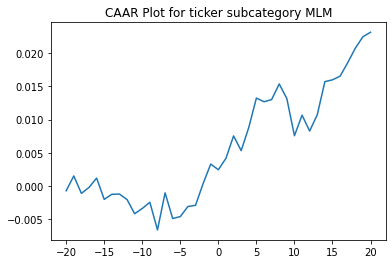

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000700 -0.000700  0.014594 -0.295852  0.768997
-19  0.002222  0.001522  0.024113  0.388983  0.699518
-18 -0.002616 -0.001094  0.024624 -0.273982  0.785622
-17  0.000886 -0.000208  0.026713 -0.048068  0.961921
-16  0.001412  0.001203  0.027240  0.272301  0.786905
-15 -0.003204 -0.002000  0.027419 -0.449693  0.655556
-14  0.000764 -0.001236  0.028949 -0.263232  0.793832
-13  0.000036 -0.001200  0.030078 -0.245983  0.807055
-12 -0.000826 -0.002026  0.033256 -0.375572  0.709380
-11 -0.002134 -0.004160  0.036859 -0.695754  0.490930
-10  0.000794 -0.003367  0.036165 -0.573854  0.569539
-9   0.000928 -0.002439  0.034353 -0.437591  0.664227
-8  -0.004155 -0.006593  0.033394 -1.217104  0.231271
-7   0.005569 -0.001024  0.033628 -0.187720  0.852122
-6  -0.003854 -0.004878  0.034459 -0.872613  0.388502
-5   0.000289 -0.004589  0.031634 -0.894325  0.376929
-4   0.001516 -0.003073  0.032122 -0.589814  0.558900
-3   0.000181 -0.002893  0.0

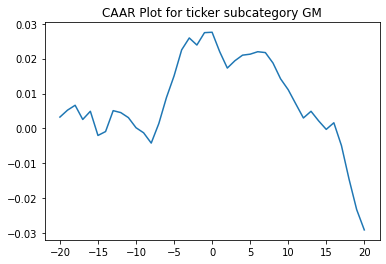

          ARR      CAAR        sd    t_stat   p_value
-20  0.003237  0.003237  0.022014  0.623811  0.541033
-19  0.001989  0.005226  0.032015  0.692571  0.497931
-18  0.001398  0.006624  0.032619  0.861552  0.400924
-17 -0.004071  0.002553  0.032201  0.336414  0.740675
-16  0.002350  0.004904  0.041431  0.502139  0.622011
-15 -0.006940 -0.002036  0.048713 -0.177331  0.861344
-14  0.001118 -0.000918  0.054030 -0.072090  0.943371
-13  0.005997  0.005079  0.055309  0.389603  0.701668
-12 -0.000558  0.004521  0.063704  0.301066  0.767015
-11 -0.001440  0.003081  0.071607  0.182537  0.857320
-10 -0.002897  0.000184  0.075014  0.010409  0.991816
-9  -0.001460 -0.001276  0.079973 -0.067695  0.946818
-8  -0.002951 -0.004227  0.077080 -0.232686  0.818784
-7   0.005620  0.001393  0.077412  0.076343  0.940037
-6   0.007442  0.008835  0.075688  0.495245  0.626767
-5   0.006205  0.015040  0.081888  0.779232  0.446556
-4   0.007479  0.022519  0.081310  1.174988  0.256195
-3   0.003415  0.025934  0.0

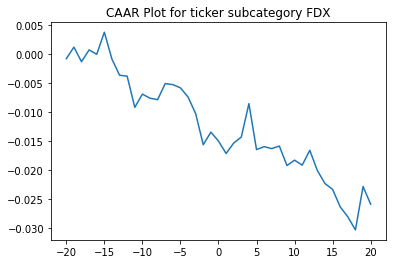

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000819 -0.000819  0.013186 -0.372747  0.711584
-19  0.001991  0.001172  0.015750  0.446478  0.658002
-18 -0.002506 -0.001334  0.020947 -0.382132  0.704674
-17  0.002035  0.000701  0.033470  0.125661  0.900719
-16 -0.000757 -0.000056  0.040171 -0.008369  0.993370
-15  0.003793  0.003737  0.042292  0.530149  0.599356
-14 -0.004630 -0.000893  0.052569 -0.101923  0.919400
-13 -0.002761 -0.003654  0.066295 -0.330730  0.742820
-12 -0.000173 -0.003827  0.055711 -0.412138  0.682752
-11 -0.005367 -0.009194  0.073976 -0.745696  0.460830
-10  0.002279 -0.006915  0.070572 -0.587919  0.560361
-9  -0.000698 -0.007613  0.065270 -0.699805  0.488674
-8  -0.000255 -0.007867  0.060364 -0.781984  0.439482
-7   0.002766 -0.005101  0.062910 -0.486505  0.629642
-6  -0.000179 -0.005280  0.066219 -0.478405  0.635337
-5  -0.000550 -0.005830  0.063233 -0.553183  0.583655
-4  -0.001583 -0.007412  0.067300 -0.660837  0.513043
-3  -0.002852 -0.010265  0.0

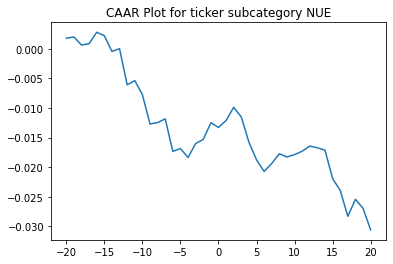

          ARR      CAAR        sd    t_stat   p_value
-20  0.001782  0.001782  0.021836  0.475821  0.637337
-19  0.000231  0.002013  0.024664  0.475873  0.637300
-18 -0.001376  0.000637  0.024106  0.154048  0.878510
-17  0.000227  0.000864  0.022830  0.220669  0.826710
-16  0.001939  0.002803  0.035787  0.456738  0.650852
-15 -0.000588  0.002215  0.034778  0.371337  0.712760
-14 -0.002656 -0.000441  0.033591 -0.076631  0.939380
-13  0.000470  0.000029  0.040208  0.004182  0.996689
-12 -0.006109 -0.006080  0.048657 -0.728661  0.471349
-11  0.000703 -0.005378  0.046986 -0.667346  0.509191
-10 -0.002354 -0.007731  0.049421 -0.912187  0.368286
-9  -0.004974 -0.012706  0.050246 -1.474481  0.149829
-8   0.000234 -0.012472  0.052053 -1.397083  0.171713
-7   0.000639 -0.011833  0.051346 -1.343752  0.188196
-6  -0.005511 -0.017344  0.055416 -1.824921  0.077077
-5   0.000490 -0.016853  0.053778 -1.827324  0.076706
-4  -0.001515 -0.018368  0.056354 -1.900500  0.066133
-3   0.002356 -0.016011  0.0

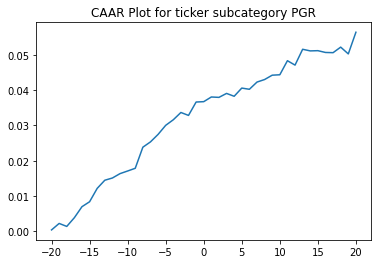

          ARR      CAAR        sd    t_stat   p_value
-20  0.000408  0.000408  0.014781  0.160994  0.873080
-19  0.001834  0.002242  0.021101  0.619610  0.539770
-18 -0.000845  0.001397  0.023674  0.344115  0.732943
-17  0.002474  0.003871  0.029284  0.770765  0.446330
-16  0.003112  0.006983  0.026519  1.535409  0.134217
-15  0.001397  0.008380  0.030752  1.588998  0.121597
-14  0.003782  0.012163  0.027959  2.536569  0.016108
-13  0.002305  0.014467  0.032945  2.560576  0.015211
-12  0.000634  0.015101  0.040361  2.181618  0.036364
-11  0.001236  0.016337  0.035179  2.707820  0.010646
-10  0.000745  0.017081  0.043643  2.282154  0.029059
-9   0.000767  0.017848  0.041685  2.496575  0.017709
-8   0.005966  0.023814  0.039138  3.547816  0.001189
-7   0.001503  0.025316  0.043236  3.414216  0.001711
-6   0.002119  0.027435  0.043724  3.658653  0.000876
-5   0.002565  0.030000  0.045331  3.858910  0.000501
-4   0.001576  0.031576  0.048621  3.786809  0.000614
-3   0.002064  0.033640  0.0

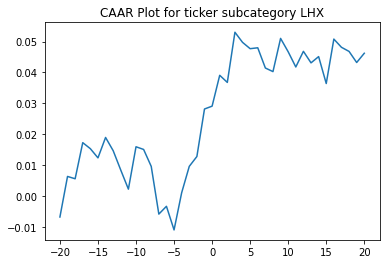

          ARR      CAAR        sd    t_stat   p_value
-20 -0.006814 -0.006814  0.008177 -1.178503  0.447953
-19  0.013135  0.006320  0.027610  0.323745  0.800677
-18 -0.000756  0.005565  0.028921  0.272114  0.830862
-17  0.011696  0.017261  0.036553  0.667823  0.625157
-16 -0.001954  0.015307  0.015393  1.406333  0.393505
-15 -0.002975  0.012332  0.034459  0.506121  0.701723
-14  0.006611  0.018944  0.061149  0.438114  0.737123
-13 -0.004289  0.014655  0.061095  0.339231  0.791794
-12 -0.006299  0.008356  0.057078  0.207035  0.870034
-11 -0.006151  0.002205  0.034277  0.090962  0.942251
-10  0.013726  0.015931  0.046282  0.486778  0.711602
-9  -0.000870  0.015060  0.059763  0.356389  0.782050
-8  -0.005481  0.009580  0.068653  0.197334  0.875967
-7  -0.015452 -0.005873  0.049781 -0.166840  0.894756
-6   0.002527 -0.003346  0.042209 -0.112110  0.928926
-5  -0.007650 -0.010996  0.047686 -0.326120  0.799309
-4   0.012038  0.001041  0.070355  0.020931  0.986677
-3   0.008542  0.009583  0.0

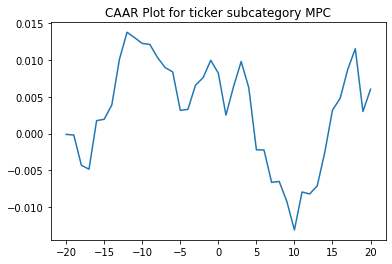

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000114 -0.000114  0.016191 -0.040300  0.968105
-19 -0.000086 -0.000200  0.021444 -0.053453  0.957703
-18 -0.004118 -0.004318  0.022038 -1.125422  0.268781
-17 -0.000531 -0.004848  0.032420 -0.859103  0.396674
-16  0.006603  0.001755  0.036353  0.277255  0.783368
-15  0.000192  0.001946  0.039496  0.283093  0.778929
-14  0.001947  0.003893  0.043804  0.510530  0.613184
-13  0.006214  0.010107  0.042772  1.357466  0.184130
-12  0.003678  0.013785  0.037352  2.120031  0.041852
-11 -0.000741  0.013044  0.041362  1.811540  0.079453
-10 -0.000783  0.012260  0.048081  1.464823  0.152726
-9  -0.000141  0.012119  0.045586  1.527205  0.136535
-8  -0.001765  0.010354  0.045477  1.307886  0.200230
-7  -0.001366  0.008988  0.049185  1.049744  0.301700
-6  -0.000604  0.008384  0.047819  1.007238  0.321377
-5  -0.005232  0.003153  0.044264  0.409138  0.685164
-4   0.000140  0.003292  0.045010  0.420204  0.677145
-3   0.003290  0.006582  0.0

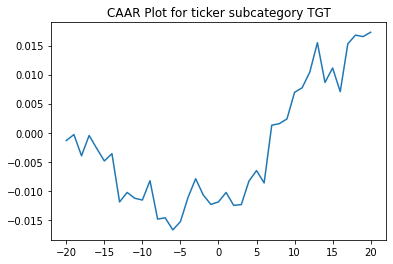

          ARR      CAAR        sd    t_stat   p_value
-20 -0.001355 -0.001355  0.009865 -0.777248  0.442903
-19  0.001028 -0.000328  0.015545 -0.119235  0.905859
-18 -0.003648 -0.003975  0.029091 -0.773042  0.445352
-17  0.003483 -0.000492  0.037004 -0.075243  0.940505
-16 -0.002217 -0.002709  0.039557 -0.387466  0.701059
-15 -0.002164 -0.004873  0.049388 -0.558195  0.580721
-14  0.001260 -0.003614  0.051243 -0.398926  0.692683
-13 -0.008317 -0.011931  0.067452 -1.000564  0.324784
-12  0.001635 -0.010295  0.068104 -0.855168  0.399019
-11 -0.001005 -0.011300  0.075107 -0.851121  0.401229
-10 -0.000304 -0.011605  0.078108 -0.840439  0.407098
-9   0.003336 -0.008268  0.075954 -0.615806  0.542518
-8  -0.006611 -0.014879  0.075644 -1.112704  0.274390
-7   0.000210 -0.014669  0.074422 -1.115006  0.273417
-6  -0.002082 -0.016751  0.078379 -1.208979  0.235811
-5   0.001433 -0.015318  0.076813 -1.128080  0.267942
-4   0.004167 -0.011151  0.090527 -0.696801  0.491120
-3   0.003214 -0.007937  0.0

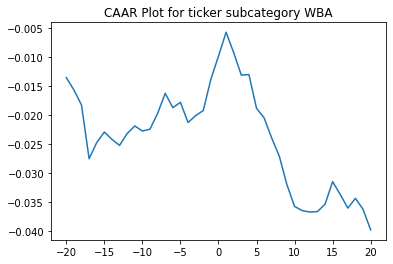

          ARR      CAAR        sd    t_stat   p_value
-20 -0.013534 -0.013534  0.024331 -2.609077  0.016387
-19 -0.002127 -0.015661  0.031577 -2.326267  0.030096
-18 -0.002612 -0.018273  0.033631 -2.548469  0.018706
-17 -0.009237 -0.027510  0.029321 -4.400668  0.000249
-16  0.002793 -0.024717  0.030448 -3.807500  0.001028
-15  0.001807 -0.022910  0.028679 -3.746906  0.001188
-14 -0.001264 -0.024174  0.026309 -4.309812  0.000310
-13 -0.001033 -0.025207  0.029303 -4.034811  0.000598
-12  0.002042 -0.023165  0.037629 -2.887442  0.008812
-11  0.001297 -0.021868  0.038710 -2.649684  0.014987
-10 -0.000856 -0.022724  0.035954 -2.964534  0.007397
-9   0.000303 -0.022422  0.035584 -2.955507  0.007550
-8   0.002720 -0.019701  0.039972 -2.311790  0.031026
-7   0.003453 -0.016248  0.045041 -1.692008  0.105431
-6  -0.002456 -0.018704  0.049094 -1.786970  0.088387
-5   0.000902 -0.017802  0.046560 -1.793366  0.087330
-4  -0.003467 -0.021269  0.047187 -2.114181  0.046632
-3   0.001181 -0.020088  0.0

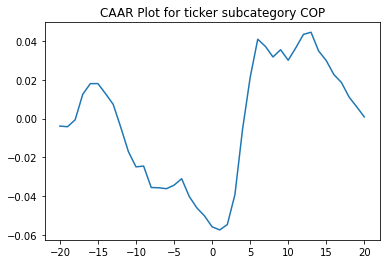

          ARR      CAAR        sd     t_stat   p_value
-20 -0.003887 -0.003887  0.015136  -0.679455  0.522184
-19 -0.000323 -0.004210  0.010496  -1.061388  0.329357
-18  0.003550 -0.000661  0.018178  -0.096153  0.926531
-17  0.013156  0.012496  0.024583   1.344892  0.227267
-16  0.005488  0.017984  0.024426   1.948029  0.099330
-15 -0.000003  0.017982  0.011866   4.009413  0.007043
-14 -0.005201  0.012780  0.012995   2.601937  0.040557
-13 -0.005464  0.007316  0.014145   1.368420  0.220206
-12 -0.011860 -0.004544  0.019816  -0.606708  0.566278
-11 -0.012484 -0.017028  0.011738  -3.838325  0.008576
-10 -0.007842 -0.024870  0.031658  -2.078493  0.082907
-9   0.000385 -0.024486  0.032871  -1.970841  0.096238
-8  -0.011019 -0.035505  0.036545  -2.570436  0.042310
-7  -0.000149 -0.035654  0.034253  -2.753993  0.033116
-6  -0.000468 -0.036122  0.038624  -2.474423  0.048168
-5   0.001812 -0.034310  0.028604  -3.173627  0.019230
-4   0.003323 -0.030987  0.037580  -2.181579  0.071905
-3  -0.009

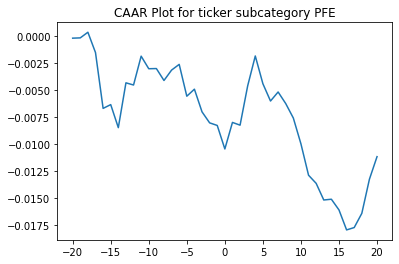

          ARR      CAAR        sd    t_stat   p_value
-20 -0.000212 -0.000212  0.010535 -0.110264  0.912959
-19  0.000027 -0.000185  0.015910 -0.063595  0.949729
-18  0.000520  0.000335  0.020830  0.088071  0.930425
-17 -0.001876 -0.001541  0.019866 -0.424940  0.674017
-16 -0.005154 -0.006695  0.023660 -1.549956  0.131998
-15  0.000349 -0.006347  0.028298 -1.228394  0.229175
-14 -0.002128 -0.008474  0.029687 -1.563482  0.128787
-13  0.004139 -0.004336  0.028251 -0.840578  0.407462
-12 -0.000201 -0.004536  0.027503 -0.903421  0.373746
-11  0.002663 -0.001873  0.026274 -0.390495  0.699024
-10 -0.001161 -0.003035  0.029542 -0.562620  0.578018
-9   0.000017 -0.003017  0.030497 -0.541889  0.592035
-8  -0.001102 -0.004119  0.031646 -0.712967  0.481564
-7   0.000961 -0.003159  0.028889 -0.598896  0.553892
-6   0.000527 -0.002632  0.029162 -0.494300  0.624818
-5  -0.002939 -0.005570  0.031393 -0.971909  0.339133
-4   0.000649 -0.004922  0.035859 -0.751762  0.458252
-3  -0.002093 -0.007015  0.0

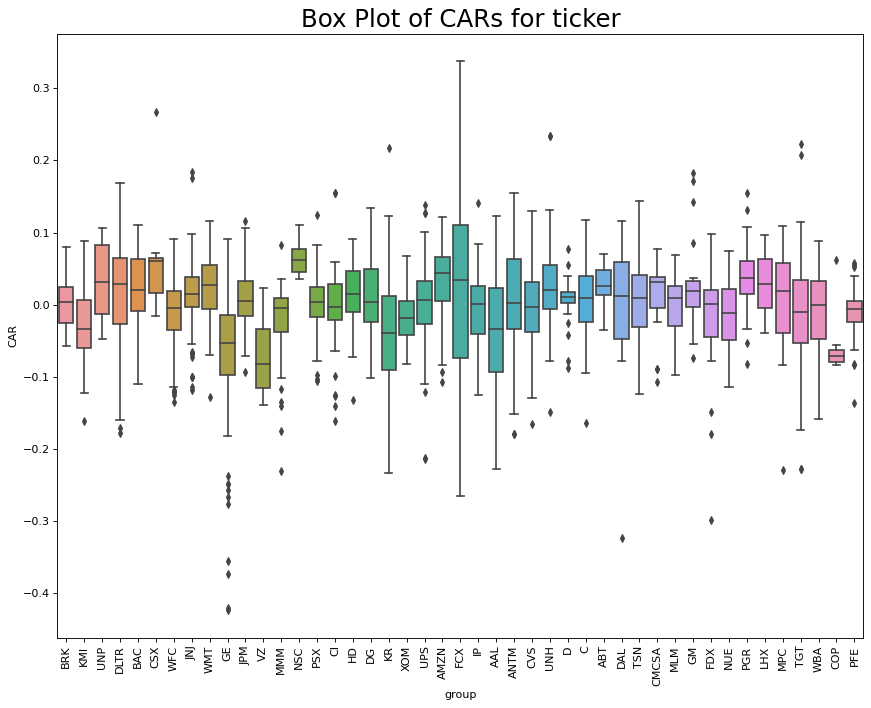

In [ ]:
es_win = 200
ev_win = [-20,20]
end_time = 20
a = CAAR_by_category(df, events, 'ticker',\
                     cat_name='Different tickers', cat_members=ticker_lst,\
                     es_win_=es_win, ev_win_=ev_win, CAAR_period=end_time, plot_type=False, gap=0 ) #Remember that CAAR_period=20 means at time 0

#overlapping events

In [ ]:
def create_chalendar_AR(df, events, group, group_lst):
  for g in group_lst:
    desired_events = events[events.group == g]
    n = desired_events.shape[0]
    AR_mat = df[df.date > '2017-01-01'].date
    for eve in range(len(desired_events.date)):
      

array([[ 0.005, -0.005],
       [-0.005,  0.005]])

In [ ]:
def AR_w_chalendar(returns, events, es_win, ev_win, minNA=100, gap_=0):
  for ticker, ev_date in zip(events.ticker, events.date):
    ev_date = str(ev_date)
    X = np.array(get_estwin_returns(returns, timestamp_convert(ev_date), ticker, es_win,ev_win[0], gap=gap_)[ticker], dtype=float)
    Y = np.array(get_estwin_returns(returns, timestamp_convert(ev_date), 'SPY', es_win,ev_win[0], gap=gap_)['SPY'], dtype=float)
    try:
      if check_win_NaN(pd.Series(X)) and check_win_NaN(pd.Series(Y)):
        alpha, beta = est_ols_params(X,Y)
        #print((alpha, beta))
        ev_X = get_evwin_returns(returns, ev_date, ticker, ev_win[1], ev_win[0])[ticker]
        ev_date = get_evwin_returns(returns, ev_date, ticker, ev_win[1], ev_win[0])[ticker]
        ev_Y = get_evwin_returns(returns, ev_date, 'SPY', ev_win[1], ev_win[0])['SPY']
        print(get_evwin_returns(returns, ev_date, ticker, ev_win[1], ev_win[0])['date'])
        #print((ev_X, ev_Y))
        if ticker not in AR.columns:
          AR[ticker] = cal_AR(ev_X, ev_Y, alpha, beta)
        else:
          if f'{ticker}_{ev_date}' not in AR.columns:
            AR[f'{ticker}_{ev_date}'] = cal_AR(ev_X, ev_Y, alpha, beta)
          else:
            AR[f'{ticker}_{ev_date}_2'] = cal_AR(ev_X, ev_Y, alpha, beta)
      else:
        if pd.Series(X).isnull().sum > minNA and pd.Series(Y).isnull().sum > minNA:
          X = np.array(pd.Series(X)[pd.Series(X).notna()])
          Y = np.array(pd.Series(Y)[pd.Series(X).notna()])
          alpha, beta = est_ols_params(X,Y)
          #print((alpha, beta))
          ev_X = get_evwin_returns(returns, ev_date, ticker, ev_win[1], ev_win[0])[ticker]
          ev_Y = get_evwin_returns(returns, ev_date, 'SPY', ev_win[1], ev_win[0])['SPY']
          #print((ev_X, ev_Y))
          if ticker not in AR.columns:
            AR[ticker] = cal_AR(ev_X, ev_Y, alpha, beta)
          else:
            if f'{ticker}_{ev_date}' not in AR.columns:
              AR[f'{ticker}_{ev_date}'] = cal_AR(ev_X, ev_Y, alpha, beta)
            else:
              AR[f'{ticker}_{ev_date}_2'] = cal_AR(ev_X, ev_Y, alpha, beta)
    except:
      print(f'Something is wrong with {ticker} in {ev_date}')
  AR.index = AR.period
  AR = AR.drop(columns=['period'])
  return AR

In [ ]:
events.iloc[1,:]

ticker                                                FCX
date                                  2020-01-08 00:00:00
industry                                           mining
major_industry                        mining and minerals
govt_level                                        federal
primary_offense      workplace safety or health violation
secondary_offense                        mining violation
offense_group                     safety-related offenses
civil_criminal                                      civil
penalty                                              9335
agency_code1                                         MSHA
Name: 1, dtype: object

In [ ]:
AR_w_chalendar(df, events.iloc[[151,152],:], 200, [-1,1], minNA=100, gap_=0)


Something is wrong with FDX in 1100    0.108538
1101   -0.036916
1102     0.01934
Name: FDX, dtype: object
Something is wrong with AIZ in 1082    0.01829
1083   -0.01699
1084    0.03358
Name: AIZ, dtype: object


""
period
2017-01-03
2017-01-04
2017-01-05
2017-01-06
2017-01-09
...
2020-12-24
2020-12-28
2020-12-29


In [ ]:
es_win = 100
ev_win = [-20,20]
desired_events = events[events.major_industry == 'retailing']
n = desired_events.shape[0]
AR_mat = df[df.date > '2017-01-01'].date
#for eve in range(len(desired_events.date)):
AR_vec(df, desired_events, es_win, ev_win, minNA=100, gap_=0)

,DLTR,DG,AMZN,AZO,DLTR_2020-02-24 00:00:00,CVS,ORLY,DLTR_2020-02-03 00:00:00,WMT,HD,DG_2020-01-28 00:00:00,WBA,M,AAP,DG_2020-01-10 00:00:00,DLTR_2020-01-08 00:00:00,DLTR_2020-01-07 00:00:00,DLTR_2020-01-07 00:00:00_2,ULTA,WBA_2020-02-03 00:00:00,WMT_2020-04-29 00:00:00,CVS_2020-05-13 00:00:00,TGT,KSS,AMZN_2020-02-13 00:00:00,CVS_2020-02-21 00:00:00,CVS_2020-04-06 00:00:00,CVS_2020-01-23 00:00:00,CVS_2020-03-18 00:00:00,CVS_2020-06-12 00:00:00,WMT_2019-09-16 00:00:00,DLTR_2019-12-27 00:00:00,DLTR_2019-12-18 00:00:00,DLTR_2019-12-13 00:00:00,DG_2019-12-10 00:00:00,TJX,TJX_2019-12-05 00:00:00,DLTR_2019-11-26 00:00:00,DLTR_2019-11-25 00:00:00,DLTR_2019-11-25 00:00:00_2,...,AAP_2017-12-22 00:00:00,AAP_2017-02-01 00:00:00,HD_2017-10-10 00:00:00,CVS_2017-06-05 00:00:00,TGT_2017-05-23 00:00:00,TGT_2017-05-23 00:00:00_2,WBA_2017-01-19 00:00:00_2,WBA_2017-04-20 00:00:00_2,CVS_2017-12-27 00:00:00,TSCO_2017-06-28 00:00:00,DG_2017-04-17 00:00:00,WMT_2017-02-01 00:00:00,AMZN_2017-01-12 00:00:00,KR_2017-11-30 00:00:00,WMT_2017-08-04 00:00:00,AAP_2017-04-04 00:00:00,AAP_2017-04-03 00:00:00,AAP_2017-04-03 00:00:00_2,AAP_2017-04-02 00:00:00,AAP_2017-04-02 00:00:00_2,LOW_2017-03-18 00:00:00,DLTR_2017-03-17 00:00:00_2,AMZN_2017-02-19 00:00:00,AMZN_2017-02-19 00:00:00_2,AMZN_2017-02-18 00:00:00,AMZN_2017-02-18 00:00:00_2,ULTA_2017-01-19 00:00:00,KR_2017-11-17 00:00:00,LOW_2017-07-06 00:00:00,CVS_2017-10-25 00:00:00,CVS_2017-10-31 00:00:00,CVS_2017-12-26 00:00:00,CVS_2017-06-16 00:00:00,CVS_2017-07-13 00:00:00,CVS_2017-10-12 00:00:00,CVS_2017-01-05 00:00:00,CVS_2017-05-09 00:00:00,CVS_2017-08-18 00:00:00,CVS_2017-11-29 00:00:00,WMT_2017-05-26 00:00:00
period,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-20,0.0259357,-0.00318052,-0.00289848,0.00073509,-0.00338967,-0.0189568,-0.00102064,-0.00842522,-0.0036273,0.00291181,0.00795787,-0.0120927,0.0245945,0.0286292,7.24507e-05,0.0100894,0.014345,0.014345,0.013227,0.000700471,-0.00315505,0.000221359,-0.0116323,-0.0324677,-0.00563699,-0.00746592,-0.0100769,-0.00272409,-0.00504364,0.0117083,-0.00278452,-0.0245014,-0.0204797,0.00256722,-0.00517231,-0.00655177,-0.00655177,-0.00758962,-0.011329,-0.011329,...,-0.00504714,0.00747635,0.00874446,-0.00177546,0.00455874,0.00455874,-0.000988395,-0.0034342,0.0317346,0.00526106,-0.0127221,-0.00908587,0.0168902,0.00892084,-0.00264434,-0.0151679,-0.00765702,-0.00765702,-0.00765702,-0.00765702,0.00447638,-0.0100472,0.0119098,0.0119098,0.0119098,0.0119098,-0.00887535,0.00527938,-0.0120223,-0.00326073,0.000893975,-0.00278726,0.00305379,0.0114576,-0.00570397,0.0177007,0.00858627,-0.00199907,0.000512607,-0.00411407
-19,0.00853057,0.00185302,-0.0105076,0.00611858,0.00740237,-0.00197484,-0.012317,-0.00122653,-0.00941707,-0.00673375,0.00480959,-0.00337749,0.0302496,-0.000159157,0.00492524,-0.0182656,0.0102075,0.0102075,0.0301411,0.00721357,0.0385825,0.0296799,0.00263389,-0.0300882,0.00452032,-0.0273429,0.00237839,0.00185586,0.00201545,0.0104769,0.00348884,-0.0169892,0.00379613,-0.0012201,-0.000494277,0.00694707,0.00694707,-0.00554854,-0.00751288,-0.00751288,...,0.00651319,0.00689578,0.000146917,-0.000512517,0.0140743,0.0140743,0.00122429,-0.00143523,0.00887274,0.0158089,-0.0107734,0.00332431,-0.00511527,0.012676,-0.0281258,0.0206729,-0.0152603,-0.0152603,-0.0152603,-0.0152603,0.00492667,0.024681,0.00324479,0.00324479,0.00324479,0.00324479,0.00267649,0.0151233,-0.00257484,-0.0031968,-0.0110142,0.03176,-0.00510277,-0.00913954,0.00569193,0.0129427,0.00381006,0.000476486,0.00624768,-0.000231771
-18,0.0122748,0.000746858,-0.0143738,-0.0219729,-0.0202844,-0.00752083,-0.000504137,-0.0125738,-0.00522122,0.0129499,-0.0101696,-0.0126099,-0.028722,-0.01072,-0.00626756,-0.00152226,-0.0181429,-0.0181429,0.0239286,-0.00518711,0.0271694,-0.00758973,-0.00330346,0.0178295,-0.00892269,-0.00388544,0.00111095,-0.00149558,-0.00454521,-0.0156974,-0.0122207,-0.021359,0.00677702,0.00141586,0.00625349,-0.00222864,-0.00222864,-0.0143043,-0.00548246,-0.00548246,...,0.03

In [ ]:
events.major_industry.value_counts()

retailing                                      983
financial services                             855
diversified                                    650
railroads                                      537
oil and gas                                    346
healthcare services                            282
pipelines                                      249
pharmaceuticals                                244
telecommunications                             228
utilities and power generation                 180
miscellaneous manufacturing                    160
airlines                                       143
food products                                  139
aerospace and military contracting             130
freight and logistics                          121
paper and packaging                            109
wholesalers                                     84
mining and minerals                             83
chemicals                                       66
construction and engineering   